In [1]:
# !pip install git+https://github.com/alberanid/imdbpy
# !pip install pandas
# !pip install numpy
# !pip install matplotlib
# !pip install seaborn
# !pip install pandas_profiling --upgrade
# !pip install plotly
# ! pip install wordcloud
# ! pip install Flask

In [2]:
# Import Dataset
# Import File from Loacal Drive
# from google.colab import files
# data_to_load = files.upload()
# from google.colab import drive
# drive.mount('/content/drive')

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import collections
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import iplot, init_notebook_mode
from wordcloud import WordCloud, STOPWORDS
from pandas_profiling import ProfileReport
%matplotlib inline
warnings.filterwarnings("ignore")

In [4]:
# path = '/content/drive/MyDrive/Files/'

path = 'C:\\Users\\pawan\\OneDrive\\Desktop\\ott\\Data\\'
 
df_movies = pd.read_csv(path + 'ottmovies.csv')
 
df_movies.head()

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Seasons,Netflix,Hulu,Prime Video,Disney+,Type
0,1,Inception,2010,13+,8.8,87%,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French","Dom Cobb is a skilled thief, the absolute best...",148.0,movie,NaN,1,0,0,0,0
1,2,The Matrix,1999,16+,8.7,88%,"Lana Wachowski,Lilly Wachowski","Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...","Action,Sci-Fi",United States,English,Thomas A. Anderson is a man living two lives. ...,136.0,movie,NaN,1,0,0,0,0
2,3,Avengers: Infinity War,2018,13+,8.4,85%,"Anthony Russo,Joe Russo","Robert Downey Jr.,Chris Hemsworth,Mark Ruffalo...","Action,Adventure,Sci-Fi",United States,English,As the Avengers and their allies have continue...,149.0,movie,NaN,1,0,0,0,0
3,4,Back to the Future,1985,7+,8.5,96%,Robert Zemeckis,"Michael J. Fox,Christopher Lloyd,Lea Thompson,...","Adventure,Comedy,Sci-Fi",United States,English,"Marty McFly, a typical American teenager of th...",116.0,movie,NaN,1,0,0,0,0
4,5,"The Good, the Bad and the Ugly",1966,16+,8.8,97%,Sergio Leone,"Eli Wallach,Clint Eastwood,Lee Van Cleef,Aldo ...",Western,"Italy,Spain,West Germany,United States",Italian,Blondie (The Good) (Clint Eastwood) is a profe...,161.0,movie,NaN,1,0,1,0,0


In [5]:
# profile = ProfileReport(df_movies)
# profile

In [6]:
def data_investigate(df):
    print('No of Rows : ', df.shape[0])
    print('No of Coloums : ', df.shape[1])
    print('**'*25)
    print('Colums Names : \n', df.columns)
    print('**'*25)
    print('Datatype of Columns : \n', df.dtypes)
    print('**'*25)
    print('Missing Values : ')
    c = df.isnull().sum()
    c = c[c > 0]
    print(c)
    print('**'*25)
    print('Missing vaules %age wise :\n')
    print((100*(df.isnull().sum()/len(df.index))))
    print('**'*25)
    print('Pictorial Representation : ')
    plt.figure(figsize = (10, 10))
    sns.heatmap(df.isnull(), yticklabels = False, cbar = False)
    plt.show()

No of Rows :  16923
No of Coloums :  20
**************************************************
Colums Names : 
 Index(['ID', 'Title', 'Year', 'Age', 'IMDb', 'Rotten Tomatoes', 'Directors',
       'Cast', 'Genres', 'Country', 'Language', 'Plotline', 'Runtime', 'Kind',
       'Seasons', 'Netflix', 'Hulu', 'Prime Video', 'Disney+', 'Type'],
      dtype='object')
**************************************************
Datatype of Columns : 
 ID                   int64
Title               object
Year                 int64
Age                 object
IMDb               float64
Rotten Tomatoes     object
Directors           object
Cast                object
Genres              object
Country             object
Language            object
Plotline            object
Runtime            float64
Kind                object
Seasons            float64
Netflix              int64
Hulu                 int64
Prime Video          int64
Disney+              int64
Type                 int64
dtype: object
*************

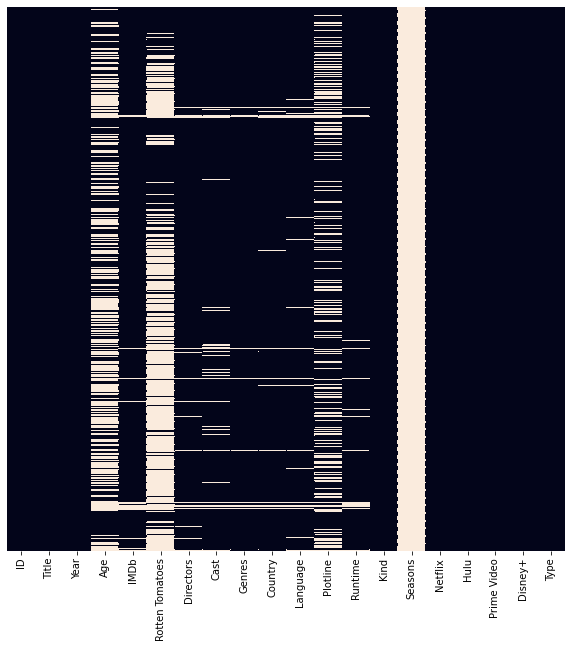

In [7]:
data_investigate(df_movies)

In [8]:
# ID
# df_movies = df_movies.drop(['ID'], axis = 1)
 
# Age
df_movies.loc[df_movies['Age'].isnull() & df_movies['Disney+'] == 1, "Age"] = '13'
# df_movies.fillna({'Age' : 18}, inplace = True)
df_movies.fillna({'Age' : 'NR'}, inplace = True)
df_movies['Age'].replace({'all': '0'}, inplace = True)
df_movies['Age'].replace({'7+': '7'}, inplace = True)
df_movies['Age'].replace({'13+': '13'}, inplace = True)
df_movies['Age'].replace({'16+': '16'}, inplace = True)
df_movies['Age'].replace({'18+': '18'}, inplace = True)
# df_movies['Age'] = df_movies['Age'].astype(int)
 
# IMDb
# df_movies.fillna({'IMDb' : df_movies['IMDb'].mean()}, inplace = True)
# df_movies.fillna({'IMDb' : df_movies['IMDb'].median()}, inplace = True)
df_movies.fillna({'IMDb' : "NA"}, inplace = True)
 
# Rotten Tomatoes
df_movies['Rotten Tomatoes'] = df_movies['Rotten Tomatoes'][df_movies['Rotten Tomatoes'].notnull()].str.replace('%', '').astype(int)
# df_movies['Rotten Tomatoes'] = df_movies['Rotten Tomatoes'][df_movies['Rotten Tomatoes'].notnull()].astype(int)
# df_movies.fillna({'Rotten Tomatoes' : df_movies['Rotten Tomatoes'].mean()}, inplace = True)
# df_movies.fillna({'Rotten Tomatoes' : df_movies['Rotten Tomatoes'].median()}, inplace = True)
# df_movies['Rotten Tomatoes'] = df_movies['Rotten Tomatoes'].astype(int)
df_movies.fillna({'Rotten Tomatoes' : "NA"}, inplace = True)
 
# Directors
# df_movies = df_movies.drop(['Directors'], axis = 1)
df_movies.fillna({'Directors' : "NA"}, inplace = True)
 
# Cast
df_movies.fillna({'Cast' : "NA"}, inplace = True)
 
# Genres
df_movies.fillna({'Genres': "NA"}, inplace = True)
 
# Country
df_movies.fillna({'Country': "NA"}, inplace = True)
 
# Language
df_movies.fillna({'Language': "NA"}, inplace = True)
 
# Plotline
df_movies.fillna({'Plotline': "NA"}, inplace = True)
 
# Runtime
# df_movies.fillna({'Runtime' : df_movies['Runtime'].mean()}, inplace = True)
# df_movies['Runtime'] = df_movies['Runtime'].astype(int)
df_movies.fillna({'Runtime' : "NA"}, inplace = True)
 
# Kind
# df_movies.fillna({'Kind': "NA"}, inplace = True)
 
# Type
# df_movies.fillna({'Type': "NA"}, inplace = True)
# df_movies = df_movies.drop(['Type'], axis = 1)
 
# Seasons
# df_movies.fillna({'Seasons': 1}, inplace = True)
# df_movies.fillna({'Seasons': "NA"}, inplace = True)
df_movies = df_movies.drop(['Seasons'], axis = 1)
# df_movies['Seasons'] = df_movies['Seasons'].astype(int)
# df_movies.fillna({'Seasons' : df_movies['Seasons'].mean()}, inplace = True)
# df_movies['Seasons'] = df_movies['Seasons'].astype(int)
 
# Service Provider
df_movies['Service Provider'] = df_movies.loc[:, ['Netflix', 'Prime Video', 'Disney+', 'Hulu']].idxmax(axis = 1)
# df_movies.drop(['Netflix','Prime Video','Disney+','Hulu'], axis = 1)

# Removing Duplicate and Missing Entries
df_movies.dropna(how = 'any', inplace = True)
df_movies.drop_duplicates(inplace = True)

No of Rows :  16923
No of Coloums :  20
**************************************************
Colums Names : 
 Index(['ID', 'Title', 'Year', 'Age', 'IMDb', 'Rotten Tomatoes', 'Directors',
       'Cast', 'Genres', 'Country', 'Language', 'Plotline', 'Runtime', 'Kind',
       'Netflix', 'Hulu', 'Prime Video', 'Disney+', 'Type',
       'Service Provider'],
      dtype='object')
**************************************************
Datatype of Columns : 
 ID                   int64
Title               object
Year                 int64
Age                 object
IMDb                object
Rotten Tomatoes     object
Directors           object
Cast                object
Genres              object
Country             object
Language            object
Plotline            object
Runtime             object
Kind                object
Netflix              int64
Hulu                 int64
Prime Video          int64
Disney+              int64
Type                 int64
Service Provider    object
dtype: obje

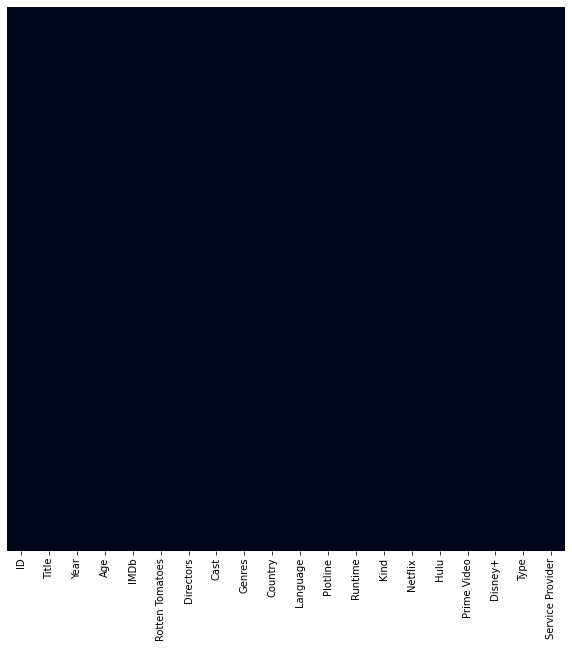

In [9]:
data_investigate(df_movies)

In [10]:
df_movies.head()

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French","Dom Cobb is a skilled thief, the absolute best...",148,movie,1,0,0,0,0,Netflix
1,2,The Matrix,1999,16,8.7,88,"Lana Wachowski,Lilly Wachowski","Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...","Action,Sci-Fi",United States,English,Thomas A. Anderson is a man living two lives. ...,136,movie,1,0,0,0,0,Netflix
2,3,Avengers: Infinity War,2018,13,8.4,85,"Anthony Russo,Joe Russo","Robert Downey Jr.,Chris Hemsworth,Mark Ruffalo...","Action,Adventure,Sci-Fi",United States,English,As the Avengers and their allies have continue...,149,movie,1,0,0,0,0,Netflix
3,4,Back to the Future,1985,7,8.5,96,Robert Zemeckis,"Michael J. Fox,Christopher Lloyd,Lea Thompson,...","Adventure,Comedy,Sci-Fi",United States,English,"Marty McFly, a typical American teenager of th...",116,movie,1,0,0,0,0,Netflix
4,5,"The Good, the Bad and the Ugly",1966,16,8.8,97,Sergio Leone,"Eli Wallach,Clint Eastwood,Lee Van Cleef,Aldo ...",Western,"Italy,Spain,West Germany,United States",Italian,Blondie (The Good) (Clint Eastwood) is a profe...,161,movie,1,0,1,0,0,Netflix


In [11]:
df_movies.describe()

,ID,Year,Netflix,Hulu,Prime Video,Disney+,Type
count,16923.000000,16923.000000,16923.000000,16923.000000,16923.000000,16923.000000,16923.0
mean,8462.000000,2003.211901,0.214915,0.062637,0.727235,0.033150,0.0
std,4885.393638,20.526532,0.410775,0.242315,0.445394,0.179034,0.0
min,1.000000,1901.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,4231.500000,2001.000000,0.000000,0.000000,0.000000,0.000000,0.0
50%,8462.000000,2012.000000,0.000000,0.000000,1.000000,0.000000,0.0
75%,12692.500000,2016.000000,0.000000,0.000000,1.000000,0.000000,0.0
max,16923.000000,2020.000000,1.000000,1.000000,1.000000,1.000000,0.0


In [12]:
df_movies.corr()

,ID,Year,Netflix,Hulu,Prime Video,Disney+,Type
ID,1.000000,-0.217816,-0.644470,-0.129926,0.469301,0.263530,NaN
Year,-0.217816,1.000000,0.256151,0.101337,-0.255578,-0.047258,NaN
Netflix,-0.644470,0.256151,1.000000,-0.118032,-0.745141,-0.089649,NaN
Hulu,-0.129926,0.101337,-0.118032,1.000000,-0.284654,-0.039693,NaN
Prime Video,0.469301,-0.255578,-0.745141,-0.284654,1.000000,-0.289008,NaN
Disney+,0.263530,-0.047258,-0.089649,-0.039693,-0.289008,1.000000,NaN
Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# df_movies.sort_values('Year', ascending = True)
# df_movies.sort_values('IMDb', ascending = False)

In [14]:
# df_movies.to_csv(path_or_buf= '/content/drive/MyDrive/Files/updated_ottmovies.csv', index = False)
 
# path = '/content/drive/MyDrive/Files/'
 
# udf_movies = pd.read_csv(path + 'updated_ottmovies.csv')
 
# udf_movies

In [15]:
# df_netflix_movies = df_movies.loc[(df_movies['Netflix'] > 0)]
# df_hulu_movies = df_movies.loc[(df_movies['Hulu'] > 0)]
# df_prime_video_movies = df_movies.loc[(df_movies['Prime Video'] > 0)]
# df_disney_movies = df_movies.loc[(df_movies['Disney+'] > 0)]

In [16]:
df_netflix_only_movies = df_movies[(df_movies['Netflix'] == 1) & (df_movies['Hulu'] == 0) & (df_movies['Prime Video'] == 0 ) & (df_movies['Disney+'] == 0)]
df_hulu_only_movies = df_movies[(df_movies['Netflix'] == 0) & (df_movies['Hulu'] == 1) & (df_movies['Prime Video'] == 0 ) & (df_movies['Disney+'] == 0)]
df_prime_video_only_movies = df_movies[(df_movies['Netflix'] == 0) & (df_movies['Hulu'] == 0) & (df_movies['Prime Video'] == 1 ) & (df_movies['Disney+'] == 0)]
df_disney_only_movies = df_movies[(df_movies['Netflix'] == 0) & (df_movies['Hulu'] == 0) & (df_movies['Prime Video'] == 0 ) & (df_movies['Disney+'] == 1)]

In [17]:
df_movies_ott = df_movies.copy()

In [18]:
# Platforms
netflix_movies_ott_count = len(df_movies_ott.loc[(df_movies_ott['Netflix'] > 0)])
hulu_movies_ott_count = len(df_movies_ott.loc[(df_movies_ott['Hulu'] > 0)])
prime_video_movies_ott_count = len(df_movies_ott.loc[(df_movies_ott['Prime Video'] > 0)])
disney_movies_ott_count = len(df_movies_ott.loc[(df_movies_ott['Disney+'] > 0)])
 
Platform = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
Count = [netflix_movies_ott_count, hulu_movies_ott_count, prime_video_movies_ott_count, disney_movies_ott_count]
 
fig = px.pie(names = Platform, values = Count, title = 'Movies Count Of Different Platforms', color_discrete_sequence = px.colors.sequential.Teal)
fig.update_traces(textposition = 'inside', textinfo = 'percent + label') 
fig.show()

In [19]:
print(f'''
      Total '{df_movies_ott['Title'].count()}' Titles are available on All Platforms, out of Which,\n
      Total '{df_movies_ott['Netflix'].sum()}' Titles are available on 'Netflix'
      Total '{df_movies_ott['Hulu'].sum()}' Titles are available on 'Hulu'
      Total '{df_movies_ott['Prime Video'].sum()}' Titles are available on 'Prime video'
      Total '{df_movies_ott['Disney+'].sum()}' Titles are available on 'Disney+'
      ''')


      Total '16923' Titles are available on All Platforms, out of Which,

      Total '3637' Titles are available on 'Netflix'
      Total '1060' Titles are available on 'Hulu'
      Total '12307' Titles are available on 'Prime video'
      Total '561' Titles are available on 'Disney+'
      


In [20]:
df_movies_ott['OTT_Count'] = df_movies_ott['Netflix'] + df_movies_ott['Hulu'] + df_movies_ott['Prime Video'] + df_movies_ott['Disney+']
 
(df_movies_ott['OTT_Count'].value_counts()/df_movies_ott.shape[0])*100

1    96.259528
2     3.687289
3     0.053182
Name: OTT_Count, dtype: float64

In [21]:
print(f'''
      Total '{df_movies_ott[df_movies_ott['OTT_Count'] == 4].shape[0]}' Titles are available on All Platforms
      Total '{df_movies_ott[df_movies_ott['OTT_Count'] == 3].shape[0]}' Titles are available on at least 3 Platforms
      Total '{df_movies_ott[df_movies_ott['OTT_Count'] == 2].shape[0]}' Titles are available on at least 2 Platforms
      Total '{df_movies_ott[df_movies_ott['OTT_Count'] == 1].shape[0]}' Titles are available on at least 1 Platforms
      ''')


      Total '0' Titles are available on All Platforms
      Total '9' Titles are available on at least 3 Platforms
      Total '624' Titles are available on at least 2 Platforms
      Total '16290' Titles are available on at least 1 Platforms
      


In [22]:
# Movies Available on All Platforms

# df_movies_ott[(df_movies_ott['Netflix'] == 1) & (df_movies_ott['Hulu'] == 1) & (df_movies_ott['Prime Video'] == 1) & (df_movies_ott['Disney+'] == 1)]
print('\nTotal ', df_movies_ott[df_movies_ott['OTT_Count'] == 4].shape[0], ' Titles are available on All Platforms\n')
movies_on_4_platforms = df_movies_ott[df_movies_ott['OTT_Count'] == 4]
movies_on_4_platforms


Total  0  Titles are available on All Platforms



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,OTT_Count


In [23]:
# Movies Available on at least 3 Platforms

print('\nTotal ', df_movies_ott[df_movies_ott['OTT_Count'] == 3].shape[0], ' Titles are available on at least 3 Platforms\n')
movies_on_3_platforms = df_movies_ott[df_movies_ott['OTT_Count'] == 3]
movies_on_3_platforms


Total  9  Titles are available on at least 3 Platforms



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,OTT_Count
144,145,The Square,2013,16,7.2,20,Ruben Östlund,"Claes Bang,Elisabeth Moss,Dominic West,Terry N...","Comedy,Drama","Sweden,Germany,France,Denmark,United States",...,Christian is the respected curator of a contem...,151,movie,1,1,1,0,0,Netflix,3
334,335,The Interview,2014,16,6.5,63,"Evan Goldberg,Seth Rogen","James Franco,Seth Rogen,Lizzy Caplan,Randall P...","Action,Adventure,Comedy",United States,...,"In the action-comedy The Interview, Dave Skyla...",112,movie,1,1,1,0,0,Netflix,3
489,490,Blame!,2017,13,6.7,93,Hiroyuki Seshita,"Takahiro Sakurai,Kana Hanazawa,Sora Amamiya,Ma...","Animation,Action,Drama,Sci-Fi,Thriller",Japan,...,"In the distant technological future, civilizat...",106,movie,1,1,1,0,0,Netflix,3
601,602,Evolution,2001,13,6.1,17,Ivan Reitman,"David Duchovny,Julianne Moore,Orlando Jones,Se...","Comedy,Sci-Fi",United States,...,When a meteorite falls to Earth two college pr...,101,movie,1,1,1,0,0,Netflix,3
1113,1114,No Game No Life: Zero,2017,13,7.5,NA,Atsuko Ishizuka,"Alexandra Bedford,Jessica Boone,Ricardo Contre...","Animation,Adventure,Comedy,Drama,Fantasy,Romance",Japan,...,The Movie following the light novel series by ...,110,movie,1,1,1,0,0,Netflix,3
1982,1983,Mother,2016,16,6.6,100,Darren Aronofsky,"Jennifer Lawrence,Javier Bardem,Ed Harris,Mich...","Drama,Horror,Mystery",United States,...,Amidst a wild flat meadow encircled by an Eden...,121,movie,1,1,1,0,0,Netflix,3
3851,3852,The Kid,2019,16,5.9,87,Vincent D'Onofrio,"Jake Schur,Leila George,Chris Pratt,Dane DeHaa...","Biography,Drama,Western",United States,...,"New Mexico Territory, 1880. Rio Cutler and his...",100,movie,0,1,1,1,0,Prime Video,3
4192,4193,Inside Out,2011,7,8.1,98,"Pete Docter,Ronnie Del Carmen","Amy Poehler,Phyllis Smith,Richard Kind,Bill Ha...","Animation,Adventure,Comedy,Drama,Family,Fantasy",United States,...,"Growing up can be a bumpy road, and it's no ex...",95,movie,0,1,1,1,0,Prime Video,3
16246,16247,Rurouni Kenshin,1996,18,7.5,NA,Keishi Ohtomo,"Takeru Satoh,Emi Takei,Yû Aoi,Munetaka Aoki,Gô...","Action,Adventure,Drama,History",Japan,...,NA,134,movie,1,1,1,0,0,Netflix,3


In [24]:
# Movies Available on at least 2 Platforms
print('\nTotal ', df_movies_ott[df_movies_ott['OTT_Count'] == 2].shape[0], ' Titles are available on at least 2 Platforms\n')
movies_on_2_platforms = df_movies_ott[df_movies_ott['OTT_Count'] == 2]
movies_on_2_platforms


Total  624  Titles are available on at least 2 Platforms



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,OTT_Count
4,5,"The Good, the Bad and the Ugly",1966,16,8.8,97,Sergio Leone,"Eli Wallach,Clint Eastwood,Lee Van Cleef,Aldo ...",Western,"Italy,Spain,West Germany,United States",...,Blondie (The Good) (Clint Eastwood) is a profe...,161,movie,1,0,1,0,0,Netflix,2
6,7,The Pianist,2002,16,8.5,95,Roman Polanski,"Adrien Brody,Emilia Fox,Michal Zebrowski,Ed St...","Biography,Drama,Music,War","United Kingdom,France,Poland,Germany,United St...",...,"In this adaptation of the autobiography ""The P...",150,movie,1,0,1,0,0,Netflix,2
11,12,3 Idiots,2009,13,8.4,100,Rajkumar Hirani,"Aamir Khan,Madhavan,Sharman Joshi,Kareena Kapo...","Comedy,Drama",India,...,Farhan Qureshi and Raju Rastogi want to re-uni...,170,movie,1,0,1,0,0,Netflix,2
15,16,Once Upon a Time in the West,1968,13,8.5,95,Sergio Leone,"Claudia Cardinale,Henry Fonda,Jason Robards,Ch...",Western,"Italy,United States",...,Jill McBain travels to the wild frontier; Utah...,165,movie,1,0,1,0,0,Netflix,2
31,32,Drive,2011,16,7.8,38,Nicolas Winding Refn,"Ryan Gosling,Carey Mulligan,Bryan Cranston,Alb...","Crime,Drama",United States,...,This action drama follows a mysterious man who...,100,movie,1,0,1,0,0,Netflix,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16555,16556,It's Alive with Brad,2018,NR,NA,NA,NA,Shep Gordon,Short,United States,...,NA,12,movie,0,1,1,0,0,Prime Video,2
16564,16565,#ThatsHarassment,2018,18,6.1,NA,Sigal Avin,"Emmy Rossum,Harry Lennix,David Schwimmer,Zazie...",Short,United States,...,NA,26,movie,0,1,1,0,0,Prime Video,2
16567,16568,Actually Me,2017,16,7.6,NA,Richard Curtis,"Bill Nighy,Gregor Fisher,Rory MacGregor,Colin ...","Comedy,Drama,Romance","United Kingdom,United States,France",...,NA,135,movie,0,1,1,0,0,Prime Video,2
16572,16573,Hello World,2016,NR,6.8,NA,Tomohiko Itô,"Haruka Fukuhara,Minami Hamabe,Takumi Kitamura,...","Animation,Comedy,Drama,Family,Romance,Sci-Fi",Japan,...,NA,97,movie,0,1,1,0,0,Prime Video,2


In [25]:
# Movies Available on at least 1 Platform
print('\nTotal ', df_movies_ott[df_movies_ott['OTT_Count'] == 1].shape[0], ' Titles are available on at least 1 Platforms\n')
movies_on_1_platforms = df_movies_ott[df_movies_ott['OTT_Count'] == 1]
movies_on_1_platforms


Total  16290  Titles are available on at least 1 Platforms



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,OTT_Count
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom",...,"Dom Cobb is a skilled thief, the absolute best...",148,movie,1,0,0,0,0,Netflix,1
1,2,The Matrix,1999,16,8.7,88,"Lana Wachowski,Lilly Wachowski","Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...","Action,Sci-Fi",United States,...,Thomas A. Anderson is a man living two lives. ...,136,movie,1,0,0,0,0,Netflix,1
2,3,Avengers: Infinity War,2018,13,8.4,85,"Anthony Russo,Joe Russo","Robert Downey Jr.,Chris Hemsworth,Mark Ruffalo...","Action,Adventure,Sci-Fi",United States,...,As the Avengers and their allies have continue...,149,movie,1,0,0,0,0,Netflix,1
3,4,Back to the Future,1985,7,8.5,96,Robert Zemeckis,"Michael J. Fox,Christopher Lloyd,Lea Thompson,...","Adventure,Comedy,Sci-Fi",United States,...,"Marty McFly, a typical American teenager of th...",116,movie,1,0,0,0,0,Netflix,1
5,6,Spider-Man: Into the Spider-Verse,2018,7,8.4,97,"Bob Persichetti,Peter Ramsey,Rodney Rothman","Shameik Moore,Jake Johnson,Hailee Steinfeld,Ma...","Animation,Action,Adventure,Family,Sci-Fi",United States,...,"Phil Lord and Christopher Miller, the creative...",117,movie,1,0,0,0,0,Netflix,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16918,16919,Pick of the Litter,2019,7,7.5,NA,"Don Hardy,Dana Nachman","Diane Meer,Terry Blosser,Janet Gearheart,Sharo...",Documentary,United States,...,Join National Geographic Explorer and photogra...,80,movie,0,0,0,1,0,Disney+,1
16919,16920,The Lodge,2016,16,6.1,NA,"Severin Fiala,Veronika Franz","Riley Keough,Jaeden Martell,Lia McHugh,Richard...","Drama,Horror,Thriller","United Kingdom,United States,Canada",...,NA,108,movie,0,0,0,1,0,Disney+,1
16920,16921,Spin and Marty,1955,0,7.6,NA,NA,"Tim Considine,David Stollery,Roy Barcroft,Harr...","Family,Western",United States,...,Each inspiring episode of Dog: Impossible foll...,NA,movie,0,0,0,1,0,Disney+,1
16921,16922,Teacher's Pet,2000,0,7.1,NA,George Seaton,"Clark Gable,Doris Day,Gig Young,Mamie Van Dore...","Comedy,Romance",United States,...,NA,120,movie,0,0,0,1,0,Disney+,1


In [26]:
df_movies_titles = df_movies.copy()

In [27]:
df_movies_titles.drop(df_movies_titles.loc[df_movies_titles['Title'] == "NA"].index, inplace = True)
# df_movies_titles = df_movies_titles[df_movies_titles.Title != "NA"]
df_movies_titles['Title'] = df_movies_titles['Title']

In [28]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_titles_movies = df_movies_titles.loc[df_movies_titles['Netflix'] == 1]
hulu_titles_movies = df_movies_titles.loc[df_movies_titles['Hulu'] == 1]
prime_video_titles_movies = df_movies_titles.loc[df_movies_titles['Prime Video'] == 1]
disney_titles_movies = df_movies_titles.loc[df_movies_titles['Disney+'] == 1]

In [29]:
df_movies_title = df_movies_titles['Title']
movies_titles_w = " ".join(df_movies_title)

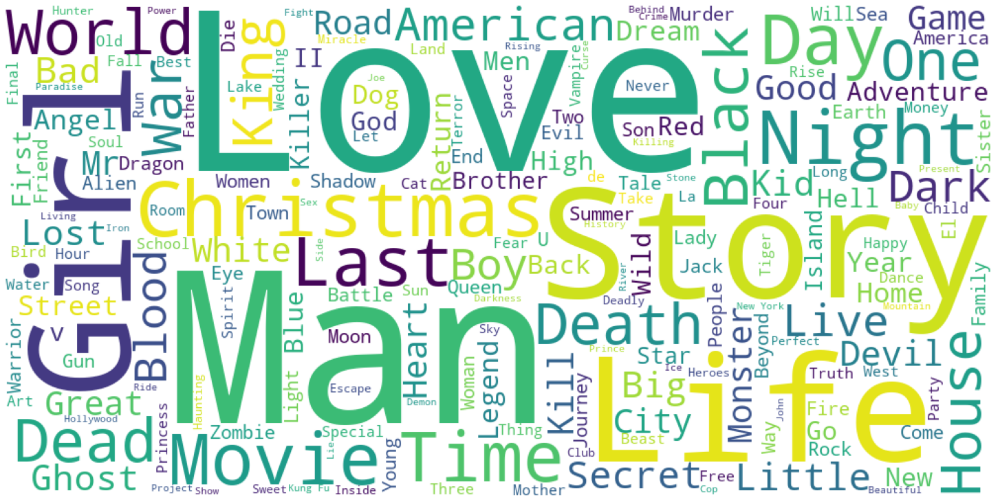

In [30]:
stopwords = set(STOPWORDS)
 
wordcloud = WordCloud(width = 1000, height = 500,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(movies_titles_w)
  
# plot the WordCloud image                       
plt.figure(figsize = (20, 10), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

In [31]:
df_movies_year = df_movies.copy()

In [32]:
df_movies_year.drop(df_movies_year.loc[df_movies_year['Year'] == "NA"].index, inplace = True)
# df_movies_year = df_movies_year[df_movies_year.Year != "NA"]
df_movies_year['Year'] = df_movies_year['Year'].astype(int)

In [33]:
df_year_new_movies = df_movies_year.sort_values(by = 'Year', ascending = False).reset_index()
df_year_new_movies = df_year_new_movies.drop(['index'], axis = 1)
# filter = (df_movies_year['Year'] == (df_movies_year['Year'].max()))
# df_year_new_movies = df_movies_year[filter]

# newest_rated_movies = df_movies_year.loc[df_movies_year['Year'].idxmax()]

print('\nMovies with Latest Year Ever  are : \n')
df_year_new_movies.head(5)


Movies with Latest Year Ever  are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,761,The Occupant,2020,18,6.4,50,"David Pastor,Àlex Pastor","Javier Gutiérrez,Mario Casas,Bruna Cusí,Ruth D...","Adventure,Drama,Thriller",Spain,Spanish,NA,103,movie,1,0,0,0,0,Netflix
1,706,Go!,2020,16,7.2,88,Doug Liman,"Katie Holmes,Sarah Polley,Suzanne Krull,Desmon...","Comedy,Crime",United States,English,"Told from three perspectives, a story of a bun...",102,movie,1,0,0,0,0,Netflix
2,682,Horse Girl,2020,16,5.9,70,Jeff Baena,"Alison Brie,Molly Shannon,Goldenite,Stella Che...","Drama,Mystery,Thriller",United States,English,"Sarah, a socially isolated arts and crafts sto...",103,movie,1,0,0,0,0,Netflix
3,2325,The Last Thing He Wanted,2020,16,4.3,5,Dee Rees,"Anne Hathaway,Ben Affleck,Rosie Perez,Willem D...","Crime,Drama,Thriller",United States,"English,Spanish,French",NA,115,movie,1,0,0,0,0,Netflix
4,6544,Shubh Mangal Zyada Saavdhan,2020,NR,5.8,92,Hitesh Kewalya,"Ayushmann Khurrana,Jitendra Kumar,Gajraj Rao,N...","Comedy,Romance",India,Hindi,An eccentric marketing guru visits a Coca-Cola...,117,movie,0,0,1,0,0,Prime Video


In [34]:
df_year_old_movies = df_movies_year.sort_values(by = 'Year', ascending = True).reset_index()
df_year_old_movies = df_year_old_movies.drop(['index'], axis = 1)
# filter = (df_movies_year['Year'] == (df_movies_year['Year'].min()))
# df_year_old_movies = df_movies_year[filter]

print('\nMovies with Oldest Year Ever  are : \n')
df_year_old_movies.head(5)


Movies with Oldest Year Ever  are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,16756,Space: The New Frontier,1901,16,7,NA,Dave Bullock,"David Boreanaz,Miguel Ferrer,Neil Patrick Harr...","Animation,Action,Adventure,Fantasy,Sci-Fi",United States,English,The American Muscle Car series relives that in...,75,movie,0,0,1,0,0,Prime Video
1,4343,A Trip to the Moon,1902,0,8.2,44,Georges Méliès,"Victor André,Bleuette Bernon,Brunnet,Jehanne d...","Short,Adventure,Comedy,Fantasy,Sci-Fi",France,"None,French",An association of astronomers has convened to ...,13,movie,0,0,1,0,0,Prime Video
2,8557,From the Manger to the Cross,1912,7,5.7,NA,Sidney Olcott,"R. Henderson Bland,Percy Dyer,Gene Gauntier,Al...","Biography,Drama",United States,"None,English",NA,60,movie,0,0,1,0,0,Prime Video
3,9636,Fatty Joins the Force,1913,NR,5.3,NA,George Nichols,"Roscoe 'Fatty' Arbuckle,Charles Avery,Lou Bres...","Comedy,Short",United States,"None,English","7 years after the original Fortress movie, Bre...",12,movie,0,0,1,0,0,Prime Video
4,9884,The Speed Kings,1913,NR,5,NA,Wilfred Lucas,"Ford Sterling,Mabel Normand,Teddy Tetzlaff,Ear...","Short,Action,Comedy",United States,"None,English","In Fort Hernandez, San Antonio, a group of Mex...",8,movie,0,0,1,0,0,Prime Video


In [35]:
print(f'''
      Total '{df_movies_year['Year'].unique().shape[0]}' unique Year s were Given, They were Like this,\n
      
{df_movies_year.sort_values(by = 'Year', ascending = False)['Year'].unique()}\n

      The Latest Year TV Show Ever is '{df_year_new_movies['Title'][0]}' : '{df_year_new_movies['Year'].max()}'\n

      The Oldest Year TV Show Ever is '{df_year_old_movies['Title'][0]}' : '{df_year_old_movies['Year'].min()}'\n
      ''')


      Total '110' unique Year s were Given, They were Like this,

      
[2020 2019 2018 2017 2016 2015 2014 2013 2012 2011 2010 2009 2008 2007
 2006 2005 2004 2003 2002 2001 2000 1999 1998 1997 1996 1995 1994 1993
 1992 1991 1990 1989 1988 1987 1986 1985 1984 1983 1982 1981 1980 1979
 1978 1977 1976 1975 1974 1973 1972 1971 1970 1969 1968 1967 1966 1965
 1964 1963 1962 1961 1960 1959 1958 1957 1956 1955 1954 1953 1952 1951
 1950 1949 1948 1947 1946 1945 1944 1943 1942 1941 1940 1939 1938 1937
 1936 1935 1934 1933 1932 1931 1930 1929 1928 1927 1926 1925 1924 1923
 1922 1921 1920 1919 1918 1917 1916 1915 1913 1912 1902 1901]


      The Latest Year TV Show Ever is 'The Occupant' : '2020'


      The Oldest Year TV Show Ever is 'Space: The New Frontier' : '1901'

      


In [36]:
netflix_year_new_movies = df_year_new_movies.loc[df_year_new_movies['Netflix']==1].reset_index()
netflix_year_new_movies = netflix_year_new_movies.drop(['index'], axis = 1)

netflix_year_old_movies = df_year_old_movies.loc[df_year_old_movies['Netflix']==1].reset_index()
netflix_year_old_movies = netflix_year_old_movies.drop(['index'], axis = 1)

netflix_year_new_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,761,The Occupant,2020,18,6.4,50,"David Pastor,Àlex Pastor","Javier Gutiérrez,Mario Casas,Bruna Cusí,Ruth D...","Adventure,Drama,Thriller",Spain,Spanish,NA,103,movie,1,0,0,0,0,Netflix
1,706,Go!,2020,16,7.2,88,Doug Liman,"Katie Holmes,Sarah Polley,Suzanne Krull,Desmon...","Comedy,Crime",United States,English,"Told from three perspectives, a story of a bun...",102,movie,1,0,0,0,0,Netflix
2,682,Horse Girl,2020,16,5.9,70,Jeff Baena,"Alison Brie,Molly Shannon,Goldenite,Stella Che...","Drama,Mystery,Thriller",United States,English,"Sarah, a socially isolated arts and crafts sto...",103,movie,1,0,0,0,0,Netflix
3,2325,The Last Thing He Wanted,2020,16,4.3,5,Dee Rees,"Anne Hathaway,Ben Affleck,Rosie Perez,Willem D...","Crime,Drama,Thriller",United States,"English,Spanish,French",NA,115,movie,1,0,0,0,0,Netflix
4,16245,Dracula,2020,16,7.4,74,Francis Ford Coppola,"Gary Oldman,Winona Ryder,Anthony Hopkins,Keanu...",Horror,"United Kingdom,United States","English,Romanian,Greek,Bulgarian,Latin","In the wake of the Fronde in 1667, the French ...",128,movie,1,0,0,0,0,Netflix


In [37]:
hulu_year_new_movies = df_year_new_movies.loc[df_year_new_movies['Hulu']==1].reset_index()
hulu_year_new_movies = hulu_year_new_movies.drop(['index'], axis = 1)

hulu_year_old_movies = df_year_old_movies.loc[df_year_old_movies['Hulu']==1].reset_index()
hulu_year_old_movies = hulu_year_old_movies.drop(['index'], axis = 1)

hulu_year_new_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,3589,Big Time Adolescence,2020,16,7,86,Jason Orley,"Griffin Gluck,Larry John Meyers,Michael Devine...","Comedy,Drama",United States,English,NA,91,movie,0,1,0,0,0,Hulu
1,16550,The Happy Days of Garry Marshall,2020,NR,8.3,NA,John Scheinfeld,"Abigail Breslin,Anne Hathaway,Jennifer Garner,...",Documentary,United States,English,NA,84,movie,0,1,0,0,0,Hulu
2,16570,Drag Me,2020,16,6.5,NA,Sam Raimi,"Alison Lohman,Justin Long,Lorna Raver,Dileep R...",Horror,United States,"English,Spanish,Hungarian,Czech",NA,99,movie,0,1,0,0,0,Hulu
3,3927,Spaceship Earth,2020,NR,6.4,89,Matt Wolf,"Shelley Taylor Morgan,Kathelin Gray,Marie Hard...",Documentary,United States,English,"The true, stranger-than-fiction, adventure of ...",113,movie,0,1,0,0,0,Hulu
4,4308,Alien Contact,2020,NR,7,NA,Rico Lowry,Charles Washington,Documentary,United States,English,Actual UFO encounters between Alien spacecraft...,75,movie,0,1,1,0,0,Prime Video


In [38]:
prime_video_year_new_movies = df_year_new_movies.loc[df_year_new_movies['Prime Video']==1].reset_index()
prime_video_year_new_movies = prime_video_year_new_movies.drop(['index'], axis = 1)

prime_video_year_old_movies = df_year_old_movies.loc[df_year_old_movies['Prime Video']==1].reset_index()
prime_video_year_old_movies = prime_video_year_old_movies.drop(['index'], axis = 1)

prime_video_year_new_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,6544,Shubh Mangal Zyada Saavdhan,2020,NR,5.8,92,Hitesh Kewalya,"Ayushmann Khurrana,Jitendra Kumar,Gajraj Rao,N...","Comedy,Romance",India,Hindi,An eccentric marketing guru visits a Coca-Cola...,117,movie,0,0,1,0,0,Prime Video
1,16641,Russell Peters: Deported,2020,NR,6.3,NA,David Higby,"Jason Collings,Vicky Kaushal,Taapsee Pannu,Rus...",Comedy,United States,English,NA,67,movie,0,0,1,0,0,Prime Video
2,6606,Happiness Continues,2020,NR,7.4,NA,Anthony Mandler,"Joe Jonas,Kevin Jonas,Nick Jonas,Priyanka Chop...","Documentary,Music",NA,NA,Blinded since childhood when a hideous car-cra...,104,movie,0,0,1,0,0,Prime Video
3,9400,Killer Camera Monsters,2020,NR,2.6,NA,Ryan McBay,"Sarati,Lauren Compton,Steve Filice,Bernadette ...","Horror,Thriller",United States,English,"In Seattle, the successful forensic psychiatri...",86,movie,0,0,1,0,0,Prime Video
4,16694,Jayde Adams: Serious Black Jumper,2020,NR,7.1,NA,Peter Orton,Jayde Adams,Comedy,United States,English,NA,67,movie,0,0,1,0,0,Prime Video


In [39]:
disney_year_new_movies = df_year_new_movies.loc[df_year_new_movies['Disney+']==1].reset_index()
disney_year_new_movies = disney_year_new_movies.drop(['index'], axis = 1)

disney_year_old_movies = df_year_old_movies.loc[df_year_old_movies['Disney+']==1].reset_index()
disney_year_old_movies = disney_year_old_movies.drop(['index'], axis = 1)

disney_year_new_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,16142,A Celebration of the Music from Coco,2020,13,7.1,NA,Ron de Moraes,"Benjamin Bratt,Jaime Camil,Aran de la Peña,Fel...","Music,Musical",United States,English,After six months of scientifically advanced tr...,47,movie,0,0,0,1,0,Disney+
1,16080,Lamp Life,2020,13,6.7,NA,Valerie LaPointe,"Annie Potts,Ally Maki,Jim Hanks,Emily Davis,Mi...","Animation,Short,Adventure,Comedy,Family,Fantasy",United States,English,When Penny and her family are invited on a cru...,7,movie,0,0,0,1,0,Disney+
2,15767,Onward,2020,7,7.4,88,Dan Scanlon,"Tom Holland,Chris Pratt,Julia Louis-Dreyfus,Oc...","Animation,Adventure,Comedy,Family,Fantasy",United States,English,The historical film by the American director E...,102,movie,0,0,0,1,0,Disney+
3,16061,The Disney Family Singalong,2020,0,7.8,NA,"Hamish Hamilton,James B. Merryman","Christina Aguilera,Erin Andrews,Joshua Bassett...","Family,Musical",United States,English,"After committing check fraud, Preston Waters l...",NA,movie,0,0,0,1,0,Disney+
4,16171,Penguins: Life on the Edge,2020,0,6.9,NA,"Alastair Fothergill,Jeff Wilson","Blair Underwood,Matthew Aeberhard,John Aitchis...","Documentary,Family",United States,"English,French","In this film, edited from eight episodes of Di...",78,movie,0,0,0,1,0,Disney+


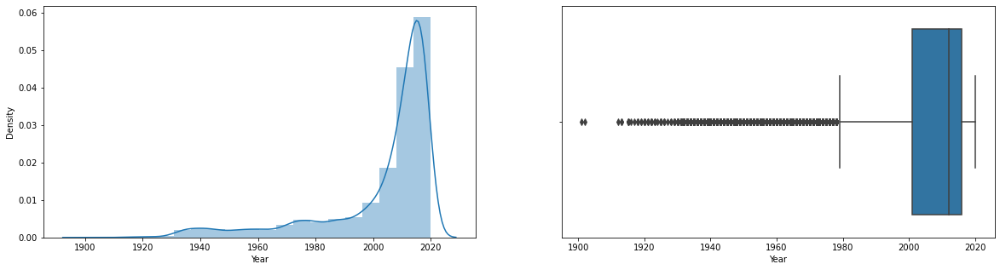

In [40]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(df_movies_year['Year'],bins = 20, kde = True, ax = ax[0])
sns.boxplot(df_movies_year['Year'], ax = ax[1])
plt.show()

In [41]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_year_movies = df_movies_year.loc[df_movies_year['Netflix'] == 1]
hulu_year_movies = df_movies_year.loc[df_movies_year['Hulu'] == 1]
prime_video_year_movies = df_movies_year.loc[df_movies_year['Prime Video'] == 1]
disney_year_movies = df_movies_year.loc[df_movies_year['Disney+'] == 1]

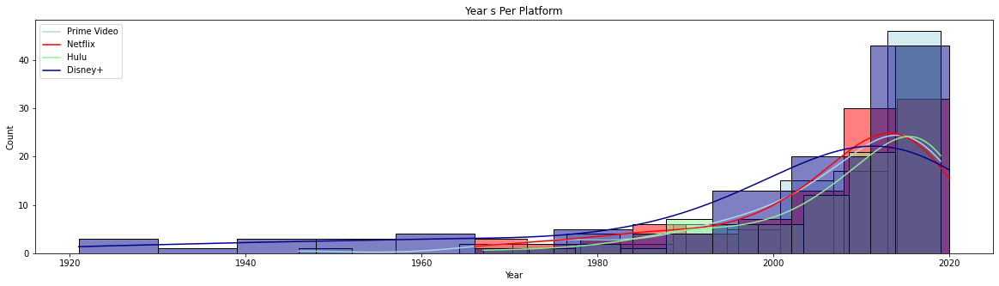

In [42]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Year s Per Platform')

# Plotting the information from each dataset into a histogram
sns.histplot(prime_video_year_movies['Year'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_year_movies['Year'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_year_movies['Year'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_year_movies['Year'][:100], color = 'darkblue', legend = True, kde = True) 

# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [43]:
print(f'''
      The Latest TV Show Ever Got is '{df_year_new_movies['Title'][0]}' : '{df_year_new_movies['Year'].max()}'\n
      The Oldest TV Show Ever Got is '{df_year_old_movies['Title'][0]}' : '{df_year_old_movies['Year'].min()}'\n
      
      The Latest TV Show on 'Netflix' is '{netflix_year_new_movies['Title'][0]}' : '{netflix_year_new_movies['Year'].max()}'\n
      The Oldest TV Show on 'Netflix' is '{netflix_year_old_movies['Title'][0]}' : '{netflix_year_old_movies['Year'].min()}'\n
      
      The Latest TV Show on 'Hulu' is '{hulu_year_new_movies['Title'][0]}' : '{hulu_year_new_movies['Year'].max()}'\n
      The Oldest TV Show on 'Hulu' is '{hulu_year_old_movies['Title'][0]}' : '{hulu_year_old_movies['Year'].min()}'\n
      
      The Latest TV Show on 'Prime Video' is '{prime_video_year_new_movies['Title'][0]}' : '{prime_video_year_new_movies['Year'].max()}'\n
      The Oldest TV Show on 'Prime Video' is '{prime_video_year_old_movies['Title'][0]}' : '{prime_video_year_old_movies['Year'].min()}'\n
      
      The Latest TV Show on 'Disney+' is '{disney_year_new_movies['Title'][0]}' : '{disney_year_new_movies['Year'].max()}'\n
      The Oldest TV Show on 'Disney+' is '{disney_year_old_movies['Title'][0]}' : '{disney_year_old_movies['Year'].min()}'\n 
      ''')


      The Latest TV Show Ever Got is 'The Occupant' : '2020'

      The Oldest TV Show Ever Got is 'Space: The New Frontier' : '1901'

      
      The Latest TV Show on 'Netflix' is 'The Occupant' : '2020'

      The Oldest TV Show on 'Netflix' is 'The Battle of Midway' : '1942'

      
      The Latest TV Show on 'Hulu' is 'Big Time Adolescence' : '2020'

      The Oldest TV Show on 'Hulu' is 'The Hunchback of Notre Dame' : '1923'

      
      The Latest TV Show on 'Prime Video' is 'Shubh Mangal Zyada Saavdhan' : '2020'

      The Oldest TV Show on 'Prime Video' is 'Space: The New Frontier' : '1901'

      
      The Latest TV Show on 'Disney+' is 'A Celebration of the Music from Coco' : '2020'

      The Oldest TV Show on 'Disney+' is 'The Three Musketeers' : '1921'
 
      


In [44]:
# def round_val(data):
#     if str(data) != 'nan':
#         return round(data)
# 		
# def round_fix(data):
#     if data in range(1801,1900):
#         # print(data)
#         return 1900
#     if data in range(1901,1910):
#         return 1910
#     if data in range(1911,1920):
#         return 1920
# 	if data in range(1921,1930):
#         return 1930
# 	if data in range(1931,1940):
#         return 1940
# 	if data in range(1941,1950):
#         return 1950
# 	if data in range(1951,1960):
#         return 1960
# 	if data in range(1961,1970):
#         return 1970
# 	if data in range(1971,1980):
#         return 1980
# 	if data in range(1981,1990):
#         return 1990
# 	if data in range(1991,2000):
#         return 2000
# 	if data in range(2000,2010):
#         return 2010
# 	if data in range(2010,2020):
#         return 2020
# 	if data in range(2020,2030):
#         return 2030
# 	if data in range(2300,2100):
#         return 2100
#     
# df_movies_year['Year Group'] = df_movies_year['Year'].apply(round_fix)
# 
# year_values = df_movies_year['Year Group'].value_counts().sort_index(ascending = False).tolist()
# year_index = df_movies_year['Year Group'].value_counts().sort_index(ascending = False).index
# 
# year_values, year_index

In [45]:
year_count = df_movies_year.groupby('Year')['Title'].count()
year_movies = df_movies_year.groupby('Year')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
year_data_movies = pd.concat([year_count, year_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
year_data_movies = year_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [46]:
# Movies Count per Year - All Platforms Combined
year_data_movies.head()

,Year,Movies Count,Netflix,Hulu,Prime Video,Disney+
106,2017,1449,576,140,792,22
107,2018,1287,561,168,618,15
105,2016,1236,451,81,735,17
104,2015,1090,281,78,761,10
103,2014,991,174,60,774,10


In [47]:
# Highest Movies Count per Year - All Platforms Combined
df_year_high_movies = year_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_year_high_movies = df_year_high_movies.drop(['index'], axis = 1)
# filter = (year_data_movies['Movies Count'] = =  (year_data_movies['Movies Count'].max()))
# df_year_high_movies = year_data_movies[filter]
 
# highest_rated_movies = year_data_movies.loc[year_data_movies['Movies Count'].idxmax()]
 
print('\nYear with Highest Ever Movies Count are : All Platforms Combined\n')
df_year_high_movies.head(5)


Year with Highest Ever Movies Count are : All Platforms Combined



,Year,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,2017,1449,576,140,792,22
1,2018,1287,561,168,618,15
2,2016,1236,451,81,735,17
3,2015,1090,281,78,761,10
4,2014,991,174,60,774,10


In [48]:
# Lowest Movies Count per Year - All Platforms Combined
df_year_low_movies = year_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_year_low_movies = df_year_low_movies.drop(['index'], axis = 1)
# filter = (year_data_movies['Movies Count'] = =  (year_data_movies['Movies Count'].min()))
# df_year_low_movies = year_data_movies[filter]
 
print('\nYear with Lowest Ever Movies Count are : All Platforms Combined\n')
df_year_low_movies.head(5)


Year with Lowest Ever Movies Count are : All Platforms Combined



,Year,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,1901,1,0,0,1,0
1,1912,1,0,0,1,0
2,1902,1,0,0,1,0
3,1927,1,0,0,1,0
4,1916,1,0,0,1,0


In [49]:
print(f'''
      Total '{df_movies['Year'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{year_data_movies['Year'].unique().shape[0]}' Year, They were Like this, \n
 
      {year_data_movies.sort_values(by = 'Movies Count', ascending = False)['Year'].head(5).unique()} etc. \n
 
      The Year with Highest Movies Count have '{year_data_movies['Movies Count'].max()}' Movies Available is '{df_year_high_movies['Year'][0]}', &\n
      The Year with Lowest Movies Count have '{year_data_movies['Movies Count'].min()}' Movies Available is '{df_year_low_movies['Year'][0]}'
      ''')


      Total '16923' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '110' Year, They were Like this, 

 
      [2017 2018 2016 2015 2014] etc. 

 
      The Year with Highest Movies Count have '1449' Movies Available is '2017', &

      The Year with Lowest Movies Count have '1' Movies Available is '1901'
      


In [50]:
# Highest Movies Count per Year - Netflix
netflix_year_movies = year_data_movies[year_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_year_movies = netflix_year_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_year_high_movies = df_year_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_year_high_movies = netflix_year_high_movies.drop(['index'], axis = 1)
 
netflix_year_low_movies = df_year_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_year_low_movies = netflix_year_low_movies.drop(['index'], axis = 1)
 
netflix_year_high_movies.head(5)

,Year,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,2017,1449,576,140,792,22
1,2018,1287,561,168,618,15
2,2016,1236,451,81,735,17
3,2019,703,430,119,164,24
4,2015,1090,281,78,761,10


In [51]:
# Highest Movies Count per Year - Hulu
hulu_year_movies = year_data_movies[year_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_year_movies = hulu_year_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_year_high_movies = df_year_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_year_high_movies = hulu_year_high_movies.drop(['index'], axis = 1)
 
hulu_year_low_movies = df_year_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_year_low_movies = hulu_year_low_movies.drop(['index'], axis = 1)
 
hulu_year_high_movies.head(5)

,Year,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,2018,1287,561,168,618,15
1,2017,1449,576,140,792,22
2,2019,703,430,119,164,24
3,2016,1236,451,81,735,17
4,2015,1090,281,78,761,10


In [52]:
# Highest Movies Count per Year - Prime Video
prime_video_year_movies = year_data_movies[year_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_year_movies = prime_video_year_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_year_high_movies = df_year_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_year_high_movies = prime_video_year_high_movies.drop(['index'], axis = 1)
 
prime_video_year_low_movies = df_year_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_year_low_movies = prime_video_year_low_movies.drop(['index'], axis = 1)
 
prime_video_year_high_movies.head(5)

,Year,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,2013,979,139,51,815,12
1,2017,1449,576,140,792,22
2,2014,991,174,60,774,10
3,2015,1090,281,78,761,10
4,2016,1236,451,81,735,17


In [53]:
# Highest Movies Count per Year - Disney+
disney_year_movies = year_data_movies[year_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_year_movies = disney_year_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_year_high_movies = df_year_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_year_high_movies = disney_year_high_movies.drop(['index'], axis = 1)
 
disney_year_low_movies = df_year_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_year_low_movies = disney_year_low_movies.drop(['index'], axis = 1)
 
disney_year_high_movies.head(5)

,Year,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,2003,214,31,6,157,25
1,2019,703,430,119,164,24
2,2017,1449,576,140,792,22
3,2000,176,19,8,132,21
4,2002,196,21,9,152,21


In [54]:
print(f'''
      The Year with Highest Movies Count Ever Got is '{df_year_high_movies['Year'][0]}' : '{df_year_high_movies['Movies Count'].max()}'\n
      The Year with Lowest Movies Count Ever Got is '{df_year_low_movies['Year'][0]}' : '{df_year_low_movies['Movies Count'].min()}'\n
      
      The Year with Highest Movies Count on 'Netflix' is '{netflix_year_high_movies['Year'][0]}' : '{netflix_year_high_movies['Netflix'].max()}'\n
      The Year with Lowest Movies Count on 'Netflix' is '{netflix_year_low_movies['Year'][0]}' : '{netflix_year_low_movies['Netflix'].min()}'\n
      
      The Year with Highest Movies Count on 'Hulu' is '{hulu_year_high_movies['Year'][0]}' : '{hulu_year_high_movies['Hulu'].max()}'\n
      The Year with Lowest Movies Count on 'Hulu' is '{hulu_year_low_movies['Year'][0]}' : '{hulu_year_low_movies['Hulu'].min()}'\n
      
      The Year with Highest Movies Count on 'Prime Video' is '{prime_video_year_high_movies['Year'][0]}' : '{prime_video_year_high_movies['Prime Video'].max()}'\n
      The Year with Lowest Movies Count on 'Prime Video' is '{prime_video_year_low_movies['Year'][0]}' : '{prime_video_year_low_movies['Prime Video'].min()}'\n
      
      The Year with Highest Movies Count on 'Disney+' is '{disney_year_high_movies['Year'][0]}' : '{disney_year_high_movies['Disney+'].max()}'\n
      The Year with Lowest Movies Count on 'Disney+' is '{disney_year_low_movies['Year'][0]}' : '{disney_year_low_movies['Disney+'].min()}'\n 
      ''')


      The Year with Highest Movies Count Ever Got is '2017' : '1449'

      The Year with Lowest Movies Count Ever Got is '1901' : '1'

      
      The Year with Highest Movies Count on 'Netflix' is '2017' : '576'

      The Year with Lowest Movies Count on 'Netflix' is '1941' : '0'

      
      The Year with Highest Movies Count on 'Hulu' is '2018' : '168'

      The Year with Lowest Movies Count on 'Hulu' is '1941' : '0'

      
      The Year with Highest Movies Count on 'Prime Video' is '2013' : '815'

      The Year with Lowest Movies Count on 'Prime Video' is '1901' : '1'

      
      The Year with Highest Movies Count on 'Disney+' is '2003' : '25'

      The Year with Lowest Movies Count on 'Disney+' is '1901' : '0'
 
      


In [55]:
print(f'''
      Accross All Platforms the Average Movies Count of Year is '{round(year_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Year on 'Netflix' is '{round(netflix_year_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Year on 'Hulu' is '{round(hulu_year_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Year on 'Prime Video' is '{round(prime_video_year_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Year on 'Disney+' is '{round(disney_year_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Movies Count of Year is '153.85'

      The Average Movies Count of Year on 'Netflix' is '58.66'

      The Average Movies Count of Year on 'Hulu' is '16.83'

      The Average Movies Count of Year on 'Prime Video' is '111.88'

      The Average Movies Count of Year on 'Disney+' is '6.76'
 
      


In [56]:
print(f'''
      Accross All Platforms Total Count of Year is '{year_data_movies['Year'].unique().shape[0]}'\n
      Total Count of Year on 'Netflix' is '{netflix_year_movies['Year'].unique().shape[0]}'\n
      Total Count of Year on 'Hulu' is '{hulu_year_movies['Year'].unique().shape[0]}'\n
      Total Count of Year on 'Prime Video' is '{prime_video_year_movies['Year'].unique().shape[0]}'\n
      Total Count of Year on 'Disney+' is '{disney_year_movies['Year'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Year is '110'

      Total Count of Year on 'Netflix' is '62'

      Total Count of Year on 'Hulu' is '63'

      Total Count of Year on 'Prime Video' is '110'

      Total Count of Year on 'Disney+' is '83'
 
      


In [57]:
fig = px.bar(year_data_movies[:20], x = 'Year', y = 'Movies Count', color = 'Movies Count', color_continuous_scale = 'Blues_r')
fig.show()

In [58]:
fig = px.histogram(year_data_movies, x = 'Year', y = 'Movies Count')
fig.show()

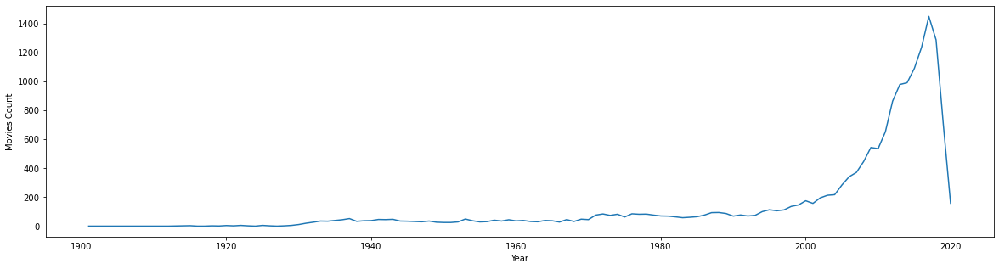

In [59]:
fig = plt.figure(figsize = (20, 5))
sns.lineplot(data = year_data_movies, x = 'Year', y = 'Movies Count')
plt.show()

In [60]:
print(f'''
      Accross All Platforms Total Count of Year is '{year_data_movies['Year'].unique().shape[0]}'\n
      Total Count of Year on 'Netflix' is '{netflix_year_movies['Year'].unique().shape[0]}'\n
      Total Count of Year on 'Hulu' is '{hulu_year_movies['Year'].unique().shape[0]}'\n
      Total Count of Year on 'Prime Video' is '{prime_video_year_movies['Year'].unique().shape[0]}'\n
      Total Count of Year on 'Disney+' is '{disney_year_movies['Year'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Year is '110'

      Total Count of Year on 'Netflix' is '62'

      Total Count of Year on 'Hulu' is '63'

      Total Count of Year on 'Prime Video' is '110'

      Total Count of Year on 'Disney+' is '83'
 
      


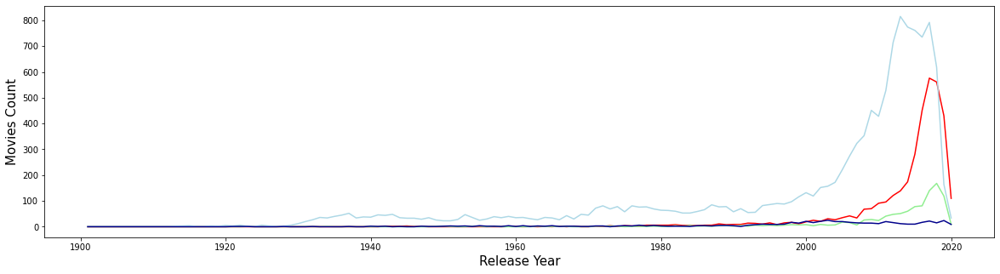

In [61]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = year_data_movies['Year'], y = year_data_movies['Netflix'], color = 'red')
sns.lineplot(x = year_data_movies['Year'], y = year_data_movies['Hulu'], color = 'lightgreen')
sns.lineplot(x = year_data_movies['Year'], y = year_data_movies['Prime Video'], color = 'lightblue')
sns.lineplot(x = year_data_movies['Year'], y = year_data_movies['Disney+'], color = 'darkblue')
plt.xlabel('Release Year', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

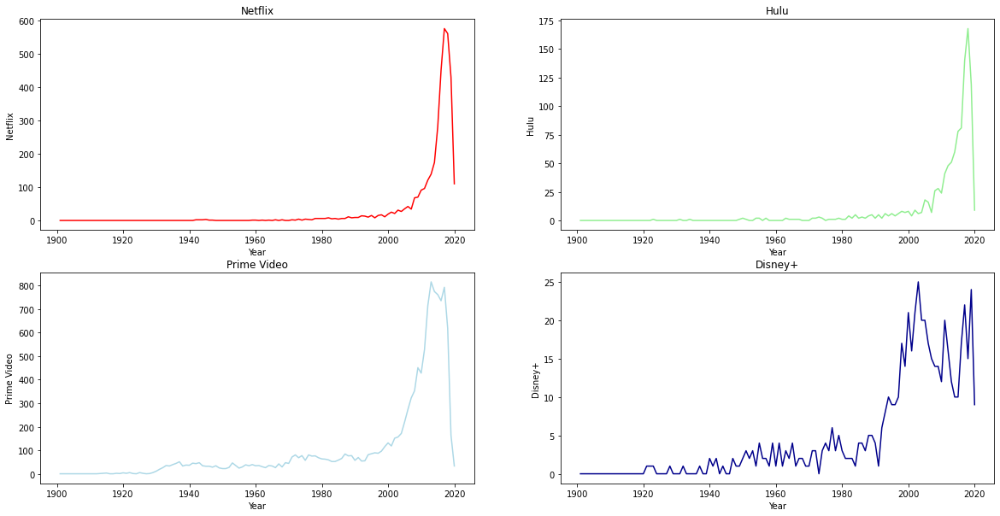

In [62]:
fig, axes = plt.subplots(2, 2,figsize=(20 ,10))
 
n_y_ax1 = sns.lineplot(x = year_data_movies['Year'], y = year_data_movies['Netflix'], color = 'red', ax = axes[0, 0])
h_y_ax2 = sns.lineplot(x = year_data_movies['Year'], y = year_data_movies['Hulu'], color = 'lightgreen', ax = axes[0, 1])
p_y_ax3 = sns.lineplot(x = year_data_movies['Year'], y = year_data_movies['Prime Video'], color = 'lightblue', ax = axes[1, 0])
d_y_ax4 = sns.lineplot(x = year_data_movies['Year'], y = year_data_movies['Disney+'], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_y_ax1.title.set_text(labels[0])
h_y_ax2.title.set_text(labels[1])
p_y_ax3.title.set_text(labels[2])
d_y_ax4.title.set_text(labels[3])
 
plt.show()

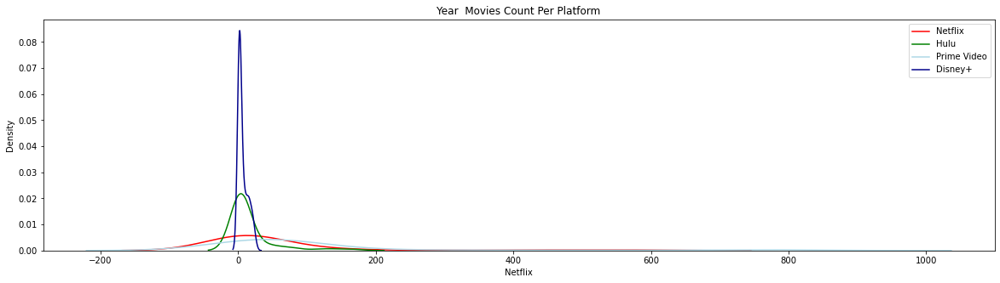

In [63]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Year  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_year_movies['Netflix'], color = 'red', legend = True)
sns.kdeplot(hulu_year_movies['Hulu'], color = 'green', legend = True)
sns.kdeplot(prime_video_year_movies['Prime Video'], color = 'lightblue', legend = True)
sns.kdeplot(disney_year_movies['Disney+'], color = 'darkblue', legend = True)                                      
                                      
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [64]:
df_movies_age = df_movies.copy()

In [65]:
df_movies_age.drop(df_movies_age.loc[df_movies_age['Age'] == "NR"].index, inplace = True)
# df_movies_age = df_movies_age[df_movies_age.Age != "NR"]
df_movies_age['Age'] = df_movies_age['Age'].astype(int)

In [66]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_age_movies = df_movies_age.loc[df_movies_age['Netflix'] == 1]
hulu_age_movies = df_movies_age.loc[df_movies_age['Hulu'] == 1]
prime_video_age_movies = df_movies_age.loc[df_movies_age['Prime Video'] == 1]
disney_age_movies = df_movies_age.loc[df_movies_age['Disney+'] == 1]

In [67]:
age_count = df_movies_age.groupby('Age')['Title'].count()
age_movies = df_movies_age.groupby('Age')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
age_data_movies = pd.concat([age_count, age_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
#age_data_movies = age_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [68]:
# Age with Movies Counts - All Platforms Combined
age_data_movies.sort_values(by = 'Movies Count', ascending = False)

,Age,Movies Count,Netflix,Hulu,Prime Video,Disney+
3,16,3316,635,332,2509,12
1,7,1687,353,150,1067,195
2,13,1612,430,147,1068,93
4,18,991,327,56,653,2
0,0,907,132,52,489,259


In [69]:
# Age with Movies Counts - All Platforms Combined
age_data_movies.sort_values(by = 'Age', ascending = False)

,Age,Movies Count,Netflix,Hulu,Prime Video,Disney+
4,18,991,327,56,653,2
3,16,3316,635,332,2509,12
2,13,1612,430,147,1068,93
1,7,1687,353,150,1067,195
0,0,907,132,52,489,259


In [70]:
df_age_high_movies = age_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_age_high_movies = df_age_high_movies.drop(['index'], axis = 1)
# filter = (age_data_movies['Movies Count'] = =  (age_data_movies['Movies Count'].max()))
# df_age_high_movies = age_data_movies[filter]
 
# highest_rated_movies = age_data_movies.loc[age_data_movies['Movies Count'].idxmax()]
 
# print('\nAge with Highest Ever Movies Count are : All Platforms Combined\n')
# df_age_high_movies.head(5)
 
df_age_low_movies = age_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_age_low_movies = df_age_low_movies.drop(['index'], axis = 1)
# filter = (age_data_movies['Movies Count'] = =  (age_data_movies['Movies Count'].min()))
# df_age_low_movies = age_data_movies[filter]
 
# print('\nAge with Lowest Ever Movies Count are : All Platforms Combined\n')
# df_age_low_movies.head(5)

In [71]:
print(f'''
      Lets Talk about, 'All Platforms'
      
      Total '{df_movies_age['Age'].value_counts().shape[0]}' Rating as per 'Age' Categories are available on All Platforms & They are '{df_movies_age['Age'].unique()}'\n
      Total '{df_movies_age[df_movies_age['Age'] == 'NR'].shape[0]}' Movies are available on All Platforms Which are 'Not Rated' Yet\n
      Total '{df_movies_age[df_movies_age['Age'] == 0].shape[0]}' Movies are available for 'All' Audience on All Platforms\n
      Total '{df_movies_age[df_movies_age['Age'] == 7].shape[0]}' Movies are available Only for '7+' Audience on All Platforms\n
      Total '{df_movies_age[df_movies_age['Age'] == 13].shape[0]}' Movies are available Only for '13+' Audience on All Platforms\n
      Total '{df_movies_age[df_movies_age['Age'] == 16].shape[0]}' Movies are available Only for '16+' Audience on All Platforms\n
      Total '{df_movies_age[df_movies_age['Age'] == 18].shape[0]}' Movies are available Only for '18+' Audience on All Platforms\n
      ''')


      Lets Talk about, 'All Platforms'
      
      Total '5' Rating as per 'Age' Categories are available on All Platforms & They are '[13 16  7  0 18]'

      Total '0' Movies are available on All Platforms Which are 'Not Rated' Yet

      Total '907' Movies are available for 'All' Audience on All Platforms

      Total '1687' Movies are available Only for '7+' Audience on All Platforms

      Total '1612' Movies are available Only for '13+' Audience on All Platforms

      Total '3316' Movies are available Only for '16+' Audience on All Platforms

      Total '991' Movies are available Only for '18+' Audience on All Platforms

      


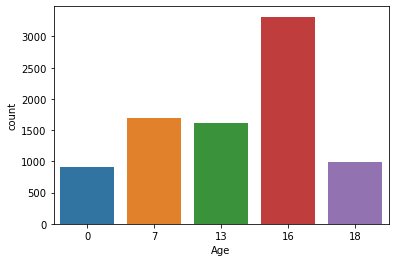

In [72]:
sns.countplot(df_movies_age['Age'])
plt.show()

In [73]:
# netflix_age_movies = age_data_movies[age_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_age_movies = netflix_age_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_age_high_movies = df_age_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_age_high_movies = netflix_age_high_movies.drop(['index'], axis = 1)
 
netflix_age_low_movies = df_age_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_age_low_movies = netflix_age_low_movies.drop(['index'], axis = 1)
 
netflix_age_high_movies.head(5)

,Age,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,16,3316,635,332,2509,12
1,13,1612,430,147,1068,93
2,7,1687,353,150,1067,195
3,18,991,327,56,653,2
4,0,907,132,52,489,259


In [74]:
print(f'''
      Lets Talk about, 'Netflix'
      
      Total '{netflix_age_movies['Age'].value_counts().shape[0]}' Rating as per 'Age' Categories are available on 'Age' & They are '{netflix_age_movies['Age'].unique()}'\n
      Total '{netflix_age_movies[netflix_age_movies['Age'] == 'NR'].shape[0]}' Movies are available on 'Age' Which are 'Not Rated' Yet\n
      Total '{netflix_age_movies[netflix_age_movies['Age'] == 0].shape[0]}' Movies are available for 'All' Audience on 'Age'\n
      Total '{netflix_age_movies[netflix_age_movies['Age'] == 7].shape[0]}' Movies are available Only for '7+' Audience on 'Age'\n
      Total '{netflix_age_movies[netflix_age_movies['Age'] == 13].shape[0]}' Movies are available Only for '13+' Audience on 'Age'\n
      Total '{netflix_age_movies[netflix_age_movies['Age'] == 16].shape[0]}' Movies are available Only for '16+' Audience on 'Age'\n
      Total '{netflix_age_movies[netflix_age_movies['Age'] == 18].shape[0]}' Movies are available Only for '18+' Audience on 'Age'\n
      ''')


      Lets Talk about, 'Netflix'
      
      Total '5' Rating as per 'Age' Categories are available on 'Age' & They are '[13 16  7  0 18]'

      Total '0' Movies are available on 'Age' Which are 'Not Rated' Yet

      Total '132' Movies are available for 'All' Audience on 'Age'

      Total '353' Movies are available Only for '7+' Audience on 'Age'

      Total '430' Movies are available Only for '13+' Audience on 'Age'

      Total '635' Movies are available Only for '16+' Audience on 'Age'

      Total '327' Movies are available Only for '18+' Audience on 'Age'

      


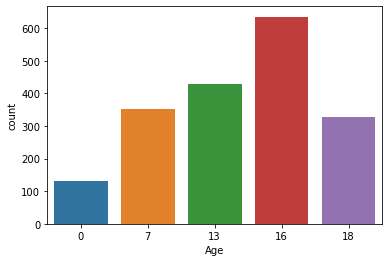

In [75]:
sns.countplot(netflix_age_movies['Age'])
plt.show()

In [76]:
# hulu_age_movies = age_data_movies[age_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_age_movies = hulu_age_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_age_high_movies = df_age_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_age_high_movies = hulu_age_high_movies.drop(['index'], axis = 1)
 
hulu_age_low_movies = df_age_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_age_low_movies = hulu_age_low_movies.drop(['index'], axis = 1)
 
hulu_age_high_movies.head(5)

,Age,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,16,3316,635,332,2509,12
1,7,1687,353,150,1067,195
2,13,1612,430,147,1068,93
3,18,991,327,56,653,2
4,0,907,132,52,489,259


In [77]:
print(f'''
      Lets Talk about, 'Hulu'
      
      Total '{hulu_age_movies['Age'].value_counts().shape[0]}' Rating as per 'Age' Categories are available on 'Hulu' & They are '{hulu_age_movies['Age'].unique()}'\n
      Total '{hulu_age_movies[hulu_age_movies['Age'] == 'NR'].shape[0]}' Movies are available on 'Hulu' Which are 'Not Rated' Yet\n
      Total '{hulu_age_movies[hulu_age_movies['Age'] == 0].shape[0]}' Movies are available for 'All' Audience on 'Hulu'\n
      Total '{hulu_age_movies[hulu_age_movies['Age'] == 7].shape[0]}' Movies are available Only for '7+' Audience on 'Hulu'\n
      Total '{hulu_age_movies[hulu_age_movies['Age'] == 13].shape[0]}' Movies are available Only for '13+' Audience on 'Hulu'\n
      Total '{hulu_age_movies[hulu_age_movies['Age'] == 16].shape[0]}' Movies are available Only for '16+' Audience on 'Hulu'\n
      Total '{hulu_age_movies[hulu_age_movies['Age'] == 18].shape[0]}' Movies are available Only for '18+' Audience on 'Hulu'\n
      ''')


      Lets Talk about, 'Hulu'
      
      Total '5' Rating as per 'Age' Categories are available on 'Hulu' & They are '[13  7 16  0 18]'

      Total '0' Movies are available on 'Hulu' Which are 'Not Rated' Yet

      Total '52' Movies are available for 'All' Audience on 'Hulu'

      Total '150' Movies are available Only for '7+' Audience on 'Hulu'

      Total '147' Movies are available Only for '13+' Audience on 'Hulu'

      Total '332' Movies are available Only for '16+' Audience on 'Hulu'

      Total '56' Movies are available Only for '18+' Audience on 'Hulu'

      


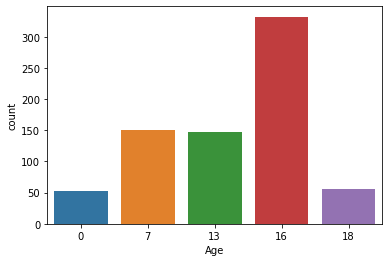

In [78]:
sns.countplot(hulu_age_movies['Age'])
plt.show()

In [79]:
# prime_video_age_movies = age_data_movies[age_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_age_movies = prime_video_age_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_age_high_movies = df_age_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_age_high_movies = prime_video_age_high_movies.drop(['index'], axis = 1)
 
prime_video_age_low_movies = df_age_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_age_low_movies = prime_video_age_low_movies.drop(['index'], axis = 1)
 
prime_video_age_high_movies.head(5)

,Age,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,16,3316,635,332,2509,12
1,13,1612,430,147,1068,93
2,7,1687,353,150,1067,195
3,18,991,327,56,653,2
4,0,907,132,52,489,259


In [80]:
print(f'''
      Lets Talk about, 'Prime Video'
      
      Total '{prime_video_age_movies['Age'].value_counts().shape[0]}' Rating as per 'Age' Categories are available on 'Age' & They are '{prime_video_age_movies['Age'].unique()}'\n
      Total '{prime_video_age_movies[prime_video_age_movies['Age'] == 'NR'].shape[0]}' Movies are available on 'Age' Which are 'Not Rated' Yet\n
      Total '{prime_video_age_movies[prime_video_age_movies['Age'] == 0].shape[0]}' Movies are available for 'All' Audience on 'Age'\n
      Total '{prime_video_age_movies[prime_video_age_movies['Age'] == 7].shape[0]}' Movies are available Only for '7+' Audience on 'Age'\n
      Total '{prime_video_age_movies[prime_video_age_movies['Age'] == 13].shape[0]}' Movies are available Only for '13+' Audience on 'Age'\n
      Total '{prime_video_age_movies[prime_video_age_movies['Age'] == 16].shape[0]}' Movies are available Only for '16+' Audience on 'Age'\n
      Total '{prime_video_age_movies[prime_video_age_movies['Age'] == 18].shape[0]}' Movies are available Only for '18+' Audience on 'Age'\n
      ''')


      Lets Talk about, 'Prime Video'
      
      Total '5' Rating as per 'Age' Categories are available on 'Age' & They are '[16 13 18  7  0]'

      Total '0' Movies are available on 'Age' Which are 'Not Rated' Yet

      Total '489' Movies are available for 'All' Audience on 'Age'

      Total '1067' Movies are available Only for '7+' Audience on 'Age'

      Total '1068' Movies are available Only for '13+' Audience on 'Age'

      Total '2509' Movies are available Only for '16+' Audience on 'Age'

      Total '653' Movies are available Only for '18+' Audience on 'Age'

      


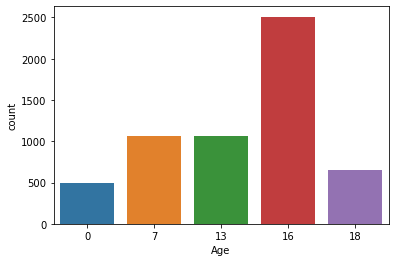

In [81]:
sns.countplot(prime_video_age_movies['Age'])
plt.show()

In [82]:
# disney_age_movies = age_data_movies[age_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_age_movies = disney_age_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_age_high_movies = df_age_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_age_high_movies = disney_age_high_movies.drop(['index'], axis = 1)
 
disney_age_low_movies = df_age_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_age_low_movies = disney_age_low_movies.drop(['index'], axis = 1)
 
disney_age_high_movies.head(5)

,Age,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,0,907,132,52,489,259
1,7,1687,353,150,1067,195
2,13,1612,430,147,1068,93
3,16,3316,635,332,2509,12
4,18,991,327,56,653,2


In [83]:
print(f'''
      Lets Talk about, 'Disney+'
      
      Total '{disney_age_movies['Age'].value_counts().shape[0]}' Rating as per 'Age' Categories are available on 'Age' & They are '{disney_age_movies['Age'].unique()}'\n
      Total '{disney_age_movies[disney_age_movies['Age'] == 'NR'].shape[0]}' Movies are available on 'Age' Which are 'Not Rated' Yet\n
      Total '{disney_age_movies[disney_age_movies['Age'] == 0].shape[0]}' Movies are available for 'All' Audience on 'Age'\n
      Total '{disney_age_movies[disney_age_movies['Age'] == 7].shape[0]}' Movies are available Only for '7+' Audience on 'Age'\n
      Total '{disney_age_movies[disney_age_movies['Age'] == 13].shape[0]}' Movies are available Only for '13+' Audience on 'Age'\n
      Total '{disney_age_movies[disney_age_movies['Age'] == 16].shape[0]}' Movies are available Only for '16+' Audience on 'Age'\n
      Total '{disney_age_movies[disney_age_movies['Age'] == 18].shape[0]}' Movies are available Only for '18+' Audience on 'Age'\n
      ''')


      Lets Talk about, 'Disney+'
      
      Total '5' Rating as per 'Age' Categories are available on 'Age' & They are '[13  7  0 16 18]'

      Total '0' Movies are available on 'Age' Which are 'Not Rated' Yet

      Total '259' Movies are available for 'All' Audience on 'Age'

      Total '195' Movies are available Only for '7+' Audience on 'Age'

      Total '93' Movies are available Only for '13+' Audience on 'Age'

      Total '12' Movies are available Only for '16+' Audience on 'Age'

      Total '2' Movies are available Only for '18+' Audience on 'Age'

      


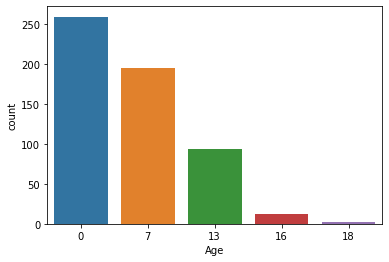

In [84]:
sns.countplot(disney_age_movies['Age'])
plt.show()

In [85]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_age_movies = age_data_movies[age_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_age_movies = netflix_age_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_age_movies = age_data_movies[age_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_age_movies = hulu_age_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_age_movies = age_data_movies[age_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_age_movies = prime_video_age_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_age_movies = age_data_movies[age_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_age_movies = disney_age_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

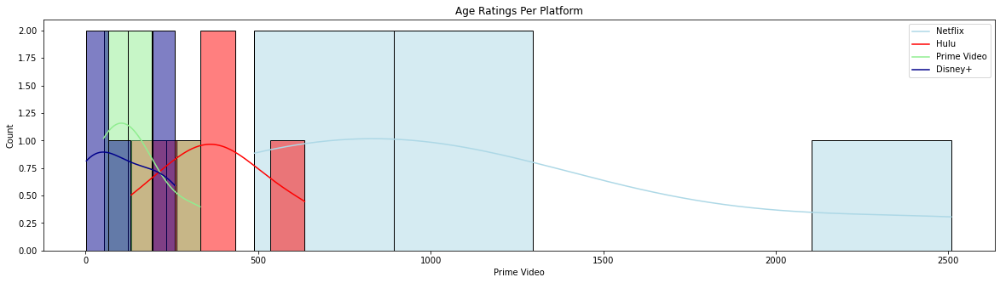

In [86]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Age Ratings Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.histplot(prime_video_age_movies['Prime Video'], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_age_movies['Netflix'], color = 'red', legend = True, kde = True)
sns.histplot(hulu_age_movies['Hulu'], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_age_movies['Disney+'], color = 'darkblue', legend = True, kde = True) 
 
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

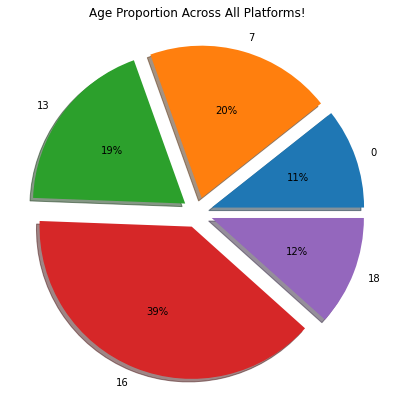

In [87]:
plt.figure(figsize = (7, 7))
 
plt.pie(age_data_movies['Movies Count'], labels = age_data_movies.Age, explode = (0.1, 0.1, 0.1, 0.1, 0.1), autopct='%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Age Proportion Across All Platforms!')
plt.show()

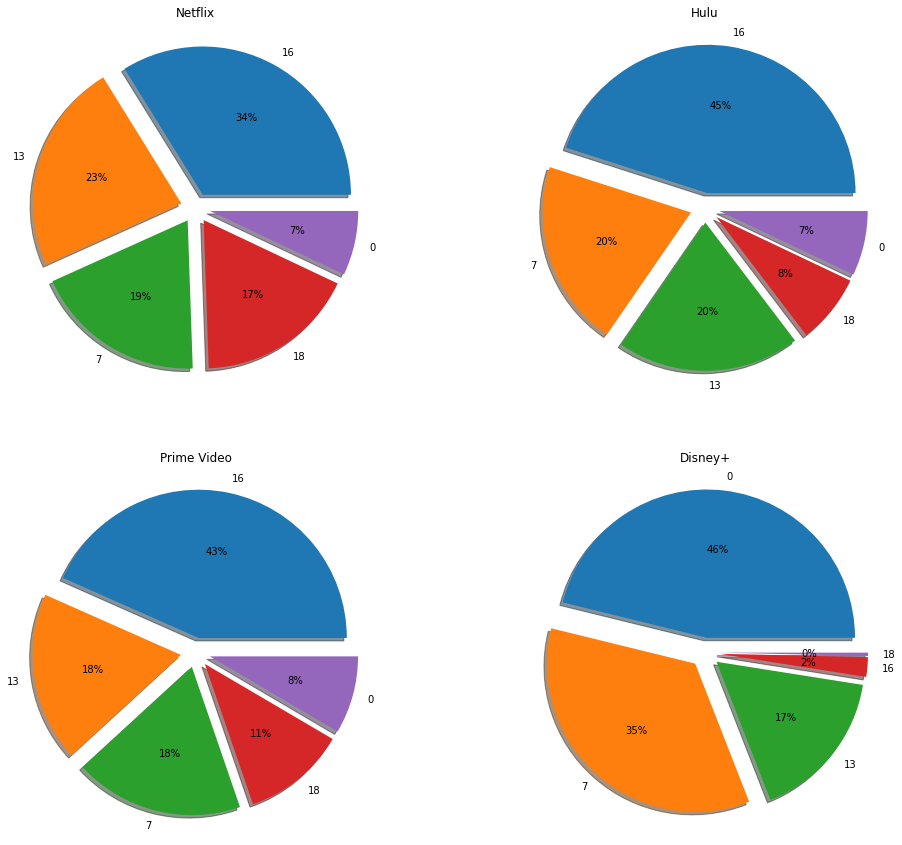

In [88]:
fig = plt.figure(figsize = (35, 15))
 
ax = plt.subplot2grid((2, 4), (0, 0))

age_labels = ['All', '7+', '13+', '16+', '18+']
 
plt.pie(netflix_age_movies['Netflix'], labels = netflix_age_movies.Age, explode = (0.1, 0.1, 0.1, 0.1, 0.1), autopct = '%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Netflix')
 
ax = plt.subplot2grid((2, 4), (0, 1))
 
plt.pie(hulu_age_movies['Hulu'], labels = hulu_age_movies.Age, explode = (0.1, 0.1, 0.1, 0.1, 0.1), autopct = '%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Hulu')
 
ax = plt.subplot2grid((2, 4), (1, 0))
 
plt.pie(prime_video_age_movies['Prime Video'], labels = prime_video_age_movies.Age, explode = (0.1, 0.1, 0.1, 0.1, 0.1), autopct = '%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Prime Video')
 
ax = plt.subplot2grid((2, 4), (1, 1))
 
plt.pie(disney_age_movies['Disney+'], labels = disney_age_movies.Age, explode = (0.1, 0.1, 0.1, 0.1, 0.1), autopct = '%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Disney+')
 
plt.show()

In [89]:
print(f'''
      The Age with Highest Movies Count Ever Got is '{df_age_high_movies['Age'][0]}' : '{df_age_high_movies['Movies Count'].max()}'\n
      The Age with Lowest Movies Count Ever Got is '{df_age_low_movies['Age'][0]}' : '{df_age_low_movies['Movies Count'].min()}'\n
      
      The Age with Highest Movies Count on 'Netflix' is '{netflix_age_high_movies['Age'][0]}' : '{netflix_age_high_movies['Netflix'].max()}'\n
      The Age with Lowest Movies Count on 'Netflix' is '{netflix_age_low_movies['Age'][0]}' : '{netflix_age_low_movies['Netflix'].min()}'\n
      
      The Age with Highest Movies Count on 'Hulu' is '{hulu_age_high_movies['Age'][0]}' : '{hulu_age_high_movies['Hulu'].max()}'\n
      The Age with Lowest Movies Count on 'Hulu' is '{hulu_age_low_movies['Age'][0]}' : '{hulu_age_low_movies['Hulu'].min()}'\n
      
      The Age with Highest Movies Count on 'Prime Video' is '{prime_video_age_high_movies['Age'][0]}' : '{prime_video_age_high_movies['Prime Video'].max()}'\n
      The Age with Lowest Movies Count on 'Prime Video' is '{prime_video_age_low_movies['Age'][0]}' : '{prime_video_age_low_movies['Prime Video'].min()}'\n
      
      The Age with Highest Movies Count on 'Disney+' is '{disney_age_high_movies['Age'][0]}' : '{disney_age_high_movies['Disney+'].max()}'\n
      The Age with Lowest Movies Count on 'Disney+' is '{disney_age_low_movies['Age'][0]}' : '{disney_age_low_movies['Disney+'].min()}'\n 
      ''')


      The Age with Highest Movies Count Ever Got is '16' : '3316'

      The Age with Lowest Movies Count Ever Got is '0' : '907'

      
      The Age with Highest Movies Count on 'Netflix' is '16' : '635'

      The Age with Lowest Movies Count on 'Netflix' is '0' : '132'

      
      The Age with Highest Movies Count on 'Hulu' is '16' : '332'

      The Age with Lowest Movies Count on 'Hulu' is '0' : '52'

      
      The Age with Highest Movies Count on 'Prime Video' is '16' : '2509'

      The Age with Lowest Movies Count on 'Prime Video' is '0' : '489'

      
      The Age with Highest Movies Count on 'Disney+' is '0' : '259'

      The Age with Lowest Movies Count on 'Disney+' is '18' : '2'
 
      


In [90]:
print(f'''
      Accross All Platforms the Average Movies Count of Age is '{round(age_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Age on 'Netflix' is '{round(netflix_age_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Age on 'Hulu' is '{round(hulu_age_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Age on 'Prime Video' is '{round(prime_video_age_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Age on 'Disney+' is '{round(disney_age_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Movies Count of Age is '1702.6'

      The Average Movies Count of Age on 'Netflix' is '375.4'

      The Average Movies Count of Age on 'Hulu' is '147.4'

      The Average Movies Count of Age on 'Prime Video' is '1157.2'

      The Average Movies Count of Age on 'Disney+' is '112.2'
 
      


In [91]:
print(f'''
      Accross All Platforms Total Count of Age is '{age_data_movies['Age'].unique().shape[0]}'\n
      Total Count of Age on 'Netflix' is '{netflix_age_movies['Age'].unique().shape[0]}'\n
      Total Count of Age on 'Hulu' is '{hulu_age_movies['Age'].unique().shape[0]}'\n
      Total Count of Age on 'Prime Video' is '{prime_video_age_movies['Age'].unique().shape[0]}'\n
      Total Count of Age on 'Disney+' is '{disney_age_movies['Age'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Age is '5'

      Total Count of Age on 'Netflix' is '5'

      Total Count of Age on 'Hulu' is '5'

      Total Count of Age on 'Prime Video' is '5'

      Total Count of Age on 'Disney+' is '5'
 
      


In [92]:
fig = px.bar(x = age_data_movies['Age'], y = age_data_movies['Movies Count'], 
             color = age_data_movies['Movies Count'], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Age', 'y' : 'Number of Movies'})
fig.show()

In [93]:
print(f'''
      Accross All Platforms Total Count of Age is '{age_data_movies['Age'].unique().shape[0]}'\n
      Total Count of Age on 'Netflix' is '{netflix_age_movies['Age'].unique().shape[0]}'\n
      Total Count of Age on 'Hulu' is '{hulu_age_movies['Age'].unique().shape[0]}'\n
      Total Count of Age on 'Prime Video' is '{prime_video_age_movies['Age'].unique().shape[0]}'\n
      Total Count of Age on 'Disney+' is '{disney_age_movies['Age'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Age is '5'

      Total Count of Age on 'Netflix' is '5'

      Total Count of Age on 'Hulu' is '5'

      Total Count of Age on 'Prime Video' is '5'

      Total Count of Age on 'Disney+' is '5'
 
      


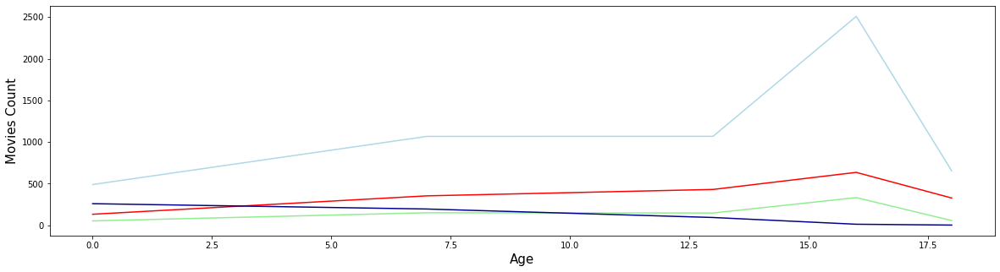

In [94]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = age_data_movies['Age'][:10], y = age_data_movies['Netflix'][:10], color = 'red')
sns.lineplot(x = age_data_movies['Age'][:10], y = age_data_movies['Hulu'][:10], color = 'lightgreen')
sns.lineplot(x = age_data_movies['Age'][:10], y = age_data_movies['Prime Video'][:10], color = 'lightblue')
sns.lineplot(x = age_data_movies['Age'][:10], y = age_data_movies['Disney+'][:10], color = 'darkblue')
plt.xlabel('Age', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

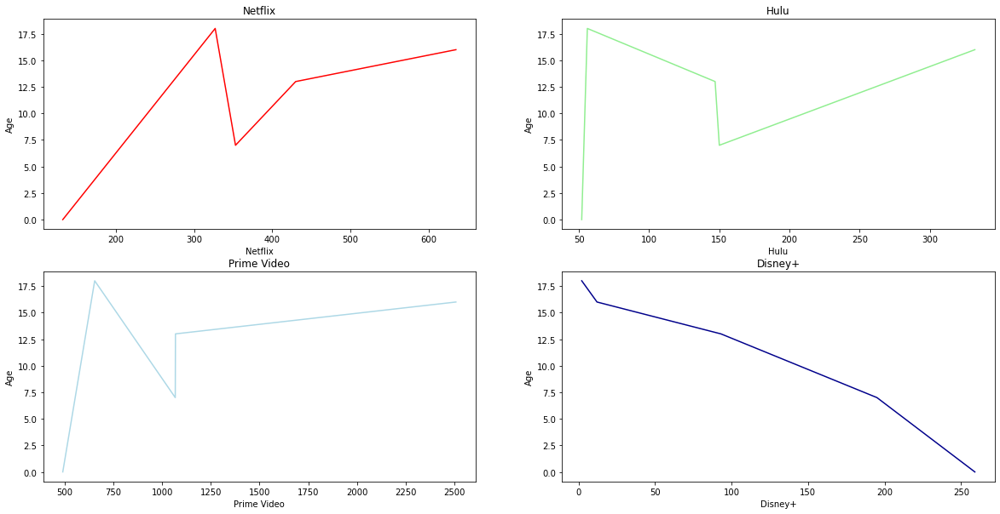

In [95]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_ag_ax1 = sns.lineplot(y = age_data_movies['Age'], x = age_data_movies['Netflix'], color = 'red', ax = axes[0, 0])
h_ag_ax2 = sns.lineplot(y = age_data_movies['Age'], x = age_data_movies['Hulu'], color = 'lightgreen', ax = axes[0, 1])
p_ag_ax3 = sns.lineplot(y = age_data_movies['Age'], x = age_data_movies['Prime Video'], color = 'lightblue', ax = axes[1, 0])
d_ag_ax4 = sns.lineplot(y = age_data_movies['Age'], x = age_data_movies['Disney+'], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_ag_ax1.title.set_text(labels[0])
h_ag_ax2.title.set_text(labels[1])
p_ag_ax3.title.set_text(labels[2])
d_ag_ax4.title.set_text(labels[3])
 
plt.show

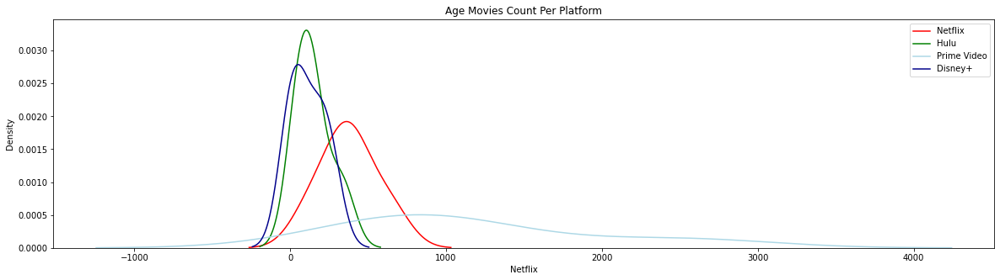

In [96]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Age Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_age_movies['Netflix'], color = 'red', legend = True)
sns.kdeplot(hulu_age_movies['Hulu'], color = 'green', legend = True)
sns.kdeplot(prime_video_age_movies['Prime Video'], color = 'lightblue', legend = True)
sns.kdeplot(disney_age_movies['Disney+'], color = 'darkblue', legend = True)                                      
                                      
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

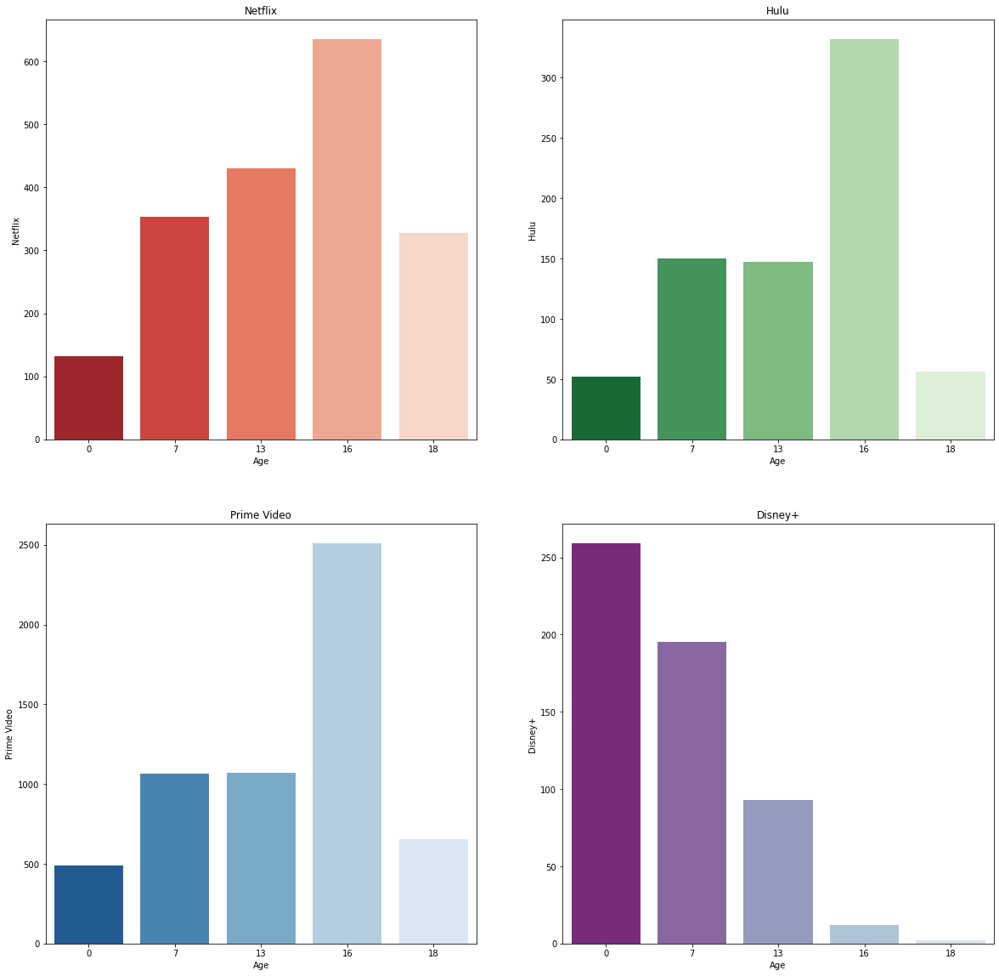

In [97]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_ag_ax1 = sns.barplot(x = netflix_age_movies['Age'][:10], y = netflix_age_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_ag_ax2 = sns.barplot(x = hulu_age_movies['Age'][:10], y = hulu_age_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_ag_ax3 = sns.barplot(x = prime_video_age_movies['Age'][:10], y = prime_video_age_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_ag_ax4 = sns.barplot(x = disney_age_movies['Age'][:10], y = disney_age_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_ag_ax1.title.set_text(labels[0])
h_ag_ax2.title.set_text(labels[1])
p_ag_ax3.title.set_text(labels[2])
d_ag_ax4.title.set_text(labels[3])
 
plt.show()

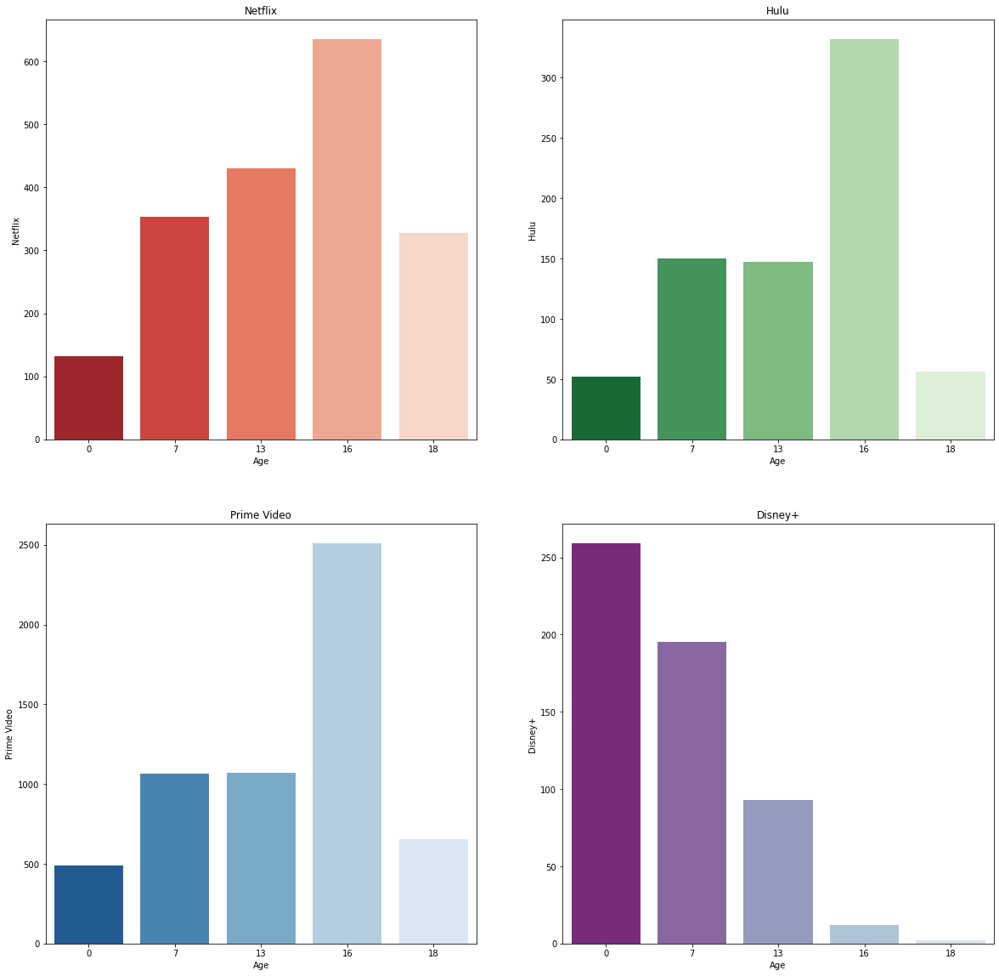

In [98]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_ag_ax1 = sns.barplot(x = age_data_movies['Age'][:10], y = age_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_ag_ax2 = sns.barplot(x = age_data_movies['Age'][:10], y = age_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_ag_ax3 = sns.barplot(x = age_data_movies['Age'][:10], y = age_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_ag_ax4 = sns.barplot(x = age_data_movies['Age'][:10], y = age_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_ag_ax1.title.set_text(labels[0])
h_ag_ax2.title.set_text(labels[1])
p_ag_ax3.title.set_text(labels[2])
d_ag_ax4.title.set_text(labels[3])
 
plt.show()

In [99]:
df_movies_imdb = df_movies.copy()

In [100]:
df_movies_imdb.drop(df_movies_imdb.loc[df_movies_imdb['IMDb'] == "NA"].index, inplace = True)
# df_movies_imdb = df_movies_imdb[df_movies_imdb.IMDb != "NA"]
# df_movies_imdb['IMDb'] = df_movies_imdb['IMDb'].astype(int)
df_movies_imdb['IMDb'] = df_movies_imdb['IMDb'].astype(float)

In [101]:
df_imdb_high_movies = df_movies_imdb.sort_values(by = 'IMDb', ascending = False).reset_index()
df_imdb_high_movies = df_imdb_high_movies.drop(['index'], axis = 1)
# filter = (df_movies_imdb['IMDb'] == (df_movies_imdb['IMDb'].max()))
# df_imdb_high_movies = df_movies_imdb[filter]
 
# highest_rated_movies = df_movies_imdb.loc[df_movies_imdb['IMDb'].idxmax()]
 
print('\nMovies with Highest Ever IMDb Rating are : \n')
df_imdb_high_movies.head(5)


Movies with Highest Ever IMDb Rating are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,15621,Ostatni ludzie Czarnobyla,2018,NR,9.8,NA,Amadeusz Kocan,NA,Documentary,Poland,Ukrainian,NA,52,movie,0,0,1,0,0,Prime Video
1,11547,Ruby's Studio: the Feelings Show,2010,0,9.8,NA,"Jason Docter,Matt Docter","Kelsey Collins Keener,Stevie P. Yurochko,Haley...",Family,United States,English,"In the Spring of 2013, meatballs served in the...",46,movie,0,0,1,0,0,Prime Video
2,16587,Almost Impossible,2017,18,9.7,NA,Andrew Espinoza Long,"Erica Chase,Andrew Espinoza Long,Richard Randa...","Short,Drama",United States,English,NA,5,movie,0,1,0,0,0,Hulu
3,812,God of War,2017,NR,9.6,46,Cory Barlog,"Christopher Judge,Sunny Suljic,Jeremy Davies,D...","Action,Adventure,Drama,Fantasy",United States,"English,Norse, Old","Kratos, the God of War, has defeated the Gods ...",NA,movie,1,0,0,0,0,Netflix
4,1101,It Takes Two,1995,7,9.4,8,Josef Fares,"Joseph Balderrama,Annabelle Dowler,Clare Corbe...",Adventure,Sweden,English,Embark on the craziest journey of your life in...,101,movie,1,0,1,0,0,Netflix


In [102]:
df_imdb_low_movies = df_movies_imdb.sort_values(by = 'IMDb', ascending = True).reset_index()
df_imdb_low_movies = df_imdb_low_movies.drop(['index'], axis = 1)
# filter = (df_movies_imdb['IMDb'] == (df_movies_imdb['IMDb'].min()))
# df_imdb_low_movies = df_movies_imdb[filter]
 
print('\nMovies with Lowest Ever IMDb Rating are : \n')
df_imdb_low_movies.head(5)


Movies with Lowest Ever IMDb Rating are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,13433,In Memoriam Alexander Litvinenko,2007,NR,0.0,NA,Jos de Putter,NA,Documentary,Netherlands,English,The Hellcats are an all-female gang bent on bu...,55,movie,0,0,1,0,0,Prime Video
1,13441,From Philadelphia To Fallujah,2011,NR,0.0,NA,David Hammelburg,Harry Lennix,"Documentary,Short",United States,English,Bee People is not just a documentary. It is an...,42,movie,0,0,1,0,0,Prime Video
2,4238,9/11: 15 years later,2016,NR,0.0,NA,NA,"Richard Gage,Luke Rudkowski,Coen Vermeeren",Documentary,Netherlands,English,NA,60,movie,0,1,0,0,0,Hulu
3,14956,Justin Bieber: Always Believing,2013,NR,1.0,NA,Thomas Gibson,"Justin Bieber,Anthony Mclemore","Documentary,Music",United States,English,A Jewish commando unit hunting Nazi war crimin...,70,movie,0,0,1,0,0,Prime Video
4,13303,Justin Bieber: Rise to Fame,2011,0,1.0,NA,Maureen Goldthorpe,Justin Bieber,Documentary,United Kingdom,English,Maxwell is trying to bring in an oil well and ...,65,movie,0,0,1,0,0,Prime Video


In [103]:
print(f'''
      Total '{df_movies_imdb['IMDb'].unique().shape[0]}' unique IMDb Ratings were Given, They were Like this,\n
      
{df_movies_imdb.sort_values(by = 'IMDb', ascending = False)['IMDb'].unique()}\n
 
      The Highest Ever IMDb Rating Ever Any TV Show Got is '{df_imdb_high_movies['Title'][0]}' : '{df_imdb_high_movies['IMDb'].max()}'\n
 
      The Lowest Ever IMDb Rating Ever Any TV Show Got is '{df_imdb_low_movies['Title'][0]}' : '{df_imdb_low_movies['IMDb'].min()}'\n
      ''')


      Total '87' unique IMDb Ratings were Given, They were Like this,

      
[9.8 9.7 9.6 9.4 9.3 9.2 9.1 9.  8.9 8.8 8.7 8.6 8.5 8.4 8.3 8.2 8.1 8.
 7.9 7.8 7.7 7.6 7.5 7.4 7.3 7.2 7.1 7.  6.9 6.8 6.7 6.6 6.5 6.4 6.3 6.2
 6.1 6.  5.9 5.8 5.7 5.6 5.5 5.4 5.3 5.2 5.1 5.  4.9 4.8 4.7 4.6 4.5 4.4
 4.3 4.2 4.1 4.  3.9 3.8 3.7 3.6 3.5 3.4 3.3 3.2 3.1 3.  2.9 2.8 2.7 2.6
 2.5 2.4 2.3 2.2 2.1 2.  1.9 1.8 1.7 1.6 1.5 1.4 1.3 1.  0. ]

 
      The Highest Ever IMDb Rating Ever Any TV Show Got is 'Ostatni ludzie Czarnobyla' : '9.8'

 
      The Lowest Ever IMDb Rating Ever Any TV Show Got is 'In Memoriam Alexander Litvinenko' : '0.0'

      


In [104]:
imdb_count = df_movies_imdb.groupby('IMDb')['Title'].count()
imdb_movies = df_movies_imdb.groupby('IMDb')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
imdb_data_movies = pd.concat([imdb_count, imdb_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
imdb_data_movies = imdb_data_movies.sort_values(by = 'Movies Count', ascending = False)
 
# Most Frequent Ratings were Give to Movies - All Platforms Combined
imdb_data_movies.head(5)

,IMDb,Movies Count,Netflix,Hulu,Prime Video,Disney+
53,6.4,584,153,44,392,22
52,6.3,570,155,26,391,20
54,6.5,545,126,33,370,33
51,6.2,543,145,32,368,21
55,6.6,523,109,37,382,20


In [105]:
fig = px.pie(imdb_data_movies[:10], names = 'IMDb', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [106]:
netflix_imdb_high_movies = df_imdb_high_movies.loc[df_imdb_high_movies['Netflix']==1].reset_index()
netflix_imdb_high_movies = netflix_imdb_high_movies.drop(['index'], axis = 1)
 
netflix_imdb_low_movies = df_imdb_low_movies.loc[df_imdb_low_movies['Netflix']==1].reset_index()
netflix_imdb_low_movies = netflix_imdb_low_movies.drop(['index'], axis = 1)
 
netflix_imdb_high_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,812,God of War,2017,NR,9.6,46,Cory Barlog,"Christopher Judge,Sunny Suljic,Jeremy Davies,D...","Action,Adventure,Drama,Fantasy",United States,"English,Norse, Old","Kratos, the God of War, has defeated the Gods ...",NA,movie,1,0,0,0,0,Netflix
1,1101,It Takes Two,1995,7,9.4,8,Josef Fares,"Joseph Balderrama,Annabelle Dowler,Clare Corbe...",Adventure,Sweden,English,Embark on the craziest journey of your life in...,101,movie,1,0,1,0,0,Netflix
2,931,Natsamrat,2016,NR,9.0,NA,Mahesh Manjrekar,"Nana Patekar,Medha Manjrekar,Mrunmayee Deshpan...","Drama,Family",India,Marathi,The film is a tragedy about a veteran theatre ...,166,movie,1,0,0,0,0,Netflix
3,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French","Dom Cobb is a skilled thief, the absolute best...",148,movie,1,0,0,0,0,Netflix
4,5,"The Good, the Bad and the Ugly",1966,16,8.8,97,Sergio Leone,"Eli Wallach,Clint Eastwood,Lee Van Cleef,Aldo ...",Western,"Italy,Spain,West Germany,United States",Italian,Blondie (The Good) (Clint Eastwood) is a profe...,161,movie,1,0,1,0,0,Netflix


In [107]:
hulu_imdb_high_movies = df_imdb_high_movies.loc[df_imdb_high_movies['Hulu']==1].reset_index()
hulu_imdb_high_movies = hulu_imdb_high_movies.drop(['index'], axis = 1)
 
hulu_imdb_low_movies = df_imdb_low_movies.loc[df_imdb_low_movies['Hulu']==1].reset_index()
hulu_imdb_low_movies = hulu_imdb_low_movies.drop(['index'], axis = 1)
 
hulu_imdb_high_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,16587,Almost Impossible,2017,18,9.7,NA,Andrew Espinoza Long,"Erica Chase,Andrew Espinoza Long,Richard Randa...","Short,Drama",United States,English,NA,5,movie,0,1,0,0,0,Hulu
1,16592,The Paley Center,2000,NR,9.1,NA,Brad Lachman,"Margaret Cho,Raúl Esparza,Kelli Giddish,Marisk...",NA,United States,English,NA,NA,movie,0,1,0,0,0,Hulu
2,3460,The Dark Knight,2008,13,9.0,87,Christopher Nolan,"Christian Bale,Heath Ledger,Aaron Eckhart,Mich...","Action,Crime,Drama,Thriller","United States,United Kingdom","English,Mandarin",Set within a year after the events of Batman B...,152,movie,0,1,0,0,0,Hulu
3,4178,Hide,2011,16,8.8,13,Dustin Brown,"Mena Suvari,Mantas Valantiejus,Sadie C.,Andrew...","Short,Drama",United States,English,NA,4,movie,0,1,1,0,0,Prime Video
4,16458,Wiseguy,1987,16,8.7,NA,Martin Scorsese,"Robert De Niro,Ray Liotta,Joe Pesci,Lorraine B...","Biography,Crime,Drama",United States,"English,Italian",NA,146,movie,0,1,0,0,0,Hulu


In [108]:
prime_video_imdb_high_movies = df_imdb_high_movies.loc[df_imdb_high_movies['Prime Video']==1].reset_index()
prime_video_imdb_high_movies = prime_video_imdb_high_movies.drop(['index'], axis = 1)
 
prime_video_imdb_low_movies = df_imdb_low_movies.loc[df_imdb_low_movies['Prime Video']==1].reset_index()
prime_video_imdb_low_movies = prime_video_imdb_low_movies.drop(['index'], axis = 1)
 
prime_video_imdb_high_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,15621,Ostatni ludzie Czarnobyla,2018,NR,9.8,NA,Amadeusz Kocan,NA,Documentary,Poland,Ukrainian,NA,52,movie,0,0,1,0,0,Prime Video
1,11547,Ruby's Studio: the Feelings Show,2010,0,9.8,NA,"Jason Docter,Matt Docter","Kelsey Collins Keener,Stevie P. Yurochko,Haley...",Family,United States,English,"In the Spring of 2013, meatballs served in the...",46,movie,0,0,1,0,0,Prime Video
2,1101,It Takes Two,1995,7,9.4,8,Josef Fares,"Joseph Balderrama,Annabelle Dowler,Clare Corbe...",Adventure,Sweden,English,Embark on the craziest journey of your life in...,101,movie,1,0,1,0,0,Netflix
3,15596,Living In Tents,2018,NR,9.3,NA,Paul Gerard Crane,NA,Documentary,United States,English,This is the inspirational tale of a small boy'...,58,movie,0,0,1,0,0,Prime Video
4,13378,Concrete Cowboys,1979,NR,9.3,79,Ty Javos,"Ty Javos,Benjamin Davies,Chris Sunberg,Bryce S...","Short,Drama",Canada,English,Rachel is 8 and for the first time on Christma...,5,movie,0,0,1,0,0,Prime Video


In [109]:
disney_imdb_high_movies = df_imdb_high_movies.loc[df_imdb_high_movies['Disney+']==1].reset_index()
disney_imdb_high_movies = disney_imdb_high_movies.drop(['index'], axis = 1)
 
disney_imdb_low_movies = df_imdb_low_movies.loc[df_imdb_low_movies['Disney+']==1].reset_index()
disney_imdb_low_movies = disney_imdb_low_movies.drop(['index'], axis = 1)
 
disney_imdb_high_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,16912,Marvel's Spider-Man,2017,7,9.2,NA,Ryan Smith,"Yuri Lowenthal,Tara Platt,Travis Willingham,Wi...","Action,Adventure,Comedy,Fantasy,Mystery,Sci-Fi",United States,English,"Hercules, son of the Greek God, Zeus, is turne...",NA,movie,0,0,0,1,0,Disney+
1,15732,Star Wars: The Empire Strikes Back,1980,7,8.7,94,Irvin Kershner,"Mark Hamill,Harrison Ford,Carrie Fisher,Billy ...","Action,Adventure,Fantasy,Sci-Fi","United States,United Kingdom",English,30 years after the defeat of Darth Vader and t...,124,movie,0,0,0,1,0,Disney+
2,15731,Star Wars: A New Hope,1977,7,8.6,92,George Lucas,"Mark Hamill,Harrison Ford,Carrie Fisher,Peter ...","Action,Adventure,Fantasy,Sci-Fi","United States,United Kingdom",English,From the largest elephant to the smallest shre...,121,movie,0,0,0,1,0,Disney+
3,15956,Newsies: The Broadway Musical,2017,7,8.5,NA,"Jeff Calhoun,Brett Sullivan","Jeremy Jordan,Kara Lindsay,Ben Fankhauser,Andr...",Musical,United States,English,"Lady and Tramp's mischievous pup, Scamp, gets ...",149,movie,0,0,0,1,0,Disney+
4,15736,WALL·E,2008,0,8.4,95,Andrew Stanton,"Ben Burtt,Elissa Knight,Jeff Garlin,Fred Willa...","Animation,Adventure,Family,Romance,Sci-Fi",United States,English,A rat named Remy dreams of becoming a great Fr...,98,movie,0,0,0,1,0,Disney+


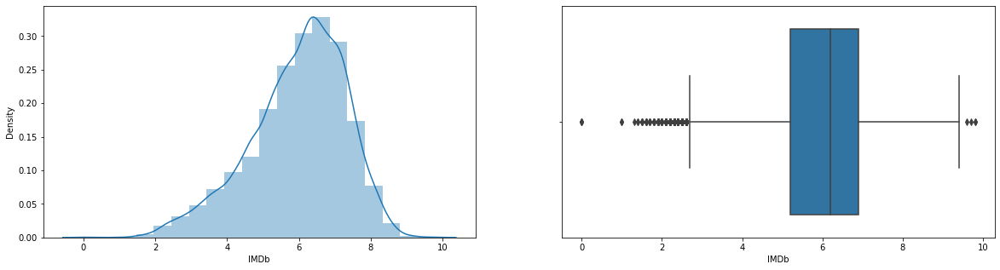

In [110]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(df_movies_imdb['IMDb'],bins = 20, kde = True, ax = ax[0])
sns.boxplot(df_movies_imdb['IMDb'], ax = ax[1])
plt.show()

In [111]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_imdb_movies = df_movies_imdb.loc[df_movies_imdb['Netflix'] == 1]
hulu_imdb_movies = df_movies_imdb.loc[df_movies_imdb['Hulu'] == 1]
prime_video_imdb_movies = df_movies_imdb.loc[df_movies_imdb['Prime Video'] == 1]
disney_imdb_movies = df_movies_imdb.loc[df_movies_imdb['Disney+'] == 1]

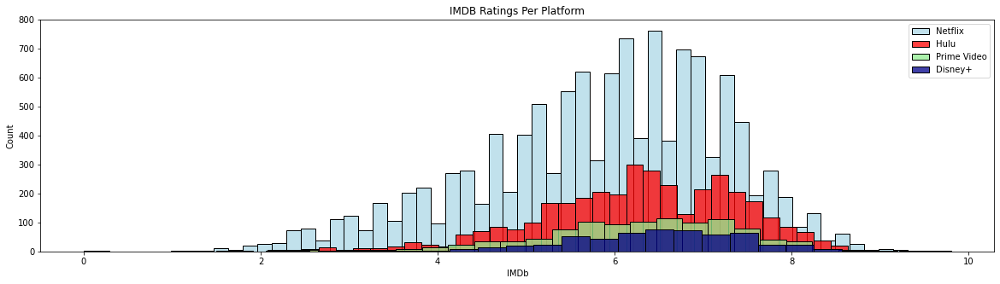

In [112]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('IMDB Ratings Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.histplot(prime_video_imdb_movies['IMDb'], color = 'lightblue', legend = True, kde = False)
sns.histplot(netflix_imdb_movies['IMDb'], color = 'red', legend = True, kde = False)
sns.histplot(hulu_imdb_movies['IMDb'], color = 'lightgreen', legend = True, kde = False)
sns.histplot(disney_imdb_movies['IMDb'], color = 'darkblue', legend = True, kde = False) 
 
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [113]:
print(f'''
      The TV Show with Highest IMDb Rating Ever Got is '{df_imdb_high_movies['Title'][0]}' : '{df_imdb_high_movies['IMDb'].max()}'\n
      The TV Show with Lowest IMDb Rating Ever Got is '{df_imdb_low_movies['Title'][0]}' : '{df_imdb_low_movies['IMDb'].min()}'\n
      
      The TV Show with Highest IMDb Rating on 'Netflix' is '{netflix_imdb_high_movies['Title'][0]}' : '{netflix_imdb_high_movies['IMDb'].max()}'\n
      The TV Show with Lowest IMDb Rating on 'Netflix' is '{netflix_imdb_low_movies['Title'][0]}' : '{netflix_imdb_low_movies['IMDb'].min()}'\n
      
      The TV Show with Highest IMDb Rating on 'Hulu' is '{hulu_imdb_high_movies['Title'][0]}' : '{hulu_imdb_high_movies['IMDb'].max()}'\n
      The TV Show with Lowest IMDb Rating on 'Hulu' is '{hulu_imdb_low_movies['Title'][0]}' : '{hulu_imdb_low_movies['IMDb'].min()}'\n
      
      The TV Show with Highest IMDb Rating on 'Prime Video' is '{prime_video_imdb_high_movies['Title'][0]}' : '{prime_video_imdb_high_movies['IMDb'].max()}'\n
      The TV Show with Lowest IMDb Rating on 'Prime Video' is '{prime_video_imdb_low_movies['Title'][0]}' : '{prime_video_imdb_low_movies['IMDb'].min()}'\n
      
      The TV Show with Highest IMDb Rating on 'Disney+' is '{disney_imdb_high_movies['Title'][0]}' : '{disney_imdb_high_movies['IMDb'].max()}'\n
      The TV Show with Lowest IMDb Rating on 'Disney+' is '{disney_imdb_low_movies['Title'][0]}' : '{disney_imdb_low_movies['IMDb'].min()}'\n 
      ''')


      The TV Show with Highest IMDb Rating Ever Got is 'Ostatni ludzie Czarnobyla' : '9.8'

      The TV Show with Lowest IMDb Rating Ever Got is 'In Memoriam Alexander Litvinenko' : '0.0'

      
      The TV Show with Highest IMDb Rating on 'Netflix' is 'God of War' : '9.6'

      The TV Show with Lowest IMDb Rating on 'Netflix' is 'Aerials' : '1.5'

      
      The TV Show with Highest IMDb Rating on 'Hulu' is 'Almost Impossible' : '9.7'

      The TV Show with Lowest IMDb Rating on 'Hulu' is '9/11: 15 years later' : '0.0'

      
      The TV Show with Highest IMDb Rating on 'Prime Video' is 'Ostatni ludzie Czarnobyla' : '9.8'

      The TV Show with Lowest IMDb Rating on 'Prime Video' is 'In Memoriam Alexander Litvinenko' : '0.0'

      
      The TV Show with Highest IMDb Rating on 'Disney+' is 'Marvel's Spider-Man' : '9.2'

      The TV Show with Lowest IMDb Rating on 'Disney+' is 'Jonas Brothers: The Concert Experience' : '1.6'
 
      


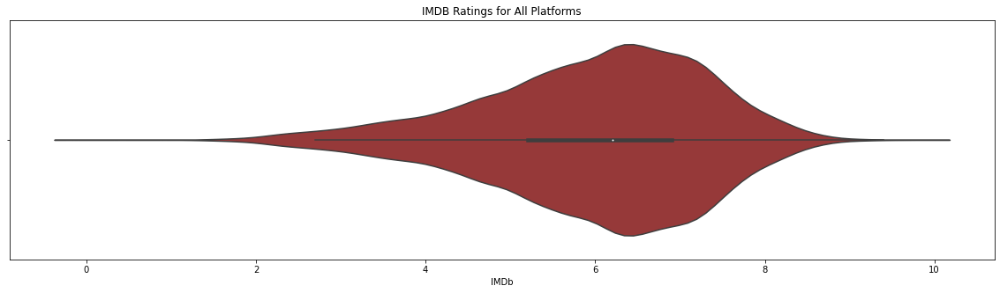

In [114]:
# Distribution of movies rating in each platform
plt.figure(figsize = (20, 5))
plt.title('IMDB Ratings for All Platforms')
sns.violinplot(x = df_movies_imdb['IMDb'], color = 'brown', legend = True, kde = True, shade = False)
plt.show()

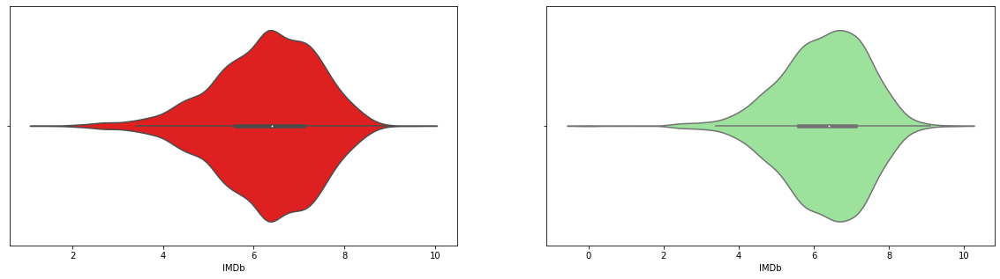

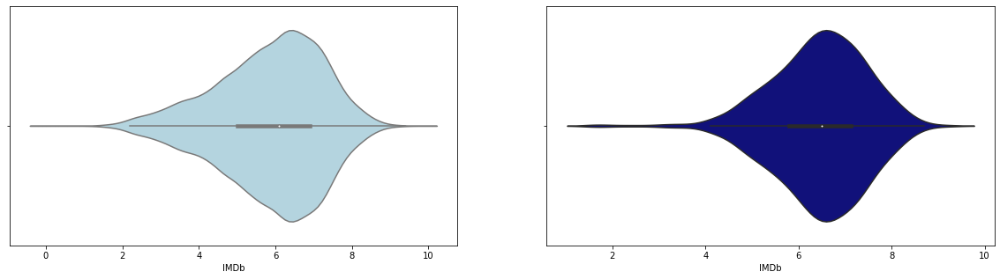

In [115]:
# Distribution of movies rating in each platform
f1, ax1 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = netflix_imdb_movies['IMDb'], color = 'red', ax = ax1[0])
sns.violinplot(x = hulu_imdb_movies['IMDb'], color = 'lightgreen', ax = ax1[1])
 
f2, ax2 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = prime_video_imdb_movies['IMDb'], color = 'lightblue', ax = ax2[0])
sns.violinplot(x = disney_imdb_movies['IMDb'], color = 'darkblue', ax = ax2[1])
plt.show()

In [116]:
print(f'''
      Accross All Platforms the Average IMDb Rating is '{round(df_movies_imdb['IMDb'].mean(), ndigits = 2)}'\n
      The Average IMDb Rating on 'Netflix' is '{round(netflix_imdb_movies['IMDb'].mean(), ndigits = 2)}'\n
      The Average IMDb Rating on 'Hulu' is '{round(hulu_imdb_movies['IMDb'].mean(), ndigits = 2)}'\n
      The Average IMDb Rating on 'Prime Video' is '{round(prime_video_imdb_movies['IMDb'].mean(), ndigits = 2)}'\n
      The Average IMDb Rating on 'Disney+' is '{round(disney_imdb_movies['IMDb'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average IMDb Rating is '5.98'

      The Average IMDb Rating on 'Netflix' is '6.28'

      The Average IMDb Rating on 'Hulu' is '6.28'

      The Average IMDb Rating on 'Prime Video' is '5.86'

      The Average IMDb Rating on 'Disney+' is '6.44'
 
      


In [117]:
def round_val(data):
    if str(data) != 'nan':
        return round(data)
    
df_movies_imdb['IMDB Group'] = df_movies_imdb['IMDb'].apply(round_val)
 
imdb_values = df_movies_imdb['IMDB Group'].value_counts().sort_index(ascending = False).tolist()
imdb_index = df_movies_imdb['IMDB Group'].value_counts().sort_index(ascending = False).index
 
imdb_values, imdb_index

([4, 94, 1771, 4286, 5328, 2692, 1586, 606, 220, 5, 3],
 Int64Index([10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0], dtype='int64'))

In [118]:
imdb_group_count = df_movies_imdb.groupby('IMDB Group')['Title'].count()
imdb_group_movies = df_movies_imdb.groupby('IMDB Group')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
imdb_group_data_movies = pd.concat([imdb_group_count, imdb_group_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
imdb_group_data_movies = imdb_group_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [119]:
# IMDB Group with Movies Counts - All Platforms Combined
imdb_group_data_movies.sort_values(by = 'Movies Count', ascending = False)

,IMDB Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
6,6,5328,1253,353,3742,201
7,7,4286,1040,323,2924,188
5,5,2692,509,157,2040,71
8,8,1771,489,134,1156,78
4,4,1586,216,57,1337,13
3,3,606,47,11,555,3
2,2,220,13,4,204,3
9,9,94,14,8,76,3
1,1,5,0,0,5,0
10,10,4,1,1,2,0


In [120]:
imdb_group_data_movies.sort_values(by = 'IMDB Group', ascending = False)

,IMDB Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
10,10,4,1,1,2,0
9,9,94,14,8,76,3
8,8,1771,489,134,1156,78
7,7,4286,1040,323,2924,188
6,6,5328,1253,353,3742,201
5,5,2692,509,157,2040,71
4,4,1586,216,57,1337,13
3,3,606,47,11,555,3
2,2,220,13,4,204,3
1,1,5,0,0,5,0


In [121]:
# IMDb with Movies Counts - All Platforms Combined
imdb_group_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]
 
df_imdb_group_high_movies = imdb_group_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_imdb_group_high_movies = df_imdb_group_high_movies.drop(['index'], axis = 1)
# filter = (imdb_group_data_movies['Movies Count'] ==  (imdb_group_data_movies['Movies Count'].max()))
# df_imdb_group_high_movies = imdb_group_data_movies[filter]
 
# highest_rated_movies = imdb_group_data_movies.loc[imdb_group_data_movies['Movies Count'].idxmax()]
 
# print('\nIMDb with Highest Ever Movies Count are : All Platforms Combined\n')
# df_imdb_group_high_movies.head(5)
 
df_imdb_group_low_movies = imdb_group_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_imdb_group_low_movies = df_imdb_group_low_movies.drop(['index'], axis = 1)
# filter = (imdb_group_data_movies['Movies Count'] = =  (imdb_group_data_movies['Movies Count'].min()))
# df_imdb_group_low_movies = imdb_group_data_movies[filter]
 
# print('\nIMDb with Lowest Ever Movies Count are : All Platforms Combined\n')
# df_imdb_group_low_movies.head(5)

In [122]:
print(f'''
      Total '{df_movies_imdb['IMDB Group'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{imdb_group_data_movies['IMDB Group'].unique().shape[0]}' IMDB Group, They were Like this, \n
 
      {imdb_group_data_movies.sort_values(by = 'Movies Count', ascending = False)['IMDB Group'].unique()} etc. \n
 
      The IMDB Group with Highest Movies Count have '{imdb_group_data_movies['Movies Count'].max()}' Movies Available is '{df_imdb_group_high_movies['IMDB Group'][0]}', &\n
      The IMDB Group with Lowest Movies Count have '{imdb_group_data_movies['Movies Count'].min()}' Movies Available is '{df_imdb_group_low_movies['IMDB Group'][0]}'
      ''')


      Total '16595' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '11' IMDB Group, They were Like this, 

 
      [ 6  7  5  8  4  3  2  9  1 10  0] etc. 

 
      The IMDB Group with Highest Movies Count have '5328' Movies Available is '6', &

      The IMDB Group with Lowest Movies Count have '3' Movies Available is '0'
      


In [123]:
fig = px.pie(imdb_group_data_movies[:10], names = 'IMDB Group', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDB Group s')
fig.show()

In [124]:
netflix_imdb_group_movies = imdb_group_data_movies[imdb_group_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_imdb_group_movies = netflix_imdb_group_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_imdb_group_high_movies = df_imdb_group_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_imdb_group_high_movies = netflix_imdb_group_high_movies.drop(['index'], axis = 1)
 
netflix_imdb_group_low_movies = df_imdb_group_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_imdb_group_low_movies = netflix_imdb_group_low_movies.drop(['index'], axis = 1)
 
netflix_imdb_group_high_movies.head(5)

,IMDB Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,6,5328,1253,353,3742,201
1,7,4286,1040,323,2924,188
2,5,2692,509,157,2040,71
3,8,1771,489,134,1156,78
4,4,1586,216,57,1337,13


In [125]:
hulu_imdb_group_movies = imdb_group_data_movies[imdb_group_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_imdb_group_movies = hulu_imdb_group_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_imdb_group_high_movies = df_imdb_group_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_imdb_group_high_movies = hulu_imdb_group_high_movies.drop(['index'], axis = 1)
 
hulu_imdb_group_low_movies = df_imdb_group_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_imdb_group_low_movies = hulu_imdb_group_low_movies.drop(['index'], axis = 1)
 
hulu_imdb_group_high_movies.head(5)

,IMDB Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,6,5328,1253,353,3742,201
1,7,4286,1040,323,2924,188
2,5,2692,509,157,2040,71
3,8,1771,489,134,1156,78
4,4,1586,216,57,1337,13


In [126]:
prime_video_imdb_group_movies = imdb_group_data_movies[imdb_group_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_imdb_group_movies = prime_video_imdb_group_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_imdb_group_high_movies = df_imdb_group_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_imdb_group_high_movies = prime_video_imdb_group_high_movies.drop(['index'], axis = 1)
 
prime_video_imdb_group_low_movies = df_imdb_group_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_imdb_group_low_movies = prime_video_imdb_group_low_movies.drop(['index'], axis = 1)
 
prime_video_imdb_group_high_movies.head(5)

,IMDB Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,6,5328,1253,353,3742,201
1,7,4286,1040,323,2924,188
2,5,2692,509,157,2040,71
3,4,1586,216,57,1337,13
4,8,1771,489,134,1156,78


In [127]:
disney_imdb_group_movies = imdb_group_data_movies[imdb_group_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_imdb_group_movies = disney_imdb_group_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_imdb_group_high_movies = df_imdb_group_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_imdb_group_high_movies = disney_imdb_group_high_movies.drop(['index'], axis = 1)
 
disney_imdb_group_low_movies = df_imdb_group_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_imdb_group_low_movies = disney_imdb_group_low_movies.drop(['index'], axis = 1)
 
disney_imdb_group_high_movies.head(5)

,IMDB Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,6,5328,1253,353,3742,201
1,7,4286,1040,323,2924,188
2,8,1771,489,134,1156,78
3,5,2692,509,157,2040,71
4,4,1586,216,57,1337,13


In [128]:
print(f'''
      The IMDB Group with Highest Movies Count Ever Got is '{df_imdb_group_high_movies['IMDB Group'][0]}' : '{df_imdb_group_high_movies['Movies Count'].max()}'\n
      The IMDB Group with Lowest Movies Count Ever Got is '{df_imdb_group_low_movies['IMDB Group'][0]}' : '{df_imdb_group_low_movies['Movies Count'].min()}'\n
      
      The IMDB Group with Highest Movies Count on 'Netflix' is '{netflix_imdb_group_high_movies['IMDB Group'][0]}' : '{netflix_imdb_group_high_movies['Netflix'].max()}'\n
      The IMDB Group with Lowest Movies Count on 'Netflix' is '{netflix_imdb_group_low_movies['IMDB Group'][0]}' : '{netflix_imdb_group_low_movies['Netflix'].min()}'\n
      
      The IMDB Group with Highest Movies Count on 'Hulu' is '{hulu_imdb_group_high_movies['IMDB Group'][0]}' : '{hulu_imdb_group_high_movies['Hulu'].max()}'\n
      The IMDB Group with Lowest Movies Count on 'Hulu' is '{hulu_imdb_group_low_movies['IMDB Group'][0]}' : '{hulu_imdb_group_low_movies['Hulu'].min()}'\n
      
      The IMDB Group with Highest Movies Count on 'Prime Video' is '{prime_video_imdb_group_high_movies['IMDB Group'][0]}' : '{prime_video_imdb_group_high_movies['Prime Video'].max()}'\n
      The IMDB Group with Lowest Movies Count on 'Prime Video' is '{prime_video_imdb_group_low_movies['IMDB Group'][0]}' : '{prime_video_imdb_group_low_movies['Prime Video'].min()}'\n
      
      The IMDB Group with Highest Movies Count on 'Disney+' is '{disney_imdb_group_high_movies['IMDB Group'][0]}' : '{disney_imdb_group_high_movies['Disney+'].max()}'\n
      The IMDB Group with Lowest Movies Count on 'Disney+' is '{disney_imdb_group_low_movies['IMDB Group'][0]}' : '{disney_imdb_group_low_movies['Disney+'].min()}'\n 
      ''')


      The IMDB Group with Highest Movies Count Ever Got is '6' : '5328'

      The IMDB Group with Lowest Movies Count Ever Got is '0' : '3'

      
      The IMDB Group with Highest Movies Count on 'Netflix' is '6' : '1253'

      The IMDB Group with Lowest Movies Count on 'Netflix' is '1' : '0'

      
      The IMDB Group with Highest Movies Count on 'Hulu' is '6' : '353'

      The IMDB Group with Lowest Movies Count on 'Hulu' is '1' : '0'

      
      The IMDB Group with Highest Movies Count on 'Prime Video' is '6' : '3742'

      The IMDB Group with Lowest Movies Count on 'Prime Video' is '10' : '2'

      
      The IMDB Group with Highest Movies Count on 'Disney+' is '6' : '201'

      The IMDB Group with Lowest Movies Count on 'Disney+' is '1' : '0'
 
      


In [129]:
print(f'''
      Accross All Platforms the Averimdb_group Movies Count of IMDB Group is '{round(imdb_group_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average imdb_group Movies Count of IMDB Group on 'Netflix' is '{round(netflix_imdb_group_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average imdb_group Movies Count of IMDB Group on 'Hulu' is '{round(hulu_imdb_group_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average imdb_group Movies Count of IMDB Group on 'Prime Video' is '{round(prime_video_imdb_group_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average imdb_group Movies Count of IMDB Group on 'Disney+' is '{round(disney_imdb_group_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Averimdb_group Movies Count of IMDB Group is '1508.64'

      The Average imdb_group Movies Count of IMDB Group on 'Netflix' is '398.0'

      The Average imdb_group Movies Count of IMDB Group on 'Hulu' is '104.9'

      The Average imdb_group Movies Count of IMDB Group on 'Prime Video' is '1094.82'

      The Average imdb_group Movies Count of IMDB Group on 'Disney+' is '70.0'
 
      


In [130]:
print(f'''
      Accross All Platforms Total Count of IMDB Group is '{imdb_group_data_movies['IMDB Group'].unique().shape[0]}'\n
      Total Count of IMDB Group on 'Netflix' is '{netflix_imdb_group_movies['IMDB Group'].unique().shape[0]}'\n
      Total Count of IMDB Group on 'Hulu' is '{hulu_imdb_group_movies['IMDB Group'].unique().shape[0]}'\n
      Total Count of IMDB Group on 'Prime Video' is '{prime_video_imdb_group_movies['IMDB Group'].unique().shape[0]}'\n
      Total Count of IMDB Group on 'Disney+' is '{disney_imdb_group_movies['IMDB Group'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of IMDB Group is '11'

      Total Count of IMDB Group on 'Netflix' is '9'

      Total Count of IMDB Group on 'Hulu' is '10'

      Total Count of IMDB Group on 'Prime Video' is '11'

      Total Count of IMDB Group on 'Disney+' is '8'
 
      


In [131]:
fig = px.bar(x = imdb_group_data_movies['IMDB Group'], y = imdb_group_data_movies['Movies Count'], 
             color = imdb_group_data_movies['Movies Count'], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'IMDB Group', 'y' : 'Number of Movies'})
fig.show()

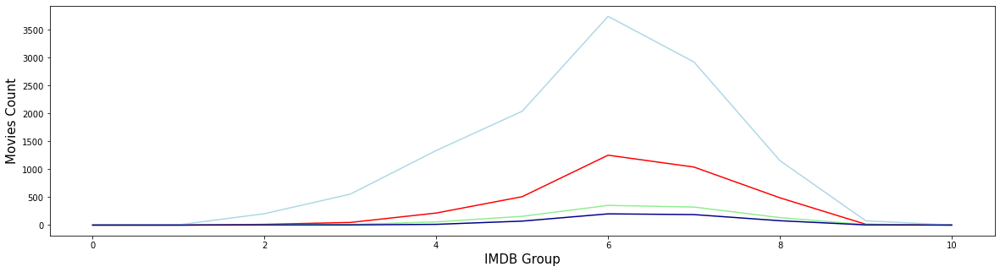

In [132]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = imdb_group_data_movies['IMDB Group'], y = imdb_group_data_movies['Netflix'], color = 'red')
sns.lineplot(x = imdb_group_data_movies['IMDB Group'], y = imdb_group_data_movies['Hulu'], color = 'lightgreen')
sns.lineplot(x = imdb_group_data_movies['IMDB Group'], y = imdb_group_data_movies['Prime Video'], color = 'lightblue')
sns.lineplot(x = imdb_group_data_movies['IMDB Group'], y = imdb_group_data_movies['Disney+'], color = 'darkblue')
plt.xlabel('IMDB Group', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

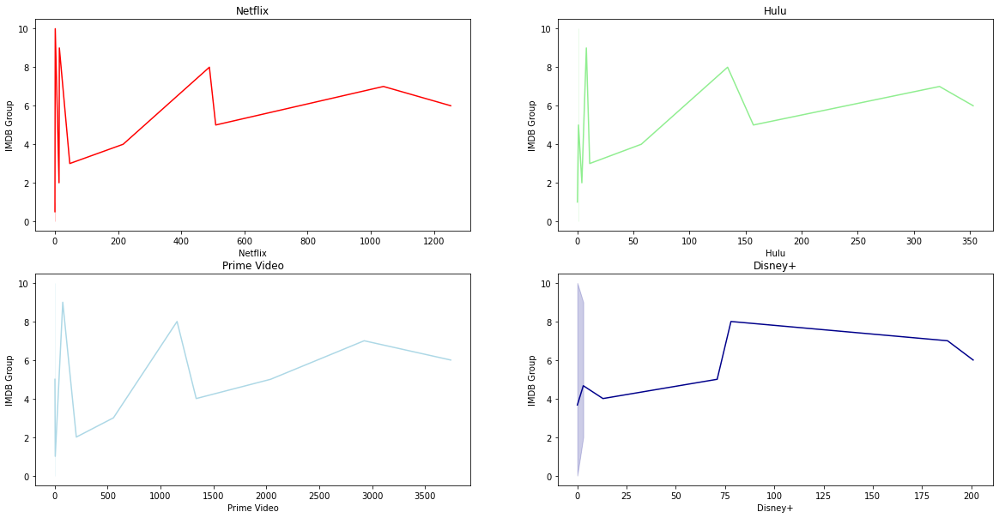

In [133]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_i_ax1 = sns.lineplot(y = imdb_group_data_movies['IMDB Group'], x = imdb_group_data_movies['Netflix'], color = 'red', ax = axes[0, 0])
h_i_ax2 = sns.lineplot(y = imdb_group_data_movies['IMDB Group'], x = imdb_group_data_movies['Hulu'], color = 'lightgreen', ax = axes[0, 1])
p_i_ax3 = sns.lineplot(y = imdb_group_data_movies['IMDB Group'], x = imdb_group_data_movies['Prime Video'], color = 'lightblue', ax = axes[1, 0])
d_i_ax4 = sns.lineplot(y = imdb_group_data_movies['IMDB Group'], x = imdb_group_data_movies['Disney+'], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_i_ax1.title.set_text(labels[0])
h_i_ax2.title.set_text(labels[1])
p_i_ax3.title.set_text(labels[2])
d_i_ax4.title.set_text(labels[3])
 
plt.show()

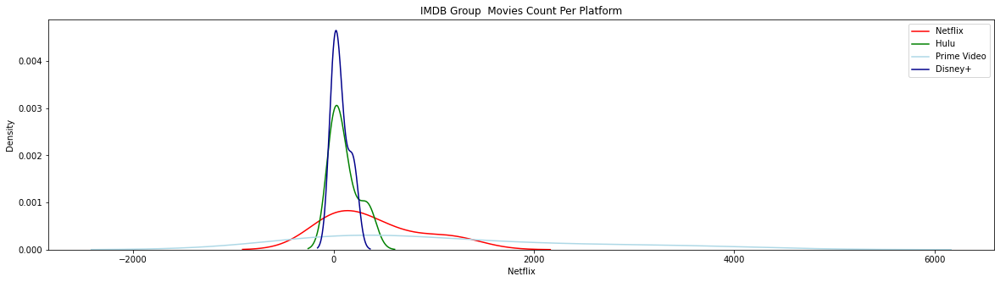

In [134]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('IMDB Group  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_imdb_group_movies['Netflix'], color = 'red', legend = True)
sns.kdeplot(hulu_imdb_group_movies['Hulu'], color = 'green', legend = True)
sns.kdeplot(prime_video_imdb_group_movies['Prime Video'], color = 'lightblue', legend = True)
sns.kdeplot(disney_imdb_group_movies['Disney+'], color = 'darkblue', legend = True)                                      

# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

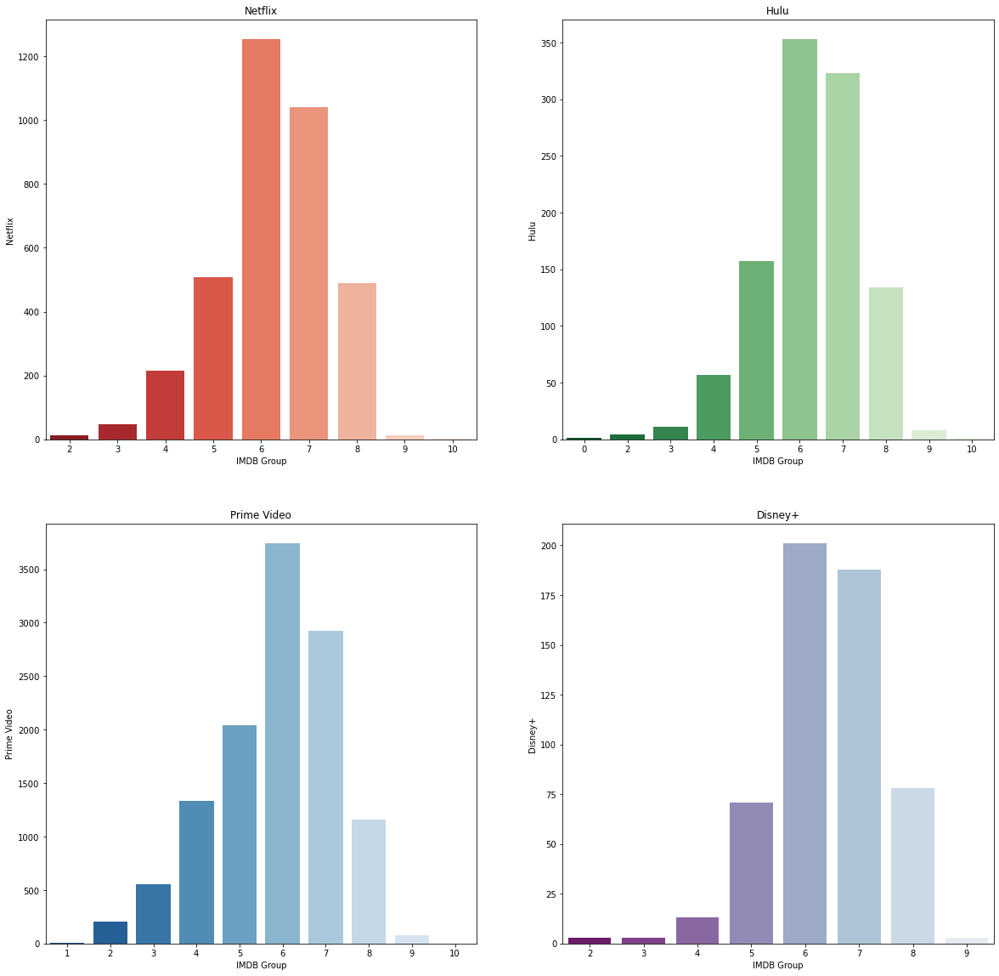

In [135]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_i_ax1 = sns.barplot(x = netflix_imdb_group_movies['IMDB Group'][:10], y = netflix_imdb_group_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_i_ax2 = sns.barplot(x = hulu_imdb_group_movies['IMDB Group'][:10], y = hulu_imdb_group_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_i_ax3 = sns.barplot(x = prime_video_imdb_group_movies['IMDB Group'][:10], y = prime_video_imdb_group_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_i_ax4 = sns.barplot(x = disney_imdb_group_movies['IMDB Group'][:10], y = disney_imdb_group_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_i_ax1.title.set_text(labels[0])
h_i_ax2.title.set_text(labels[1])
p_i_ax3.title.set_text(labels[2])
d_i_ax4.title.set_text(labels[3])
 
plt.show()

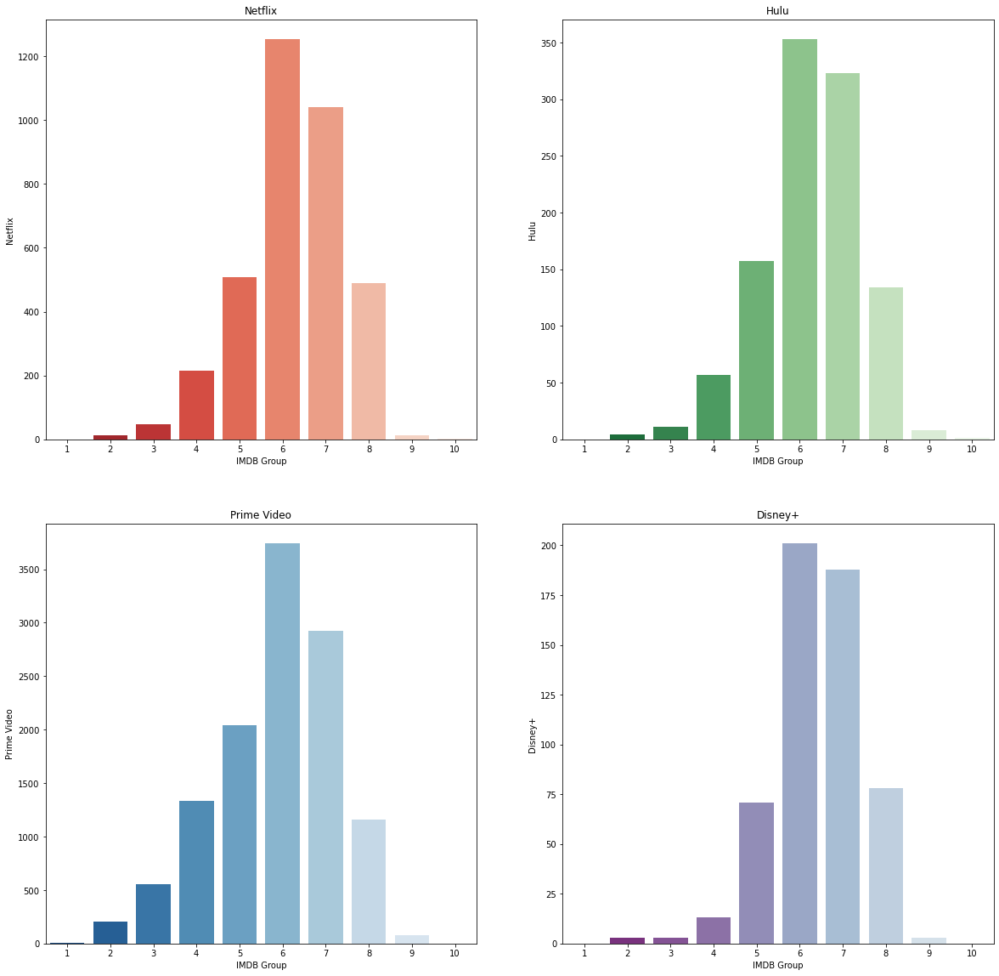

In [136]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_i_ax1 = sns.barplot(x = imdb_group_data_movies['IMDB Group'][:10], y = imdb_group_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_i_ax2 = sns.barplot(x = imdb_group_data_movies['IMDB Group'][:10], y = imdb_group_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_i_ax3 = sns.barplot(x = imdb_group_data_movies['IMDB Group'][:10], y = imdb_group_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_i_ax4 = sns.barplot(x = imdb_group_data_movies['IMDB Group'][:10], y = imdb_group_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_i_ax1.title.set_text(labels[0])
h_i_ax2.title.set_text(labels[1])
p_i_ax3.title.set_text(labels[2])
d_i_ax4.title.set_text(labels[3])
 
plt.show()

In [137]:
df_movies_roto = df_movies.copy()

In [138]:
df_movies_roto.drop(df_movies_roto.loc[df_movies_roto['Rotten Tomatoes'] == "NA"].index, inplace = True)
# df_movies_roto = df_movies_roto[df_movies_roto.Rotten Tomatoes != "NA"]
df_movies_roto['Rotten Tomatoes'] = df_movies_roto['Rotten Tomatoes'].astype(int)

In [139]:
df_roto_high_movies = df_movies_roto.sort_values(by = 'Rotten Tomatoes', ascending = False).reset_index()
df_roto_high_movies = df_roto_high_movies.drop(['index'], axis = 1)
# filter = (df_movies_roto['Rotten Tomatoes'] == (df_movies_roto['Rotten Tomatoes'].max()))
# df_roto_high_movies = df_movies_roto[filter]
 
# highest_rated_movies = df_movies_roto.loc[df_movies_roto['Rotten Tomatoes'].idxmax()]
 
print('\nMovies with Highest Ever Rotten Tomatoes Rating are : \n')
df_roto_high_movies.head(5)


Movies with Highest Ever Rotten Tomatoes Rating are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,4561,Pyaasa,1957,NR,8.5,100,Guru Dutt,"Guru Dutt,Waheeda Rehman,Mala Sinha,Rehman,Joh...","Drama,Musical,Romance",India,Hindi,Unemployed Vijay is the youngest in his family...,146,movie,0,0,1,0,0,Prime Video
1,4405,My Name Is Nobody,1973,7,7.5,100,Tonino Valerii,"Terence Hill,Henry Fonda,Jean Martin,R.G. Arms...","Comedy,Western","Italy,France,West Germany",Italian,"Jack Beauregard, once the greatest gunslinger ...",116,movie,0,0,1,0,0,Prime Video
2,5255,Racing Dreams,2010,7,7,100,Marshall Curry,"Annabeth Barnes,Josh Hobson,Brandon Warren,Rus...","Documentary,Sport",United States,English,Sidney Poitier returned to the big screen in t...,93,movie,0,0,1,0,0,Prime Video
3,5259,Shoot to Kill,1988,16,6.8,100,Roger Spottiswoode,"Sidney Poitier,Tom Berenger,Kirstie Alley,Clan...","Action,Adventure,Crime,Drama,Thriller","United States,Canada",English,"Down on his luck and perpetually impecunious, ...",110,movie,0,0,1,0,0,Prime Video
4,412,Ice Guardians,2016,NR,7.5,100,Brett Harvey,"Jay Baruchel,Jarome Iginla,Chris Chelios,Brett...","Documentary,Sport","Canada,Ireland,United States",English,NA,108,movie,1,0,0,0,0,Netflix


In [140]:
df_roto_low_movies = df_movies_roto.sort_values(by = 'Rotten Tomatoes', ascending = True).reset_index()
df_roto_low_movies = df_roto_low_movies.drop(['index'], axis = 1)
# filter = (df_movies_roto['Rotten Tomatoes'] == (df_movies_roto['Rotten Tomatoes'].min()))
# df_roto_low_movies = df_movies_roto[filter]
 
print('\nMovies with Lowest Ever Rotten Tomatoes Rating are : \n')
df_roto_low_movies.head(5)


Movies with Lowest Ever Rotten Tomatoes Rating are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,2015,Term Life,2016,16,5.6,0,Peter Billingsley,"Vince Vaughn,Hailee Steinfeld,Bill Paxton,Jona...","Action,Crime,Drama,Thriller",United States,English,NA,93,movie,1,0,0,0,0,Netflix
1,8168,Speed Kills,2018,16,4.3,0,Jodi Scurfield,"John Travolta,Katheryn Winnick,Jennifer Esposi...","Action,Crime,Drama,Thriller","Puerto Rico,United States","English,Spanish",NA,102,movie,0,0,1,0,0,Prime Video
2,3331,John Henry,2020,16,3.5,0,Will Forbes,"Terry Crews,Jamila Velazquez,Ludacris,Ken Fore...","Drama,Thriller",United States,English,Ex-gang member John Henry (Terry Crews) is a q...,91,movie,1,0,0,0,0,Netflix
3,1422,The Coldest Game,2019,18,6.2,0,Lukasz Kosmicki,"Bill Pullman,Lotte Verbeek,James Bloor,Robert ...","History,Sport,Thriller","Poland,United States","English,Russian",Playing a major chess match in Warsaw against ...,102,movie,1,0,0,0,0,Netflix
4,9800,Shadows & Lies,2010,16,4.3,0,Jay Anania,"James Franco,Julianne Nicholson,Martin Donovan...","Crime,Drama",United States,English,NA,100,movie,0,0,1,0,0,Prime Video


In [141]:
print(f'''
      Total '{df_movies_roto['Rotten Tomatoes'].unique().shape[0]}' unique Rotten Tomatoes Ratings were Given, They were Like this,\n
      
{df_movies_roto.sort_values(by = 'Rotten Tomatoes', ascending = False)['Rotten Tomatoes'].unique()}\n
 
      The Highest Ever Rotten Tomatoes Rating Ever Any TV Show Got is '{df_roto_high_movies['Title'][0]}' : '{df_roto_high_movies['Rotten Tomatoes'].max()}'\n
 
      The Lowest Ever Rotten Tomatoes Rating Ever Any TV Show Got is '{df_roto_low_movies['Title'][0]}' : '{df_roto_low_movies['Rotten Tomatoes'].min()}'\n
      ''')


      Total '101' unique Rotten Tomatoes Ratings were Given, They were Like this,

      
[100  99  98  97  96  95  94  93  92  91  90  89  88  87  86  85  84  83
  82  81  80  79  78  77  76  75  74  73  72  71  70  69  68  67  66  65
  64  63  62  61  60  59  58  57  56  55  54  53  52  51  50  49  48  47
  46  45  44  43  42  41  40  39  38  37  36  35  34  33  32  31  30  29
  28  27  26  25  24  23  22  21  20  19  18  17  16  15  14  13  12  11
  10   9   8   7   6   5   4   3   2   1   0]

 
      The Highest Ever Rotten Tomatoes Rating Ever Any TV Show Got is 'Pyaasa' : '100'

 
      The Lowest Ever Rotten Tomatoes Rating Ever Any TV Show Got is 'Term Life' : '0'

      


In [142]:
netflix_roto_high_movies = df_roto_high_movies.loc[df_roto_high_movies['Netflix']==1].reset_index()
netflix_roto_high_movies = netflix_roto_high_movies.drop(['index'], axis = 1)
 
netflix_roto_low_movies = df_roto_low_movies.loc[df_roto_low_movies['Netflix']==1].reset_index()
netflix_roto_low_movies = netflix_roto_low_movies.drop(['index'], axis = 1)
 
netflix_roto_high_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,412,Ice Guardians,2016,NR,7.5,100,Brett Harvey,"Jay Baruchel,Jarome Iginla,Chris Chelios,Brett...","Documentary,Sport","Canada,Ireland,United States",English,NA,108,movie,1,0,0,0,0,Netflix
1,2340,Maria Bamford: Old Baby,2017,18,6,100,Jessica Yu,"Maria Bamford,Rhea Butcher,Alex Blue Davis,Mel...","Documentary,Comedy",United States,English,NA,64,movie,1,0,0,0,0,Netflix
2,946,07:19,2016,NR,5.9,100,Jorge Michel Grau,"Carmen Beato,Demián Bichir,Héctor Bonilla,Octa...","Drama,History",Mexico,Spanish,Martin and Fernando are at the reception of th...,94,movie,1,0,0,0,0,Netflix
3,421,Shirkers,2018,NR,7.4,100,Sandi Tan,"Sandi Tan,Jasmine Kin Kia Ng,Philip Cheah,Soph...",Documentary,"United States,United Kingdom",English,"In 1992, teenager Sandi Tan and her friends So...",97,movie,1,0,0,0,0,Netflix
4,970,Restless Creature: Wendy Whelan,2017,NR,7.1,100,"Linda Saffire,Adam Schlesinger","Peter Martins,David Prottas,Wendy Whelan",Documentary,United States,English,NA,90,movie,1,0,0,0,0,Netflix


In [143]:
hulu_roto_high_movies = df_roto_high_movies.loc[df_roto_high_movies['Hulu']==1].reset_index()
hulu_roto_high_movies = hulu_roto_high_movies.drop(['index'], axis = 1)
 
hulu_roto_low_movies = df_roto_low_movies.loc[df_roto_low_movies['Hulu']==1].reset_index()
hulu_roto_low_movies = hulu_roto_low_movies.drop(['index'], axis = 1)
 
hulu_roto_high_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,3665,After the Screaming Stops,2018,18,7.2,100,"Joe Pearlman,David Soutar","Luke Goss,Matt Goss,Ron Perlman,Robin Antin,Ge...","Documentary,Music",United Kingdom,English,"In the 1980s, ""Bros"" were one of the biggest b...",98,movie,0,1,0,0,0,Hulu
1,3638,Andy Irons: Kissed by God,2018,NR,8.2,100,"Steve Jones,Todd Jones","Bruce Irons,Lyndie Irons,Kelly Slater",Documentary,United States,English,A film about bipolar disorder and opioid addic...,100,movie,0,1,1,0,0,Prime Video
2,3656,Burn,2012,16,5.7,100,Mike Gan,"Tilda Cobham-Hervey,Josh Hutcherson,Suki Water...","Comedy,Crime,Thriller",United States,English,NA,88,movie,0,1,1,0,0,Prime Video
3,3739,Food Evolution,2017,7,7,100,Scott Hamilton Kennedy,"Raoul Adamchak,Charles Benbrook,Karl Haro von ...",Documentary,United States,English,Food Evolution looks at one of the most critic...,92,movie,0,1,0,0,0,Hulu
4,3741,The Den,2013,16,6,100,Zachary Donohue,"Melanie Papalia,David Schlachtenhaufen,Adam Sh...","Horror,Mystery,Thriller",United States,English,A young woman studying the habits of webcam ch...,76,movie,0,1,0,0,0,Hulu


In [144]:
prime_video_roto_high_movies = df_roto_high_movies.loc[df_roto_high_movies['Prime Video']==1].reset_index()
prime_video_roto_high_movies = prime_video_roto_high_movies.drop(['index'], axis = 1)
 
prime_video_roto_low_movies = df_roto_low_movies.loc[df_roto_low_movies['Prime Video']==1].reset_index()
prime_video_roto_low_movies = prime_video_roto_low_movies.drop(['index'], axis = 1)
 
prime_video_roto_high_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,4561,Pyaasa,1957,NR,8.5,100,Guru Dutt,"Guru Dutt,Waheeda Rehman,Mala Sinha,Rehman,Joh...","Drama,Musical,Romance",India,Hindi,Unemployed Vijay is the youngest in his family...,146,movie,0,0,1,0,0,Prime Video
1,4405,My Name Is Nobody,1973,7,7.5,100,Tonino Valerii,"Terence Hill,Henry Fonda,Jean Martin,R.G. Arms...","Comedy,Western","Italy,France,West Germany",Italian,"Jack Beauregard, once the greatest gunslinger ...",116,movie,0,0,1,0,0,Prime Video
2,5255,Racing Dreams,2010,7,7,100,Marshall Curry,"Annabeth Barnes,Josh Hobson,Brandon Warren,Rus...","Documentary,Sport",United States,English,Sidney Poitier returned to the big screen in t...,93,movie,0,0,1,0,0,Prime Video
3,5259,Shoot to Kill,1988,16,6.8,100,Roger Spottiswoode,"Sidney Poitier,Tom Berenger,Kirstie Alley,Clan...","Action,Adventure,Crime,Drama,Thriller","United States,Canada",English,"Down on his luck and perpetually impecunious, ...",110,movie,0,0,1,0,0,Prime Video
4,10259,The Surface,2015,NR,4.8,100,Gil Cates Jr.,"Sean Astin,Mimi Rogers,Chris Mulkey,John Emmet...","Drama,Thriller",United States,English,NA,90,movie,0,0,1,0,0,Prime Video


In [145]:
disney_roto_high_movies = df_roto_high_movies.loc[df_roto_high_movies['Disney+']==1].reset_index()
disney_roto_high_movies = disney_roto_high_movies.drop(['index'], axis = 1)
 
disney_roto_low_movies = df_roto_low_movies.loc[df_roto_low_movies['Disney+']==1].reset_index()
disney_roto_low_movies = disney_roto_low_movies.drop(['index'], axis = 1)
 
disney_roto_high_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,Language,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider
0,15804,The Many Adventures of Winnie the Pooh,1977,0,7.6,100,"John Lounsbery,Wolfgang Reitherman,Ben Sharpsteen","Sebastian Cabot,Junius Matthews,Barbara Luddy,...","Animation,Adventure,Comedy,Family,Musical",United States,English,When young Victor's pet dog Sparky (who stars ...,74,movie,0,0,0,1,0,Disney+
1,15807,Mickey's Christmas Carol,1983,0,8,100,Burny Mattinson,"Alan Young,Wayne Allwine,Hal Smith,Will Ryan,E...","Animation,Short,Comedy,Family,Fantasy",United States,English,"Sam Flynn, the tech-savvy 27-year-old son of K...",26,movie,0,0,0,1,0,Disney+
2,15844,Old Yeller,1957,0,7.3,100,Robert Stevenson,"Dorothy McGuire,Fess Parker,Jeff York,Chuck Co...","Adventure,Drama,Family,Western",United States,English,Two stories. The Wind in the Willows: Concise ...,83,movie,0,0,0,1,0,Disney+
3,15846,Phineas and Ferb the Movie: Across the 2nd Dim...,2011,0,7.4,100,"Robert Hughes,Dan Povenmire,Jay Lender,Jeff 'S...","Vincent Martella,Ashley Tisdale,Thomas Brodie-...","Animation,Action,Adventure,Comedy,Family,Music...","United States,Taiwan,China","Mandarin,Chinese,Min Nan,English","During World War II in England, Charlie (Ian W...",78,movie,0,0,0,1,0,Disney+
4,15858,Tinker Bell and the Lost Treasure,2009,0,6.7,100,Klay Hall,"Mae Whitman,Jesse McCartney,Jane Horrocks,Lucy...","Animation,Adventure,Family,Fantasy",United States,English,A little girl comes to a town that is embattle...,81,movie,0,0,0,1,0,Disney+


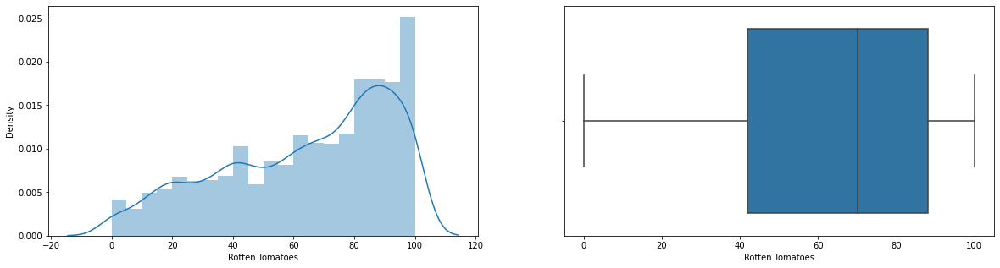

In [146]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(df_movies_roto['Rotten Tomatoes'],bins = 20, kde = True, ax = ax[0])
sns.boxplot(df_movies_roto['Rotten Tomatoes'], ax = ax[1])
plt.show()

In [147]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_roto_movies = df_movies_roto.loc[df_movies_roto['Netflix'] == 1]
hulu_roto_movies = df_movies_roto.loc[df_movies_roto['Hulu'] == 1]
prime_video_roto_movies = df_movies_roto.loc[df_movies_roto['Prime Video'] == 1]
disney_roto_movies = df_movies_roto.loc[df_movies_roto['Disney+'] == 1]

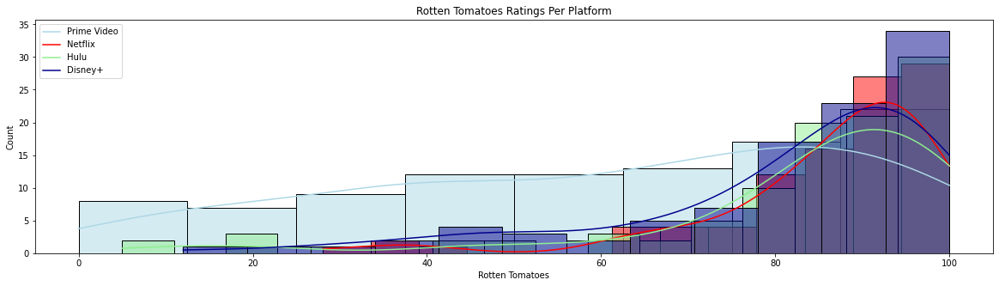

In [148]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Rotten Tomatoes Ratings Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.histplot(prime_video_roto_movies['Rotten Tomatoes'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_roto_movies['Rotten Tomatoes'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_roto_movies['Rotten Tomatoes'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_roto_movies['Rotten Tomatoes'][:100], color = 'darkblue', legend = True, kde = True) 
 
# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [149]:
print(f'''
      The TV Show with Highest Rotten Tomatoes Rating Ever Got is '{df_roto_high_movies['Title'][0]}' : '{df_roto_high_movies['Rotten Tomatoes'].max()}'\n
      The TV Show with Lowest Rotten Tomatoes Rating Ever Got is '{df_roto_low_movies['Title'][0]}' : '{df_roto_low_movies['Rotten Tomatoes'].min()}'\n
      
      The TV Show with Highest Rotten Tomatoes Rating on 'Netflix' is '{netflix_roto_high_movies['Title'][0]}' : '{netflix_roto_high_movies['Rotten Tomatoes'].max()}'\n
      The TV Show with Lowest Rotten Tomatoes Rating on 'Netflix' is '{netflix_roto_low_movies['Title'][0]}' : '{netflix_roto_low_movies['Rotten Tomatoes'].min()}'\n
      
      The TV Show with Highest Rotten Tomatoes Rating on 'Hulu' is '{hulu_roto_high_movies['Title'][0]}' : '{hulu_roto_high_movies['Rotten Tomatoes'].max()}'\n
      The TV Show with Lowest Rotten Tomatoes Rating on 'Hulu' is '{hulu_roto_low_movies['Title'][0]}' : '{hulu_roto_low_movies['Rotten Tomatoes'].min()}'\n
      
      The TV Show with Highest Rotten Tomatoes Rating on 'Prime Video' is '{prime_video_roto_high_movies['Title'][0]}' : '{prime_video_roto_high_movies['Rotten Tomatoes'].max()}'\n
      The TV Show with Lowest Rotten Tomatoes Rating on 'Prime Video' is '{prime_video_roto_low_movies['Title'][0]}' : '{prime_video_roto_low_movies['Rotten Tomatoes'].min()}'\n
      
      The TV Show with Highest Rotten Tomatoes Rating on 'Disney+' is '{disney_roto_high_movies['Title'][0]}' : '{disney_roto_high_movies['Rotten Tomatoes'].max()}'\n
      The TV Show with Lowest Rotten Tomatoes Rating on 'Disney+' is '{disney_roto_low_movies['Title'][0]}' : '{disney_roto_low_movies['Rotten Tomatoes'].min()}'\n 
      ''')


      The TV Show with Highest Rotten Tomatoes Rating Ever Got is 'Pyaasa' : '100'

      The TV Show with Lowest Rotten Tomatoes Rating Ever Got is 'Term Life' : '0'

      
      The TV Show with Highest Rotten Tomatoes Rating on 'Netflix' is 'Ice Guardians' : '100'

      The TV Show with Lowest Rotten Tomatoes Rating on 'Netflix' is 'Term Life' : '0'

      
      The TV Show with Highest Rotten Tomatoes Rating on 'Hulu' is 'After the Screaming Stops' : '100'

      The TV Show with Lowest Rotten Tomatoes Rating on 'Hulu' is 'Four Lovers' : '0'

      
      The TV Show with Highest Rotten Tomatoes Rating on 'Prime Video' is 'Pyaasa' : '100'

      The TV Show with Lowest Rotten Tomatoes Rating on 'Prime Video' is 'Speed Kills' : '0'

      
      The TV Show with Highest Rotten Tomatoes Rating on 'Disney+' is 'The Many Adventures of Winnie the Pooh' : '100'

      The TV Show with Lowest Rotten Tomatoes Rating on 'Disney+' is 'Mulan II' : '0'
 
      


In [150]:
print(f'''
      Accross All Platforms the Average Rotten Tomatoes Rating is '{round(df_movies_roto['Rotten Tomatoes'].mean(), ndigits = 2)}'\n
      The Average Rotten Tomatoes Rating on 'Netflix' is '{round(netflix_roto_movies['Rotten Tomatoes'].mean(), ndigits = 2)}'\n
      The Average Rotten Tomatoes Rating on 'Hulu' is '{round(hulu_roto_movies['Rotten Tomatoes'].mean(), ndigits = 2)}'\n
      The Average Rotten Tomatoes Rating on 'Prime Video' is '{round(prime_video_roto_movies['Rotten Tomatoes'].mean(), ndigits = 2)}'\n
      The Average Rotten Tomatoes Rating on 'Disney+' is '{round(disney_roto_movies['Rotten Tomatoes'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Rotten Tomatoes Rating is '63.95'

      The Average Rotten Tomatoes Rating on 'Netflix' is '64.64'

      The Average Rotten Tomatoes Rating on 'Hulu' is '65.85'

      The Average Rotten Tomatoes Rating on 'Prime Video' is '62.94'

      The Average Rotten Tomatoes Rating on 'Disney+' is '62.54'
 
      


In [151]:
def round_val(data):
    if str(data) != 'nan':
        return round(data)
        
def round_fix(data):
    if data in range(0,11):
        # print(data)
        return 10
    if data in range(11,21):
        return 20
    if data in range(21,31):
        return 30
    if data in range(31,41):
        return 40
    if data in range(41,51):
        return 50
    if data in range(51,61):
        return 60
    if data in range(61,71):
        return 70
    if data in range(71,81):
        return 80
    if data in range(81,91):
        return 90
    if data in range(91,101):
        return 100
    
df_movies_roto['Rotten Tomatoes Group'] = df_movies_roto['Rotten Tomatoes'].apply(round_fix)
 
roto_values = df_movies_roto['Rotten Tomatoes Group'].value_counts().sort_index(ascending = False).tolist()
roto_index = df_movies_roto['Rotten Tomatoes Group'].value_counts().sort_index(ascending = False).index
 
roto_values, roto_index

([1265, 1103, 844, 666, 528, 543, 510, 374, 389, 264],
 Int64Index([100, 90, 80, 70, 60, 50, 40, 30, 20, 10], dtype='int64'))

In [152]:
roto_group_count = df_movies_roto.groupby('Rotten Tomatoes Group')['Title'].count()
roto_group_movies = df_movies_roto.groupby('Rotten Tomatoes Group')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
roto_group_data_movies = pd.concat([roto_group_count, roto_group_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
roto_group_data_movies = roto_group_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [153]:
# Rotten Tomatoes Group with Movies Counts - All Platforms Combined
roto_group_data_movies.sort_values(by = 'Movies Count', ascending = False)

,Rotten Tomatoes Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
9,100,1265,386,128,746,61
8,90,1103,284,166,674,52
7,80,844,217,81,535,55
6,70,666,185,70,410,39
4,50,543,142,53,350,26
5,60,528,138,49,333,40
3,40,510,139,51,323,39
1,20,389,110,35,253,24
2,30,374,97,39,236,25
0,10,264,68,25,191,7


In [154]:
roto_group_data_movies.sort_values(by = 'Rotten Tomatoes Group', ascending = False)

,Rotten Tomatoes Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
9,100,1265,386,128,746,61
8,90,1103,284,166,674,52
7,80,844,217,81,535,55
6,70,666,185,70,410,39
5,60,528,138,49,333,40
4,50,543,142,53,350,26
3,40,510,139,51,323,39
2,30,374,97,39,236,25
1,20,389,110,35,253,24
0,10,264,68,25,191,7


In [155]:
df_roto_group_high_movies = roto_group_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_roto_group_high_movies = df_roto_group_high_movies.drop(['index'], axis = 1)
# filter = (roto_group_data_movies['Movies Count'] ==  (roto_group_data_movies['Movies Count'].max()))
# df_roto_group_high_movies = roto_group_data_movies[filter]
 
# highest_rated_movies = roto_group_data_movies.loc[roto_group_data_movies['Movies Count'].idxmax()]
 
# print('\nRotten Tomatoes with Highest Ever Movies Count are : All Platforms Combined\n')
# df_roto_group_high_movies.head(5)
 
df_roto_group_low_movies = roto_group_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_roto_group_low_movies = df_roto_group_low_movies.drop(['index'], axis = 1)
# filter = (roto_group_data_movies['Movies Count'] = =  (roto_group_data_movies['Movies Count'].min()))
# df_roto_group_low_movies = roto_group_data_movies[filter]
 
# print('\nRotten Tomatoes with Lowest Ever Movies Count are : All Platforms Combined\n')
# df_roto_group_low_movies.head(5)

In [156]:
print(f'''
      Total '{df_movies_roto['Rotten Tomatoes Group'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{roto_group_data_movies['Rotten Tomatoes Group'].unique().shape[0]}' Rotten Tomatoes Group, They were Like this, \n
 
      {roto_group_data_movies.sort_values(by = 'Movies Count', ascending = False)['Rotten Tomatoes Group'].unique()} etc. \n
 
      The Rotten Tomatoes Group with Highest Movies Count have '{roto_group_data_movies['Movies Count'].max()}' Movies Available is '{df_roto_group_high_movies['Rotten Tomatoes Group'][0]}', &\n
      The Rotten Tomatoes Group with Lowest Movies Count have '{roto_group_data_movies['Movies Count'].min()}' Movies Available is '{df_roto_group_low_movies['Rotten Tomatoes Group'][0]}'
      ''')


      Total '6486' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '10' Rotten Tomatoes Group, They were Like this, 

 
      [100  90  80  70  50  60  40  20  30  10] etc. 

 
      The Rotten Tomatoes Group with Highest Movies Count have '1265' Movies Available is '100', &

      The Rotten Tomatoes Group with Lowest Movies Count have '264' Movies Available is '10'
      


In [157]:
fig = px.pie(roto_group_data_movies[:10], names = 'Rotten Tomatoes Group', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on Rotten Tomatoes Group s')
fig.show()

In [158]:
netflix_roto_group_movies = roto_group_data_movies[roto_group_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_roto_group_movies = netflix_roto_group_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_roto_group_high_movies = df_roto_group_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_roto_group_high_movies = netflix_roto_group_high_movies.drop(['index'], axis = 1)
 
netflix_roto_group_low_movies = df_roto_group_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_roto_group_low_movies = netflix_roto_group_low_movies.drop(['index'], axis = 1)
 
netflix_roto_group_high_movies.head(5)

,Rotten Tomatoes Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,100,1265,386,128,746,61
1,90,1103,284,166,674,52
2,80,844,217,81,535,55
3,70,666,185,70,410,39
4,50,543,142,53,350,26


In [159]:
hulu_roto_group_movies = roto_group_data_movies[roto_group_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_roto_group_movies = hulu_roto_group_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_roto_group_high_movies = df_roto_group_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_roto_group_high_movies = hulu_roto_group_high_movies.drop(['index'], axis = 1)
 
hulu_roto_group_low_movies = df_roto_group_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_roto_group_low_movies = hulu_roto_group_low_movies.drop(['index'], axis = 1)
 
hulu_roto_group_high_movies.head(5)

,Rotten Tomatoes Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,90,1103,284,166,674,52
1,100,1265,386,128,746,61
2,80,844,217,81,535,55
3,70,666,185,70,410,39
4,50,543,142,53,350,26


In [160]:
prime_video_roto_group_movies = roto_group_data_movies[roto_group_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_roto_group_movies = prime_video_roto_group_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_roto_group_high_movies = df_roto_group_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_roto_group_high_movies = prime_video_roto_group_high_movies.drop(['index'], axis = 1)
 
prime_video_roto_group_low_movies = df_roto_group_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_roto_group_low_movies = prime_video_roto_group_low_movies.drop(['index'], axis = 1)
 
prime_video_roto_group_high_movies.head(5)

,Rotten Tomatoes Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,100,1265,386,128,746,61
1,90,1103,284,166,674,52
2,80,844,217,81,535,55
3,70,666,185,70,410,39
4,50,543,142,53,350,26


In [161]:
disney_roto_group_movies = roto_group_data_movies[roto_group_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_roto_group_movies = disney_roto_group_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_roto_group_high_movies = df_roto_group_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_roto_group_high_movies = disney_roto_group_high_movies.drop(['index'], axis = 1)
 
disney_roto_group_low_movies = df_roto_group_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_roto_group_low_movies = disney_roto_group_low_movies.drop(['index'], axis = 1)
 
disney_roto_group_high_movies.head(5)

,Rotten Tomatoes Group,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,100,1265,386,128,746,61
1,80,844,217,81,535,55
2,90,1103,284,166,674,52
3,60,528,138,49,333,40
4,70,666,185,70,410,39


In [162]:
print(f'''
      The Rotten Tomatoes Group with Highest Movies Count Ever Got is '{df_roto_group_high_movies['Rotten Tomatoes Group'][0]}' : '{df_roto_group_high_movies['Movies Count'].max()}'\n
      The Rotten Tomatoes Group with Lowest Movies Count Ever Got is '{df_roto_group_low_movies['Rotten Tomatoes Group'][0]}' : '{df_roto_group_low_movies['Movies Count'].min()}'\n
      
      The Rotten Tomatoes Group with Highest Movies Count on 'Netflix' is '{netflix_roto_group_high_movies['Rotten Tomatoes Group'][0]}' : '{netflix_roto_group_high_movies['Netflix'].max()}'\n
      The Rotten Tomatoes Group with Lowest Movies Count on 'Netflix' is '{netflix_roto_group_low_movies['Rotten Tomatoes Group'][0]}' : '{netflix_roto_group_low_movies['Netflix'].min()}'\n
      
      The Rotten Tomatoes Group with Highest Movies Count on 'Hulu' is '{hulu_roto_group_high_movies['Rotten Tomatoes Group'][0]}' : '{hulu_roto_group_high_movies['Hulu'].max()}'\n
      The Rotten Tomatoes Group with Lowest Movies Count on 'Hulu' is '{hulu_roto_group_low_movies['Rotten Tomatoes Group'][0]}' : '{hulu_roto_group_low_movies['Hulu'].min()}'\n
      
      The Rotten Tomatoes Group with Highest Movies Count on 'Prime Video' is '{prime_video_roto_group_high_movies['Rotten Tomatoes Group'][0]}' : '{prime_video_roto_group_high_movies['Prime Video'].max()}'\n
      The Rotten Tomatoes Group with Lowest Movies Count on 'Prime Video' is '{prime_video_roto_group_low_movies['Rotten Tomatoes Group'][0]}' : '{prime_video_roto_group_low_movies['Prime Video'].min()}'\n
      
      The Rotten Tomatoes Group with Highest Movies Count on 'Disney+' is '{disney_roto_group_high_movies['Rotten Tomatoes Group'][0]}' : '{disney_roto_group_high_movies['Disney+'].max()}'\n
      The Rotten Tomatoes Group with Lowest Movies Count on 'Disney+' is '{disney_roto_group_low_movies['Rotten Tomatoes Group'][0]}' : '{disney_roto_group_low_movies['Disney+'].min()}'\n 
      ''')


      The Rotten Tomatoes Group with Highest Movies Count Ever Got is '100' : '1265'

      The Rotten Tomatoes Group with Lowest Movies Count Ever Got is '10' : '264'

      
      The Rotten Tomatoes Group with Highest Movies Count on 'Netflix' is '100' : '386'

      The Rotten Tomatoes Group with Lowest Movies Count on 'Netflix' is '10' : '68'

      
      The Rotten Tomatoes Group with Highest Movies Count on 'Hulu' is '90' : '166'

      The Rotten Tomatoes Group with Lowest Movies Count on 'Hulu' is '10' : '25'

      
      The Rotten Tomatoes Group with Highest Movies Count on 'Prime Video' is '100' : '746'

      The Rotten Tomatoes Group with Lowest Movies Count on 'Prime Video' is '10' : '191'

      
      The Rotten Tomatoes Group with Highest Movies Count on 'Disney+' is '100' : '61'

      The Rotten Tomatoes Group with Lowest Movies Count on 'Disney+' is '10' : '7'
 
      


In [163]:
print(f'''
      Accross All Platforms the Averroto_group Movies Count of Rotten Tomatoes Group is '{round(roto_group_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average roto_group Movies Count of Rotten Tomatoes Group on 'Netflix' is '{round(netflix_roto_group_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average roto_group Movies Count of Rotten Tomatoes Group on 'Hulu' is '{round(hulu_roto_group_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average roto_group Movies Count of Rotten Tomatoes Group on 'Prime Video' is '{round(prime_video_roto_group_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average roto_group Movies Count of Rotten Tomatoes Group on 'Disney+' is '{round(disney_roto_group_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Averroto_group Movies Count of Rotten Tomatoes Group is '648.6'

      The Average roto_group Movies Count of Rotten Tomatoes Group on 'Netflix' is '176.6'

      The Average roto_group Movies Count of Rotten Tomatoes Group on 'Hulu' is '69.7'

      The Average roto_group Movies Count of Rotten Tomatoes Group on 'Prime Video' is '405.1'

      The Average roto_group Movies Count of Rotten Tomatoes Group on 'Disney+' is '36.8'
 
      


In [164]:
print(f'''
      Accross All Platforms Total Count of Rotten Tomatoes Group is '{roto_group_data_movies['Rotten Tomatoes Group'].unique().shape[0]}'\n
      Total Count of Rotten Tomatoes Group on 'Netflix' is '{netflix_roto_group_movies['Rotten Tomatoes Group'].unique().shape[0]}'\n
      Total Count of Rotten Tomatoes Group on 'Hulu' is '{hulu_roto_group_movies['Rotten Tomatoes Group'].unique().shape[0]}'\n
      Total Count of Rotten Tomatoes Group on 'Prime Video' is '{prime_video_roto_group_movies['Rotten Tomatoes Group'].unique().shape[0]}'\n
      Total Count of Rotten Tomatoes Group on 'Disney+' is '{disney_roto_group_movies['Rotten Tomatoes Group'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Rotten Tomatoes Group is '10'

      Total Count of Rotten Tomatoes Group on 'Netflix' is '10'

      Total Count of Rotten Tomatoes Group on 'Hulu' is '10'

      Total Count of Rotten Tomatoes Group on 'Prime Video' is '10'

      Total Count of Rotten Tomatoes Group on 'Disney+' is '10'
 
      


In [165]:
fig = px.bar(x = roto_group_data_movies['Rotten Tomatoes Group'], y = roto_group_data_movies['Movies Count'], 
             color = roto_group_data_movies['Movies Count'], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Rotten Tomatoes Group', 'y' : 'Number of Movies'})
fig.show()

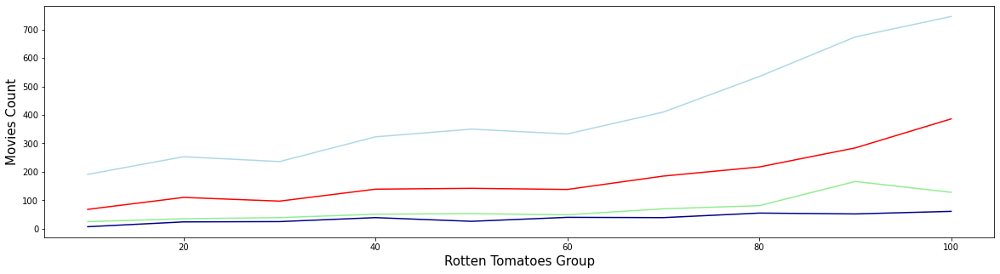

In [166]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = roto_group_data_movies['Rotten Tomatoes Group'], y = roto_group_data_movies['Netflix'], color = 'red')
sns.lineplot(x = roto_group_data_movies['Rotten Tomatoes Group'], y = roto_group_data_movies['Hulu'], color = 'lightgreen')
sns.lineplot(x = roto_group_data_movies['Rotten Tomatoes Group'], y = roto_group_data_movies['Prime Video'], color = 'lightblue')
sns.lineplot(x = roto_group_data_movies['Rotten Tomatoes Group'], y = roto_group_data_movies['Disney+'], color = 'darkblue')
plt.xlabel('Rotten Tomatoes Group', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

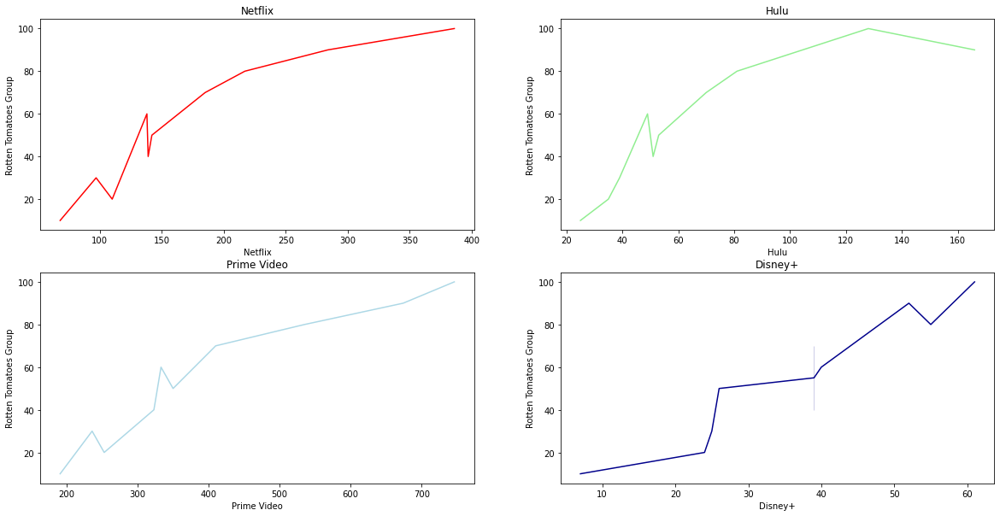

In [167]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_r_ax1 = sns.lineplot(y = roto_group_data_movies['Rotten Tomatoes Group'], x = roto_group_data_movies['Netflix'], color = 'red', ax = axes[0, 0])
h_r_ax2 = sns.lineplot(y = roto_group_data_movies['Rotten Tomatoes Group'], x = roto_group_data_movies['Hulu'], color = 'lightgreen', ax = axes[0, 1])
p_r_ax3 = sns.lineplot(y = roto_group_data_movies['Rotten Tomatoes Group'], x = roto_group_data_movies['Prime Video'], color = 'lightblue', ax = axes[1, 0])
d_r_ax4 = sns.lineplot(y = roto_group_data_movies['Rotten Tomatoes Group'], x = roto_group_data_movies['Disney+'], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_r_ax1.title.set_text(labels[0])
h_r_ax2.title.set_text(labels[1])
p_r_ax3.title.set_text(labels[2])
d_r_ax4.title.set_text(labels[3])
 
plt.show()

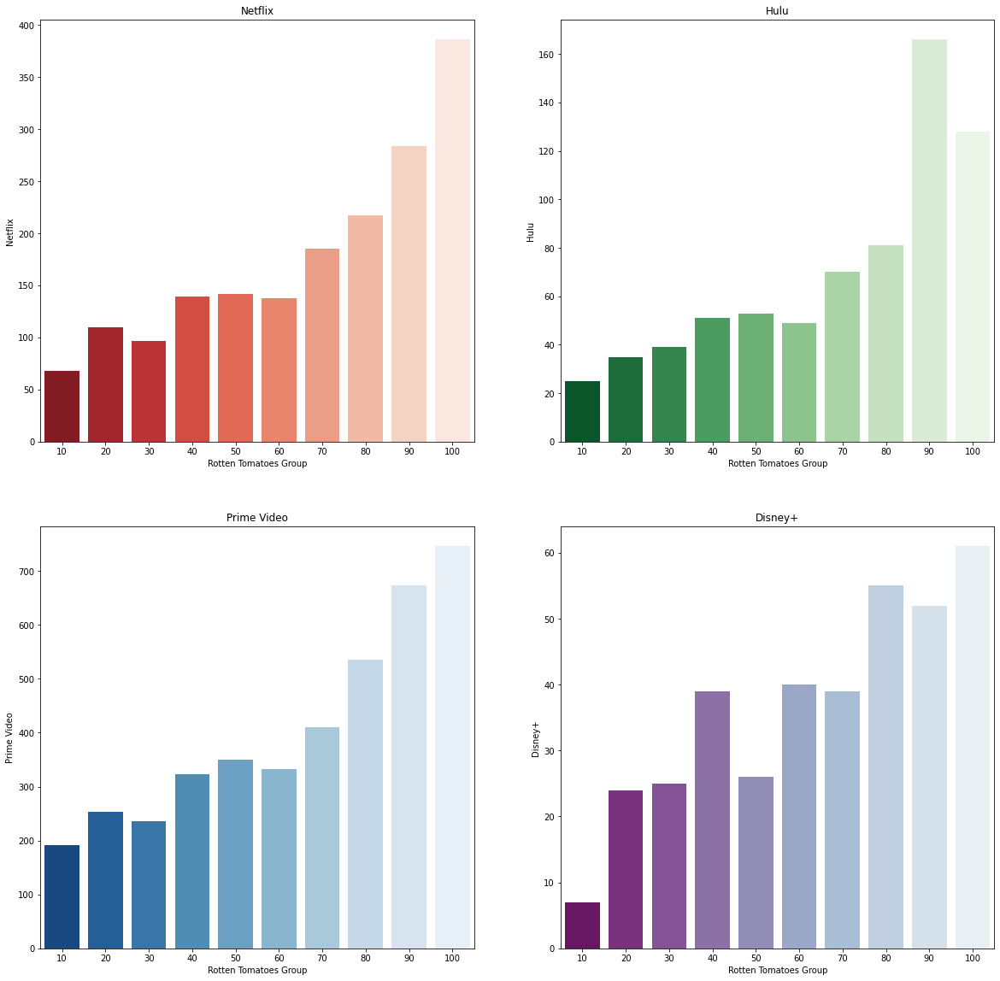

In [168]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_r_ax1 = sns.barplot(x = netflix_roto_group_movies['Rotten Tomatoes Group'][:10], y = netflix_roto_group_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_r_ax2 = sns.barplot(x = hulu_roto_group_movies['Rotten Tomatoes Group'][:10], y = hulu_roto_group_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_r_ax3 = sns.barplot(x = prime_video_roto_group_movies['Rotten Tomatoes Group'][:10], y = prime_video_roto_group_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_r_ax4 = sns.barplot(x = disney_roto_group_movies['Rotten Tomatoes Group'][:10], y = disney_roto_group_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_r_ax1.title.set_text(labels[0])
h_r_ax2.title.set_text(labels[1])
p_r_ax3.title.set_text(labels[2])
d_r_ax4.title.set_text(labels[3])
 
plt.show()

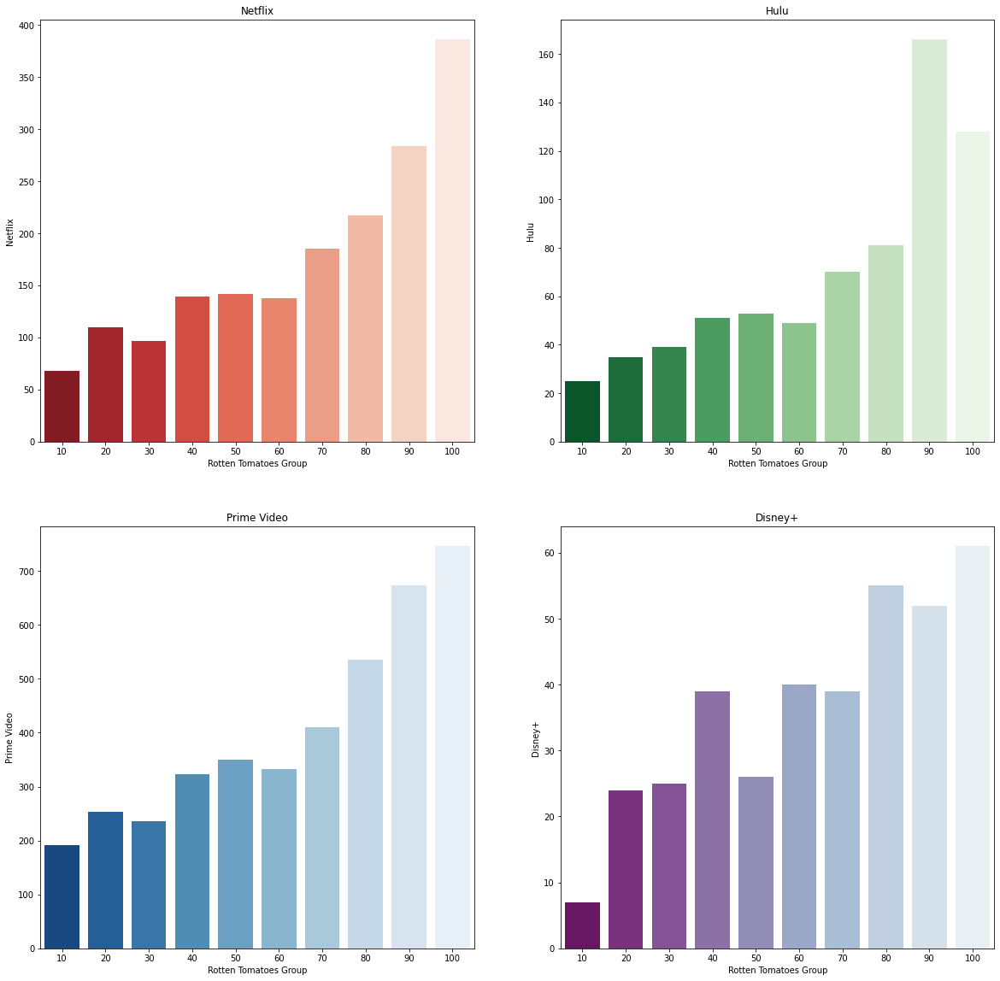

In [169]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_r_ax1 = sns.barplot(x = roto_group_data_movies['Rotten Tomatoes Group'][:10], y = roto_group_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_r_ax2 = sns.barplot(x = roto_group_data_movies['Rotten Tomatoes Group'][:10], y = roto_group_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_r_ax3 = sns.barplot(x = roto_group_data_movies['Rotten Tomatoes Group'][:10], y = roto_group_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_r_ax4 = sns.barplot(x = roto_group_data_movies['Rotten Tomatoes Group'][:10], y = roto_group_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_r_ax1.title.set_text(labels[0])
h_r_ax2.title.set_text(labels[1])
p_r_ax3.title.set_text(labels[2])
d_r_ax4.title.set_text(labels[3])
 
plt.show()

In [170]:
df_movies_directors = df_movies.copy()

In [171]:
# Create directors dict where key=name and value=number of directors
 
directors = {}
 
for i in df_movies_directors['Directors'].dropna():
    if i != "NA":
        #print(i,len(i.split(',')))
        directors[i] = len(i.split(','))
    else:
        directors[i] = 0
    
# Add this information to our dataframe as a new column
 
df_movies_directors['Number of Directors'] = df_movies_directors['Directors'].map(directors).astype(int)

In [172]:
df_directors_most_movies = df_movies_directors.sort_values(by = 'Number of Directors', ascending = False).reset_index()
df_directors_most_movies = df_directors_most_movies.drop(['index'], axis = 1)
# filter = (df_movies_directors['Directors'] == (df_movies_directors['Number of Directors'].max()))
# df_directors_most_movies = df_movies_directors[filter]
 
# mostest_rated_movies = df_movies_directors.loc[df_movies_directors['Number of Directors'].idxmax()]
 
print('\nMovies with Highest Ever Directors Count are : \n')
df_directors_most_movies.head(5)


Movies with Highest Ever Directors Count are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Directors
0,11086,The Owner,2012,NR,6.9,NA,"Xavier Agudo,Ian Bonner,Michael Canzoniero,Fra...","Jorge Mario Agudelo,Chiraz Aich,Christine Altm...",Drama,"United States,Germany",...,NA,94,movie,0,0,1,0,0,Prime Video,28
1,12269,Fun Size Horror: Volume One,2015,NR,4.6,NA,"Bryan Chojnowski,Lisa J Dooley,Ned Ehrbar,Mali...","Tara Perry,Aidan Flynn,Guy Perry,Nev Scharrel,...",Horror,United States,...,"Alienated by her peers as a young girl, Scarle...",86,movie,0,0,1,0,0,Prime Video,18
2,11869,A Taste of Phobia,2018,NR,3.1,NA,"Domiziano Cristopharo,Jason Impey,Sunny King,S...","Lianne O'Shea,Kehinde Bankole,Roberta Gemma,Ma...",Horror,United Kingdom,...,Blending drama with the explanations of passio...,90,movie,0,0,1,0,0,Prime Video,17
3,359,Veronica,2017,16,4.3,79,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...","Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",Comedy,United States,...,"Ineffectual, 'has-been' film-maker (Dennis Qua...",94,movie,1,0,0,0,0,Netflix,13
4,4422,The Proposition,2005,16,4.3,85,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...","Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",Comedy,United States,...,"Ineffectual, 'has-been' film-maker (Dennis Qua...",94,movie,0,0,1,0,0,Prime Video,13


In [173]:
df_directors_least_movies = df_movies_directors.sort_values(by = 'Number of Directors', ascending = True).reset_index()
df_directors_least_movies = df_directors_least_movies.drop(['index'], axis = 1)
# filter = (df_movies_directors['Directors'] == (df_movies_directors['Number of Directors'].min()))
# df_directors_least_movies = df_movies_directors[filter]
 
print('\nMovies with Lowest Ever Directors Count are : \n')
df_directors_least_movies.head(5)


Movies with Lowest Ever Directors Count are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Directors
0,16923,Paradise Islands,2017,13,NA,NA,NA,NA,Drama,United States,...,NA,NA,movie,0,0,0,1,0,Disney+,0
1,15706,"Evening Waterfalls, 8 hours for sleep and medi...",2016,NR,NA,NA,NA,NA,NA,NA,...,A film where critics share their opinion of Me...,NA,movie,0,0,1,0,0,Prime Video,0
2,15705,Laughter Is Medicine,2018,16,3.9,NA,NA,Shannon DaQueen Butler,Comedy,United States,...,Although it can be difficult to detect the inf...,60,movie,0,0,1,0,0,Prime Video,0
3,15704,Snowsurf,2015,7,NA,NA,NA,NA,NA,NA,...,Murder Gardens is the story of Chase Washingto...,63,movie,0,0,1,0,0,Prime Video,0
4,15703,TurboDojo - Absinthe Films,2017,NR,NA,NA,NA,NA,NA,NA,...,NA,NA,movie,0,0,1,0,0,Prime Video,0


In [174]:
print(f'''
      Total '{df_movies_directors['Directors'].unique().shape[0]}' unique Directors are Available, They were Like this,\n
      
      {df_movies_directors.sort_values(by = 'Number of Directors', ascending = False)['Directors'].unique()[:5]} etc.\n
 
      The Highest Ever Directors Rating Ever Any TV Show Got is '{df_directors_most_movies['Title'][0]}' : '{df_directors_most_movies['Number of Directors'].max()}'\n
 
      The Lowest Ever Directors Rating Ever Any TV Show Got is '{df_directors_least_movies['Title'][0]}' : '{df_directors_least_movies['Number of Directors'].min()}'\n
      ''')


      Total '11615' unique Directors are Available, They were Like this,

      
      ['Xavier Agudo,Ian Bonner,Michael Canzoniero,Francois Coetzee,Mairtín de Barra,Todd Felderstein,Nicolas Fogliarini,Yango Gonzalez,Nino Leitner,Craig Lines,Vishesh Mankal,Varun Mathur,Steve Murphy,Asmit Pathare,Neha Raheja Thakker,Adam Ruszkowski,Alexander Schönauer,Sabine Sebaaly,Prashant Sehgal,Fahad Shaikh,Marty Shea,Brian Shephard,Nicole Sylvester,Arne V. Nostitz-Rieneck,John Versical,Rafael Yoshida,Reenita Malhotra,Giacomo Mantovani'
 'Bryan Chojnowski,Lisa J Dooley,Ned Ehrbar,Mali Elfman,Dick Grunert,Max Isaacson,Anthony Lund,Michael May,Glen Murakami,Grant Olin,Ali Presley Paras,Eric Pereira,Zeke Pinheiro,Jerry Pyle,Anisa Qureshi,Ben Rekhi,Erin Stegeman,Josh C. Waller'
 'Domiziano Cristopharo,Jason Impey,Sunny King,Sam Mason-Bell,Tony Newton,Poison Rouge,Alessandro Sisti,Rob Ulitski,Jackson Batchelor,Sophia Cacciola,Michael J. Epstein,Dustin Ferguson,Alessandro Giordani,Chris Milewski,Davide P

In [175]:
netflix_directors_most_movies = df_directors_most_movies.loc[df_directors_most_movies['Netflix']==1].reset_index()
netflix_directors_most_movies = netflix_directors_most_movies.drop(['index'], axis = 1)
 
netflix_directors_least_movies = df_directors_least_movies.loc[df_directors_least_movies['Netflix']==1].reset_index()
netflix_directors_least_movies = netflix_directors_least_movies.drop(['index'], axis = 1)
 
netflix_directors_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Directors
0,359,Veronica,2017,16,4.3,79,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...","Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",Comedy,United States,...,"Ineffectual, 'has-been' film-maker (Dennis Qua...",94,movie,1,0,0,0,0,Netflix,13
1,2358,"Berlin, I Love You",2019,16,4.6,11,"Dianna Agron,Peter Chelsom,Claus Clausen,Ferna...","Keira Knightley,Helen Mirren,Luke Wilson,Jim S...","Drama,Romance",Germany,...,NA,120,movie,1,0,0,0,0,Netflix,13
2,2267,Truth or Dare,2017,16,4.3,NA,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...","Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",Comedy,United States,...,"Ineffectual, 'has-been' film-maker (Dennis Qua...",94,movie,1,0,1,0,0,Netflix,13
3,2974,X: Past Is Present,2015,13,5.3,NA,"Hemant Gaba,Pratim D. Gupta,Sudhish Kamath,Nal...","Rajat Kapoor,Radhika Apte,Bidita Bag,Piaa Bajp...","Drama,Mystery,Romance",India,...,NA,105,movie,1,0,1,0,0,Netflix,11
4,660,Kahlil Gibran's The Prophet,2014,7,7.1,66,"Roger Allers,Gaëtan Brizzi,Paul Brizzi,Joan C....","Liam Neeson,Salma Hayek,John Krasinski,Frank L...","Animation,Drama","Qatar,France,Lebanon,Canada,United States,Irel...",...,NA,85,movie,1,0,0,0,0,Netflix,10


In [176]:
hulu_directors_most_movies = df_directors_most_movies.loc[df_directors_most_movies['Hulu']==1].reset_index()
hulu_directors_most_movies = hulu_directors_most_movies.drop(['index'], axis = 1)
 
hulu_directors_least_movies = df_directors_least_movies.loc[df_directors_least_movies['Hulu']==1].reset_index()
hulu_directors_least_movies = hulu_directors_least_movies.drop(['index'], axis = 1)
 
hulu_directors_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Directors
0,4032,Wakko's Wish,1999,0,7.3,NA,"Liz Holzman,Rusty Mills,Tom Ruegger,Russell Ca...","Rob Paulsen,Jess Harnell,Tress MacNeille,Mauri...","Animation,Adventure,Comedy,Drama,Family,Fantas...",United States,...,The Warner Brothers (and the Warner Sister) go...,80,movie,0,1,0,0,0,Hulu,8
1,3704,Southbound,2015,16,5.9,81,"Roxanne Benjamin,Matt Bettinelli-Olpin,David B...","Chad Villella,Matt Bettinelli-Olpin,Kristina P...",Horror,United States,...,"On a desolate stretch of desert highway, weary...",89,movie,0,1,1,0,0,Prime Video,8
2,3912,Tiny Toon Adventures: How I Spent My Vacation,1992,NR,8,NA,"Rich Arons,Ken Boyer,Kent Butterworth,Barry Ca...","Charlie Adler,Tress MacNeille,Joe Alaskey,Don ...","Animation,Adventure,Comedy,Family,Fantasy",United States,...,Term-time ends at Acme Looniversity and the Ti...,79,movie,0,1,0,0,0,Hulu,7
3,16501,Victoria's Secret Fashion Show,1999,7,7.6,NA,"Hamish Hamilton,Yemisi Brookes,Dee Koppang O'L...","Behati Prinsloo,Adriana Lima,Alessandra Ambros...",Reality-TV,United States,...,Shinichi Kanou is a young secluded Otaku who i...,45,movie,0,1,0,0,0,Hulu,4
4,3861,Planet 51,2009,7,6,23,"Jorge Blanco,Javier Abad,Marcos Martínez","Dwayne Johnson,Jessica Biel,Justin Long,Gary O...","Animation,Adventure,Comedy,Family,Sci-Fi","Spain,United Kingdom,United States",...,Lem is just an average teenager working on get...,91,movie,0,1,0,0,0,Hulu,3


In [177]:
prime_video_directors_most_movies = df_directors_most_movies.loc[df_directors_most_movies['Prime Video']==1].reset_index()
prime_video_directors_most_movies = prime_video_directors_most_movies.drop(['index'], axis = 1)
 
prime_video_directors_least_movies = df_directors_least_movies.loc[df_directors_least_movies['Prime Video']==1].reset_index()
prime_video_directors_least_movies = prime_video_directors_least_movies.drop(['index'], axis = 1)
 
prime_video_directors_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Directors
0,11086,The Owner,2012,NR,6.9,NA,"Xavier Agudo,Ian Bonner,Michael Canzoniero,Fra...","Jorge Mario Agudelo,Chiraz Aich,Christine Altm...",Drama,"United States,Germany",...,NA,94,movie,0,0,1,0,0,Prime Video,28
1,12269,Fun Size Horror: Volume One,2015,NR,4.6,NA,"Bryan Chojnowski,Lisa J Dooley,Ned Ehrbar,Mali...","Tara Perry,Aidan Flynn,Guy Perry,Nev Scharrel,...",Horror,United States,...,"Alienated by her peers as a young girl, Scarle...",86,movie,0,0,1,0,0,Prime Video,18
2,11869,A Taste of Phobia,2018,NR,3.1,NA,"Domiziano Cristopharo,Jason Impey,Sunny King,S...","Lianne O'Shea,Kehinde Bankole,Roberta Gemma,Ma...",Horror,United Kingdom,...,Blending drama with the explanations of passio...,90,movie,0,0,1,0,0,Prime Video,17
3,4422,The Proposition,2005,16,4.3,85,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...","Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",Comedy,United States,...,"Ineffectual, 'has-been' film-maker (Dennis Qua...",94,movie,0,0,1,0,0,Prime Video,13
4,8445,Happy Birthday,2016,16,4.3,20,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...","Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",Comedy,United States,...,In this unearthed lost movie from 1990 that th...,94,movie,0,0,1,0,0,Prime Video,13


In [178]:
disney_directors_most_movies = df_directors_most_movies.loc[df_directors_most_movies['Disney+']==1].reset_index()
disney_directors_most_movies = disney_directors_most_movies.drop(['index'], axis = 1)
 
disney_directors_least_movies = df_directors_least_movies.loc[df_directors_least_movies['Disney+']==1].reset_index()
disney_directors_least_movies = disney_directors_least_movies.drop(['index'], axis = 1)
 
disney_directors_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Directors
0,15786,Fantasia,1940,0,7.7,95,"James Algar,Samuel Armstrong,Ford Beebe Jr.,No...","Deems Taylor,Leopold Stokowski,The Philadelphi...","Animation,Family,Fantasy,Music,Musical",United States,...,"Alice, an unpretentious and individual 19-year...",125,movie,0,0,0,1,0,Disney+,12
1,15797,Bambi,1942,0,7.3,90,"James Algar,Samuel Armstrong,David Hand,Graham...","Hardie Albright,Stan Alexander,Bobette Audrey,...","Animation,Drama,Family",United States,...,When two pre-teens named Hallie and Annie meet...,70,movie,0,0,0,1,0,Disney+,9
2,16077,Belle's Magical World,1998,0,5.3,17,"Bob Kline,Cullen Blaine,Dale Case,Daniel de la...","Jeff Bennett,Robby Benson,Paige O'Hara,Jim Cum...","Animation,Comedy,Family,Fantasy,Musical,Romance",United States,...,"Robbie, the master's baby, has been mysterious...",92,movie,0,0,0,1,0,Disney+,8
3,15835,Fantasia 2000,1999,0,7.2,81,"James Algar,Gaëtan Brizzi,Paul Brizzi,Hendel B...","Steve Martin,Itzhak Perlman,Quincy Jones,Bette...","Animation,Comedy,Family,Fantasy,Music",United States,...,Captain Jack Sparrow (Johnny Depp) crosses pat...,75,movie,0,0,0,1,0,Disney+,8
4,15777,Snow White and the Seven Dwarfs,1937,0,7.6,98,"William Cottrell,David Hand,Wilfred Jackson,La...","Roy Atwell,Stuart Buchanan,Adriana Caselotti,E...","Animation,Family,Fantasy,Musical,Romance",United States,...,NA,83,movie,0,0,0,1,0,Disney+,6


In [179]:
print(f'''
      The TV Show with Highest Director Count Ever Got is '{df_directors_most_movies['Title'][0]}' : '{df_directors_most_movies['Number of Directors'].max()}'\n
      The TV Show with Lowest Director Count Ever Got is '{df_directors_least_movies['Title'][0]}' : '{df_directors_least_movies['Number of Directors'].min()}'\n
      
      The TV Show with Highest Director Count on 'Netflix' is '{netflix_directors_most_movies['Title'][0]}' : '{netflix_directors_most_movies['Number of Directors'].max()}'\n
      The TV Show with Lowest Director Count on 'Netflix' is '{netflix_directors_least_movies['Title'][0]}' : '{netflix_directors_least_movies['Number of Directors'].min()}'\n
      
      The TV Show with Highest Director Count on 'Hulu' is '{hulu_directors_most_movies['Title'][0]}' : '{hulu_directors_most_movies['Number of Directors'].max()}'\n
      The TV Show with Lowest Director Count on 'Hulu' is '{hulu_directors_least_movies['Title'][0]}' : '{hulu_directors_least_movies['Number of Directors'].min()}'\n
      
      The TV Show with Highest Director Count on 'Prime Video' is '{prime_video_directors_most_movies['Title'][0]}' : '{prime_video_directors_most_movies['Number of Directors'].max()}'\n
      The TV Show with Lowest Director Count on 'Prime Video' is '{prime_video_directors_least_movies['Title'][0]}' : '{prime_video_directors_least_movies['Number of Directors'].min()}'\n
      
      The TV Show with Highest Director Count on 'Disney+' is '{disney_directors_most_movies['Title'][0]}' : '{disney_directors_most_movies['Number of Directors'].max()}'\n
      The TV Show with Lowest Director Count on 'Disney+' is '{disney_directors_least_movies['Title'][0]}' : '{disney_directors_least_movies['Number of Directors'].min()}'\n 
      ''')


      The TV Show with Highest Director Count Ever Got is 'The Owner' : '28'

      The TV Show with Lowest Director Count Ever Got is 'Paradise Islands' : '0'

      
      The TV Show with Highest Director Count on 'Netflix' is 'Veronica' : '13'

      The TV Show with Lowest Director Count on 'Netflix' is '2015 Dream Concert' : '0'

      
      The TV Show with Highest Director Count on 'Hulu' is 'Wakko's Wish' : '8'

      The TV Show with Lowest Director Count on 'Hulu' is 'Oddbods: Party Monsters' : '0'

      
      The TV Show with Highest Director Count on 'Prime Video' is 'The Owner' : '28'

      The TV Show with Lowest Director Count on 'Prime Video' is 'Evening Waterfalls, 8 hours for sleep and meditation ultra dark' : '0'

      
      The TV Show with Highest Director Count on 'Disney+' is 'Fantasia' : '12'

      The TV Show with Lowest Director Count on 'Disney+' is 'Paradise Islands' : '0'
 
      


In [180]:
print(f'''
      Accross All Platforms the Average Director Count is '{round(df_movies_directors['Number of Directors'].mean(), ndigits = 2)}'\n
      The Average Director Count on 'Netflix' is '{round(netflix_directors_most_movies['Number of Directors'].mean(), ndigits = 2)}'\n
      The Average Director Count on 'Hulu' is '{round(hulu_directors_most_movies['Number of Directors'].mean(), ndigits = 2)}'\n
      The Average Director Count on 'Prime Video' is '{round(prime_video_directors_most_movies['Number of Directors'].mean(), ndigits = 2)}'\n
      The Average Director Count on 'Disney+' is '{round(disney_directors_most_movies['Number of Directors'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Director Count is '1.11'

      The Average Director Count on 'Netflix' is '1.12'

      The Average Director Count on 'Hulu' is '1.1'

      The Average Director Count on 'Prime Video' is '1.1'

      The Average Director Count on 'Disney+' is '1.33'
 
      


In [181]:
print(f'''
      Accross All Platforms Total Count of Directors is '{df_movies_directors['Directors'].unique().shape[0]}'\n
      Total Count of Directors on 'Netflix' is '{netflix_directors_most_movies['Directors'].unique().shape[0]}'\n
      Total Count of Directors on 'Hulu' is '{hulu_directors_most_movies['Directors'].unique().shape[0]}'\n
      Total Count of Directors on 'Prime Video' is '{prime_video_directors_most_movies['Directors'].unique().shape[0]}'\n
      Total Count of Directors on 'Disney+' is '{disney_directors_most_movies['Directors'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Directors is '11615'

      Total Count of Directors on 'Netflix' is '2825'

      Total Count of Directors on 'Hulu' is '961'

      Total Count of Directors on 'Prime Video' is '8988'

      Total Count of Directors on 'Disney+' is '412'
 
      


In [182]:
df_movies_directors.drop(df_movies_directors.loc[df_movies_directors['Directors'] == "NA"].index, inplace = True)
# df_movies_directors = df_movies_directors[df_movies_directors.Directors != "NA"]

In [183]:
df_movies_mixed_directors = df_movies_directors.copy()

In [184]:
df_dirs = df_movies_directors['Directors'].str.split(',').apply(pd.Series).stack()
del df_movies_directors['Directors']
df_dirs.index = df_dirs.index.droplevel(-1)
df_dirs.name = 'Directors'
df_movies_directors = df_movies_directors.join(df_dirs)
df_movies_directors.drop_duplicates(inplace=True)

In [185]:
df_movies_directors.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Cast,Genres,Country,Language,...,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Directors,Directors
0,1,Inception,2010,13,8.8,87,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,1,Christopher Nolan
1,2,The Matrix,1999,16,8.7,88,"Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...","Action,Sci-Fi",United States,English,...,136,movie,1,0,0,0,0,Netflix,2,Lana Wachowski
1,2,The Matrix,1999,16,8.7,88,"Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...","Action,Sci-Fi",United States,English,...,136,movie,1,0,0,0,0,Netflix,2,Lilly Wachowski
2,3,Avengers: Infinity War,2018,13,8.4,85,"Robert Downey Jr.,Chris Hemsworth,Mark Ruffalo...","Action,Adventure,Sci-Fi",United States,English,...,149,movie,1,0,0,0,0,Netflix,2,Anthony Russo
2,3,Avengers: Infinity War,2018,13,8.4,85,"Robert Downey Jr.,Chris Hemsworth,Mark Ruffalo...","Action,Adventure,Sci-Fi",United States,English,...,149,movie,1,0,0,0,0,Netflix,2,Joe Russo


In [186]:
directors_count = df_movies_directors.groupby('Directors')['Title'].count()
directors_movies = df_movies_directors.groupby('Directors')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
directors_data_movies = pd.concat([directors_count, directors_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
directors_data_movies = directors_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [187]:
# Directors with Movies Counts - All Platforms Combined
directors_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

,Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
5226,Jay Chapman,36,12,0,29,0
6248,Joseph Kane,31,0,0,31,0
1985,Cheh Chang,29,2,0,28,0
10597,Sam Newfield,23,1,0,22,0
5621,Jim Wynorski,23,0,0,23,0
5107,Jan Suter,21,21,0,0,0
2792,David DeCoteau,21,0,0,21,0
9783,Raúl Campos,21,21,0,0,0
5232,Jay Karas,21,15,1,6,1
12460,William Beaudine,20,0,0,20,0


In [188]:
df_directors_high_movies = directors_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_directors_high_movies = df_directors_high_movies.drop(['index'], axis = 1)
# filter = (directors_data_movies['Movies Count'] == (directors_data_movies['Movies Count'].max()))
# df_directors_high_movies = directors_data_movies[filter]
 
# highest_rated_movies = directors_data_movies.loc[directors_data_movies['Movies Count'].idxmax()]

In [189]:
print('\nDirectors with Highest Ever Movies Count are : All Platforms Combined\n')
df_directors_high_movies.head(5)


Directors with Highest Ever Movies Count are : All Platforms Combined



,Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Jay Chapman,36,12,0,29,0
1,Joseph Kane,31,0,0,31,0
2,Cheh Chang,29,2,0,28,0
3,Sam Newfield,23,1,0,22,0
4,Jim Wynorski,23,0,0,23,0


In [190]:
df_directors_low_movies = directors_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_directors_low_movies = df_directors_low_movies.drop(['index'], axis = 1)
# filter = (directors_data_movies['Movies Count'] == (directors_data_movies['Movies Count'].min()))
# df_directors_low_movies = directors_data_movies[filter]

In [191]:
print('\nDirectors with Lowest Ever Movies Count are : All Platforms Combined\n')
df_directors_low_movies.head(5)


Directors with Lowest Ever Movies Count are : All Platforms Combined



,Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Peter Ettedgui,1,0,0,1,0
1,Dexton Deboree,1,0,1,0,0
2,Dezsö Magyar,1,0,0,1,0
3,Dhanush,1,1,0,1,0
4,Dheer Momaya,1,1,0,0,0


In [192]:
print(f'''
      Total '{df_movies['Directors'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{directors_data_movies['Directors'].unique().shape[0]}' Directors, They were Like this,\n
 
      {directors_data_movies.sort_values(by = 'Movies Count', ascending = False)['Directors'].head(5).unique()} etc. \n
 
      The Director with Highest Movies Count have '{directors_data_movies['Movies Count'].max()}' Movies Available is '{df_directors_high_movies['Directors'][0]}', &\n
      The Director with Lowest Movies Count have '{directors_data_movies['Movies Count'].min()}' Movies Available is '{df_directors_low_movies['Directors'][0]}'
      ''')


      Total '16923' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '12760' Directors, They were Like this,

 
      ['Jay Chapman' 'Joseph Kane' 'Cheh Chang' 'Sam Newfield' 'Jim Wynorski'] etc. 

 
      The Director with Highest Movies Count have '36' Movies Available is 'Jay Chapman', &

      The Director with Lowest Movies Count have '1' Movies Available is 'Peter Ettedgui'
      


In [193]:
fig = px.pie(directors_data_movies[:10], names = 'Directors', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [194]:
# netflix_directors_movies = directors_data_movies[directors_data_movies['Netflix'] != 0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_directors_movies = netflix_directors_movies.drop(['index', 'Hulu','Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_directors_high_movies = df_directors_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_directors_high_movies = netflix_directors_high_movies.drop(['index'], axis = 1)
 
netflix_directors_low_movies = df_directors_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_directors_low_movies = netflix_directors_low_movies.drop(['index'], axis = 1)
 
netflix_directors_high_movies.head(5)

,Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Jan Suter,21,21,0,0,0
1,Raúl Campos,21,21,0,0,0
2,Marcus Raboy,18,16,0,2,0
3,Jay Karas,21,15,1,6,1
4,Jay Chapman,36,12,0,29,0


In [195]:
# hulu_directors_movies = directors_data_movies[directors_data_movies['Hulu'] != 0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_directors_movies = hulu_directors_movies.drop(['index', 'Netflix','Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_directors_high_movies = df_directors_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_directors_high_movies = hulu_directors_high_movies.drop(['index'], axis = 1)
 
hulu_directors_low_movies = df_directors_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_directors_low_movies = hulu_directors_low_movies.drop(['index'], axis = 1)
 
hulu_directors_high_movies.head(5)

,Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Savage Steve Holland,6,2,5,0,1
1,Tyler Perry,6,2,4,4,0
2,Richard Rich,10,2,4,2,2
3,Alan Metter,4,1,3,1,0
4,William Lau,5,2,3,0,0


In [196]:
# prime_video_directors_movies = directors_data_movies[directors_data_movies['Prime Video'] != 0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_directors_movies = prime_video_directors_movies.drop(['index', 'Netflix','Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_directors_high_movies = df_directors_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_directors_high_movies = prime_video_directors_high_movies.drop(['index'], axis = 1)
 
prime_video_directors_low_movies = df_directors_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_directors_low_movies = prime_video_directors_low_movies.drop(['index'], axis = 1)
 
prime_video_directors_high_movies.head(5)

,Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Joseph Kane,31,0,0,31,0
1,Jay Chapman,36,12,0,29,0
2,Cheh Chang,29,2,0,28,0
3,Jim Wynorski,23,0,0,23,0
4,Sam Newfield,23,1,0,22,0


In [197]:
# disney_directors_movies = directors_data_movies[directors_data_movies['Disney+'] != 0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_directors_movies = disney_directors_movies.drop(['index', 'Netflix','Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_directors_high_movies = df_directors_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_directors_high_movies = disney_directors_high_movies.drop(['index'], axis = 1)
 
disney_directors_low_movies = df_directors_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_directors_low_movies = disney_directors_low_movies.drop(['index'], axis = 1)
 
disney_directors_high_movies.head(5)

,Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Paul Hoen,15,0,0,0,15
1,James Algar,12,0,0,0,12
2,Robert Stevenson,14,0,1,2,11
3,Vincent McEveety,9,0,0,0,9
4,Kenny Ortega,8,0,0,0,8


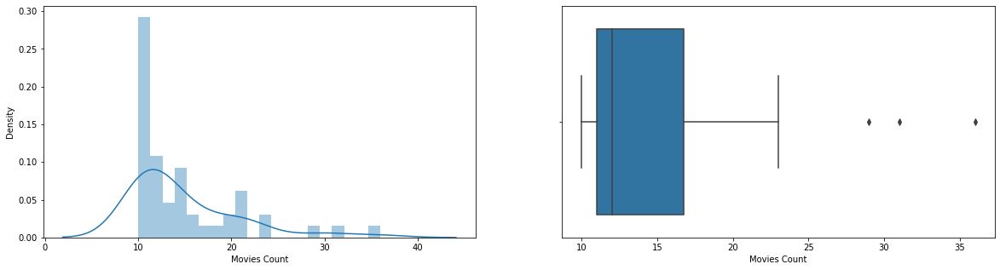

In [198]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(directors_data_movies['Movies Count'][:50],bins = 20, kde = True, ax = ax[0])
sns.boxplot(directors_data_movies['Movies Count'][:50], ax = ax[1])
plt.show()

In [199]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_directors_movies = directors_data_movies[directors_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_directors_movies = netflix_directors_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_directors_movies = directors_data_movies[directors_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_directors_movies = hulu_directors_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_directors_movies = directors_data_movies[directors_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_directors_movies = prime_video_directors_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_directors_movies = directors_data_movies[directors_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_directors_movies = disney_directors_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

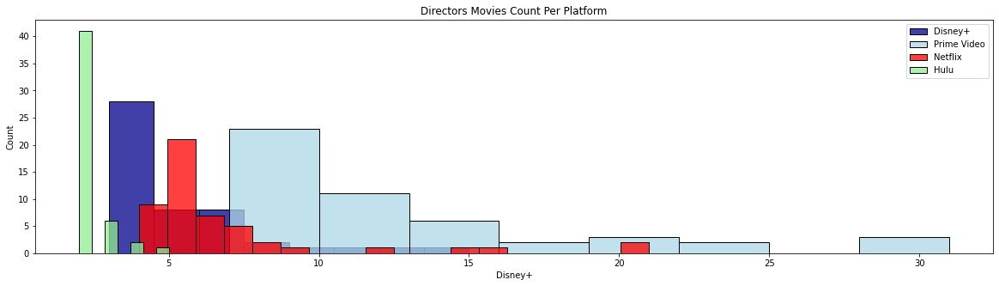

In [200]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Directors Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(disney_directors_movies['Disney+'][:50], color = 'darkblue', legend = True, kde = False)  
sns.histplot(prime_video_directors_movies['Prime Video'][:50], color = 'lightblue', legend = True, kde = False)
sns.histplot(netflix_directors_movies['Netflix'][:50], color = 'red', legend = True, kde = False)
sns.histplot(hulu_directors_movies['Hulu'][:50], color = 'lightgreen', legend = True, kde = False)                                
 
# Setting the legend
plt.legend(['Disney+', 'Prime Video', 'Netflix', 'Hulu'])
plt.show()

In [201]:
print(f'''
      The Director with Highest Movies Count Rating Ever Got is '{df_directors_high_movies['Directors'][0]}' : '{df_directors_high_movies['Movies Count'].max()}'\n
      The Director with Lowest Movies Count Rating Ever Got is '{df_directors_low_movies['Directors'][0]}' : '{df_directors_low_movies['Movies Count'].min()}'\n
      
      The Director with Highest Movies Count Rating on 'Netflix' is '{netflix_directors_high_movies['Directors'][0]}' : '{netflix_directors_high_movies['Netflix'].max()}'\n
      The Director with Lowest Movies Count Rating on 'Netflix' is '{netflix_directors_low_movies['Directors'][0]}' : '{netflix_directors_low_movies['Netflix'].min()}'\n
      
      The Director with Highest Movies Count Rating on 'Hulu' is '{hulu_directors_high_movies['Directors'][0]}' : '{hulu_directors_high_movies['Hulu'].max()}'\n
      The Director with Lowest Movies Count Rating on 'Hulu' is '{hulu_directors_low_movies['Directors'][0]}' : '{hulu_directors_low_movies['Hulu'].min()}'\n
      
      The Director with Highest Movies Count Rating on 'Prime Video' is '{prime_video_directors_high_movies['Directors'][0]}' : '{prime_video_directors_high_movies['Prime Video'].max()}'\n
      The Director with Lowest Movies Count Rating on 'Prime Video' is '{prime_video_directors_low_movies['Directors'][0]}' : '{prime_video_directors_low_movies['Prime Video'].min()}'\n
      
      The Director with Highest Movies Count Rating on 'Disney+' is '{disney_directors_high_movies['Directors'][0]}' : '{disney_directors_high_movies['Disney+'].max()}'\n
      The Director with Lowest Movies Count Rating on 'Disney+' is '{disney_directors_low_movies['Directors'][0]}' : '{disney_directors_low_movies['Disney+'].min()}'\n 
      ''')


      The Director with Highest Movies Count Rating Ever Got is 'Jay Chapman' : '36'

      The Director with Lowest Movies Count Rating Ever Got is 'Peter Ettedgui' : '1'

      
      The Director with Highest Movies Count Rating on 'Netflix' is 'Jan Suter' : '21'

      The Director with Lowest Movies Count Rating on 'Netflix' is 'Jeff Rector' : '0'

      
      The Director with Highest Movies Count Rating on 'Hulu' is 'Savage Steve Holland' : '5'

      The Director with Lowest Movies Count Rating on 'Hulu' is 'Jay Chapman' : '0'

      
      The Director with Highest Movies Count Rating on 'Prime Video' is 'Joseph Kane' : '31'

      The Director with Lowest Movies Count Rating on 'Prime Video' is 'Özcan Alper' : '0'

      
      The Director with Highest Movies Count Rating on 'Disney+' is 'Paul Hoen' : '15'

      The Director with Lowest Movies Count Rating on 'Disney+' is 'Jay Chapman' : '0'
 
      


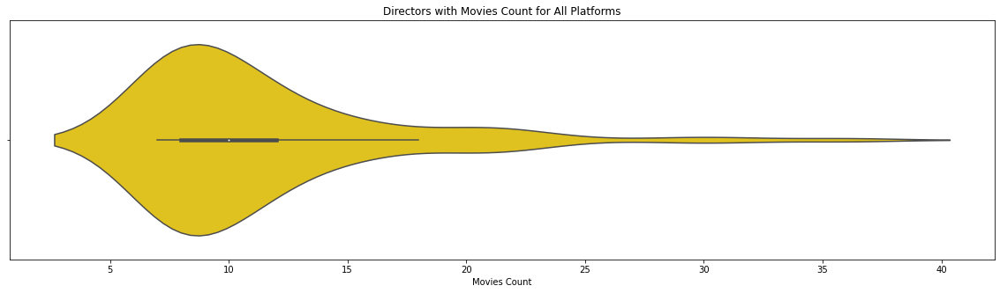

In [202]:
# Distribution of movies rating in each platform
plt.figure(figsize = (20, 5))
plt.title('Directors with Movies Count for All Platforms')
sns.violinplot(x = directors_data_movies['Movies Count'][:100], color = 'gold', legend = True, kde = True, shade = False)
plt.show()

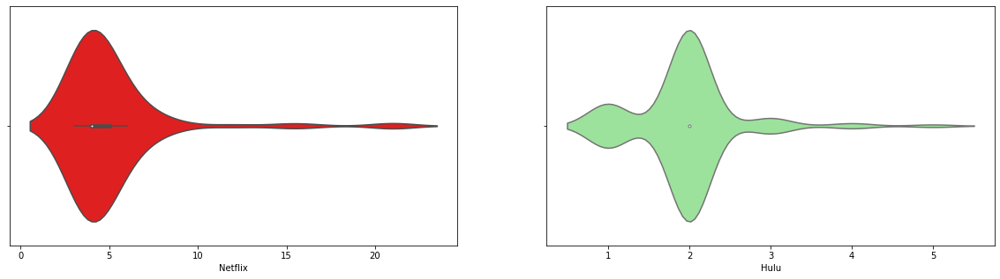

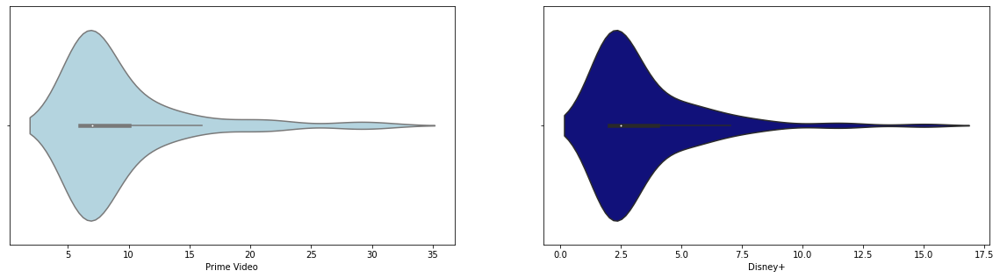

In [203]:
# Distribution of Directors Movies Count in each platform
f1, ax1 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = netflix_directors_movies['Netflix'][:100], color = 'red', ax = ax1[0])
sns.violinplot(x = hulu_directors_movies['Hulu'][:100], color = 'lightgreen', ax = ax1[1])
 
f2, ax2 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = prime_video_directors_movies['Prime Video'][:100], color = 'lightblue', ax = ax2[0])
sns.violinplot(x = disney_directors_movies['Disney+'][:100], color = 'darkblue', ax = ax2[1])
plt.show()

In [204]:
print(f'''
      Accross All Platforms the Average Movies Count of Directors is '{round(directors_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Directors on 'Netflix' is '{round(netflix_directors_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Directors on 'Hulu' is '{round(hulu_directors_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Directors on 'Prime Video' is '{round(prime_video_directors_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Directors on 'Disney+' is '{round(disney_directors_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Movies Count of Directors is '1.48'

      The Average Movies Count of Directors on 'Netflix' is '1.29'

      The Average Movies Count of Directors on 'Hulu' is '1.09'

      The Average Movies Count of Directors on 'Prime Video' is '1.37'

      The Average Movies Count of Directors on 'Disney+' is '1.57'
 
      


In [205]:
print(f'''
      Accross All Platforms Total Count of Directors is '{directors_data_movies['Directors'].unique().shape[0]}'\n
      Total Count of Directors on 'Netflix' is '{netflix_directors_movies['Directors'].unique().shape[0]}'\n
      Total Count of Directors on 'Hulu' is '{hulu_directors_movies['Directors'].unique().shape[0]}'\n
      Total Count of Directors on 'Prime Video' is '{prime_video_directors_movies['Directors'].unique().shape[0]}'\n
      Total Count of Directors on 'Disney+' is '{disney_directors_movies['Directors'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Directors is '12760'

      Total Count of Directors on 'Netflix' is '3174'

      Total Count of Directors on 'Hulu' is '1066'

      Total Count of Directors on 'Prime Video' is '9909'

      Total Count of Directors on 'Disney+' is '473'
 
      


In [206]:
fig = px.bar(x = directors_data_movies['Directors'][:50], y = directors_data_movies['Movies Count'][:50], 
             color = directors_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r',
             labels = { 'x' : 'Directors', 'y' : 'Number of Movies'})
fig.show()

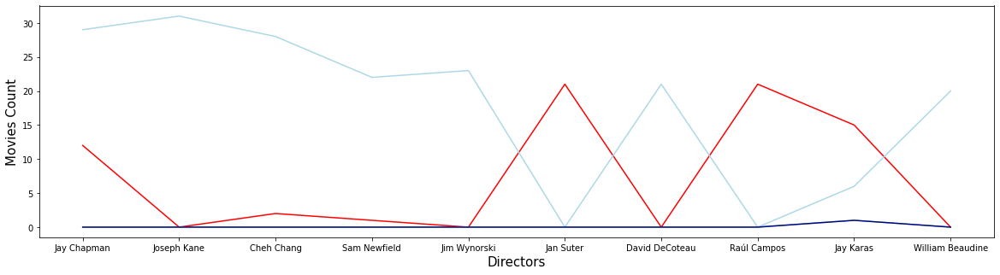

In [207]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = directors_data_movies['Directors'][:10], y = directors_data_movies['Netflix'][:10], color = 'red')
sns.lineplot(x = directors_data_movies['Directors'][:10], y = directors_data_movies['Hulu'][:10], color = 'lightgreen')
sns.lineplot(x = directors_data_movies['Directors'][:10], y = directors_data_movies['Prime Video'][:10], color = 'lightblue')
sns.lineplot(x = directors_data_movies['Directors'][:10], y = directors_data_movies['Disney+'][:10], color = 'darkblue')
plt.xlabel('Directors', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

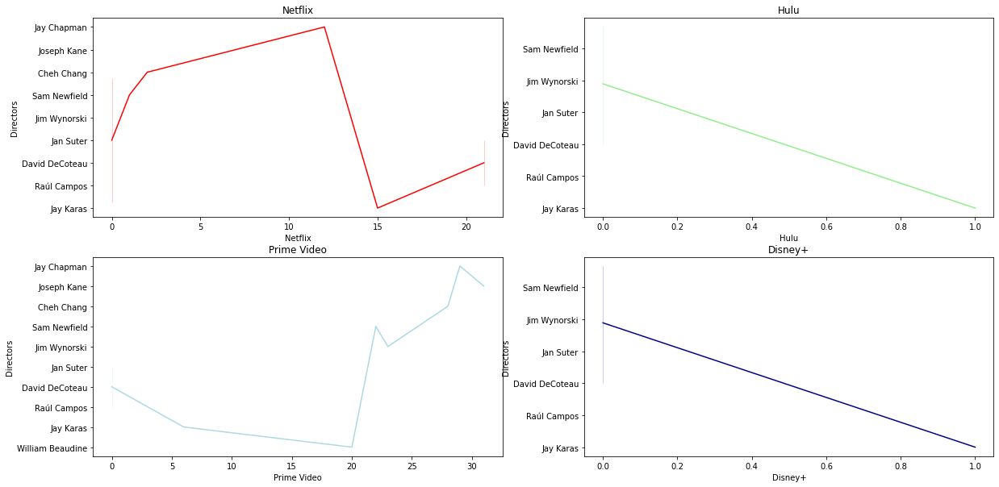

In [208]:
fig, axes = plt.subplots(2, 2,figsize = (20 ,10))
 
n_d_ax1 = sns.lineplot(y = directors_data_movies['Directors'][:10], x = directors_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_d_ax2 = sns.lineplot(y = directors_data_movies['Directors'][:10], x = directors_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_d_ax3 = sns.lineplot(y = directors_data_movies['Directors'][:10], x = directors_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_d_ax4 = sns.lineplot(y = directors_data_movies['Directors'][:10], x = directors_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_d_ax1.title.set_text(labels[0])
h_d_ax2.title.set_text(labels[1])
p_d_ax3.title.set_text(labels[2])
d_d_ax4.title.set_text(labels[3])
 
plt.show()

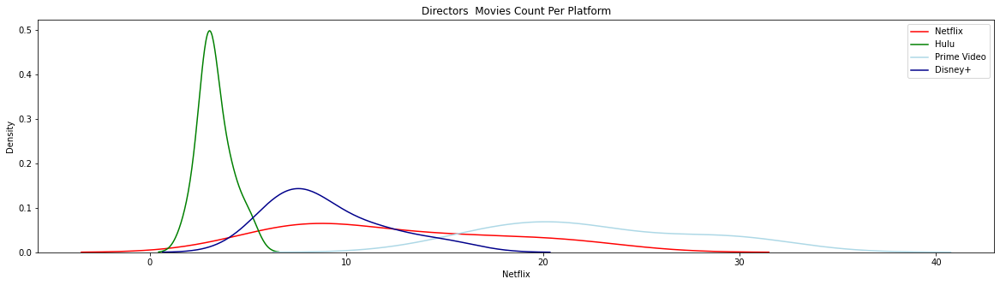

In [209]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Directors  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_directors_movies['Netflix'][:10], color = 'red', legend = True)
sns.kdeplot(hulu_directors_movies['Hulu'][:10], color = 'green', legend = True)
sns.kdeplot(prime_video_directors_movies['Prime Video'][:10], color = 'lightblue', legend = True)
sns.kdeplot(disney_directors_movies['Disney+'][:10], color = 'darkblue', legend = True)                                      
                                      
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

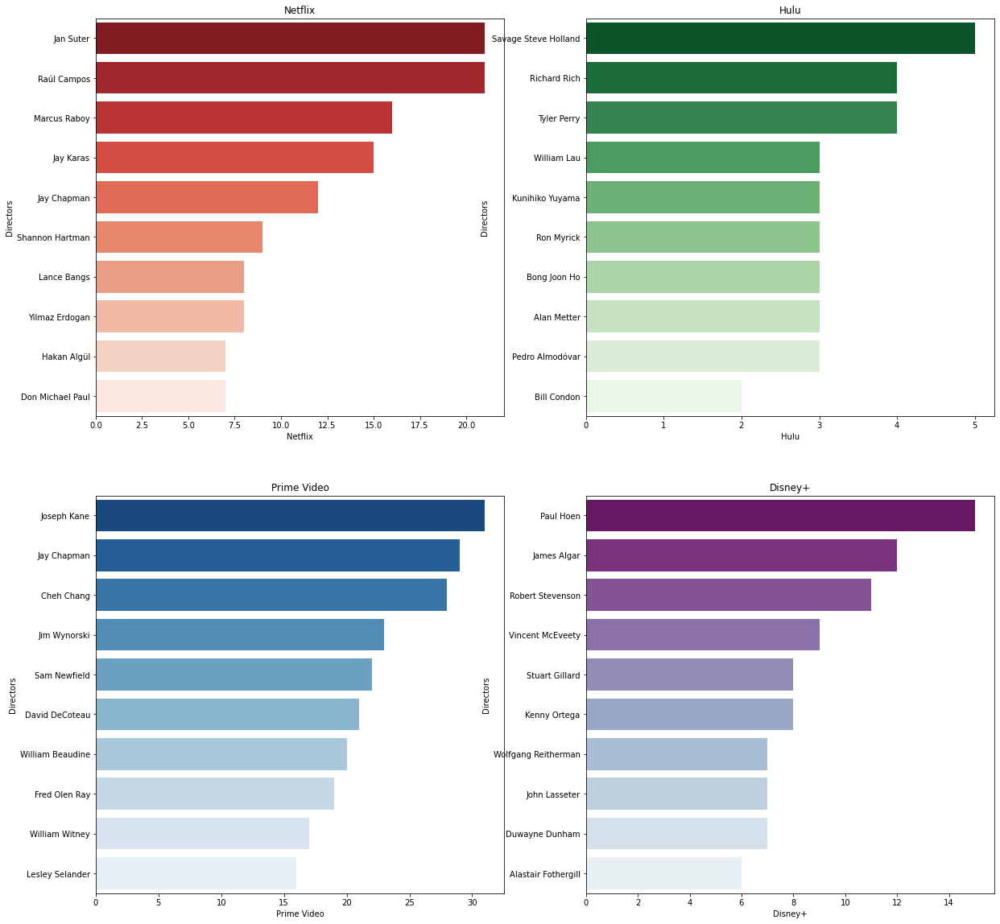

In [210]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_d_ax1 = sns.barplot(y = netflix_directors_movies['Directors'][:10], x = netflix_directors_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_d_ax2 = sns.barplot(y = hulu_directors_movies['Directors'][:10], x = hulu_directors_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_d_ax3 = sns.barplot(y = prime_video_directors_movies['Directors'][:10], x = prime_video_directors_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_d_ax4 = sns.barplot(y = disney_directors_movies['Directors'][:10], x = disney_directors_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_d_ax1.title.set_text(labels[0])
h_d_ax2.title.set_text(labels[1])
p_d_ax3.title.set_text(labels[2])
d_d_ax4.title.set_text(labels[3])
 
plt.show()

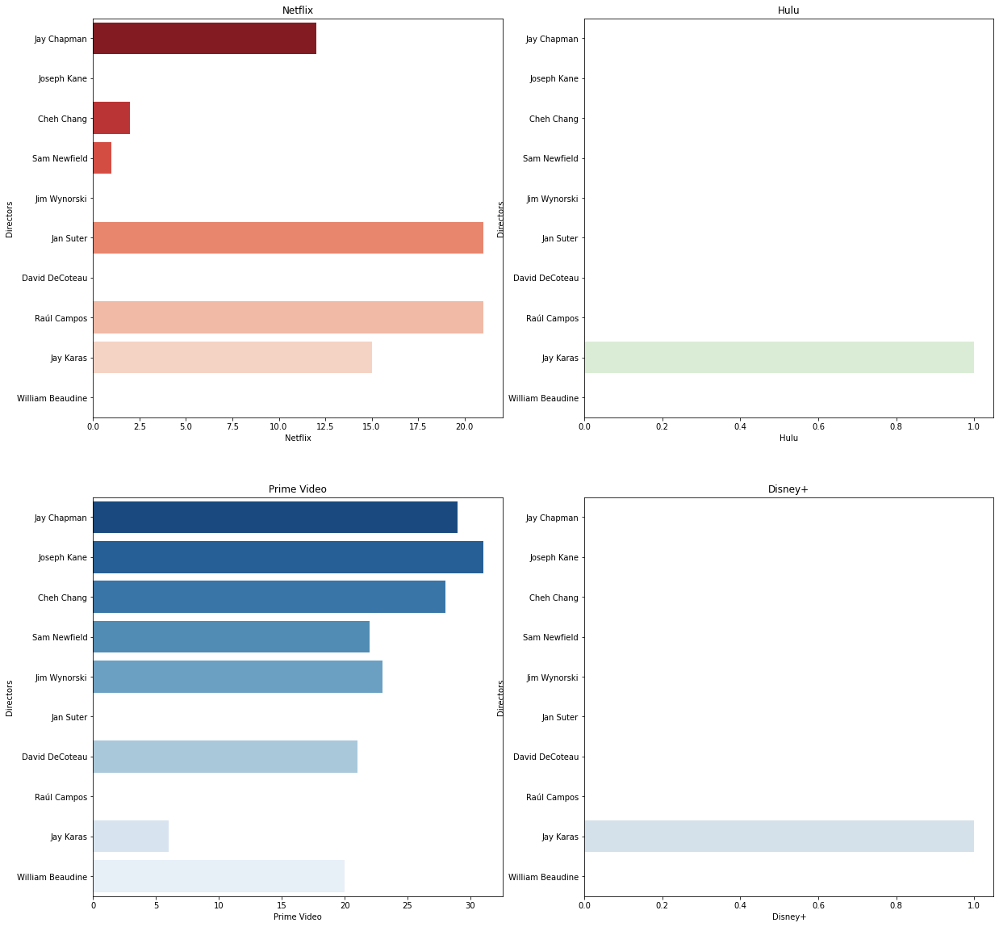

In [211]:
ig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_d_ax1 = sns.barplot(y = directors_data_movies['Directors'][:10], x = directors_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_d_ax2 = sns.barplot(y = directors_data_movies['Directors'][:10], x = directors_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_d_ax3 = sns.barplot(y = directors_data_movies['Directors'][:10], x = directors_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_d_ax4 = sns.barplot(y = directors_data_movies['Directors'][:10], x = directors_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_d_ax1.title.set_text(labels[0])
h_d_ax2.title.set_text(labels[1])
p_d_ax3.title.set_text(labels[2])
d_d_ax4.title.set_text(labels[3])
 
plt.show()

In [212]:
df_movies_mixed_directors.drop(df_movies_mixed_directors.loc[df_movies_mixed_directors['Directors'] == "NA"].index, inplace = True)
# df_movies_mixed_directors = df_movies_mixed_directors[df_movies_mixed_directors.Directors != "NA"]
df_movies_mixed_directors.drop(df_movies_mixed_directors.loc[df_movies_mixed_directors['Number of Directors'] == 1].index, inplace = True)

In [213]:
df_movies_mixed_directors.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Directors
1,2,The Matrix,1999,16,8.7,88,"Lana Wachowski,Lilly Wachowski","Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...","Action,Sci-Fi",United States,...,Thomas A. Anderson is a man living two lives. ...,136,movie,1,0,0,0,0,Netflix,2
2,3,Avengers: Infinity War,2018,13,8.4,85,"Anthony Russo,Joe Russo","Robert Downey Jr.,Chris Hemsworth,Mark Ruffalo...","Action,Adventure,Sci-Fi",United States,...,As the Avengers and their allies have continue...,149,movie,1,0,0,0,0,Netflix,2
5,6,Spider-Man: Into the Spider-Verse,2018,7,8.4,97,"Bob Persichetti,Peter Ramsey,Rodney Rothman","Shameik Moore,Jake Johnson,Hailee Steinfeld,Ma...","Animation,Action,Adventure,Family,Sci-Fi",United States,...,"Phil Lord and Christopher Miller, the creative...",117,movie,1,0,0,0,0,Netflix,3
14,15,Monty Python and the Holy Grail,1975,7,8.2,97,"Terry Gilliam,Terry Jones","Graham Chapman,John Cleese,Eric Idle,Terry Gil...","Adventure,Comedy,Fantasy",United Kingdom,...,"History is turned on its comic head when, in t...",91,movie,1,0,0,0,0,Netflix,2
35,36,Klaus,2019,7,8.2,94,"Sergio Pablos,Carlos Martínez López","Jason Schwartzman,J.K. Simmons,Rashida Jones,W...","Animation,Adventure,Comedy,Family","Spain,United Kingdom,United States",...,When Jesper (Jason Schwartzman) distinguishes ...,96,movie,1,0,0,0,0,Netflix,2


In [214]:
mixed_directors_count = df_movies_mixed_directors.groupby('Directors')['Title'].count()
mixed_directors_movies = df_movies_mixed_directors.groupby('Directors')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
mixed_directors_data_movies = pd.concat([mixed_directors_count, mixed_directors_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count', 'Directors' : 'Mixed Directors'})
mixed_directors_data_movies = mixed_directors_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [215]:
mixed_directors_data_movies.head(5)

,Mixed Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
1174,"Raúl Campos,Jan Suter",20,20,0,0,0
11,"Abbas Alibhai Burmawalla,Mastan Alibhai Burmaw...",7,2,0,6,0
467,"Ethan Coen,Joel Coen",6,4,1,2,0
882,"Lana Wachowski,Lilly Wachowski",5,4,0,1,0
455,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...",5,2,0,4,0


In [216]:
# Mixed Directors with Movies Counts - All Platforms Combined
mixed_directors_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

,Mixed Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
1174,"Raúl Campos,Jan Suter",20,20,0,0,0
11,"Abbas Alibhai Burmawalla,Mastan Alibhai Burmaw...",7,2,0,6,0
467,"Ethan Coen,Joel Coen",6,4,1,2,0
882,"Lana Wachowski,Lilly Wachowski",5,4,0,1,0
455,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...",5,2,0,4,0
117,"Anthony Russo,Joe Russo",5,1,0,1,3
485,"Frank Capra,Anatole Litvak",5,2,0,5,0
447,"Eduardo Quiroz,Jose Quiroz",4,0,0,4,0
476,"Fenton Bailey,Randy Barbato",4,0,0,4,0
1520,"Zack Coffman,Scott Di Lalla",4,0,0,4,0


In [217]:
df_mixed_directors_high_movies = mixed_directors_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_mixed_directors_high_movies = df_mixed_directors_high_movies.drop(['index'], axis = 1)
# filter = (mixed_directors_data_movies['Movies Count'] = =  (mixed_directors_data_movies['Movies Count'].max()))
# df_mixed_directors_high_movies = mixed_directors_data_movies[filter]
 
# highest_rated_movies = mixed_directors_data_movies.loc[mixed_directors_data_movies['Movies Count'].idxmax()]
 
print('\nMixed Directors with Highest Ever Movies Count are : All Platforms Combined\n')
df_mixed_directors_high_movies.head(5)


Mixed Directors with Highest Ever Movies Count are : All Platforms Combined



,Mixed Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Raúl Campos,Jan Suter",20,20,0,0,0
1,"Abbas Alibhai Burmawalla,Mastan Alibhai Burmaw...",7,2,0,6,0
2,"Ethan Coen,Joel Coen",6,4,1,2,0
3,"Lana Wachowski,Lilly Wachowski",5,4,0,1,0
4,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...",5,2,0,4,0


In [218]:
df_mixed_directors_low_movies = mixed_directors_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_mixed_directors_low_movies = df_mixed_directors_low_movies.drop(['index'], axis = 1)
# filter = (mixed_directors_data_movies['Movies Count'] = =  (mixed_directors_data_movies['Movies Count'].min()))
# df_mixed_directors_low_movies = mixed_directors_data_movies[filter]
 
print('\nMixed Directors with Lowest Ever Movies Count are : All Platforms Combined\n')
df_mixed_directors_low_movies.head(5)


Mixed Directors with Lowest Ever Movies Count are : All Platforms Combined



,Mixed Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Robin Budd,Donovan Cook",1,0,0,0,1
1,"Andrew Stanton,Lee Unkrich",1,0,0,0,1
2,"Alex Harvey,Tommy Sowards",1,0,0,1,0
3,"Alex Kleider,Corey Ogilvie",1,0,0,1,0
4,"Amber Dawn Lee,Rob Brownstein,Jeff Chassler,Ro...",1,0,0,1,0


In [219]:
print(f'''
      Total '{df_movies['Directors'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{mixed_directors_data_movies['Mixed Directors'].unique().shape[0]}' Mixed Directors, They were Like this, \n
 
      {mixed_directors_data_movies.sort_values(by = 'Movies Count', ascending = False)['Mixed Directors'].head(5).unique()} etc. \n
 
      The Mixed Directors with Highest Movies Count have '{mixed_directors_data_movies['Movies Count'].max()}' Movies Available is '{df_mixed_directors_high_movies['Mixed Directors'][0]}', &\n
      The Mixed Directors with Lowest Movies Count have '{mixed_directors_data_movies['Movies Count'].min()}' Movies Available is '{df_mixed_directors_low_movies['Mixed Directors'][0]}'
      ''')


      Total '16923' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '1527' Mixed Directors, They were Like this, 

 
      ['Raúl Campos,Jan Suter'
 'Abbas Alibhai Burmawalla,Mastan Alibhai Burmawalla'
 'Ethan Coen,Joel Coen' 'Lana Wachowski,Lilly Wachowski'
 'Elizabeth Banks,Steven Brill,Steve Carr,Rusty Cundieff,James Duffy,Griffin Dunne,Peter Farrelly,Patrik Forsberg,Will Graham,James Gunn,Brett Ratner,Jonathan van Tulleken,Bob Odenkirk'] etc. 

 
      The Mixed Directors with Highest Movies Count have '20' Movies Available is 'Raúl Campos,Jan Suter', &

      The Mixed Directors with Lowest Movies Count have '1' Movies Available is 'Robin Budd,Donovan Cook'
      


In [220]:
fig = px.pie(mixed_directors_data_movies[:20], names = 'Mixed Directors', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [221]:
# netflix_mixed_directors_movies = mixed_directors_data_movies[mixed_directors_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_mixed_directors_movies = netflix_mixed_directors_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_mixed_directors_high_movies = df_mixed_directors_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_directors_high_movies = netflix_mixed_directors_high_movies.drop(['index'], axis = 1)
 
netflix_mixed_directors_low_movies = df_mixed_directors_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_mixed_directors_low_movies = netflix_mixed_directors_low_movies.drop(['index'], axis = 1)
 
netflix_mixed_directors_high_movies.head(5)

,Mixed Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Raúl Campos,Jan Suter",20,20,0,0,0
1,"Ethan Coen,Joel Coen",6,4,1,2,0
2,"Lana Wachowski,Lilly Wachowski",5,4,0,1,0
3,"Nate Adams,Adam Carolla",3,3,0,0,0
4,"Michael Simon,Matthew McNeil",3,3,0,1,0


In [222]:
# hulu_mixed_directors_movies = mixed_directors_data_movies[mixed_directors_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_mixed_directors_movies = hulu_mixed_directors_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_mixed_directors_high_movies = df_mixed_directors_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_directors_high_movies = hulu_mixed_directors_high_movies.drop(['index'], axis = 1)
 
hulu_mixed_directors_low_movies = df_mixed_directors_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_mixed_directors_low_movies = hulu_mixed_directors_low_movies.drop(['index'], axis = 1)
 
hulu_mixed_directors_high_movies.head(5)

,Mixed Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Don Argott,Sheena M. Joyce",2,0,2,0,0
1,"Jocelyn DeBoer,Dawn Luebbe",1,0,1,0,0
2,"Stuart Walker,Mitchell Leisen",1,0,1,1,0
3,"Alexander Lahl,Max Mönch",1,0,1,0,0
4,"Steve Jones,Todd Jones",1,0,1,1,0


In [223]:
# prime_video_mixed_directors_movies = mixed_directors_data_movies[mixed_directors_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_mixed_directors_movies = prime_video_mixed_directors_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_mixed_directors_high_movies = df_mixed_directors_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_directors_high_movies = prime_video_mixed_directors_high_movies.drop(['index'], axis = 1)
 
prime_video_mixed_directors_low_movies = df_mixed_directors_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_mixed_directors_low_movies = prime_video_mixed_directors_low_movies.drop(['index'], axis = 1)
 
prime_video_mixed_directors_high_movies.head(5)

,Mixed Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Abbas Alibhai Burmawalla,Mastan Alibhai Burmaw...",7,2,0,6,0
1,"Frank Capra,Anatole Litvak",5,2,0,5,0
2,"Elizabeth Banks,Steven Brill,Steve Carr,Rusty ...",5,2,0,4,0
3,"Eduardo Quiroz,Jose Quiroz",4,0,0,4,0
4,"Fenton Bailey,Randy Barbato",4,0,0,4,0


In [224]:
# disney_mixed_directors_movies = mixed_directors_data_movies[mixed_directors_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_mixed_directors_movies = disney_mixed_directors_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_mixed_directors_high_movies = df_mixed_directors_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_directors_high_movies = disney_mixed_directors_high_movies.drop(['index'], axis = 1)
 
disney_mixed_directors_low_movies = df_mixed_directors_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_mixed_directors_low_movies = disney_mixed_directors_low_movies.drop(['index'], axis = 1)
 
disney_mixed_directors_high_movies.head(5)

,Mixed Directors,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Anthony Russo,Joe Russo",5,1,0,1,3
1,"Ron Clements,John Musker",3,1,0,0,3
2,"Robert C. Ramirez,Patrick A. Ventura",2,0,0,0,2
3,"Chris Buck,Jennifer Lee",2,0,0,0,2
4,"Saul Blinkoff,Elliot M. Bour",2,0,0,0,2


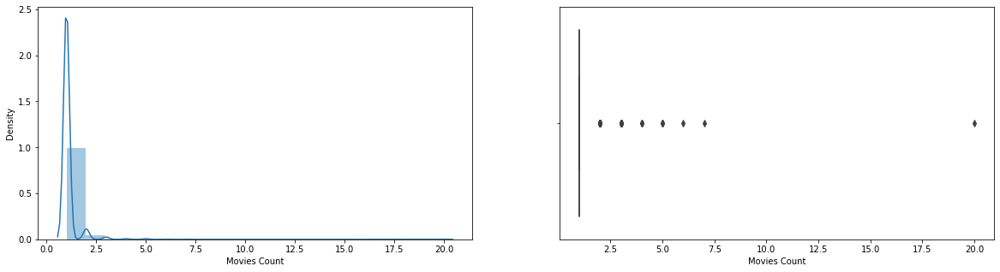

In [225]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(mixed_directors_data_movies['Movies Count'], bins = 20, kde = True, ax = ax[0])
sns.boxplot(mixed_directors_data_movies['Movies Count'], ax = ax[1])
plt.show()

In [226]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_mixed_directors_movies = mixed_directors_data_movies[mixed_directors_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_directors_movies = netflix_mixed_directors_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_mixed_directors_movies = mixed_directors_data_movies[mixed_directors_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_directors_movies = hulu_mixed_directors_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_mixed_directors_movies = mixed_directors_data_movies[mixed_directors_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_directors_movies = prime_video_mixed_directors_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_mixed_directors_movies = mixed_directors_data_movies[mixed_directors_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_directors_movies = disney_mixed_directors_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

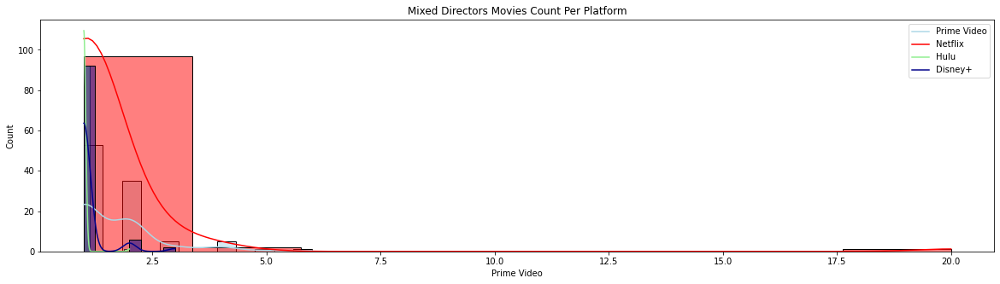

In [227]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Directors Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(prime_video_mixed_directors_movies['Prime Video'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_mixed_directors_movies['Netflix'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_mixed_directors_movies['Hulu'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_mixed_directors_movies['Disney+'][:100], color = 'darkblue', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [228]:
print(f'''
      The Mixed Directors with Highest Movies Count Rating Ever Got is '{df_mixed_directors_high_movies['Mixed Directors'][0]}' : '{df_mixed_directors_high_movies['Movies Count'].max()}'\n
      The Mixed Directors with Lowest Movies Count Rating Ever Got is '{df_mixed_directors_low_movies['Mixed Directors'][0]}' : '{df_mixed_directors_low_movies['Movies Count'].min()}'\n
      
      The Mixed Directors with Highest Movies Count Rating on 'Netflix' is '{netflix_mixed_directors_high_movies['Mixed Directors'][0]}' : '{netflix_mixed_directors_high_movies['Netflix'].max()}'\n
      The Mixed Directors with Lowest Movies Count Rating on 'Netflix' is '{netflix_mixed_directors_low_movies['Mixed Directors'][0]}' : '{netflix_mixed_directors_low_movies['Netflix'].min()}'\n
      
      The Mixed Directors with Highest Movies Count Rating on 'Hulu' is '{hulu_mixed_directors_high_movies['Mixed Directors'][0]}' : '{hulu_mixed_directors_high_movies['Hulu'].max()}'\n
      The Mixed Directors with Lowest Movies Count Rating on 'Hulu' is '{hulu_mixed_directors_low_movies['Mixed Directors'][0]}' : '{hulu_mixed_directors_low_movies['Hulu'].min()}'\n
      
      The Mixed Directors with Highest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_directors_high_movies['Mixed Directors'][0]}' : '{prime_video_mixed_directors_high_movies['Prime Video'].max()}'\n
      The Mixed Directors with Lowest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_directors_low_movies['Mixed Directors'][0]}' : '{prime_video_mixed_directors_low_movies['Prime Video'].min()}'\n
      
      The Mixed Directors with Highest Movies Count Rating on 'Disney+' is '{disney_mixed_directors_high_movies['Mixed Directors'][0]}' : '{disney_mixed_directors_high_movies['Disney+'].max()}'\n
      The Mixed Directors with Lowest Movies Count Rating on 'Disney+' is '{disney_mixed_directors_low_movies['Mixed Directors'][0]}' : '{disney_mixed_directors_low_movies['Disney+'].min()}'\n 
      ''')


      The Mixed Directors with Highest Movies Count Rating Ever Got is 'Raúl Campos,Jan Suter' : '20'

      The Mixed Directors with Lowest Movies Count Rating Ever Got is 'Robin Budd,Donovan Cook' : '1'

      
      The Mixed Directors with Highest Movies Count Rating on 'Netflix' is 'Raúl Campos,Jan Suter' : '20'

      The Mixed Directors with Lowest Movies Count Rating on 'Netflix' is 'Jim Kammerud,Brian Smith,Bill Speers' : '0'

      
      The Mixed Directors with Highest Movies Count Rating on 'Hulu' is 'Don Argott,Sheena M. Joyce' : '2'

      The Mixed Directors with Lowest Movies Count Rating on 'Hulu' is 'Raúl Campos,Jan Suter' : '0'

      
      The Mixed Directors with Highest Movies Count Rating on 'Prime Video' is 'Abbas Alibhai Burmawalla,Mastan Alibhai Burmawalla' : '6'

      The Mixed Directors with Lowest Movies Count Rating on 'Prime Video' is 'Raúl Campos,Jan Suter' : '0'

      
      The Mixed Directors with Highest Movies Count Rating on 'Disney+' is 'Anth

In [229]:
print(f'''
      Accross All Platforms the Average Movies Count of Mixed Directors is '{round(mixed_directors_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Directors on 'Netflix' is '{round(netflix_mixed_directors_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Directors on 'Hulu' is '{round(hulu_mixed_directors_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Directors on 'Prime Video' is '{round(prime_video_mixed_directors_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Directors on 'Disney+' is '{round(disney_mixed_directors_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Movies Count of Mixed Directors is '1.1'

      The Average Movies Count of Mixed Directors on 'Netflix' is '1.12'

      The Average Movies Count of Mixed Directors on 'Hulu' is '1.01'

      The Average Movies Count of Mixed Directors on 'Prime Video' is '1.07'

      The Average Movies Count of Mixed Directors on 'Disney+' is '1.1'
 
      


In [230]:
print(f'''
      Accross All Platforms Total Count of Mixed Directors is '{mixed_directors_data_movies['Mixed Directors'].unique().shape[0]}'\n
      Total Count of Mixed Directors on 'Netflix' is '{netflix_mixed_directors_movies['Mixed Directors'].unique().shape[0]}'\n
      Total Count of Mixed Directors on 'Hulu' is '{hulu_mixed_directors_movies['Mixed Directors'].unique().shape[0]}'\n
      Total Count of Mixed Directors on 'Prime Video' is '{prime_video_mixed_directors_movies['Mixed Directors'].unique().shape[0]}'\n
      Total Count of Mixed Directors on 'Disney+' is '{disney_mixed_directors_movies['Mixed Directors'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Mixed Directors is '1527'

      Total Count of Mixed Directors on 'Netflix' is '373'

      Total Count of Mixed Directors on 'Hulu' is '93'

      Total Count of Mixed Directors on 'Prime Video' is '1047'

      Total Count of Mixed Directors on 'Disney+' is '104'
 
      


In [231]:
fig = px.bar(x = mixed_directors_data_movies['Mixed Directors'][:50], y = mixed_directors_data_movies['Movies Count'][:50], 
             color = mixed_directors_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Mixed Directors', 'y' : 'Number of Movies'})
fig.show()

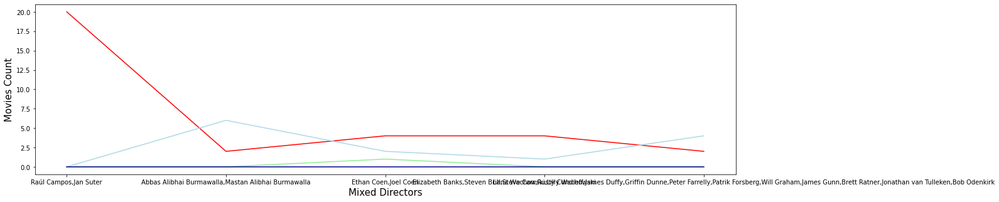

In [232]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = mixed_directors_data_movies['Mixed Directors'][:5], y = mixed_directors_data_movies['Netflix'][:5], color = 'red')
sns.lineplot(x = mixed_directors_data_movies['Mixed Directors'][:5], y = mixed_directors_data_movies['Hulu'][:5], color = 'lightgreen')
sns.lineplot(x = mixed_directors_data_movies['Mixed Directors'][:5], y = mixed_directors_data_movies['Prime Video'][:5], color = 'lightblue')
sns.lineplot(x = mixed_directors_data_movies['Mixed Directors'][:5], y = mixed_directors_data_movies['Disney+'][:5], color = 'darkblue')
plt.xlabel('Mixed Directors', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

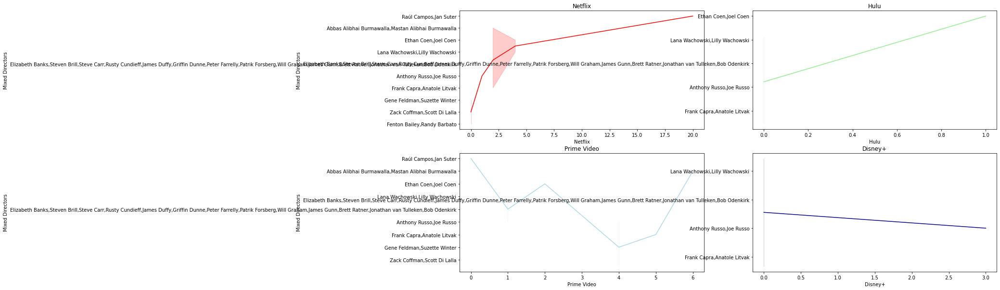

In [233]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_mg_ax1 = sns.lineplot(y = mixed_directors_data_movies['Mixed Directors'][:10], x = mixed_directors_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_mg_ax2 = sns.lineplot(y = mixed_directors_data_movies['Mixed Directors'][:10], x = mixed_directors_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_mg_ax3 = sns.lineplot(y = mixed_directors_data_movies['Mixed Directors'][:10], x = mixed_directors_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_mg_ax4 = sns.lineplot(y = mixed_directors_data_movies['Mixed Directors'][:10], x = mixed_directors_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_mg_ax1.title.set_text(labels[0])
h_mg_ax2.title.set_text(labels[1])
p_mg_ax3.title.set_text(labels[2])
d_mg_ax4.title.set_text(labels[3])
 
plt.show()

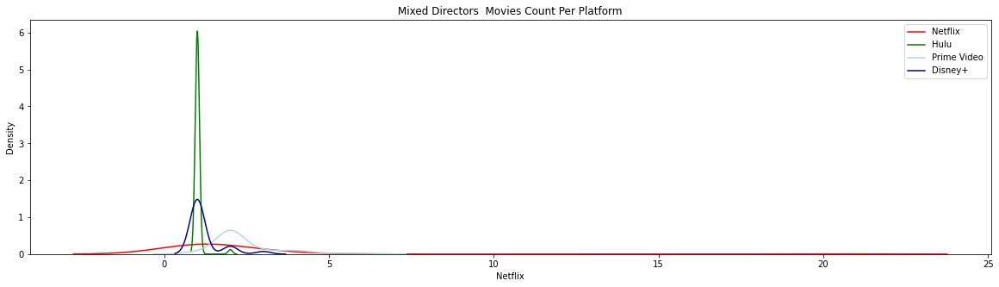

In [234]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Directors  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_mixed_directors_movies['Netflix'][:50], color = 'red', legend = True)
sns.kdeplot(hulu_mixed_directors_movies['Hulu'][:50], color = 'green', legend = True)
sns.kdeplot(prime_video_mixed_directors_movies['Prime Video'][:50], color = 'lightblue', legend = True)
sns.kdeplot(disney_mixed_directors_movies['Disney+'][:50], color = 'darkblue', legend = True)                                      

# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [235]:
fig = go.Figure(go.Funnel(y = mixed_directors_data_movies['Mixed Directors'][:10],x = mixed_directors_data_movies['Movies Count'][:10]))
fig.show()

In [236]:
df_movies_casts = df_movies.copy()

In [237]:
# Create casts dict where key=name and value = number of casts
 
casts = {}
 
for i in df_movies_casts['Cast'].dropna():
    if i != "NA":
        #print(i,len(i.split(',')))
        casts[i] = len(i.split(','))
    else:
        casts[i] = 0
    
# Add this information to our dataframe as a new column
 
df_movies_casts['Number of Cast'] = df_movies_casts['Cast'].map(casts).astype(int)

In [238]:
df_casts_most_movies = df_movies_casts.sort_values(by = 'Number of Cast', ascending = False).reset_index()
df_casts_most_movies = df_casts_most_movies.drop(['index'], axis = 1)
# filter = (df_movies_casts['Cast'] == (df_movies_casts['Number of Cast'].max()))
# df_casts_most_movies = df_movies_casts[filter]
 
# mostest_rated_movies = df_movies_casts.loc[df_movies_casts['Number of Cast'].idxmax()]
 
print('\nMovies with Highest Ever Cast Count are : \n')
df_casts_most_movies.head(5)


Movies with Highest Ever Cast Count are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Cast
0,380,Heneral Luna,2015,16,7.5,75,Jerrold Tarog,"John Arcilla,Arron Villaflor,Mon Confiado,Bing...","Action,Biography,History,War",Philippines,...,"Set during the Philippine-American war, Henera...",118,movie,1,0,0,0,0,Netflix,1400
1,15970,Around the World in 80 Days,2004,0,6.8,32,"Michael Anderson,John Farrow","Cantinflas,Finlay Currie,Robert Morley,Ronald ...","Adventure,Comedy,Family,Romance",United States,...,"Race car driver, Jim Douglas goes to Monte Car...",167,movie,0,0,0,1,0,Disney+,1304
2,4624,7 Boxes,2012,16,7.1,97,"Juan Carlos Maneglia,Tana Schémbori","Celso Franco,Víctor Sosa,Lali Gonzalez,Nico Ga...","Adventure,Crime,Drama,Mystery,Thriller","Paraguay,Spain",...,"It's Friday night in Asunción, Paraguay and th...",105,movie,0,0,1,0,0,Prime Video,689
3,4156,Catching Faith,2015,NR,4.8,NA,John K.D. Graham,"Lorena Segura York,Garrett Westton,Bill Engval...","Drama,Family,Sport",United States,...,"From the outside, Alexa has the perfect life. ...",88,movie,0,1,1,0,0,Prime Video,491
4,10904,A Broken Code,2012,NR,5.9,NA,"Josh Webber,Michael Girgenti","Michael Girgenti,Josh Webber,Bill T. Williams,...","Crime,Drama,Thriller",United States,...,"Each morning, Yusef, a doting father-of-one, h...",90,movie,0,0,1,0,0,Prime Video,476


In [239]:
df_casts_least_movies = df_movies_casts.sort_values(by = 'Number of Cast', ascending = True).reset_index()
df_casts_least_movies = df_casts_least_movies.drop(['index'], axis = 1)
# filter = (df_movies_casts['Cast'] == (df_movies_casts['Number of Cast'].min()))
# df_casts_least_movies = df_movies_casts[filter]
 
print('\nMovies with Lowest Ever Cast Count are : \n')
df_casts_least_movies.head(5)


Movies with Lowest Ever Cast Count are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Cast
0,16923,Paradise Islands,2017,13,NA,NA,NA,NA,Drama,United States,...,NA,NA,movie,0,0,0,1,0,Disney+,0
1,3047,True: Wuzzle Wegg Day,2020,NR,7.4,NA,NA,NA,Animation,Canada,...,NA,23,movie,1,0,0,0,0,Netflix,0
2,3042,Ayotzinapa: The Turtle's Pace,2018,NR,7.5,NA,NA,NA,NA,NA,...,NA,NA,movie,1,0,0,0,0,Netflix,0
3,3025,"Hoshino Gen Dome Tour ""POP VIRUS"" at Tokyo Dome",2019,NR,NA,NA,NA,NA,NA,NA,...,NA,NA,movie,1,0,0,0,0,Netflix,0
4,3015,Hans Teeuwen: Real Rancour,2016,NR,NA,NA,NA,NA,NA,NA,...,NA,NA,movie,1,0,0,0,0,Netflix,0


In [240]:
print(f'''
      Total '{df_movies_casts['Cast'].unique().shape[0]}' unique Casts are Available, They were Like this,\n
      
      {df_movies_casts.sort_values(by = 'Number of Cast', ascending = False)['Cast'].unique()[:5]} etc.\n
 
      The Highest Ever Cast Count Any TV Show Got is '{df_casts_most_movies['Title'][0]}' : '{df_casts_most_movies['Number of Cast'].max()}'\n
 
      The Lowest Ever Cast Count Any TV Show Got is '{df_casts_least_movies['Title'][0]}' : '{df_casts_least_movies['Number of Cast'].min()}'\n
      ''')


      Total '15903' unique Casts are Available, They were Like this,

      
      ["John Arcilla,Arron Villaflor,Mon Confiado,Bing Pimentel,Mylene Dizon,Perla Bautista,Lorenz Martinez,Joem Bascon,Alvin Anson,Alex Vincent Medina,Arthur Acuña,Archie Alemania,Jeffrey Quizon,Leo Martinez,Nonie Buencamino,Ketchup Eusebio,Ronnie Lazaro,Paulo Avelino,Benjamin Alves,OJ Mariano,Dennis Marasigan,Joel Saracho,Menggie Cobarrubias,Bernard Laxa,Paolo O'Hara,Buddy Caramat,Nor Domingo,Moises Magisa,Ildeflor Adao,VJ Mendoza,Anthony Falcon,E.A. Rocha,Greg Dorris,Nicco Manalo,Cesar Batistis,Rolando Inocencio,Anna Luna,Victor F. Araja,Miguel Faustmann,David Bianco,Paul Holmes,Nico Antonio,Jake Feraren,Allan Paule,Marc Abaya,Junjun Quintana,Victor Medina,Amos Francia,Dido de la Paz,Coleen Perez,Pepe Herrera,RJ Agustin,Abner Delina,Armando Laput Jr.,Janzhed Negrite,Jennifer Blair-Bianco,Giovanni Baldisseri,Kevin Limjoco,Tarek El Tayech,Karen Gaerlan,Brent Metken,Rob Rownd,Macky Bulagay,Ronnie Martinez,Kev

In [241]:
netflix_casts_most_movies = df_casts_most_movies.loc[df_casts_most_movies['Netflix']==1].reset_index()
netflix_casts_most_movies = netflix_casts_most_movies.drop(['index'], axis = 1)
 
netflix_casts_least_movies = df_casts_least_movies.loc[df_casts_least_movies['Netflix']==1].reset_index()
netflix_casts_least_movies = netflix_casts_least_movies.drop(['index'], axis = 1)
 
netflix_casts_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Cast
0,380,Heneral Luna,2015,16,7.5,75,Jerrold Tarog,"John Arcilla,Arron Villaflor,Mon Confiado,Bing...","Action,Biography,History,War",Philippines,...,"Set during the Philippine-American war, Henera...",118,movie,1,0,0,0,0,Netflix,1400
1,29,The Irishman,2019,16,7.8,62,Martin Scorsese,"Robert De Niro,Al Pacino,Joe Pesci,Harvey Keit...","Biography,Crime,Drama",United States,...,"Frank ""The Irishman"" Sheeran is a man with a l...",209,movie,1,0,0,0,0,Netflix,472
2,2785,Bring It On: Worldwide #Cheersmack,2017,13,4.3,NA,Robert Adetuyi,"Stephan Benson,Kai Luke Brummer,Sophie de Bruy...","Comedy,Romance,Sport",United States,...,Vivica A. Fox makes her Bring It On debut as C...,95,movie,1,0,0,0,0,Netflix,450
3,1929,Like Arrows,2018,NR,6.5,NA,Kevin Peeples,"Micah Lynn Hanson,Alan Powell,Elizabeth Becka,...",Drama,United States,...,NA,100,movie,1,0,0,0,0,Netflix,303
4,1326,Sandy Wexler,2017,16,5.2,27,Steven Brill,"Adam Sandler,Jennifer Hudson,Kevin James,Colin...",Comedy,United States,...,Sandy Wexler (Adam Sandler) is a talent manage...,130,movie,1,0,0,0,0,Netflix,260


In [242]:
hulu_casts_most_movies = df_casts_most_movies.loc[df_casts_most_movies['Hulu']==1].reset_index()
hulu_casts_most_movies = hulu_casts_most_movies.drop(['index'], axis = 1)
 
hulu_casts_least_movies = df_casts_least_movies.loc[df_casts_least_movies['Hulu']==1].reset_index()
hulu_casts_least_movies = hulu_casts_least_movies.drop(['index'], axis = 1)
 
hulu_casts_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Cast
0,4156,Catching Faith,2015,NR,4.8,NA,John K.D. Graham,"Lorena Segura York,Garrett Westton,Bill Engval...","Drama,Family,Sport",United States,...,"From the outside, Alexa has the perfect life. ...",88,movie,0,1,1,0,0,Prime Video,491
1,3510,Creed II,2018,13,7.1,83,Steven Caple Jr.,"Michael B. Jordan,Sylvester Stallone,Tessa Tho...","Drama,Sport",United States,...,Years after Adonis Creed made a name for himse...,130,movie,0,1,1,0,0,Prime Video,299
2,3460,The Dark Knight,2008,13,9,87,Christopher Nolan,"Christian Bale,Heath Ledger,Aaron Eckhart,Mich...","Action,Crime,Drama,Thriller","United States,United Kingdom",...,Set within a year after the events of Batman B...,152,movie,0,1,0,0,0,Hulu,241
3,3709,Tom of Finland,2017,NR,6.8,84,Dome Karukoski,"Pekka Strang,Seumas F. Sargent,Chris Myland,Al...","Biography,Drama","Finland,Sweden,Denmark,Germany,Iceland,United ...",...,"Touko Laaksonen, a decorated officer, returns ...",117,movie,0,1,0,0,0,Hulu,233
4,3802,C.S.A.: The Confederate States of America,2005,13,6.4,80,Kevin Willmott,"Greg Kirsch,Renee Patrick,Molly Graham,William...","Comedy,Drama,War",United States,...,Set in an contemporary alternative world where...,89,movie,0,1,0,0,0,Hulu,224


In [243]:
prime_video_casts_most_movies = df_casts_most_movies.loc[df_casts_most_movies['Prime Video']==1].reset_index()
prime_video_casts_most_movies = prime_video_casts_most_movies.drop(['index'], axis = 1)
 
prime_video_casts_least_movies = df_casts_least_movies.loc[df_casts_least_movies['Prime Video']==1].reset_index()
prime_video_casts_least_movies = prime_video_casts_least_movies.drop(['index'], axis = 1)
 
prime_video_casts_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Cast
0,4624,7 Boxes,2012,16,7.1,97,"Juan Carlos Maneglia,Tana Schémbori","Celso Franco,Víctor Sosa,Lali Gonzalez,Nico Ga...","Adventure,Crime,Drama,Mystery,Thriller","Paraguay,Spain",...,"It's Friday night in Asunción, Paraguay and th...",105,movie,0,0,1,0,0,Prime Video,689
1,4156,Catching Faith,2015,NR,4.8,NA,John K.D. Graham,"Lorena Segura York,Garrett Westton,Bill Engval...","Drama,Family,Sport",United States,...,"From the outside, Alexa has the perfect life. ...",88,movie,0,1,1,0,0,Prime Video,491
2,10904,A Broken Code,2012,NR,5.9,NA,"Josh Webber,Michael Girgenti","Michael Girgenti,Josh Webber,Bill T. Williams,...","Crime,Drama,Thriller",United States,...,"Each morning, Yusef, a doting father-of-one, h...",90,movie,0,0,1,0,0,Prime Video,476
3,6448,Sharknado 2: The Second One,2014,16,4,61,Anthony C. Ferrante,"Ian Ziering,Tara Reid,Vivica A. Fox,Mark McGra...","Action,Adventure,Comedy,Horror,Sci-Fi,Thriller",United States,...,It's the closing night at the last drive-in th...,95,movie,0,0,1,0,0,Prime Video,452
4,6592,Angry Video Game Nerd: The Movie,2014,NR,5.6,NA,"Kevin Finn,James Rolfe","James Rolfe,Jeremy Suarez,Sarah Glendening,Bob...","Adventure,Comedy,Sci-Fi",United States,...,Roger Mortis and Doug Bigelow are cops that ar...,115,movie,0,0,1,0,0,Prime Video,449


In [244]:
disney_casts_most_movies = df_casts_most_movies.loc[df_casts_most_movies['Disney+']==1].reset_index()
disney_casts_most_movies = disney_casts_most_movies.drop(['index'], axis = 1)
 
disney_casts_least_movies = df_casts_least_movies.loc[df_casts_least_movies['Disney+']==1].reset_index()
disney_casts_least_movies = disney_casts_least_movies.drop(['index'], axis = 1)
 
disney_casts_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Cast
0,15970,Around the World in 80 Days,2004,0,6.8,32,"Michael Anderson,John Farrow","Cantinflas,Finlay Currie,Robert Morley,Ronald ...","Adventure,Comedy,Family,Romance",United States,...,"Race car driver, Jim Douglas goes to Monte Car...",167,movie,0,0,0,1,0,Disney+,1304
1,15875,Muppets Most Wanted,2014,7,6.4,80,James Bobin,"Ricky Gervais,Ty Burrell,Tina Fey,Steve Whitmi...","Adventure,Comedy,Crime,Family,Musical,Mystery","United States,United Kingdom",...,Three out of work silent movie actors are acci...,107,movie,0,0,0,1,0,Disney+,302
2,15773,Iron Man 3,2013,13,7.1,79,Shane Black,"Robert Downey Jr.,Gwyneth Paltrow,Don Cheadle,...","Action,Adventure,Sci-Fi",United States,...,Disney animators set pictures to Western class...,130,movie,0,0,0,1,0,Disney+,268
3,15750,Captain America: The Winter Soldier,2014,13,7.7,90,"Anthony Russo,Joe Russo","Chris Evans,Samuel L. Jackson,Scarlett Johanss...","Action,Adventure,Sci-Fi,Thriller",United States,...,"Jack Skellington, the pumpkin king of Hallowee...",136,movie,0,0,0,1,0,Disney+,245
4,15743,Star Wars: Return of the Jedi,1983,7,8.3,82,Richard Marquand,"Mark Hamill,Harrison Ford,Carrie Fisher,Billy ...","Action,Adventure,Fantasy,Sci-Fi","United States,United Kingdom",...,When a devastating event befalls the city of S...,131,movie,0,0,0,1,0,Disney+,217


In [245]:
print(f'''
      The TV Show with Highest Cast Count Ever Got is '{df_casts_most_movies['Title'][0]}' : '{df_casts_most_movies['Number of Cast'].max()}'\n
      The TV Show with Lowest Cast Count Ever Got is '{df_casts_least_movies['Title'][0]}' : '{df_casts_least_movies['Number of Cast'].min()}'\n
      
      The TV Show with Highest Cast Count on 'Netflix' is '{netflix_casts_most_movies['Title'][0]}' : '{netflix_casts_most_movies['Number of Cast'].max()}'\n
      The TV Show with Lowest Cast Count on 'Netflix' is '{netflix_casts_least_movies['Title'][0]}' : '{netflix_casts_least_movies['Number of Cast'].min()}'\n
      
      The TV Show with Highest Cast Count on 'Hulu' is '{hulu_casts_most_movies['Title'][0]}' : '{hulu_casts_most_movies['Number of Cast'].max()}'\n
      The TV Show with Lowest Cast Count on 'Hulu' is '{hulu_casts_least_movies['Title'][0]}' : '{hulu_casts_least_movies['Number of Cast'].min()}'\n
      
      The TV Show with Highest Cast Count on 'Prime Video' is '{prime_video_casts_most_movies['Title'][0]}' : '{prime_video_casts_most_movies['Number of Cast'].max()}'\n
      The TV Show with Lowest Cast Count on 'Prime Video' is '{prime_video_casts_least_movies['Title'][0]}' : '{prime_video_casts_least_movies['Number of Cast'].min()}'\n
      
      The TV Show with Highest Cast Count on 'Disney+' is '{disney_casts_most_movies['Title'][0]}' : '{disney_casts_most_movies['Number of Cast'].max()}'\n
      The TV Show with Lowest Cast Count on 'Disney+' is '{disney_casts_least_movies['Title'][0]}' : '{disney_casts_least_movies['Number of Cast'].min()}'\n 
      ''')


      The TV Show with Highest Cast Count Ever Got is 'Heneral Luna' : '1400'

      The TV Show with Lowest Cast Count Ever Got is 'Paradise Islands' : '0'

      
      The TV Show with Highest Cast Count on 'Netflix' is 'Heneral Luna' : '1400'

      The TV Show with Lowest Cast Count on 'Netflix' is 'True: Wuzzle Wegg Day' : '0'

      
      The TV Show with Highest Cast Count on 'Hulu' is 'Catching Faith' : '491'

      The TV Show with Lowest Cast Count on 'Hulu' is 'Scotch: A Golden Dream' : '0'

      
      The TV Show with Highest Cast Count on 'Prime Video' is '7 Boxes' : '689'

      The TV Show with Lowest Cast Count on 'Prime Video' is 'Gottfried Helnwein and the Dreaming Child' : '0'

      
      The TV Show with Highest Cast Count on 'Disney+' is 'Around the World in 80 Days' : '1304'

      The TV Show with Lowest Cast Count on 'Disney+' is 'Paradise Islands' : '0'
 
      


In [246]:
print(f'''
      Accross All Platforms the Average Cast Count is '{round(df_movies_casts['Number of Cast'].mean(), ndigits = 2)}'\n
      The Average Cast Count on 'Netflix' is '{round(netflix_casts_most_movies['Number of Cast'].mean(), ndigits = 2)}'\n
      The Average Cast Count on 'Hulu' is '{round(hulu_casts_most_movies['Number of Cast'].mean(), ndigits = 2)}'\n
      The Average Cast Count on 'Prime Video' is '{round(prime_video_casts_most_movies['Number of Cast'].mean(), ndigits = 2)}'\n
      The Average Cast Count on 'Disney+' is '{round(disney_casts_most_movies['Number of Cast'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Cast Count is '31.39'

      The Average Cast Count on 'Netflix' is '33.26'

      The Average Cast Count on 'Hulu' is '40.98'

      The Average Cast Count on 'Prime Video' is '29.84'

      The Average Cast Count on 'Disney+' is '48.27'
 
      


In [247]:
print(f'''
      Accross All Platforms Total Count of Cast is '{df_movies_casts['Cast'].unique().shape[0]}'\n
      Total Count of Cast on 'Netflix' is '{netflix_casts_most_movies['Cast'].unique().shape[0]}'\n
      Total Count of Cast on 'Hulu' is '{hulu_casts_most_movies['Cast'].unique().shape[0]}'\n
      Total Count of Cast on 'Prime Video' is '{prime_video_casts_most_movies['Cast'].unique().shape[0]}'\n
      Total Count of Cast on 'Disney+' is '{disney_casts_most_movies['Cast'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Cast is '15903'

      Total Count of Cast on 'Netflix' is '3424'

      Total Count of Cast on 'Hulu' is '1038'

      Total Count of Cast on 'Prime Video' is '11644'

      Total Count of Cast on 'Disney+' is '540'
 
      


In [248]:
df_movies_casts.drop(df_movies_casts.loc[df_movies_casts['Cast'] == "NA"].index, inplace = True)
# df_movies_casts = df_movies_casts[df_movies_casts.Cast != "NA"]

In [249]:
df_movies_mixed_casts = df_movies_casts.copy()

In [250]:
df_cas = df_movies_casts['Cast'].str.split(',').apply(pd.Series).stack()
del df_movies_casts['Cast']
df_cas.index = df_cas.index.droplevel(-1)
df_cas.name = 'Cast'
df_movies_casts = df_movies_casts.join(df_cas)
df_movies_casts.drop_duplicates(inplace = True)

In [251]:
df_movies_casts.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Genres,Country,Language,...,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Cast,Cast
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,84,Leonardo DiCaprio
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,84,Joseph Gordon-Levitt
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,84,Elliot Page
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,84,Tom Hardy
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,84,Ken Watanabe


In [252]:
casts_count = df_movies_casts.groupby('Cast')['Title'].count()
casts_movies = df_movies_casts.groupby('Cast')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
casts_data_movies = pd.concat([casts_count, casts_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
casts_data_movies = casts_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [253]:
# Cast with Movies Counts - All Platforms Combined
casts_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

,Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
99089,Frank Welker,84,16,14,16,42
116679,Herman Hack,74,0,0,72,2
13322,Amitabh Bachchan,67,24,0,53,0
256998,Ronald Reagan,66,19,8,40,0
264023,Samuel L. Jackson,63,15,6,32,18
22172,Anupam Kher,61,27,2,36,0
3093,Adolf Hitler,61,14,5,45,3
140977,Jim Cummings,60,11,7,8,35
91411,Eric Roberts,58,2,2,54,0
28049,Barack Obama,57,23,6,27,2


In [254]:
df_casts_high_movies = casts_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_casts_high_movies = df_casts_high_movies.drop(['index'], axis = 1)
# filter = (casts_data_movies['Movies Count'] = =  (casts_data_movies['Movies Count'].max()))
# df_casts_high_movies = casts_data_movies[filter]
 
# highest_rated_movies = casts_data_movies.loc[casts_data_movies['Movies Count'].idxmax()]

In [255]:
print('\nCast with Highest Ever Movies Count are : All Platforms Combined\n')
df_casts_high_movies.head(5)


Cast with Highest Ever Movies Count are : All Platforms Combined



,Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Frank Welker,84,16,14,16,42
1,Herman Hack,74,0,0,72,2
2,Amitabh Bachchan,67,24,0,53,0
3,Ronald Reagan,66,19,8,40,0
4,Samuel L. Jackson,63,15,6,32,18


In [256]:
df_casts_low_movies = casts_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_casts_low_movies = df_casts_low_movies.drop(['index'], axis = 1)
# filter = (casts_data_movies['Movies Count'] = =  (casts_data_movies['Movies Count'].min()))
# df_casts_low_movies = casts_data_movies[filter]

In [257]:
print('\nCast with Lowest Ever Movies Count are : All Platforms Combined\n')
df_casts_low_movies.head(5)


Cast with Lowest Ever Movies Count are : All Platforms Combined



,Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Oliver Lewis,1,0,0,1,0
1,Dave Parks,1,0,0,1,0
2,Dave Paquitte,1,0,0,1,0
3,Dave Padayao,1,1,0,0,0
4,Dave Osterman,1,0,0,1,0


In [258]:
print(f'''
      Total '{df_movies['Cast'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{casts_data_movies['Cast'].unique().shape[0]}' Cast, They were Like this, \n
 
      {casts_data_movies.sort_values(by = 'Movies Count', ascending = False)['Cast'].head(5).unique()} etc. \n
 
      The Cast with Highest Movies Count have '{casts_data_movies['Movies Count'].max()}' Movies Available is '{df_casts_high_movies['Cast'][0]}', &\n
      The Cast with Lowest Movies Count have '{casts_data_movies['Movies Count'].min()}' Movies Available is '{df_casts_low_movies['Cast'][0]}'
      ''')


      Total '16923' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '315871' Cast, They were Like this, 

 
      ['Frank Welker' 'Herman Hack' 'Amitabh Bachchan' 'Ronald Reagan'
 'Samuel L. Jackson'] etc. 

 
      The Cast with Highest Movies Count have '84' Movies Available is 'Frank Welker', &

      The Cast with Lowest Movies Count have '1' Movies Available is 'Oliver Lewis'
      


In [259]:
fig = px.pie(casts_data_movies[:10], names = 'Cast', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [260]:
# netflix_casts_movies = casts_data_movies[casts_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_casts_movies = netflix_casts_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_casts_high_movies = df_casts_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_casts_high_movies = netflix_casts_high_movies.drop(['index'], axis = 1)
 
netflix_casts_low_movies = df_casts_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_casts_low_movies = netflix_casts_low_movies.drop(['index'], axis = 1)
 
netflix_casts_high_movies.head(5)

,Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Shah Rukh Khan,49,30,0,21,0
1,Anupam Kher,61,27,2,36,0
2,Amitabh Bachchan,67,24,0,53,0
3,Fred Tatasciore,45,24,5,8,11
4,Paresh Rawal,43,23,1,25,0


In [261]:
# hulu_casts_movies = casts_data_movies[casts_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_casts_movies = hulu_casts_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_casts_high_movies = df_casts_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_casts_high_movies = hulu_casts_high_movies.drop(['index'], axis = 1)
 
hulu_casts_low_movies = df_casts_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_casts_low_movies = hulu_casts_low_movies.drop(['index'], axis = 1)
 
hulu_casts_high_movies.head(5)

,Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Frank Welker,84,16,14,16,42
1,Nicolas Cage,37,11,9,18,2
2,Liam Neeson,27,6,9,11,6
3,Bill Nighy,24,6,9,12,3
4,Todd Haberkorn,23,11,8,6,0


In [262]:
# prime_video_casts_movies = casts_data_movies[casts_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_casts_movies = prime_video_casts_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_casts_high_movies = df_casts_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_casts_high_movies = prime_video_casts_high_movies.drop(['index'], axis = 1)
 
prime_video_casts_low_movies = df_casts_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_casts_low_movies = prime_video_casts_low_movies.drop(['index'], axis = 1)
 
prime_video_casts_high_movies.head(5)

,Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Herman Hack,74,0,0,72,2
1,George Morrell,56,0,0,56,0
2,Eric Roberts,58,2,2,54,0
3,Amitabh Bachchan,67,24,0,53,0
4,George 'Gabby' Hayes,47,0,0,47,0


In [263]:
# disney_casts_movies = casts_data_movies[casts_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_casts_movies = disney_casts_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_casts_high_movies = df_casts_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_casts_high_movies = disney_casts_high_movies.drop(['index'], axis = 1)
 
disney_casts_low_movies = df_casts_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_casts_low_movies = disney_casts_low_movies.drop(['index'], axis = 1)
 
disney_casts_high_movies.head(5)

,Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Frank Welker,84,16,14,16,42
1,Jeff Bennett,53,8,6,4,36
2,Jim Cummings,60,11,7,8,35
3,Kath Soucie,38,4,4,6,26
4,Stan Lee,44,5,2,16,26


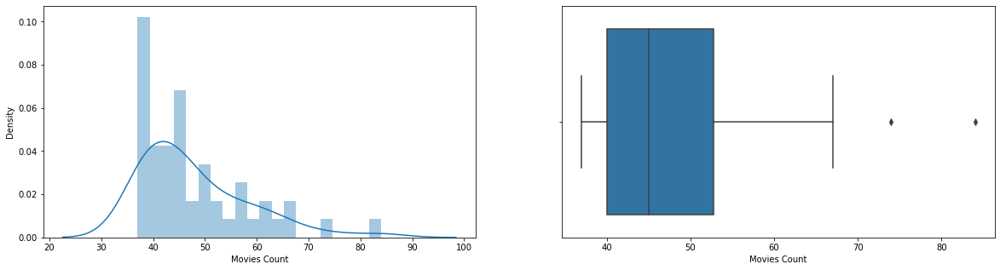

In [264]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(casts_data_movies['Movies Count'][:50], bins = 20, kde = True, ax = ax[0])
sns.boxplot(casts_data_movies['Movies Count'][:50], ax = ax[1])
plt.show()

In [265]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_casts_movies = casts_data_movies[casts_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_casts_movies = netflix_casts_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_casts_movies = casts_data_movies[casts_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_casts_movies = hulu_casts_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_casts_movies = casts_data_movies[casts_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_casts_movies = prime_video_casts_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_casts_movies = casts_data_movies[casts_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_casts_movies = disney_casts_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

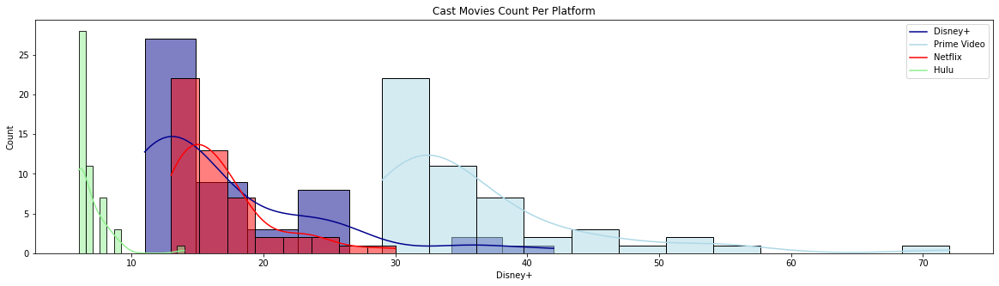

In [266]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Cast Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(disney_casts_movies['Disney+'][:50], color = 'darkblue', legend = True, kde = True)  
sns.histplot(prime_video_casts_movies['Prime Video'][:50], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_casts_movies['Netflix'][:50], color = 'red', legend = True, kde = True)
sns.histplot(hulu_casts_movies['Hulu'][:50], color = 'lightgreen', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Disney+', 'Prime Video', 'Netflix', 'Hulu'])
plt.show()

In [267]:
print(f'''
      The Cast with Highest Movies Count Rating Ever Got is '{df_casts_high_movies['Cast'][0]}' : '{df_casts_high_movies['Movies Count'].max()}'\n
      The Cast with Lowest Movies Count Rating Ever Got is '{df_casts_low_movies['Cast'][0]}' : '{df_casts_low_movies['Movies Count'].min()}'\n
      
      The Cast with Highest Movies Count Rating on 'Netflix' is '{netflix_casts_high_movies['Cast'][0]}' : '{netflix_casts_high_movies['Netflix'].max()}'\n
      The Cast with Lowest Movies Count Rating on 'Netflix' is '{netflix_casts_low_movies['Cast'][0]}' : '{netflix_casts_low_movies['Netflix'].min()}'\n
      
      The Cast with Highest Movies Count Rating on 'Hulu' is '{hulu_casts_high_movies['Cast'][0]}' : '{hulu_casts_high_movies['Hulu'].max()}'\n
      The Cast with Lowest Movies Count Rating on 'Hulu' is '{hulu_casts_low_movies['Cast'][0]}' : '{hulu_casts_low_movies['Hulu'].min()}'\n
      
      The Cast with Highest Movies Count Rating on 'Prime Video' is '{prime_video_casts_high_movies['Cast'][0]}' : '{prime_video_casts_high_movies['Prime Video'].max()}'\n
      The Cast with Lowest Movies Count Rating on 'Prime Video' is '{prime_video_casts_low_movies['Cast'][0]}' : '{prime_video_casts_low_movies['Prime Video'].min()}'\n
      
      The Cast with Highest Movies Count Rating on 'Disney+' is '{disney_casts_high_movies['Cast'][0]}' : '{disney_casts_high_movies['Disney+'].max()}'\n
      The Cast with Lowest Movies Count Rating on 'Disney+' is '{disney_casts_low_movies['Cast'][0]}' : '{disney_casts_low_movies['Disney+'].min()}'\n 
      ''')


      The Cast with Highest Movies Count Rating Ever Got is 'Frank Welker' : '84'

      The Cast with Lowest Movies Count Rating Ever Got is 'Oliver Lewis' : '1'

      
      The Cast with Highest Movies Count Rating on 'Netflix' is 'Shah Rukh Khan' : '30'

      The Cast with Lowest Movies Count Rating on 'Netflix' is 'Hayley Norris' : '0'

      
      The Cast with Highest Movies Count Rating on 'Hulu' is 'Frank Welker' : '14'

      The Cast with Lowest Movies Count Rating on 'Hulu' is 'Hayley Norris' : '0'

      
      The Cast with Highest Movies Count Rating on 'Prime Video' is 'Herman Hack' : '72'

      The Cast with Lowest Movies Count Rating on 'Prime Video' is 'Rob Moore' : '0'

      
      The Cast with Highest Movies Count Rating on 'Disney+' is 'Frank Welker' : '42'

      The Cast with Lowest Movies Count Rating on 'Disney+' is 'Hayley Norris' : '0'
 
      


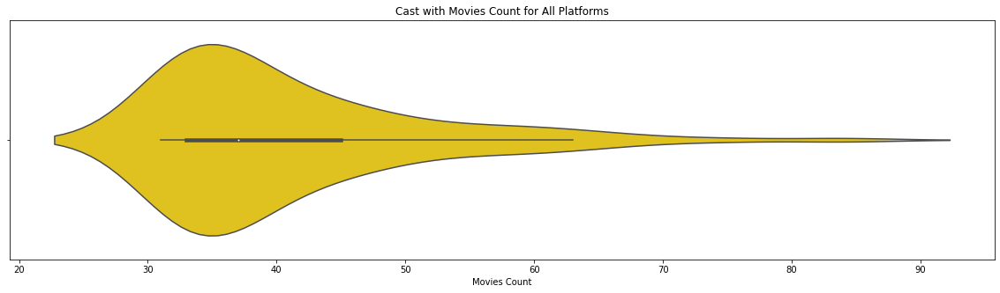

In [268]:
# Distribution of movies rating in each platform
plt.figure(figsize = (20, 5))
plt.title('Cast with Movies Count for All Platforms')
sns.violinplot(x = casts_data_movies['Movies Count'][:100], color = 'gold', legend = True, kde = True, shade = False)
plt.show()

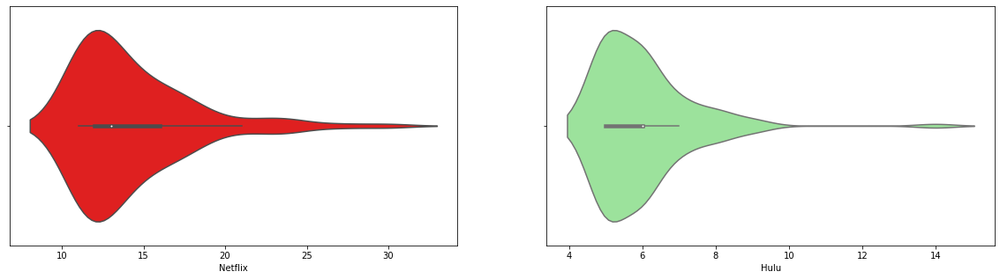

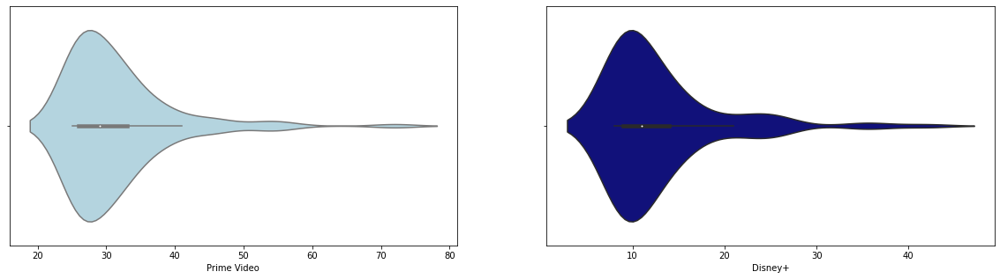

In [269]:
# Distribution of Cast Movies Count in each platform
f1, ax1 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = netflix_casts_movies['Netflix'][:100], color = 'red', ax = ax1[0])
sns.violinplot(x = hulu_casts_movies['Hulu'][:100], color = 'lightgreen', ax = ax1[1])
 
f2, ax2 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = prime_video_casts_movies['Prime Video'][:100], color = 'lightblue', ax = ax2[0])
sns.violinplot(x = disney_casts_movies['Disney+'][:100], color = 'darkblue', ax = ax2[1])
plt.show()

In [270]:
print(f'''
      Accross All Platforms the Average Movies Count of Cast is '{round(casts_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Cast on 'Netflix' is '{round(netflix_casts_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Cast on 'Hulu' is '{round(hulu_casts_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Cast on 'Prime Video' is '{round(prime_video_casts_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Cast on 'Disney+' is '{round(disney_casts_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Movies Count of Cast is '1.68'

      The Average Movies Count of Cast on 'Netflix' is '1.32'

      The Average Movies Count of Cast on 'Hulu' is '1.15'

      The Average Movies Count of Cast on 'Prime Video' is '1.52'

      The Average Movies Count of Cast on 'Disney+' is '1.31'
 
      


In [271]:
print(f'''
      Accross All Platforms Total Count of Cast is '{casts_data_movies['Cast'].unique().shape[0]}'\n
      Total Count of Cast on 'Netflix' is '{netflix_casts_movies['Cast'].unique().shape[0]}'\n
      Total Count of Cast on 'Hulu' is '{hulu_casts_movies['Cast'].unique().shape[0]}'\n
      Total Count of Cast on 'Prime Video' is '{prime_video_casts_movies['Cast'].unique().shape[0]}'\n
      Total Count of Cast on 'Disney+' is '{disney_casts_movies['Cast'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Cast is '315871'

      Total Count of Cast on 'Netflix' is '91466'

      Total Count of Cast on 'Hulu' is '37628'

      Total Count of Cast on 'Prime Video' is '240844'

      Total Count of Cast on 'Disney+' is '20717'
 
      


In [272]:
fig = px.bar(x = casts_data_movies['Cast'][:50], y = casts_data_movies['Movies Count'][:50], 
             color = casts_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Cast', 'y' : 'Number of Movies'})
fig.show()

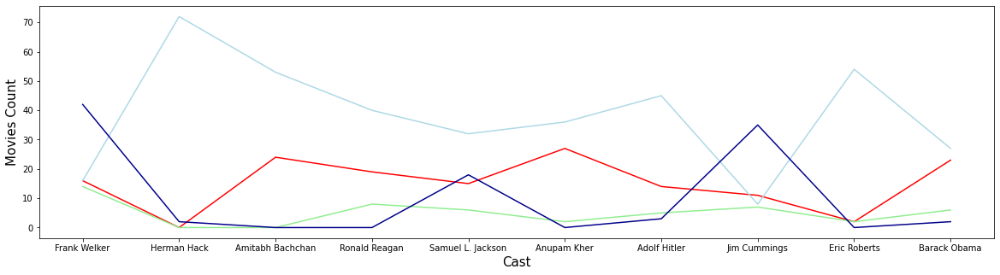

In [273]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = casts_data_movies['Cast'][:10], y = casts_data_movies['Netflix'][:10], color = 'red')
sns.lineplot(x = casts_data_movies['Cast'][:10], y = casts_data_movies['Hulu'][:10], color = 'lightgreen')
sns.lineplot(x = casts_data_movies['Cast'][:10], y = casts_data_movies['Prime Video'][:10], color = 'lightblue')
sns.lineplot(x = casts_data_movies['Cast'][:10], y = casts_data_movies['Disney+'][:10], color = 'darkblue')
plt.xlabel('Cast', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

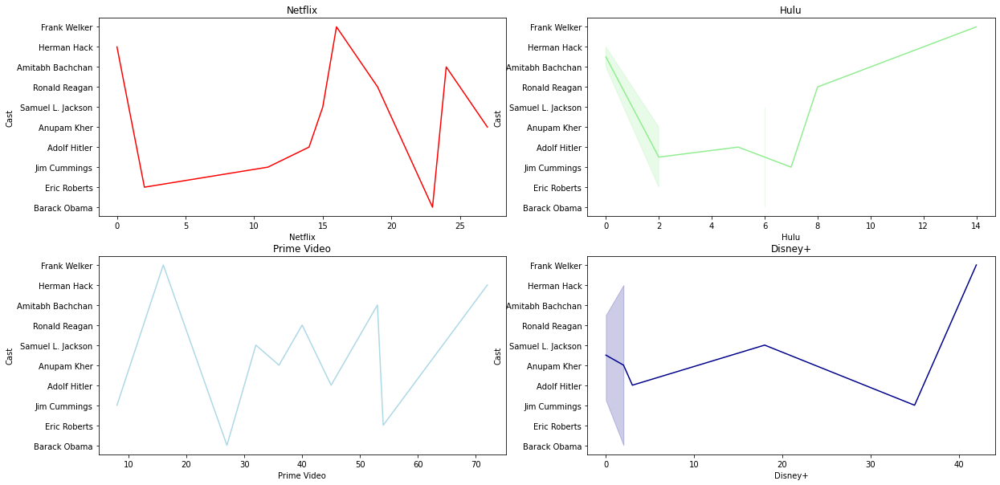

In [274]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_c_ax1 = sns.lineplot(y = casts_data_movies['Cast'][:10], x = casts_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_c_ax2 = sns.lineplot(y = casts_data_movies['Cast'][:10], x = casts_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_c_ax3 = sns.lineplot(y = casts_data_movies['Cast'][:10], x = casts_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_c_ax4 = sns.lineplot(y = casts_data_movies['Cast'][:10], x = casts_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_c_ax1.title.set_text(labels[0])
h_c_ax2.title.set_text(labels[1])
p_c_ax3.title.set_text(labels[2])
d_c_ax4.title.set_text(labels[3])
 
plt.show()

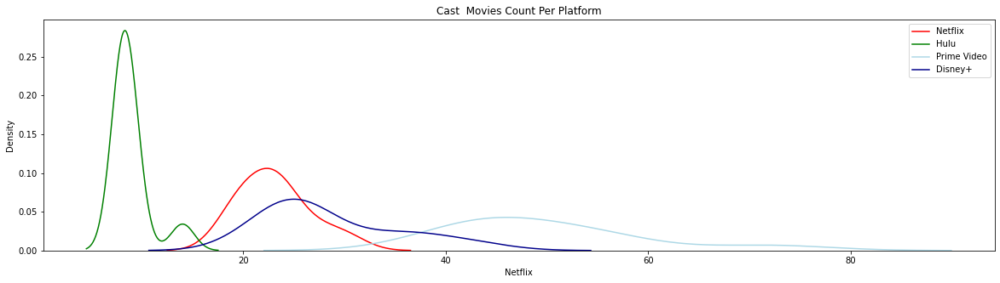

In [275]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Cast  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_casts_movies['Netflix'][:10], color = 'red', legend = True)
sns.kdeplot(hulu_casts_movies['Hulu'][:10], color = 'green', legend = True)
sns.kdeplot(prime_video_casts_movies['Prime Video'][:10], color = 'lightblue', legend = True)
sns.kdeplot(disney_casts_movies['Disney+'][:10], color = 'darkblue', legend = True)                                                                         
 
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

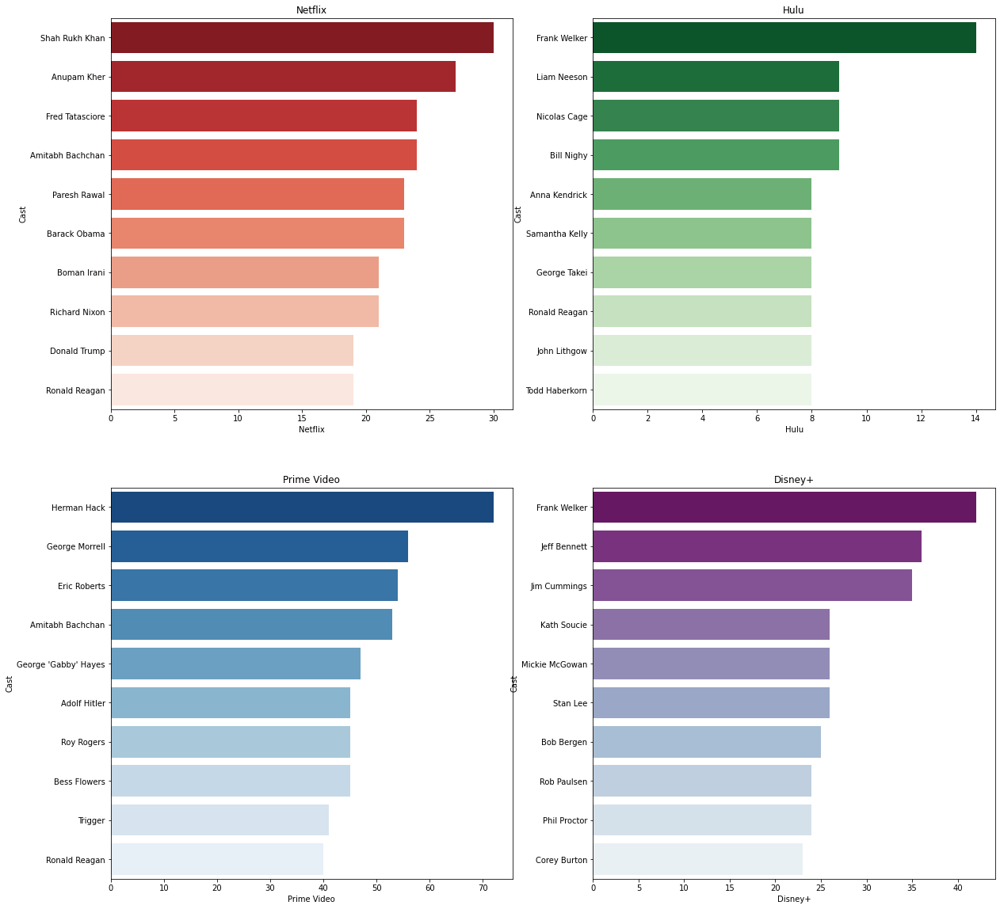

In [276]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_c_ax1 = sns.barplot(y = netflix_casts_movies['Cast'][:10], x = netflix_casts_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_c_ax2 = sns.barplot(y = hulu_casts_movies['Cast'][:10], x = hulu_casts_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_c_ax3 = sns.barplot(y = prime_video_casts_movies['Cast'][:10], x = prime_video_casts_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_c_ax4 = sns.barplot(y = disney_casts_movies['Cast'][:10], x = disney_casts_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_c_ax1.title.set_text(labels[0])
h_c_ax2.title.set_text(labels[1])
p_c_ax3.title.set_text(labels[2])
d_c_ax4.title.set_text(labels[3])
 
plt.show()

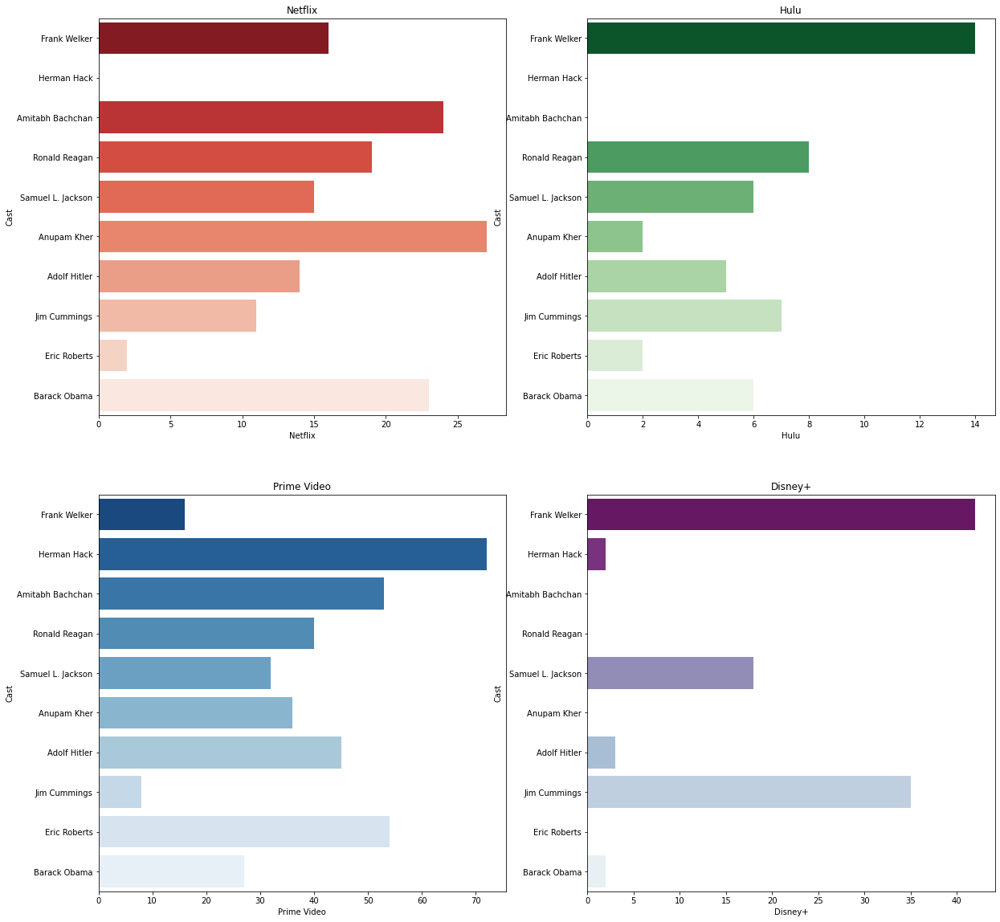

In [277]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_c_ax1 = sns.barplot(y = casts_data_movies['Cast'][:10], x = casts_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_c_ax2 = sns.barplot(y = casts_data_movies['Cast'][:10], x = casts_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_c_ax3 = sns.barplot(y = casts_data_movies['Cast'][:10], x = casts_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_c_ax4 = sns.barplot(y = casts_data_movies['Cast'][:10], x = casts_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_c_ax1.title.set_text(labels[0])
h_c_ax2.title.set_text(labels[1])
p_c_ax3.title.set_text(labels[2])
d_c_ax4.title.set_text(labels[3])
 
plt.show()

In [278]:
df_movies_mixed_casts.drop(df_movies_mixed_casts.loc[df_movies_mixed_casts['Cast'] == "NA"].index, inplace = True)
# df_movies_mixed_casts = df_movies_mixed_casts[df_movies_mixed_casts.Cast != "NA"]
df_movies_mixed_casts.drop(df_movies_mixed_casts.loc[df_movies_mixed_casts['Number of Cast'] == 1].index, inplace = True)

In [279]:
df_movies_mixed_casts.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Cast
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom",...,"Dom Cobb is a skilled thief, the absolute best...",148,movie,1,0,0,0,0,Netflix,84
1,2,The Matrix,1999,16,8.7,88,"Lana Wachowski,Lilly Wachowski","Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...","Action,Sci-Fi",United States,...,Thomas A. Anderson is a man living two lives. ...,136,movie,1,0,0,0,0,Netflix,41
2,3,Avengers: Infinity War,2018,13,8.4,85,"Anthony Russo,Joe Russo","Robert Downey Jr.,Chris Hemsworth,Mark Ruffalo...","Action,Adventure,Sci-Fi",United States,...,As the Avengers and their allies have continue...,149,movie,1,0,0,0,0,Netflix,141
3,4,Back to the Future,1985,7,8.5,96,Robert Zemeckis,"Michael J. Fox,Christopher Lloyd,Lea Thompson,...","Adventure,Comedy,Sci-Fi",United States,...,"Marty McFly, a typical American teenager of th...",116,movie,1,0,0,0,0,Netflix,59
4,5,"The Good, the Bad and the Ugly",1966,16,8.8,97,Sergio Leone,"Eli Wallach,Clint Eastwood,Lee Van Cleef,Aldo ...",Western,"Italy,Spain,West Germany,United States",...,Blondie (The Good) (Clint Eastwood) is a profe...,161,movie,1,0,1,0,0,Netflix,54


In [280]:
mixed_casts_count = df_movies_mixed_casts.groupby('Cast')['Title'].count()
mixed_casts_movies = df_movies_mixed_casts.groupby('Cast')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
mixed_casts_data_movies = pd.concat([mixed_casts_count, mixed_casts_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count', 'Cast' : 'Mixed Cast'})
mixed_casts_data_movies = mixed_casts_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [281]:
mixed_casts_data_movies.head(5)

,Mixed Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
3678,"Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",5,2,0,4,0
13311,"Shauna Macdonald,Natalie Mendoza,Alex Reid,Sas...",4,0,1,4,0
4304,"Elliot Page,Hayley McFarland,Nick Searcy,Romy ...",3,1,0,2,0
7261,"John Friedrich,Adrian Zmed,Ernest Harden Jr.,L...",3,0,0,3,0
3888,"Dominique Swain,Brad Renfro,Bijou Phillips,Mis...",3,0,0,3,0


In [282]:
# Mixed Cast with Movies Counts - All Platforms Combined
mixed_casts_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

,Mixed Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
3678,"Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",5,2,0,4,0
13311,"Shauna Macdonald,Natalie Mendoza,Alex Reid,Sas...",4,0,1,4,0
4304,"Elliot Page,Hayley McFarland,Nick Searcy,Romy ...",3,1,0,2,0
7261,"John Friedrich,Adrian Zmed,Ernest Harden Jr.,L...",3,0,0,3,0
3888,"Dominique Swain,Brad Renfro,Bijou Phillips,Mis...",3,0,0,3,0
15240,"Yuliya Peresild,Evgeniy Tsyganov,Oleg Vasilkov...",3,0,0,3,0
3608,"Deepak Chachra,Smita Malhotra,Tarun Ratnani",3,3,0,0,0
10000,"Mel Brooks,Dom DeLuise,Madeline Kahn,Harvey Ko...",3,0,0,3,0
1383,"Barbara Alyn Woods,Tina Ivlev,Lexi Ainsworth,B...",2,0,0,2,0
13732,"Steve Carell,Sheryl Lee,Todd Weeks,Paul Schack...",2,0,0,2,0


In [283]:
df_mixed_casts_high_movies = mixed_casts_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_mixed_casts_high_movies = df_mixed_casts_high_movies.drop(['index'], axis = 1)
# filter = (mixed_casts_data_movies['Movies Count'] = =  (mixed_casts_data_movies['Movies Count'].max()))
# df_mixed_casts_high_movies = mixed_casts_data_movies[filter]
 
# highest_rated_movies = mixed_casts_data_movies.loc[mixed_casts_data_movies['Movies Count'].idxmax()]
 
print('\nMixed Cast with Highest Ever Movies Count are : All Platforms Combined\n')
df_mixed_casts_high_movies.head(5)


Mixed Cast with Highest Ever Movies Count are : All Platforms Combined



,Mixed Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",5,2,0,4,0
1,"Shauna Macdonald,Natalie Mendoza,Alex Reid,Sas...",4,0,1,4,0
2,"Elliot Page,Hayley McFarland,Nick Searcy,Romy ...",3,1,0,2,0
3,"John Friedrich,Adrian Zmed,Ernest Harden Jr.,L...",3,0,0,3,0
4,"Dominique Swain,Brad Renfro,Bijou Phillips,Mis...",3,0,0,3,0


In [284]:
df_mixed_casts_low_movies = mixed_casts_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_mixed_casts_low_movies = df_mixed_casts_low_movies.drop(['index'], axis = 1)
# filter = (mixed_casts_data_movies['Movies Count'] = =  (mixed_casts_data_movies['Movies Count'].min()))
# df_mixed_casts_low_movies = mixed_casts_data_movies[filter]
 
print('\nMixed Cast with Lowest Ever Movies Count are : All Platforms Combined\n')
df_mixed_casts_low_movies.head(5)


Mixed Cast with Lowest Ever Movies Count are : All Platforms Combined



,Mixed Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Ryan Barton-Grimley,Jeremy Clark,Jes Mercer,Jo...",1,0,0,1,0
1,"Adriano Tardiolo,Agnese Graziani,Alba Rohrwach...",1,1,0,0,0
2,"Adrien Brody,Antonio Banderas,John Malkovich,R...",1,1,0,0,0
3,"Adrien Brody,Emilia Fox,Michal Zebrowski,Ed St...",1,1,0,1,0
4,"Adrien Gamache,Nathan Hamer,Trey Hatch,Selena ...",1,0,0,1,0


In [285]:
print(f'''
      Total '{df_movies['Cast'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{mixed_casts_data_movies['Mixed Cast'].unique().shape[0]}' Mixed Cast, They were Like this, \n
 
      {mixed_casts_data_movies.sort_values(by = 'Movies Count', ascending = False)['Mixed Cast'].head(5).unique()} etc. \n
 
      The Mixed Cast with Highest Movies Count have '{mixed_casts_data_movies['Movies Count'].max()}' Movies Available is '{df_mixed_casts_high_movies['Mixed Cast'][0]}', &\n
      The Mixed Cast with Lowest Movies Count have '{mixed_casts_data_movies['Movies Count'].min()}' Movies Available is '{df_mixed_casts_low_movies['Mixed Cast'][0]}'
      ''')


      Total '16923' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '15354' Mixed Cast, They were Like this, 

 
      ['Dennis Quaid,Greg Kinnear,Common,Charlie Saxton,Will Sasso,Odessa Rae,Seth MacFarlane,Mike Meldman,Hugh Jackman,Kate Winslet,Julie Claire,Katie Finneran,Roy Jenkins,Rocky Russo,Anna Madigan,Jeremy Allen White,Liev Schreiber,Naomi Watts,Alex Cranmer,Julie Ann Emery,Austin Cope,Anna Faris,Chris Pratt,J.B. Smoove,Jarrad Paul,Maria Arcé,Aaron LaPlante,Kieran Culkin,Emma Stone,Arthur French,Josh Shuman,Cathy Cliften,Cherina Monteniques Scott,Richard Gere,Kate Bosworth,Jack McBrayer,Aasif Mandvi,Zach Lasry,Darby Lynn Totten,Marc Ambrose,Justin Long,Jason Sudeikis,Uma Thurman,Bobby Cannavale,Kristen Bell,John Hodgman,Leslie Bibb,Will Carlough,Katrina Bowden,Phil Crowley,Ed Blythe,Olivia Roberts Payne,Monique Delee,Julie McNiven,Jaron Henrie-McCrea,Sebastian Banes,Severyn Banes,Rightor Doyle,Raven Burnett,Montana Byrne,Jarr

In [286]:
fig = px.pie(mixed_casts_data_movies[:20], names = 'Mixed Cast', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [287]:
# netflix_mixed_casts_movies = mixed_casts_data_movies[mixed_casts_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_mixed_casts_movies = netflix_mixed_casts_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_mixed_casts_high_movies = df_mixed_casts_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_casts_high_movies = netflix_mixed_casts_high_movies.drop(['index'], axis = 1)
 
netflix_mixed_casts_low_movies = df_mixed_casts_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_mixed_casts_low_movies = netflix_mixed_casts_low_movies.drop(['index'], axis = 1)
 
netflix_mixed_casts_high_movies.head(5)

,Mixed Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Deepak Chachra,Smita Malhotra,Tarun Ratnani",3,3,0,0,0
1,"Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",5,2,0,4,0
2,"Christian Bale,Dominic Purcell,Sean Bean,Chris...",2,2,0,0,0
3,"Ice Cube,Nia Long,John C. McGinley,Aleisha All...",2,2,0,1,0
4,"Milla Jovovich,Oded Fehr,Ali Larter,Iain Glen,...",2,2,0,0,0


In [288]:
# hulu_mixed_casts_movies = mixed_casts_data_movies[mixed_casts_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_mixed_casts_movies = hulu_mixed_casts_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_mixed_casts_high_movies = df_mixed_casts_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_casts_high_movies = hulu_mixed_casts_high_movies.drop(['index'], axis = 1)
 
hulu_mixed_casts_low_movies = df_mixed_casts_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_mixed_casts_low_movies = hulu_mixed_casts_low_movies.drop(['index'], axis = 1)
 
hulu_mixed_casts_high_movies.head(5)

,Mixed Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Asa Butterfield,Sophie Turner,Skyler Gisondo,W...",2,0,2,0,0
1,"Jeannie Elias,Kat Feller,Sandy Fox,Cindy Robin...",2,2,2,0,0
2,"Penélope Cruz,Carmen Maura,Lola Dueñas,Blanca ...",2,0,2,0,0
3,"Katie Holmes,Benjamin Bratt,Charlie Hunnam,Zoo...",2,0,2,0,0
4,"Robert De Niro,Ray Liotta,Joe Pesci,Lorraine B...",2,0,2,0,0


In [289]:
# prime_video_mixed_casts_movies = mixed_casts_data_movies[mixed_casts_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_mixed_casts_movies = prime_video_mixed_casts_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_mixed_casts_high_movies = df_mixed_casts_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_casts_high_movies = prime_video_mixed_casts_high_movies.drop(['index'], axis = 1)
 
prime_video_mixed_casts_low_movies = df_mixed_casts_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_mixed_casts_low_movies = prime_video_mixed_casts_low_movies.drop(['index'], axis = 1)
 
prime_video_mixed_casts_high_movies.head(5)

,Mixed Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Dennis Quaid,Greg Kinnear,Common,Charlie Saxto...",5,2,0,4,0
1,"Shauna Macdonald,Natalie Mendoza,Alex Reid,Sas...",4,0,1,4,0
2,"John Friedrich,Adrian Zmed,Ernest Harden Jr.,L...",3,0,0,3,0
3,"Dominique Swain,Brad Renfro,Bijou Phillips,Mis...",3,0,0,3,0
4,"Yuliya Peresild,Evgeniy Tsyganov,Oleg Vasilkov...",3,0,0,3,0


In [290]:
# disney_mixed_casts_movies = mixed_casts_data_movies[mixed_casts_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_mixed_casts_movies = disney_mixed_casts_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_mixed_casts_high_movies = df_mixed_casts_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_casts_high_movies = disney_mixed_casts_high_movies.drop(['index'], axis = 1)
 
disney_mixed_casts_low_movies = df_mixed_casts_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_mixed_casts_low_movies = disney_mixed_casts_low_movies.drop(['index'], axis = 1)
 
disney_mixed_casts_high_movies.head(5)

,Mixed Cast,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Hayley Mills,Dean Jones,Dorothy Provine,Roddy ...",2,0,0,0,2
1,"Jeff Bridges,Garrett Hedlund,Olivia Wilde,Bruc...",2,0,0,0,2
2,"Winston Hibler,Mogens Lind",2,0,0,0,2
3,"Joshua Bassett,Corbin Bleu,Matt Cornett,Tim Fe...",2,0,0,0,2
4,"Joaquin Phoenix,Jeremy Suarez,Jason Raize,Rick...",2,0,0,1,2


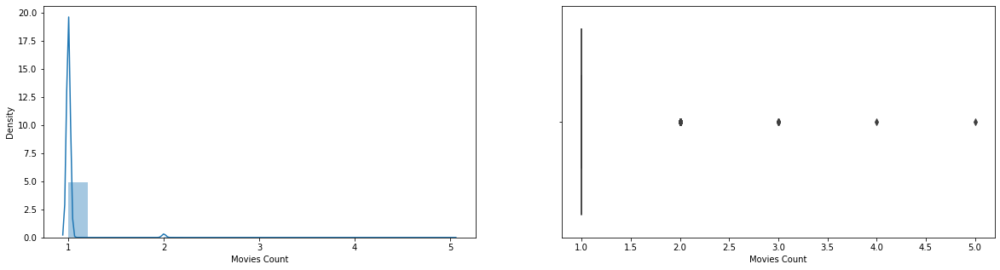

In [291]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(mixed_casts_data_movies['Movies Count'], bins = 20, kde = True, ax = ax[0])
sns.boxplot(mixed_casts_data_movies['Movies Count'], ax = ax[1])
plt.show()

In [292]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_mixed_casts_movies = mixed_casts_data_movies[mixed_casts_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_casts_movies = netflix_mixed_casts_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_mixed_casts_movies = mixed_casts_data_movies[mixed_casts_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_casts_movies = hulu_mixed_casts_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_mixed_casts_movies = mixed_casts_data_movies[mixed_casts_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_casts_movies = prime_video_mixed_casts_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_mixed_casts_movies = mixed_casts_data_movies[mixed_casts_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_casts_movies = disney_mixed_casts_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

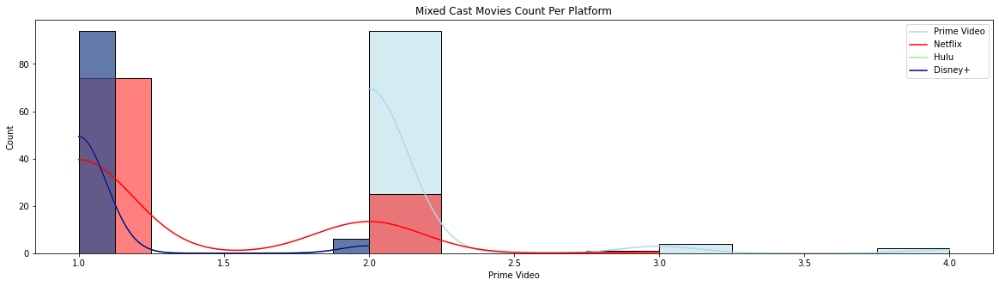

In [293]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Cast Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(prime_video_mixed_casts_movies['Prime Video'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_mixed_casts_movies['Netflix'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_mixed_casts_movies['Hulu'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_mixed_casts_movies['Disney+'][:100], color = 'darkblue', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [294]:
print(f'''
      The Mixed Cast with Highest Movies Count Rating Ever Got is '{df_mixed_casts_high_movies['Mixed Cast'][0]}' : '{df_mixed_casts_high_movies['Movies Count'].max()}'\n
      The Mixed Cast with Lowest Movies Count Rating Ever Got is '{df_mixed_casts_low_movies['Mixed Cast'][0]}' : '{df_mixed_casts_low_movies['Movies Count'].min()}'\n
      
      The Mixed Cast with Highest Movies Count Rating on 'Netflix' is '{netflix_mixed_casts_high_movies['Mixed Cast'][0]}' : '{netflix_mixed_casts_high_movies['Netflix'].max()}'\n
      The Mixed Cast with Lowest Movies Count Rating on 'Netflix' is '{netflix_mixed_casts_low_movies['Mixed Cast'][0]}' : '{netflix_mixed_casts_low_movies['Netflix'].min()}'\n
      
      The Mixed Cast with Highest Movies Count Rating on 'Hulu' is '{hulu_mixed_casts_high_movies['Mixed Cast'][0]}' : '{hulu_mixed_casts_high_movies['Hulu'].max()}'\n
      The Mixed Cast with Lowest Movies Count Rating on 'Hulu' is '{hulu_mixed_casts_low_movies['Mixed Cast'][0]}' : '{hulu_mixed_casts_low_movies['Hulu'].min()}'\n
      
      The Mixed Cast with Highest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_casts_high_movies['Mixed Cast'][0]}' : '{prime_video_mixed_casts_high_movies['Prime Video'].max()}'\n
      The Mixed Cast with Lowest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_casts_low_movies['Mixed Cast'][0]}' : '{prime_video_mixed_casts_low_movies['Prime Video'].min()}'\n
      
      The Mixed Cast with Highest Movies Count Rating on 'Disney+' is '{disney_mixed_casts_high_movies['Mixed Cast'][0]}' : '{disney_mixed_casts_high_movies['Disney+'].max()}'\n
      The Mixed Cast with Lowest Movies Count Rating on 'Disney+' is '{disney_mixed_casts_low_movies['Mixed Cast'][0]}' : '{disney_mixed_casts_low_movies['Disney+'].min()}'\n 
      ''')


      The Mixed Cast with Highest Movies Count Rating Ever Got is 'Dennis Quaid,Greg Kinnear,Common,Charlie Saxton,Will Sasso,Odessa Rae,Seth MacFarlane,Mike Meldman,Hugh Jackman,Kate Winslet,Julie Claire,Katie Finneran,Roy Jenkins,Rocky Russo,Anna Madigan,Jeremy Allen White,Liev Schreiber,Naomi Watts,Alex Cranmer,Julie Ann Emery,Austin Cope,Anna Faris,Chris Pratt,J.B. Smoove,Jarrad Paul,Maria Arcé,Aaron LaPlante,Kieran Culkin,Emma Stone,Arthur French,Josh Shuman,Cathy Cliften,Cherina Monteniques Scott,Richard Gere,Kate Bosworth,Jack McBrayer,Aasif Mandvi,Zach Lasry,Darby Lynn Totten,Marc Ambrose,Justin Long,Jason Sudeikis,Uma Thurman,Bobby Cannavale,Kristen Bell,John Hodgman,Leslie Bibb,Will Carlough,Katrina Bowden,Phil Crowley,Ed Blythe,Olivia Roberts Payne,Monique Delee,Julie McNiven,Jaron Henrie-McCrea,Sebastian Banes,Severyn Banes,Rightor Doyle,Raven Burnett,Montana Byrne,Jarrett Carter,Phillip Michaels,Christopher Mintz-Plasse,Chloë Grace Moretz,Patrick Warburton,Jimmy Bennett,M

In [295]:
print(f'''
      Accross All Platforms the Average Movies Count of Mixed Cast is '{round(mixed_casts_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Cast on 'Netflix' is '{round(netflix_mixed_casts_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Cast on 'Hulu' is '{round(hulu_mixed_casts_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Cast on 'Prime Video' is '{round(prime_video_mixed_casts_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Cast on 'Disney+' is '{round(disney_mixed_casts_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Movies Count of Mixed Cast is '1.02'

      The Average Movies Count of Mixed Cast on 'Netflix' is '1.01'

      The Average Movies Count of Mixed Cast on 'Hulu' is '1.01'

      The Average Movies Count of Mixed Cast on 'Prime Video' is '1.01'

      The Average Movies Count of Mixed Cast on 'Disney+' is '1.01'
 
      


In [296]:
print(f'''
      Accross All Platforms Total Count of Mixed Cast is '{mixed_casts_data_movies['Mixed Cast'].unique().shape[0]}'\n
      Total Count of Mixed Cast on 'Netflix' is '{netflix_mixed_casts_movies['Mixed Cast'].unique().shape[0]}'\n
      Total Count of Mixed Cast on 'Hulu' is '{hulu_mixed_casts_movies['Mixed Cast'].unique().shape[0]}'\n
      Total Count of Mixed Cast on 'Prime Video' is '{prime_video_mixed_casts_movies['Mixed Cast'].unique().shape[0]}'\n
      Total Count of Mixed Cast on 'Disney+' is '{disney_mixed_casts_movies['Mixed Cast'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Mixed Cast is '15354'

      Total Count of Mixed Cast on 'Netflix' is '3229'

      Total Count of Mixed Cast on 'Hulu' is '1024'

      Total Count of Mixed Cast on 'Prime Video' is '11280'

      Total Count of Mixed Cast on 'Disney+' is '528'
 
      


In [297]:
fig = px.bar(x = mixed_casts_data_movies['Mixed Cast'][:50], y = mixed_casts_data_movies['Movies Count'][:50], 
             color = mixed_casts_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Mixed Cast', 'y' : 'Number of Movies'})
fig.show()

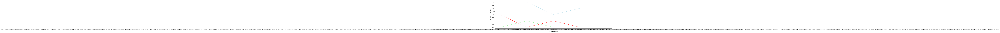

In [298]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = mixed_casts_data_movies['Mixed Cast'][:5], y = mixed_casts_data_movies['Netflix'][:5], color = 'red')
sns.lineplot(x = mixed_casts_data_movies['Mixed Cast'][:5], y = mixed_casts_data_movies['Hulu'][:5], color = 'lightgreen')
sns.lineplot(x = mixed_casts_data_movies['Mixed Cast'][:5], y = mixed_casts_data_movies['Prime Video'][:5], color = 'lightblue')
sns.lineplot(x = mixed_casts_data_movies['Mixed Cast'][:5], y = mixed_casts_data_movies['Disney+'][:5], color = 'darkblue')
plt.xlabel('Mixed Cast', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

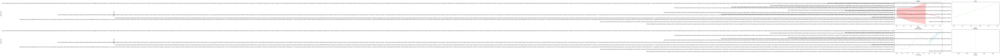

In [299]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_mg_ax1 = sns.lineplot(y = mixed_casts_data_movies['Mixed Cast'][:10], x = mixed_casts_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_mg_ax2 = sns.lineplot(y = mixed_casts_data_movies['Mixed Cast'][:10], x = mixed_casts_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_mg_ax3 = sns.lineplot(y = mixed_casts_data_movies['Mixed Cast'][:10], x = mixed_casts_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_mg_ax4 = sns.lineplot(y = mixed_casts_data_movies['Mixed Cast'][:10], x = mixed_casts_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_mg_ax1.title.set_text(labels[0])
h_mg_ax2.title.set_text(labels[1])
p_mg_ax3.title.set_text(labels[2])
d_mg_ax4.title.set_text(labels[3])
 
plt.show()

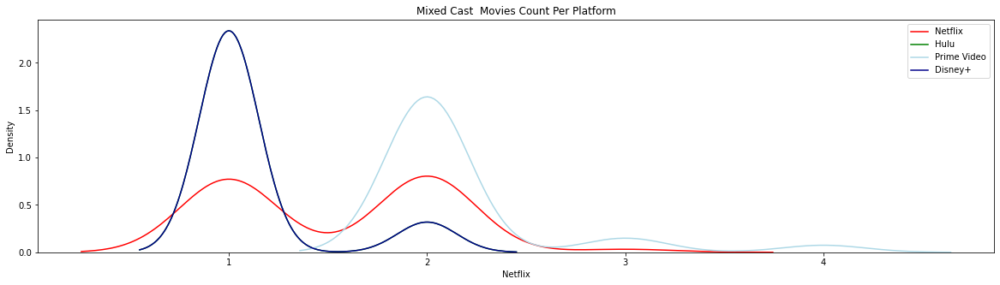

In [300]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Cast  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_mixed_casts_movies['Netflix'][:50], color = 'red', legend = True)
sns.kdeplot(hulu_mixed_casts_movies['Hulu'][:50], color = 'green', legend = True)
sns.kdeplot(prime_video_mixed_casts_movies['Prime Video'][:50], color = 'lightblue', legend = True)
sns.kdeplot(disney_mixed_casts_movies['Disney+'][:50], color = 'darkblue', legend = True)                                      

# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [301]:
fig = go.Figure(go.Funnel(y = mixed_casts_data_movies['Mixed Cast'][:10],x = mixed_casts_data_movies['Movies Count'][:10]))
fig.show()

In [302]:
df_movies_genres = df_movies.copy()

In [303]:
# Create genres dict where key=name and value = number of genres
 
genres = {}
 
for i in df_movies_genres['Genres'].dropna():
    if i != "NA":
        #print(i,len(i.split(',')))
        genres[i] = len(i.split(','))
    else:
        genres[i] = 0
    
# Add this information to our dataframe as a new column
 
df_movies_genres['Number of Genres'] = df_movies_genres['Genres'].map(genres).astype(int)

In [304]:
df_genres_most_movies = df_movies_genres.sort_values(by = 'Number of Genres', ascending = False).reset_index()
df_genres_most_movies = df_genres_most_movies.drop(['index'], axis = 1)
# filter = (df_movies_genres['Genres'] == (df_movies_genres['Number of Genres'].max()))
# df_genres_most_movies = df_movies_genres[filter]
 
# mostest_rated_movies = df_movies_genres.loc[df_movies_genres['Number of Genres'].idxmax()]
 
print('\nMovies with Highest Ever Genres Count are : \n')
df_genres_most_movies.head(5)


Movies with Highest Ever Genres Count are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Genres
0,12791,"Gappa, the Triphibian Monster",1967,7,4.3,NA,Hiroshi Noguchi,"Tamio Kawaji,Yôko Yamamoto,Yûji Odaka,Kôji Wad...","Action,Adventure,Comedy,Drama,Family,Fantasy,H...",Japan,...,A frontier preacher's life is destroyed when a...,90,movie,0,0,1,0,0,Prime Video,9
1,6260,Motorama,1991,16,6.4,60,Barry Shils,"Jordan Christopher Michael,Martha Quinn,Michae...","Adventure,Comedy,Crime,Drama,Fantasy,Mystery,S...",United States,...,An American nurse takes a temporary position o...,90,movie,0,0,1,0,0,Prime Video,8
2,288,April and the Extraordinary World,2015,7,7.3,97,"Christian Desmares,Franck Ekinci","Marion Cotillard,Marc-André Grondin,Philippe K...","Animation,Adventure,Comedy,Drama,Family,Myster...","France,Canada,Belgium",...,"In 1941, the world is radically different from...",105,movie,1,0,0,0,0,Netflix,8
3,7986,Gumby: The Movie,1995,0,6.3,20,Art Clokey,"Dal McKennon,Art Clokey,Gloria Clokey,Manny La...","Animation,Adventure,Comedy,Family,Fantasy,Musi...",United States,...,Part I depicts the lives of two low-life thiev...,90,movie,0,0,1,0,0,Prime Video,8
4,8618,Inspector Gadget's Last Case,2002,7,4.9,NA,Michael Maliani,"Maurice LaMarche,Bettina Bush,Jim Byrnes,Micha...","Animation,Action,Adventure,Comedy,Crime,Family...","Canada,United States",...,The tough gun-man Burt Sullivan (Franco Nero) ...,73,movie,0,0,1,0,0,Prime Video,8


In [305]:
df_genres_least_movies = df_movies_genres.sort_values(by = 'Number of Genres', ascending = True).reset_index()
df_genres_least_movies = df_genres_least_movies.drop(['index'], axis = 1)
# filter = (df_movies_genres['Genres'] == (df_movies_genres['Number of Genres'].min()))
# df_genres_least_movies = df_movies_genres[filter]
 
print('\nMovies with Lowest Ever Genres Count are : \n')
df_genres_least_movies.head(5)


Movies with Lowest Ever Genres Count are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Genres
0,3455,ChuChuTV Surprise Eggs Learning Videos (Hindi),2019,NR,NA,NA,NA,NA,NA,NA,...,NA,NA,movie,1,0,0,0,0,Netflix,0
1,15658,Princess Diana: The Quiet Revolution,2017,NR,NA,NA,NA,NA,NA,NA,...,"From deep in the heart of Texas, the Christian...",NA,movie,0,0,1,0,0,Prime Video,0
2,15663,Lost Technology of Ancient Egypt: Part I,2018,NR,NA,NA,NA,NA,NA,NA,...,«Napoli Dogs» is a soap opera set in the charm...,NA,movie,0,0,1,0,0,Prime Video,0
3,15666,Brad Stine - Boycott This!,2016,NR,NA,NA,NA,NA,NA,NA,...,NA,NA,movie,0,0,1,0,0,Prime Video,0
4,11897,Magick of Solomon: Lemegeton Secrets Revealed,2010,NR,3.8,NA,NA,NA,NA,NA,...,Still reeling from a rocky divorce and the rec...,NA,movie,0,0,1,0,0,Prime Video,0


In [306]:
print(f'''
      Total '{df_movies_genres['Genres'].unique().shape[0]}' unique Genres Counts were Given, They were Like this,\n
      
      {df_movies_genres.sort_values(by = 'Number of Genres', ascending = False)['Genres'].unique()[:5]} etc.\n
 
      The Highest Ever Genres Count Ever Any TV Show Got is '{df_genres_most_movies['Title'][0]}' : '{df_genres_most_movies['Number of Genres'].max()}'\n
 
      The Lowest Ever Genres Count Ever Any TV Show Got is '{df_genres_least_movies['Title'][0]}' : '{df_genres_least_movies['Number of Genres'].min()}'\n
      ''')


      Total '1888' unique Genres Counts were Given, They were Like this,

      
      ['Action,Adventure,Comedy,Drama,Family,Fantasy,Horror,Sci-Fi,Thriller'
 'Adventure,Comedy,Crime,Drama,Fantasy,Mystery,Sci-Fi,Thriller'
 'Animation,Adventure,Comedy,Drama,Family,Mystery,Sci-Fi,Thriller'
 'Animation,Adventure,Comedy,Family,Fantasy,Music,Sci-Fi,Western'
 'Animation,Action,Adventure,Comedy,Crime,Family,Mystery,Sci-Fi'] etc.

 
      The Highest Ever Genres Count Ever Any TV Show Got is 'Gappa, the Triphibian Monster' : '9'

 
      The Lowest Ever Genres Count Ever Any TV Show Got is 'ChuChuTV Surprise Eggs Learning Videos (Hindi)' : '0'

      


In [307]:
netflix_genres_most_movies = df_genres_most_movies.loc[df_genres_most_movies['Netflix']==1].reset_index()
netflix_genres_most_movies = netflix_genres_most_movies.drop(['index'], axis = 1)
 
netflix_genres_least_movies = df_genres_least_movies.loc[df_genres_least_movies['Netflix']==1].reset_index()
netflix_genres_least_movies = netflix_genres_least_movies.drop(['index'], axis = 1)
 
netflix_genres_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Genres
0,288,April and the Extraordinary World,2015,7,7.3,97,"Christian Desmares,Franck Ekinci","Marion Cotillard,Marc-André Grondin,Philippe K...","Animation,Adventure,Comedy,Drama,Family,Myster...","France,Canada,Belgium",...,"In 1941, the world is radically different from...",105,movie,1,0,0,0,0,Netflix,8
1,2047,Alpha and Omega: The Legend of the Saw Tooth Cave,2014,7,5.4,NA,Richard Rich,"Kate Higgins,Ben Diskin,Debi Derryberry,Mariev...","Animation,Action,Adventure,Comedy,Drama,Family...","United States,India",...,NA,45,movie,1,0,0,0,0,Netflix,8
2,1054,WHAT DID JACK DO?,2017,16,6.5,92,David Lynch,"Jack Cruz,David Lynch,Toototabon,Emily Stofle","Short,Comedy,Crime,Drama,Fantasy,Music,Mystery...",United States,...,"Dressed up in a formal suit, evoking memories ...",17,movie,1,0,0,0,0,Netflix,8
3,122,The Princess and the Frog,2009,0,7.1,85,"Ron Clements,John Musker","Anika Noni Rose,Bruno Campos,Keith David,Micha...","Animation,Adventure,Comedy,Family,Fantasy,Musi...",United States,...,A modern day retelling of the classic story Th...,97,movie,1,0,0,1,0,Netflix,7
4,2012,Tremors 4: The Legend Begins,2004,13,5.3,NA,S.S. Wilson,"Michael Gross,Sara Botsford,Billy Drago,Brent ...","Action,Adventure,Comedy,Horror,Sci-Fi,Thriller...",United States,...,"In 1889, the town of Rejection, Nevada, depend...",101,movie,1,0,0,0,0,Netflix,7


In [308]:
hulu_genres_most_movies = df_genres_most_movies.loc[df_genres_most_movies['Hulu']==1].reset_index()
hulu_genres_most_movies = hulu_genres_most_movies.drop(['index'], axis = 1)
 
hulu_genres_least_movies = df_genres_least_movies.loc[df_genres_least_movies['Hulu']==1].reset_index()
hulu_genres_least_movies = hulu_genres_least_movies.drop(['index'], axis = 1)
 
hulu_genres_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Genres
0,3947,Sherlock Gnomes,2018,7,5.2,27,John Stevenson,"Kelly Asbury,Mary J. Blige,Emily Blunt,Julio B...","Animation,Adventure,Comedy,Family,Fantasy,Myst...","United Kingdom,United States,India,Canada,Fran...",...,Sherlock Gnomes (Johnny Depp) and his assistan...,86,movie,0,1,1,0,0,Prime Video,7
1,4032,Wakko's Wish,1999,0,7.3,NA,"Liz Holzman,Rusty Mills,Tom Ruegger,Russell Ca...","Rob Paulsen,Jess Harnell,Tress MacNeille,Mauri...","Animation,Adventure,Comedy,Drama,Family,Fantas...",United States,...,The Warner Brothers (and the Warner Sister) go...,80,movie,0,1,0,0,0,Hulu,7
2,3549,Thelma,2017,NR,7,85,Joachim Trier,"Eili Harboe,Kaya Wilkins,Henrik Rafaelsen,Elle...","Drama,Fantasy,Horror,Mystery,Romance,Sci-Fi,Th...","Norway,France,Denmark,Sweden",...,Having just enrolled at a university in Oslo a...,116,movie,0,1,0,0,0,Hulu,7
3,3583,Anthropoid,2016,16,7.2,66,Sean Ellis,"Jamie Dornan,Cillian Murphy,Brian Caspe,Karel ...","Action,Biography,Drama,History,Romance,Thrille...","Czech Republic,United Kingdom,United States,Fr...",...,ANTHROPOID is based on the extraordinary true ...,120,movie,0,1,0,0,0,Hulu,7
4,3828,The Osiris Child,2016,NR,5.6,62,Shane Abbess,"Kellan Lutz,Daniel MacPherson,Isabel Lucas,Luk...","Action,Adventure,Drama,Fantasy,Horror,Sci-Fi,T...",Australia,...,"Set in a time of interplanetary colonization, ...",99,movie,0,1,0,0,0,Hulu,7


In [309]:
prime_video_genres_most_movies = df_genres_most_movies.loc[df_genres_most_movies['Prime Video']==1].reset_index()
prime_video_genres_most_movies = prime_video_genres_most_movies.drop(['index'], axis = 1)
 
prime_video_genres_least_movies = df_genres_least_movies.loc[df_genres_least_movies['Prime Video']==1].reset_index()
prime_video_genres_least_movies = prime_video_genres_least_movies.drop(['index'], axis = 1)
 
prime_video_genres_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Genres
0,12791,"Gappa, the Triphibian Monster",1967,7,4.3,NA,Hiroshi Noguchi,"Tamio Kawaji,Yôko Yamamoto,Yûji Odaka,Kôji Wad...","Action,Adventure,Comedy,Drama,Family,Fantasy,H...",Japan,...,A frontier preacher's life is destroyed when a...,90,movie,0,0,1,0,0,Prime Video,9
1,6260,Motorama,1991,16,6.4,60,Barry Shils,"Jordan Christopher Michael,Martha Quinn,Michae...","Adventure,Comedy,Crime,Drama,Fantasy,Mystery,S...",United States,...,An American nurse takes a temporary position o...,90,movie,0,0,1,0,0,Prime Video,8
2,7986,Gumby: The Movie,1995,0,6.3,20,Art Clokey,"Dal McKennon,Art Clokey,Gloria Clokey,Manny La...","Animation,Adventure,Comedy,Family,Fantasy,Musi...",United States,...,Part I depicts the lives of two low-life thiev...,90,movie,0,0,1,0,0,Prime Video,8
3,8618,Inspector Gadget's Last Case,2002,7,4.9,NA,Michael Maliani,"Maurice LaMarche,Bettina Bush,Jim Byrnes,Micha...","Animation,Action,Adventure,Comedy,Crime,Family...","Canada,United States",...,The tough gun-man Burt Sullivan (Franco Nero) ...,73,movie,0,0,1,0,0,Prime Video,8
4,16827,One Thousand and One Nights,2015,NR,6.6,NA,Eiichi Yamamoto,"Sachiko Itô,Haruko Katô,Noboru Mitani,Hiroshi ...","Animation,Action,Adventure,Comedy,Drama,Fantas...",Japan,...,NA,128,movie,0,0,1,0,0,Prime Video,8


In [310]:
disney_genres_most_movies = df_genres_most_movies.loc[df_genres_most_movies['Disney+']==1].reset_index()
disney_genres_most_movies = disney_genres_most_movies.drop(['index'], axis = 1)
 
disney_genres_least_movies = df_genres_least_movies.loc[df_genres_least_movies['Disney+']==1].reset_index()
disney_genres_least_movies = disney_genres_least_movies.drop(['index'], axis = 1)
 
disney_genres_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Genres
0,16106,Atlantis: Milo's Return,2003,0,5.1,NA,"Victor Cook,Toby Shelton,Tad Stones","James Arnold Taylor,Cree Summer,John Mahoney,J...","Animation,Action,Adventure,Comedy,Drama,Family...",United States,...,NA,70,movie,0,0,0,1,0,Disney+,8
1,15997,The Wizards Return: Alex vs. Alex,2013,7,6.5,NA,Victor Gonzalez,"Selena Gomez,Jake T. Austin,Jennifer Stone,Gre...","Animation,Action,Adventure,Comedy,Drama,Family...",United States,...,Dylan Shoenfield is the pink princess of the u...,60,movie,0,0,0,1,0,Disney+,8
2,122,The Princess and the Frog,2009,0,7.1,85,"Ron Clements,John Musker","Anika Noni Rose,Bruno Campos,Keith David,Micha...","Animation,Adventure,Comedy,Family,Fantasy,Musi...",United States,...,A modern day retelling of the classic story Th...,97,movie,1,0,0,1,0,Netflix,7
3,15958,Saludos Amigos,1942,13,6.1,75,"Wilfred Jackson,Jack Kinney,Hamilton Luske,Bil...","Fred Shields,José Oliveira,Lee Blair,Mary Blai...","Animation,Short,Adventure,Comedy,Family,Fantas...","United States,Brazil,Bolivia",...,NA,42,movie,0,0,0,1,0,Disney+,7
4,15986,Leroy & Stitch,2006,0,6.2,40,"Tony Craig,Roberts Gannaway","Daveigh Chase,Chris Sanders,David Ogden Stiers...","Animation,Action,Adventure,Comedy,Drama,Family...",United States,...,Five happy years after baby Mary's arrival in ...,73,movie,0,0,0,1,0,Disney+,7


In [311]:
print(f'''
      The TV Show with Highest Genres Count Ever Got is '{df_genres_most_movies['Title'][0]}' : '{df_genres_most_movies['Number of Genres'].max()}'\n
      The TV Show with Lowest Genres Count Ever Got is '{df_genres_least_movies['Title'][0]}' : '{df_genres_least_movies['Number of Genres'].min()}'\n
      
      The TV Show with Highest Genres Count on 'Netflix' is '{netflix_genres_most_movies['Title'][0]}' : '{netflix_genres_most_movies['Number of Genres'].max()}'\n
      The TV Show with Lowest Genres Count on 'Netflix' is '{netflix_genres_least_movies['Title'][0]}' : '{netflix_genres_least_movies['Number of Genres'].min()}'\n
      
      The TV Show with Highest Genres Count on 'Hulu' is '{hulu_genres_most_movies['Title'][0]}' : '{hulu_genres_most_movies['Number of Genres'].max()}'\n
      The TV Show with Lowest Genres Count on 'Hulu' is '{hulu_genres_least_movies['Title'][0]}' : '{hulu_genres_least_movies['Number of Genres'].min()}'\n
      
      The TV Show with Highest Genres Count on 'Prime Video' is '{prime_video_genres_most_movies['Title'][0]}' : '{prime_video_genres_most_movies['Number of Genres'].max()}'\n
      The TV Show with Lowest Genres Count on 'Prime Video' is '{prime_video_genres_least_movies['Title'][0]}' : '{prime_video_genres_least_movies['Number of Genres'].min()}'\n
      
      The TV Show with Highest Genres Count on 'Disney+' is '{disney_genres_most_movies['Title'][0]}' : '{disney_genres_most_movies['Number of Genres'].max()}'\n
      The TV Show with Lowest Genres Count on 'Disney+' is '{disney_genres_least_movies['Title'][0]}' : '{disney_genres_least_movies['Number of Genres'].min()}'\n 
      ''')


      The TV Show with Highest Genres Count Ever Got is 'Gappa, the Triphibian Monster' : '9'

      The TV Show with Lowest Genres Count Ever Got is 'ChuChuTV Surprise Eggs Learning Videos (Hindi)' : '0'

      
      The TV Show with Highest Genres Count on 'Netflix' is 'April and the Extraordinary World' : '8'

      The TV Show with Lowest Genres Count on 'Netflix' is 'ChuChuTV Surprise Eggs Learning Videos (Hindi)' : '0'

      
      The TV Show with Highest Genres Count on 'Hulu' is 'Sherlock Gnomes' : '7'

      The TV Show with Lowest Genres Count on 'Hulu' is 'Thomas & Friends: Songs from the Station' : '0'

      
      The TV Show with Highest Genres Count on 'Prime Video' is 'Gappa, the Triphibian Monster' : '9'

      The TV Show with Lowest Genres Count on 'Prime Video' is 'Princess Diana: The Quiet Revolution' : '0'

      
      The TV Show with Highest Genres Count on 'Disney+' is 'Atlantis: Milo's Return' : '8'

      The TV Show with Lowest Genres Count on 'Disney+

In [312]:
print(f'''
      Accross All Platforms the Average Genres Count is '{round(df_movies_genres['Number of Genres'].mean(), ndigits = 2)}'\n
      The Average Genres Count on 'Netflix' is '{round(netflix_genres_most_movies['Number of Genres'].mean(), ndigits = 2)}'\n
      The Average Genres Count on 'Hulu' is '{round(hulu_genres_most_movies['Number of Genres'].mean(), ndigits = 2)}'\n
      The Average Genres Count on 'Prime Video' is '{round(prime_video_genres_most_movies['Number of Genres'].mean(), ndigits = 2)}'\n
      The Average Genres Count on 'Disney+' is '{round(disney_genres_most_movies['Number of Genres'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Genres Count is '2.37'

      The Average Genres Count on 'Netflix' is '2.39'

      The Average Genres Count on 'Hulu' is '2.62'

      The Average Genres Count on 'Prime Video' is '2.3'

      The Average Genres Count on 'Disney+' is '3.73'
 
      


In [313]:
print(f'''
      Accross All Platforms Total Count of Genres is '{df_movies_genres['Genres'].unique().shape[0]}'\n
      Total Count of Genres on 'Netflix' is '{netflix_genres_most_movies['Genres'].unique().shape[0]}'\n
      Total Count of Genres on 'Hulu' is '{hulu_genres_most_movies['Genres'].unique().shape[0]}'\n
      Total Count of Genres on 'Prime Video' is '{prime_video_genres_most_movies['Genres'].unique().shape[0]}'\n
      Total Count of Genres on 'Disney+' is '{disney_genres_most_movies['Genres'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Genres is '1888'

      Total Count of Genres on 'Netflix' is '700'

      Total Count of Genres on 'Hulu' is '364'

      Total Count of Genres on 'Prime Video' is '1511'

      Total Count of Genres on 'Disney+' is '281'
 
      


In [314]:
df_movies_genres.drop(df_movies_genres.loc[df_movies_genres['Genres'] == "NA"].index, inplace = True)
# df_movies_genres = df_movies_genres[df_movies_genres.Genres != "NA"]

In [315]:
df_movies_mixed_genres = df_movies_genres.copy()

In [316]:
df_gen = df_movies_genres['Genres'].str.split(',').apply(pd.Series).stack()
del df_movies_genres['Genres']
df_gen.index = df_gen.index.droplevel(-1)
df_gen.name = 'Genres'
df_movies_genres = df_movies_genres.join(df_gen)
df_movies_genres.drop_duplicates(inplace = True)

In [317]:
df_movies_genres.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Country,Language,...,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Genres,Genres
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,4,Action
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,4,Adventure
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,4,Sci-Fi
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","United States,United Kingdom","English,Japanese,French",...,148,movie,1,0,0,0,0,Netflix,4,Thriller
1,2,The Matrix,1999,16,8.7,88,"Lana Wachowski,Lilly Wachowski","Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...",United States,English,...,136,movie,1,0,0,0,0,Netflix,2,Action


In [318]:
genres_count = df_movies_genres.groupby('Genres')['Title'].count()
genres_movies = df_movies_genres.groupby('Genres')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
genres_data_movies = pd.concat([genres_count, genres_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
genres_data_movies = genres_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [319]:
genres_data_movies.head(5)

,Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
7,Drama,7381,1592,511,5436,150
4,Comedy,4718,1351,308,3012,284
23,Thriller,3498,717,264,2660,23
0,Action,2801,617,158,2058,99
6,Documentary,2556,515,152,1881,65


In [320]:
# Genres with Movies Counts - All Platforms Combined
genres_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

,Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
7,Drama,7381,1592,511,5436,150
4,Comedy,4718,1351,308,3012,284
23,Thriller,3498,717,264,2660,23
0,Action,2801,617,158,2058,99
6,Documentary,2556,515,152,1881,65
18,Romance,2476,595,180,1731,88
12,Horror,2266,287,139,1903,15
5,Crime,1963,444,122,1462,24
1,Adventure,1849,358,133,1181,262
8,Family,1513,314,120,720,414


In [321]:
df_genres_high_movies = genres_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_genres_high_movies = df_genres_high_movies.drop(['index'], axis = 1)
# filter = (genres_data_movies['Movies Count'] = =  (genres_data_movies['Movies Count'].max()))
# df_genres_high_movies = genres_data_movies[filter]
 
# highest_rated_movies = genres_data_movies.loc[genres_data_movies['Movies Count'].idxmax()]
 
print('\nGenres with Highest Ever Movies Count are : All Platforms Combined\n')
df_genres_high_movies.head(5)


Genres with Highest Ever Movies Count are : All Platforms Combined



,Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Drama,7381,1592,511,5436,150
1,Comedy,4718,1351,308,3012,284
2,Thriller,3498,717,264,2660,23
3,Action,2801,617,158,2058,99
4,Documentary,2556,515,152,1881,65


In [322]:
df_genres_low_movies = genres_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_genres_low_movies = df_genres_low_movies.drop(['index'], axis = 1)
# filter = (genres_data_movies['Movies Count'] = =  (genres_data_movies['Movies Count'].min()))
# df_genres_low_movies = genres_data_movies[filter]
 
print('\nGenres with Lowest Ever Movies Count are : All Platforms Combined\n')
df_genres_low_movies.head(5)


Genres with Lowest Ever Movies Count are : All Platforms Combined



,Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Talk-Show,2,0,0,2,0
1,Reality-TV,11,3,1,6,1
2,Film-Noir,81,4,2,76,0
3,News,93,6,2,83,2
4,Short,395,78,21,285,22


In [323]:
print(f'''
      Total '{df_movies['Genres'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{genres_data_movies['Genres'].unique().shape[0]}' Genres, They were Like this, \n
 
      {genres_data_movies.sort_values(by = 'Movies Count', ascending = False)['Genres'].head(5).unique()} etc. \n
 
      The Genres with Highest Movies Count have '{genres_data_movies['Movies Count'].max()}' Movies Available is '{df_genres_high_movies['Genres'][0]}', &\n
      The Genres with Lowest Movies Count have '{genres_data_movies['Movies Count'].min()}' Movies Available is '{df_genres_low_movies['Genres'][0]}'
      ''')


      Total '16923' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '26' Genres, They were Like this, 

 
      ['Drama' 'Comedy' 'Thriller' 'Action' 'Documentary'] etc. 

 
      The Genres with Highest Movies Count have '7381' Movies Available is 'Drama', &

      The Genres with Lowest Movies Count have '2' Movies Available is 'Talk-Show'
      


In [324]:
fig = px.pie(genres_data_movies[:10], names = 'Genres', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [325]:
# netflix_genres_movies = genres_data_movies[genres_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_genres_movies = netflix_genres_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_genres_high_movies = df_genres_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_genres_high_movies = netflix_genres_high_movies.drop(['index'], axis = 1)
 
netflix_genres_low_movies = df_genres_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_genres_low_movies = netflix_genres_low_movies.drop(['index'], axis = 1)
 
netflix_genres_high_movies.head(5)

,Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Drama,7381,1592,511,5436,150
1,Comedy,4718,1351,308,3012,284
2,Thriller,3498,717,264,2660,23
3,Action,2801,617,158,2058,99
4,Romance,2476,595,180,1731,88


In [326]:
# hulu_genres_movies = genres_data_movies[genres_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_genres_movies = hulu_genres_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_genres_high_movies = df_genres_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_genres_high_movies = hulu_genres_high_movies.drop(['index'], axis = 1)
 
hulu_genres_low_movies = df_genres_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_genres_low_movies = hulu_genres_low_movies.drop(['index'], axis = 1)
 
hulu_genres_high_movies.head(5)

,Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Drama,7381,1592,511,5436,150
1,Comedy,4718,1351,308,3012,284
2,Thriller,3498,717,264,2660,23
3,Romance,2476,595,180,1731,88
4,Action,2801,617,158,2058,99


In [327]:
# prime_video_genres_movies = genres_data_movies[genres_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_genres_movies = prime_video_genres_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_genres_high_movies = df_genres_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_genres_high_movies = prime_video_genres_high_movies.drop(['index'], axis = 1)
 
prime_video_genres_low_movies = df_genres_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_genres_low_movies = prime_video_genres_low_movies.drop(['index'], axis = 1)
 
prime_video_genres_high_movies.head(5)

,Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Drama,7381,1592,511,5436,150
1,Comedy,4718,1351,308,3012,284
2,Thriller,3498,717,264,2660,23
3,Action,2801,617,158,2058,99
4,Horror,2266,287,139,1903,15


In [328]:
# disney_genres_movies = genres_data_movies[genres_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_genres_movies = disney_genres_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_genres_high_movies = df_genres_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_genres_high_movies = disney_genres_high_movies.drop(['index'], axis = 1)
 
disney_genres_low_movies = df_genres_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_genres_low_movies = disney_genres_low_movies.drop(['index'], axis = 1)
 
disney_genres_high_movies.head(5)

,Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,Family,1513,314,120,720,414
1,Comedy,4718,1351,308,3012,284
2,Adventure,1849,358,133,1181,262
3,Fantasy,1131,275,91,648,176
4,Drama,7381,1592,511,5436,150


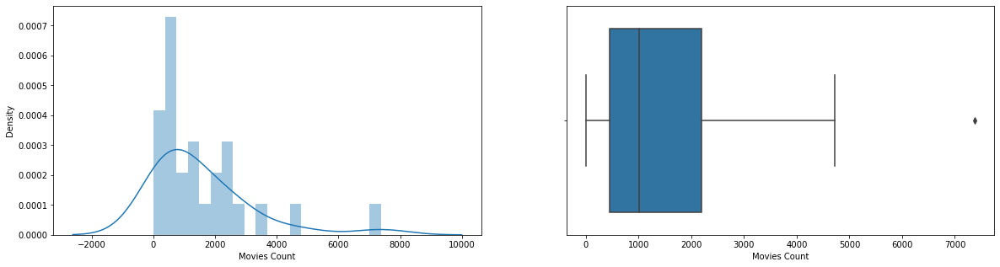

In [329]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(genres_data_movies['Movies Count'], bins = 20, kde = True, ax = ax[0])
sns.boxplot(genres_data_movies['Movies Count'], ax = ax[1])
plt.show()

In [330]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_genres_movies = genres_data_movies[genres_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_genres_movies = netflix_genres_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_genres_movies = genres_data_movies[genres_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_genres_movies = hulu_genres_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_genres_movies = genres_data_movies[genres_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_genres_movies = prime_video_genres_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_genres_movies = genres_data_movies[genres_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_genres_movies = disney_genres_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

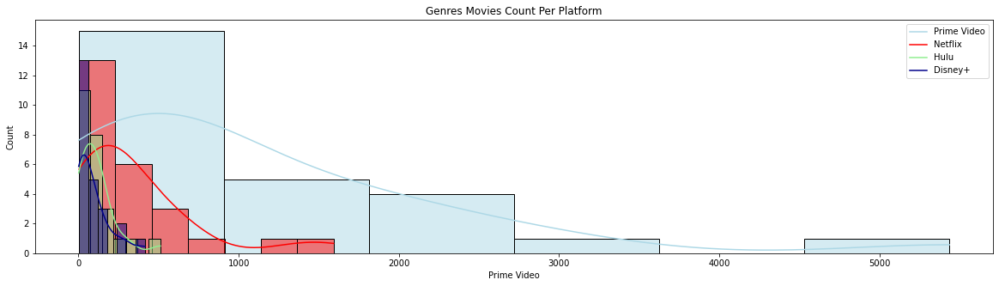

In [331]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Genres Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(prime_video_genres_movies['Prime Video'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_genres_movies['Netflix'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_genres_movies['Hulu'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_genres_movies['Disney+'][:100], color = 'darkblue', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [332]:
print(f'''
      The Genres with Highest Movies Count Rating Ever Got is '{df_genres_high_movies['Genres'][0]}' : '{df_genres_high_movies['Movies Count'].max()}'\n
      The Genres with Lowest Movies Count Rating Ever Got is '{df_genres_low_movies['Genres'][0]}' : '{df_genres_low_movies['Movies Count'].min()}'\n
      
      The Genres with Highest Movies Count Rating on 'Netflix' is '{netflix_genres_high_movies['Genres'][0]}' : '{netflix_genres_high_movies['Netflix'].max()}'\n
      The Genres with Lowest Movies Count Rating on 'Netflix' is '{netflix_genres_low_movies['Genres'][0]}' : '{netflix_genres_low_movies['Netflix'].min()}'\n
      
      The Genres with Highest Movies Count Rating on 'Hulu' is '{hulu_genres_high_movies['Genres'][0]}' : '{hulu_genres_high_movies['Hulu'].max()}'\n
      The Genres with Lowest Movies Count Rating on 'Hulu' is '{hulu_genres_low_movies['Genres'][0]}' : '{hulu_genres_low_movies['Hulu'].min()}'\n
      
      The Genres with Highest Movies Count Rating on 'Prime Video' is '{prime_video_genres_high_movies['Genres'][0]}' : '{prime_video_genres_high_movies['Prime Video'].max()}'\n
      The Genres with Lowest Movies Count Rating on 'Prime Video' is '{prime_video_genres_low_movies['Genres'][0]}' : '{prime_video_genres_low_movies['Prime Video'].min()}'\n
      
      The Genres with Highest Movies Count Rating on 'Disney+' is '{disney_genres_high_movies['Genres'][0]}' : '{disney_genres_high_movies['Disney+'].max()}'\n
      The Genres with Lowest Movies Count Rating on 'Disney+' is '{disney_genres_low_movies['Genres'][0]}' : '{disney_genres_low_movies['Disney+'].min()}'\n 
      ''')


      The Genres with Highest Movies Count Rating Ever Got is 'Drama' : '7381'

      The Genres with Lowest Movies Count Rating Ever Got is 'Talk-Show' : '2'

      
      The Genres with Highest Movies Count Rating on 'Netflix' is 'Drama' : '1592'

      The Genres with Lowest Movies Count Rating on 'Netflix' is 'Talk-Show' : '0'

      
      The Genres with Highest Movies Count Rating on 'Hulu' is 'Drama' : '511'

      The Genres with Lowest Movies Count Rating on 'Hulu' is 'Talk-Show' : '0'

      
      The Genres with Highest Movies Count Rating on 'Prime Video' is 'Drama' : '5436'

      The Genres with Lowest Movies Count Rating on 'Prime Video' is 'Talk-Show' : '2'

      
      The Genres with Highest Movies Count Rating on 'Disney+' is 'Family' : '414'

      The Genres with Lowest Movies Count Rating on 'Disney+' is 'Talk-Show' : '0'
 
      


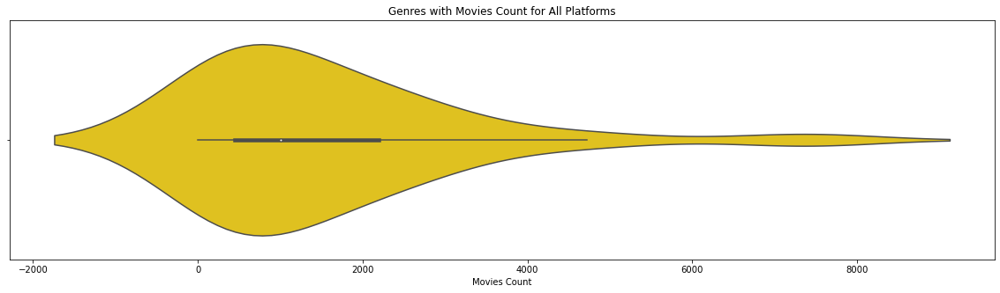

In [333]:
# Distribution of movies rating in each platform
plt.figure(figsize = (20, 5))
plt.title('Genres with Movies Count for All Platforms')
sns.violinplot(x = genres_data_movies['Movies Count'], color = 'gold', legend = True, kde = True, shade = False)
plt.show()

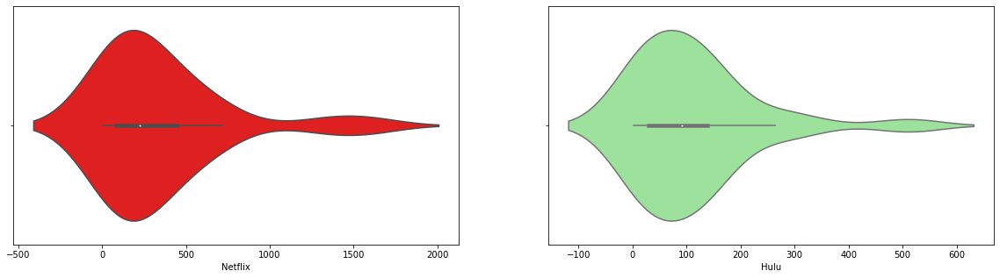

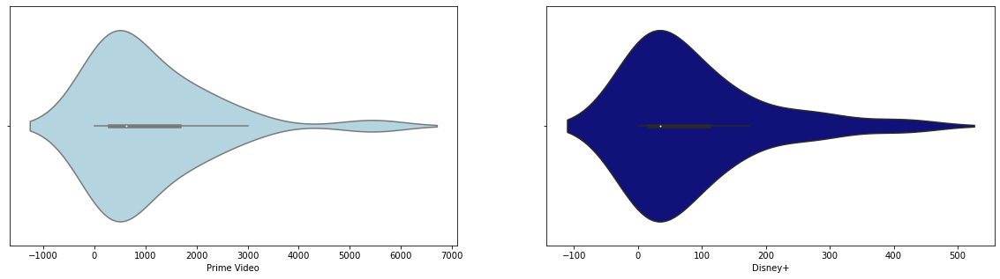

In [334]:
# Distribution of Genres Movies Count in each platform
f1, ax1 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = netflix_genres_movies['Netflix'], color = 'red', ax = ax1[0])
sns.violinplot(x = hulu_genres_movies['Hulu'], color = 'lightgreen', ax = ax1[1])
 
f2, ax2 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = prime_video_genres_movies['Prime Video'], color = 'lightblue', ax = ax2[0])
sns.violinplot(x = disney_genres_movies['Disney+'], color = 'darkblue', ax = ax2[1])
plt.show()

In [335]:
print(f'''
      Accross All Platforms the Average Movies Count of Genres is '{round(genres_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Genres on 'Netflix' is '{round(netflix_genres_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Genres on 'Hulu' is '{round(hulu_genres_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Genres on 'Prime Video' is '{round(prime_video_genres_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Genres on 'Disney+' is '{round(disney_genres_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Movies Count of Genres is '1545.54'

      The Average Movies Count of Genres on 'Netflix' is '347.2'

      The Average Movies Count of Genres on 'Hulu' is '111.16'

      The Average Movies Count of Genres on 'Prime Video' is '1089.58'

      The Average Movies Count of Genres on 'Disney+' is '87.12'
 
      


In [336]:
print(f'''
      Accross All Platforms Total Count of Genres is '{genres_data_movies['Genres'].unique().shape[0]}'\n
      Total Count of Genres on 'Netflix' is '{netflix_genres_movies['Genres'].unique().shape[0]}'\n
      Total Count of Genres on 'Hulu' is '{hulu_genres_movies['Genres'].unique().shape[0]}'\n
      Total Count of Genres on 'Prime Video' is '{prime_video_genres_movies['Genres'].unique().shape[0]}'\n
      Total Count of Genres on 'Disney+' is '{disney_genres_movies['Genres'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Genres is '26'

      Total Count of Genres on 'Netflix' is '25'

      Total Count of Genres on 'Hulu' is '25'

      Total Count of Genres on 'Prime Video' is '26'

      Total Count of Genres on 'Disney+' is '24'
 
      


In [337]:
fig = px.bar(x = genres_data_movies['Genres'], y = genres_data_movies['Movies Count'], 
             color = genres_data_movies['Movies Count'], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Genres', 'y' : 'Number of Movies'})
fig.show()

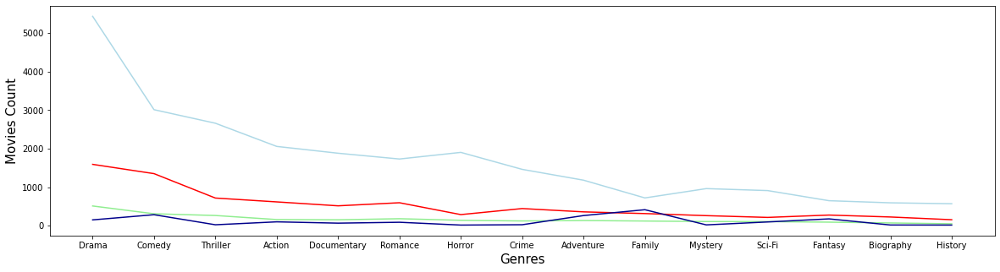

In [338]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = genres_data_movies['Genres'][:15], y = genres_data_movies['Netflix'][:15], color = 'red')
sns.lineplot(x = genres_data_movies['Genres'][:15], y = genres_data_movies['Hulu'][:15], color = 'lightgreen')
sns.lineplot(x = genres_data_movies['Genres'][:15], y = genres_data_movies['Prime Video'][:15], color = 'lightblue')
sns.lineplot(x = genres_data_movies['Genres'][:15], y = genres_data_movies['Disney+'][:15], color = 'darkblue')
plt.xlabel('Genres', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

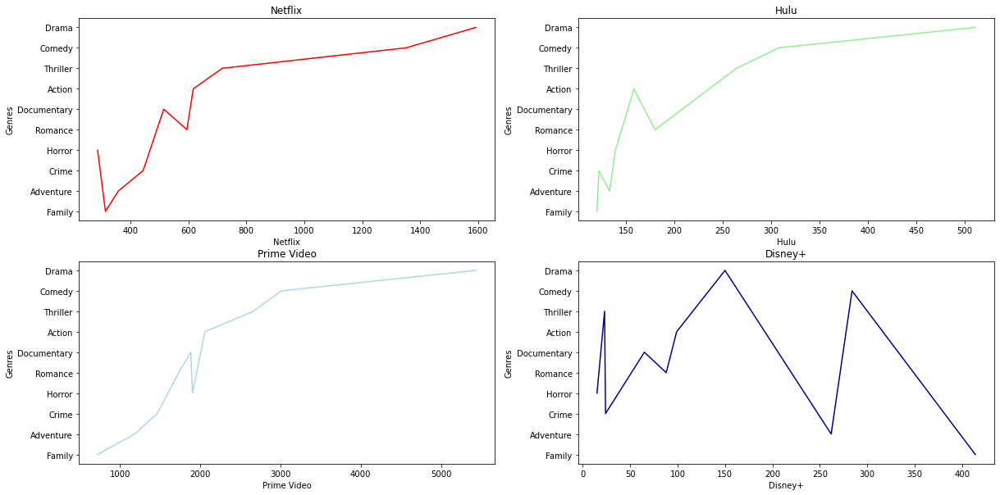

In [339]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_c_ax1 = sns.lineplot(y = genres_data_movies['Genres'][:10], x = genres_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_c_ax2 = sns.lineplot(y = genres_data_movies['Genres'][:10], x = genres_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_c_ax3 = sns.lineplot(y = genres_data_movies['Genres'][:10], x = genres_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_c_ax4 = sns.lineplot(y = genres_data_movies['Genres'][:10], x = genres_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_c_ax1.title.set_text(labels[0])
h_c_ax2.title.set_text(labels[1])
p_c_ax3.title.set_text(labels[2])
d_c_ax4.title.set_text(labels[3])
 
plt.show()

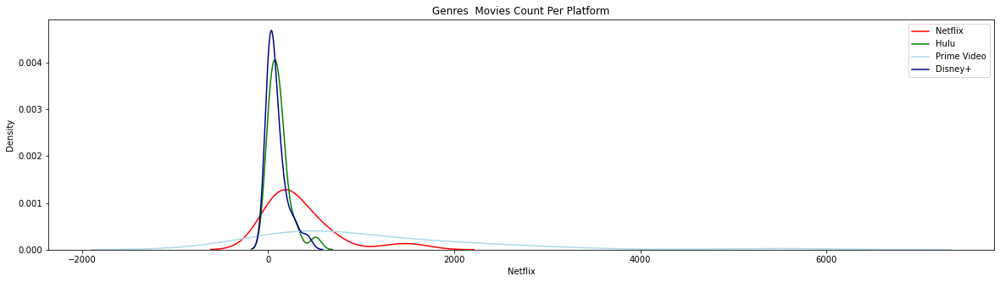

In [340]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Genres  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_genres_movies['Netflix'], color = 'red', legend = True)
sns.kdeplot(hulu_genres_movies['Hulu'], color = 'green', legend = True)
sns.kdeplot(prime_video_genres_movies['Prime Video'], color = 'lightblue', legend = True)
sns.kdeplot(disney_genres_movies['Disney+'], color = 'darkblue', legend = True)                                      
 
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

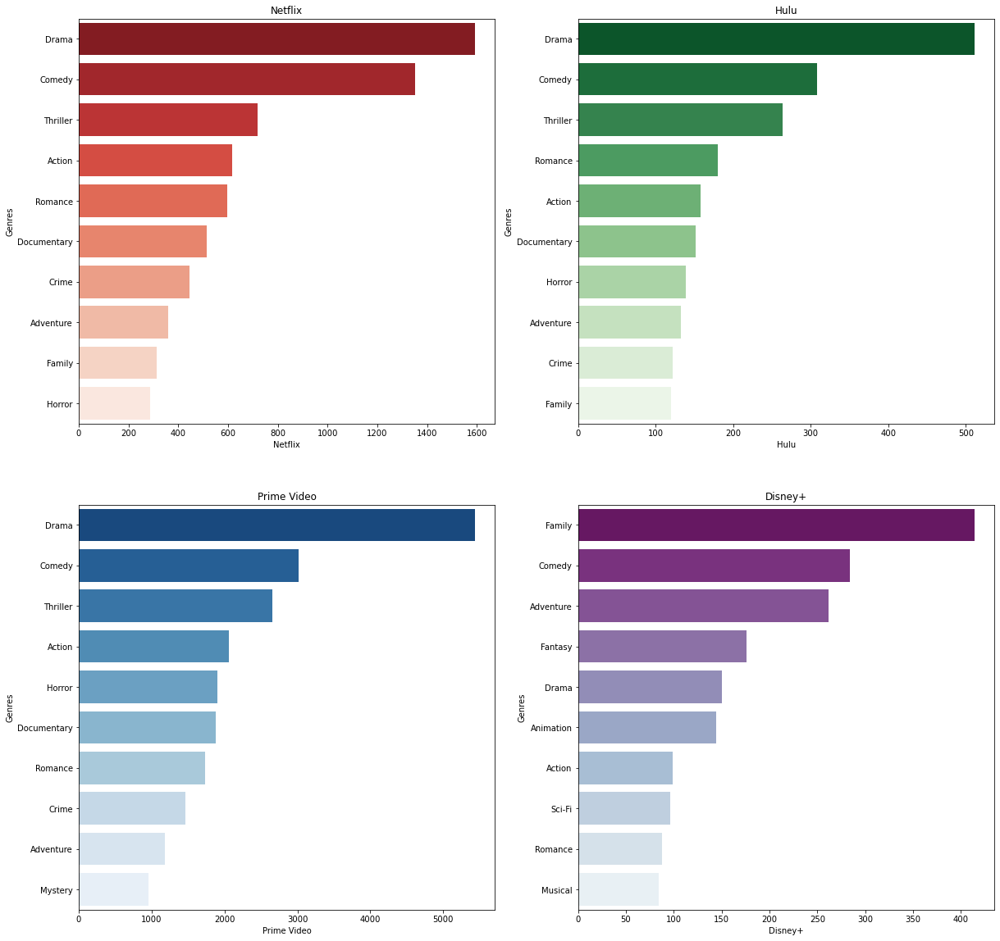

In [341]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_gn_ax1 = sns.barplot(y = netflix_genres_movies['Genres'][:10], x = netflix_genres_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_gn_ax2 = sns.barplot(y = hulu_genres_movies['Genres'][:10], x = hulu_genres_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_gn_ax3 = sns.barplot(y = prime_video_genres_movies['Genres'][:10], x = prime_video_genres_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_gn_ax4 = sns.barplot(y = disney_genres_movies['Genres'][:10], x = disney_genres_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_gn_ax1.title.set_text(labels[0])
h_gn_ax2.title.set_text(labels[1])
p_gn_ax3.title.set_text(labels[2])
d_gn_ax4.title.set_text(labels[3])
 
plt.show()

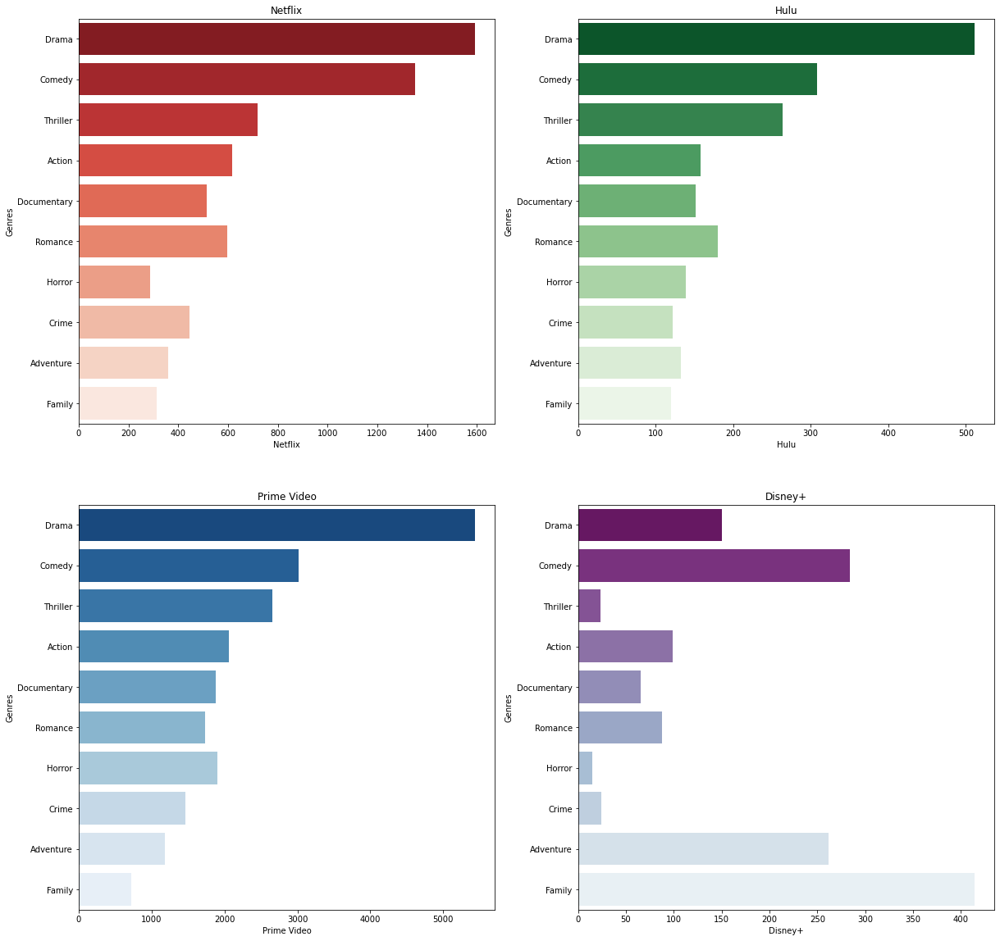

In [342]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_gn_ax1 = sns.barplot(y = genres_data_movies['Genres'][:10], x = genres_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_gn_ax2 = sns.barplot(y = genres_data_movies['Genres'][:10], x = genres_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_gn_ax3 = sns.barplot(y = genres_data_movies['Genres'][:10], x = genres_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_gn_ax4 = sns.barplot(y = genres_data_movies['Genres'][:10], x = genres_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_gn_ax1.title.set_text(labels[0])
h_gn_ax2.title.set_text(labels[1])
p_gn_ax3.title.set_text(labels[2])
d_gn_ax4.title.set_text(labels[3])
 
plt.show()

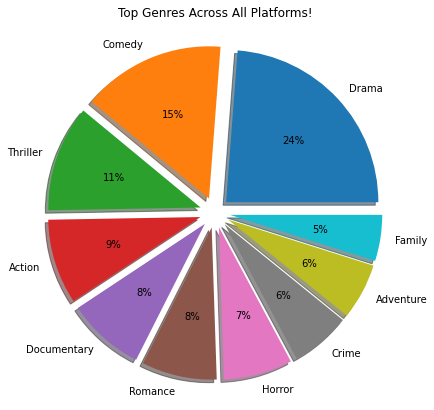

In [343]:
plt.figure(figsize = (7, 7))
plt.pie(genres_data_movies['Movies Count'][:10], labels = genres_data_movies.Genres[:10], explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1), autopct='%1.0f%%', labeldistance = 1.1, shadow = True)
plt.title('Top Genres Across All Platforms!')
plt.show()

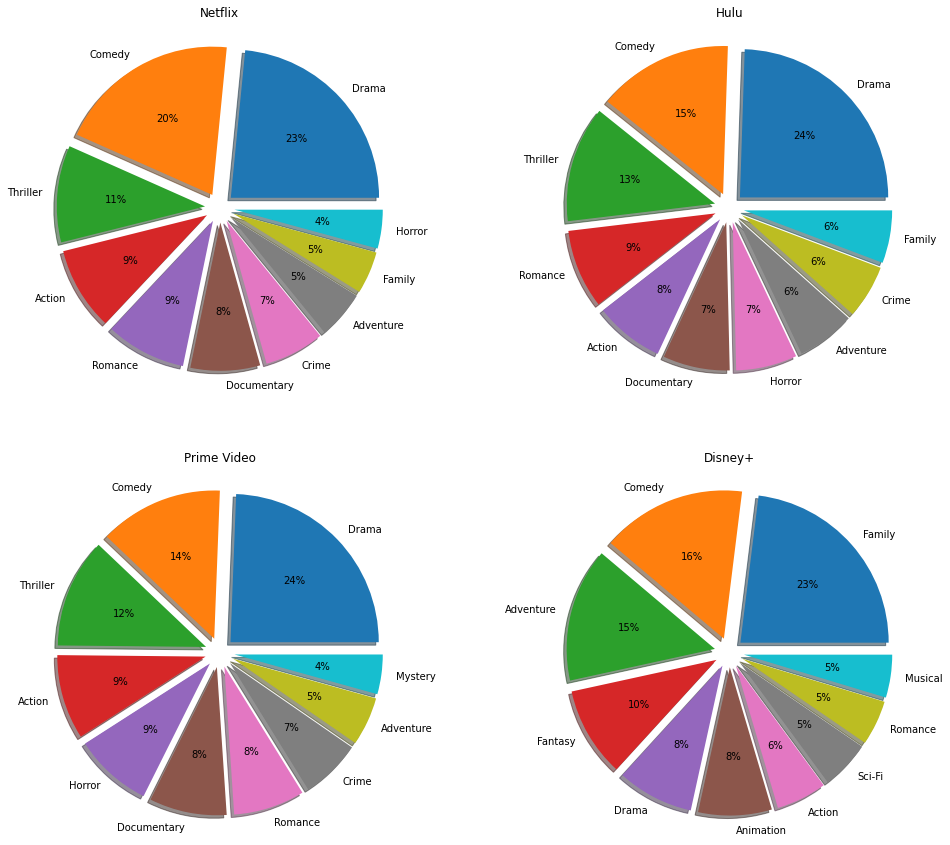

In [344]:
fig = plt.figure(figsize = (35, 15))
 
ax = plt.subplot2grid((2, 4), (0, 0))
 
plt.pie(netflix_genres_movies['Netflix'][:10], labels = netflix_genres_movies.Genres[:10], explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1), autopct = '%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Netflix')
 
ax = plt.subplot2grid((2, 4), (0, 1))
 
plt.pie(hulu_genres_movies['Hulu'][:10], labels = hulu_genres_movies.Genres[:10], explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1), autopct = '%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Hulu')
 
ax = plt.subplot2grid((2, 4), (1, 0))
 
plt.pie(prime_video_genres_movies['Prime Video'][:10], labels = prime_video_genres_movies.Genres[:10], explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1), autopct = '%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Prime Video')
 
ax = plt.subplot2grid((2, 4), (1, 1))
 
plt.pie(disney_genres_movies['Disney+'][:10], labels = disney_genres_movies.Genres[:10], explode = (0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1), autopct = '%1.0f%%', labeldistance = 1.1, shadow = True)
 
plt.title('Disney+')
 
plt.show()

In [345]:
fig = go.Figure(go.Funnel(y = genres_data_movies['Genres'][:10],x = genres_data_movies['Movies Count'][:10]))
fig.show()

In [346]:
df_movies_mixed_genres.drop(df_movies_mixed_genres.loc[df_movies_mixed_genres['Genres'] == "NA"].index, inplace = True)
# df_movies_mixed_genres = df_movies_mixed_genres[df_movies_mixed_genres.Genres != "NA"]
df_movies_mixed_genres.drop(df_movies_mixed_genres.loc[df_movies_mixed_genres['Number of Genres'] == 1].index, inplace = True)

In [347]:
df_movies_mixed_genres.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Genres
0,1,Inception,2010,13,8.8,87,Christopher Nolan,"Leonardo DiCaprio,Joseph Gordon-Levitt,Elliot ...","Action,Adventure,Sci-Fi,Thriller","United States,United Kingdom",...,"Dom Cobb is a skilled thief, the absolute best...",148,movie,1,0,0,0,0,Netflix,4
1,2,The Matrix,1999,16,8.7,88,"Lana Wachowski,Lilly Wachowski","Keanu Reeves,Laurence Fishburne,Carrie-Anne Mo...","Action,Sci-Fi",United States,...,Thomas A. Anderson is a man living two lives. ...,136,movie,1,0,0,0,0,Netflix,2
2,3,Avengers: Infinity War,2018,13,8.4,85,"Anthony Russo,Joe Russo","Robert Downey Jr.,Chris Hemsworth,Mark Ruffalo...","Action,Adventure,Sci-Fi",United States,...,As the Avengers and their allies have continue...,149,movie,1,0,0,0,0,Netflix,3
3,4,Back to the Future,1985,7,8.5,96,Robert Zemeckis,"Michael J. Fox,Christopher Lloyd,Lea Thompson,...","Adventure,Comedy,Sci-Fi",United States,...,"Marty McFly, a typical American teenager of th...",116,movie,1,0,0,0,0,Netflix,3
5,6,Spider-Man: Into the Spider-Verse,2018,7,8.4,97,"Bob Persichetti,Peter Ramsey,Rodney Rothman","Shameik Moore,Jake Johnson,Hailee Steinfeld,Ma...","Animation,Action,Adventure,Family,Sci-Fi",United States,...,"Phil Lord and Christopher Miller, the creative...",117,movie,1,0,0,0,0,Netflix,5


In [348]:
mixed_genres_count = df_movies_mixed_genres.groupby('Genres')['Title'].count()
mixed_genres_movies = df_movies_mixed_genres.groupby('Genres')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
mixed_genres_data_movies = pd.concat([mixed_genres_count, mixed_genres_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count', 'Genres' : 'Mixed Genres'})
mixed_genres_data_movies = mixed_genres_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [349]:
mixed_genres_data_movies.head(5)

,Mixed Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
1004,"Comedy,Drama",460,128,42,315,0
1641,"Drama,Romance",418,96,37,299,1
1062,"Comedy,Drama,Romance",353,110,38,219,0
1160,"Comedy,Romance",298,98,23,194,1
1740,"Horror,Thriller",290,38,19,243,0


In [350]:
# Mixed Genres with Movies Counts - All Platforms Combined
mixed_genres_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

,Mixed Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
1004,"Comedy,Drama",460,128,42,315,0
1641,"Drama,Romance",418,96,37,299,1
1062,"Comedy,Drama,Romance",353,110,38,219,0
1160,"Comedy,Romance",298,98,23,194,1
1740,"Horror,Thriller",290,38,19,243,0
1661,"Drama,Thriller",229,38,23,179,0
1229,"Crime,Drama,Thriller",176,45,11,129,1
317,"Action,Drama",166,27,0,146,0
1177,"Crime,Drama",159,26,8,129,0
1732,"Horror,Mystery,Thriller",158,32,11,123,1


In [351]:
df_mixed_genres_high_movies = mixed_genres_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_mixed_genres_high_movies = df_mixed_genres_high_movies.drop(['index'], axis = 1)
# filter = (mixed_genres_data_movies['Movies Count'] = =  (mixed_genres_data_movies['Movies Count'].max()))
# df_mixed_genres_high_movies = mixed_genres_data_movies[filter]
 
# highest_rated_movies = mixed_genres_data_movies.loc[mixed_genres_data_movies['Movies Count'].idxmax()]
 
print('\nMixed Genres with Highest Ever Movies Count are : All Platforms Combined\n')
df_mixed_genres_high_movies.head(5)


Mixed Genres with Highest Ever Movies Count are : All Platforms Combined



,Mixed Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Comedy,Drama",460,128,42,315,0
1,"Drama,Romance",418,96,37,299,1
2,"Comedy,Drama,Romance",353,110,38,219,0
3,"Comedy,Romance",298,98,23,194,1
4,"Horror,Thriller",290,38,19,243,0


In [352]:
df_mixed_genres_low_movies = mixed_genres_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_mixed_genres_low_movies = df_mixed_genres_low_movies.drop(['index'], axis = 1)
# filter = (mixed_genres_data_movies['Movies Count'] = =  (mixed_genres_data_movies['Movies Count'].min()))
# df_mixed_genres_low_movies = mixed_genres_data_movies[filter]
 
print('\nMixed Genres with Lowest Ever Movies Count are : All Platforms Combined\n')
df_mixed_genres_low_movies.head(5)


Mixed Genres with Lowest Ever Movies Count are : All Platforms Combined



,Mixed Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Action,Adventure,Crime,Film-Noir,Romance",1,1,0,0,0
1,"Drama,Musical,Sport",1,1,0,0,0
2,"Drama,Musical,Thriller",1,0,0,1,0
3,"Action,Adventure,Comedy,Fantasy,Sci-Fi,Thriller",1,0,0,1,0
4,"Action,Adventure,Comedy,Fantasy,Western",1,0,0,1,0


In [353]:
print(f'''
      Total '{df_movies['Genres'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{mixed_genres_data_movies['Mixed Genres'].unique().shape[0]}' Mixed Genres, They were Like this, \n
 
      {mixed_genres_data_movies.sort_values(by = 'Movies Count', ascending = False)['Mixed Genres'].head(5).unique()} etc. \n
 
      The Mixed Genres with Highest Movies Count have '{mixed_genres_data_movies['Movies Count'].max()}' Movies Available is '{df_mixed_genres_high_movies['Mixed Genres'][0]}', &\n
      The Mixed Genres with Lowest Movies Count have '{mixed_genres_data_movies['Movies Count'].min()}' Movies Available is '{df_mixed_genres_low_movies['Mixed Genres'][0]}'
      ''')


      Total '16923' Titles are available on All Platforms, out of which

      You Can Choose to see Movies from Total '1864' Mixed Genres, They were Like this, 

 
      ['Comedy,Drama' 'Drama,Romance' 'Comedy,Drama,Romance' 'Comedy,Romance'
 'Horror,Thriller'] etc. 

 
      The Mixed Genres with Highest Movies Count have '460' Movies Available is 'Comedy,Drama', &

      The Mixed Genres with Lowest Movies Count have '1' Movies Available is 'Action,Adventure,Crime,Film-Noir,Romance'
      


In [354]:
fig = px.pie(mixed_genres_data_movies[:20], names = 'Mixed Genres', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [355]:
# netflix_mixed_genres_movies = mixed_genres_data_movies[mixed_genres_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_mixed_genres_movies = netflix_mixed_genres_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_mixed_genres_high_movies = df_mixed_genres_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_genres_high_movies = netflix_mixed_genres_high_movies.drop(['index'], axis = 1)
 
netflix_mixed_genres_low_movies = df_mixed_genres_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_mixed_genres_low_movies = netflix_mixed_genres_low_movies.drop(['index'], axis = 1)
 
netflix_mixed_genres_high_movies.head(5)

,Mixed Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Comedy,Drama",460,128,42,315,0
1,"Comedy,Drama,Romance",353,110,38,219,0
2,"Comedy,Romance",298,98,23,194,1
3,"Drama,Romance",418,96,37,299,1
4,"Documentary,Comedy",142,56,2,94,0


In [356]:
# hulu_mixed_genres_movies = mixed_genres_data_movies[mixed_genres_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_mixed_genres_movies = hulu_mixed_genres_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_mixed_genres_high_movies = df_mixed_genres_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_genres_high_movies = hulu_mixed_genres_high_movies.drop(['index'], axis = 1)
 
hulu_mixed_genres_low_movies = df_mixed_genres_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_mixed_genres_low_movies = hulu_mixed_genres_low_movies.drop(['index'], axis = 1)
 
hulu_mixed_genres_high_movies.head(5)

,Mixed Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Comedy,Drama",460,128,42,315,0
1,"Comedy,Drama,Romance",353,110,38,219,0
2,"Drama,Romance",418,96,37,299,1
3,"Comedy,Romance",298,98,23,194,1
4,"Drama,Thriller",229,38,23,179,0


In [357]:
# prime_video_mixed_genres_movies = mixed_genres_data_movies[mixed_genres_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_mixed_genres_movies = prime_video_mixed_genres_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_mixed_genres_high_movies = df_mixed_genres_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_genres_high_movies = prime_video_mixed_genres_high_movies.drop(['index'], axis = 1)
 
prime_video_mixed_genres_low_movies = df_mixed_genres_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_mixed_genres_low_movies = prime_video_mixed_genres_low_movies.drop(['index'], axis = 1)
 
prime_video_mixed_genres_high_movies.head(5)

,Mixed Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Comedy,Drama",460,128,42,315,0
1,"Drama,Romance",418,96,37,299,1
2,"Horror,Thriller",290,38,19,243,0
3,"Comedy,Drama,Romance",353,110,38,219,0
4,"Comedy,Romance",298,98,23,194,1


In [358]:
# disney_mixed_genres_movies = mixed_genres_data_movies[mixed_genres_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_mixed_genres_movies = disney_mixed_genres_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_mixed_genres_high_movies = df_mixed_genres_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_genres_high_movies = disney_mixed_genres_high_movies.drop(['index'], axis = 1)
 
disney_mixed_genres_low_movies = df_mixed_genres_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_mixed_genres_low_movies = disney_mixed_genres_low_movies.drop(['index'], axis = 1)
 
disney_mixed_genres_high_movies.head(5)

,Mixed Genres,Movies Count,Netflix,Hulu,Prime Video,Disney+
0,"Action,Adventure,Sci-Fi",60,12,6,33,19
1,"Animation,Adventure,Comedy,Family,Fantasy",49,13,9,15,17
2,"Comedy,Family",69,19,11,28,12
3,"Adventure,Family",23,2,1,10,11
4,"Comedy,Drama,Family",48,7,1,30,11


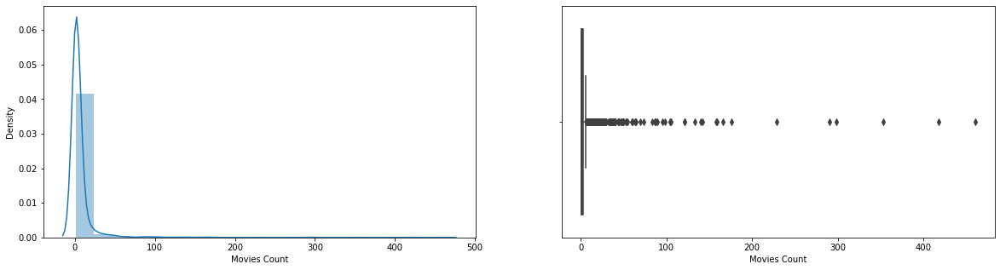

In [359]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(mixed_genres_data_movies['Movies Count'], bins = 20, kde = True, ax = ax[0])
sns.boxplot(mixed_genres_data_movies['Movies Count'], ax = ax[1])
plt.show()

In [360]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_mixed_genres_movies = mixed_genres_data_movies[mixed_genres_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_genres_movies = netflix_mixed_genres_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_mixed_genres_movies = mixed_genres_data_movies[mixed_genres_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_genres_movies = hulu_mixed_genres_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_mixed_genres_movies = mixed_genres_data_movies[mixed_genres_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_genres_movies = prime_video_mixed_genres_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_mixed_genres_movies = mixed_genres_data_movies[mixed_genres_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_genres_movies = disney_mixed_genres_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

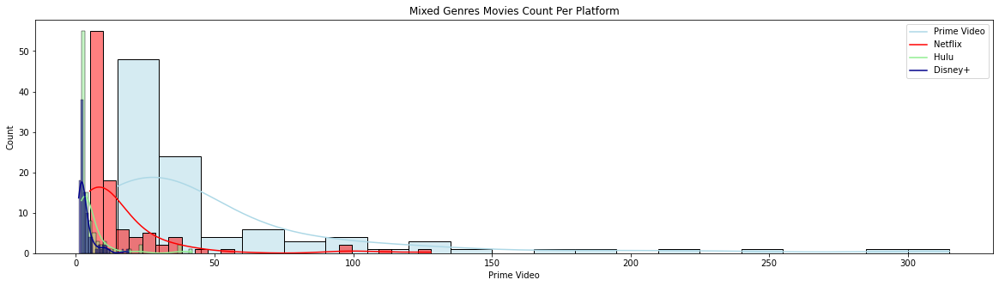

In [361]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Genres Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(prime_video_mixed_genres_movies['Prime Video'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_mixed_genres_movies['Netflix'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_mixed_genres_movies['Hulu'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_mixed_genres_movies['Disney+'][:100], color = 'darkblue', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [362]:
print(f'''
      The Mixed Genres with Highest Movies Count Rating Ever Got is '{df_mixed_genres_high_movies['Mixed Genres'][0]}' : '{df_mixed_genres_high_movies['Movies Count'].max()}'\n
      The Mixed Genres with Lowest Movies Count Rating Ever Got is '{df_mixed_genres_low_movies['Mixed Genres'][0]}' : '{df_mixed_genres_low_movies['Movies Count'].min()}'\n
      
      The Mixed Genres with Highest Movies Count Rating on 'Netflix' is '{netflix_mixed_genres_high_movies['Mixed Genres'][0]}' : '{netflix_mixed_genres_high_movies['Netflix'].max()}'\n
      The Mixed Genres with Lowest Movies Count Rating on 'Netflix' is '{netflix_mixed_genres_low_movies['Mixed Genres'][0]}' : '{netflix_mixed_genres_low_movies['Netflix'].min()}'\n
      
      The Mixed Genres with Highest Movies Count Rating on 'Hulu' is '{hulu_mixed_genres_high_movies['Mixed Genres'][0]}' : '{hulu_mixed_genres_high_movies['Hulu'].max()}'\n
      The Mixed Genres with Lowest Movies Count Rating on 'Hulu' is '{hulu_mixed_genres_low_movies['Mixed Genres'][0]}' : '{hulu_mixed_genres_low_movies['Hulu'].min()}'\n
      
      The Mixed Genres with Highest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_genres_high_movies['Mixed Genres'][0]}' : '{prime_video_mixed_genres_high_movies['Prime Video'].max()}'\n
      The Mixed Genres with Lowest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_genres_low_movies['Mixed Genres'][0]}' : '{prime_video_mixed_genres_low_movies['Prime Video'].min()}'\n
      
      The Mixed Genres with Highest Movies Count Rating on 'Disney+' is '{disney_mixed_genres_high_movies['Mixed Genres'][0]}' : '{disney_mixed_genres_high_movies['Disney+'].max()}'\n
      The Mixed Genres with Lowest Movies Count Rating on 'Disney+' is '{disney_mixed_genres_low_movies['Mixed Genres'][0]}' : '{disney_mixed_genres_low_movies['Disney+'].min()}'\n 
      ''')


      The Mixed Genres with Highest Movies Count Rating Ever Got is 'Comedy,Drama' : '460'

      The Mixed Genres with Lowest Movies Count Rating Ever Got is 'Action,Adventure,Crime,Film-Noir,Romance' : '1'

      
      The Mixed Genres with Highest Movies Count Rating on 'Netflix' is 'Comedy,Drama' : '128'

      The Mixed Genres with Lowest Movies Count Rating on 'Netflix' is 'Animation,Short,Drama,Western' : '0'

      
      The Mixed Genres with Highest Movies Count Rating on 'Hulu' is 'Comedy,Drama' : '42'

      The Mixed Genres with Lowest Movies Count Rating on 'Hulu' is 'Animation,Short,Drama,Western' : '0'

      
      The Mixed Genres with Highest Movies Count Rating on 'Prime Video' is 'Comedy,Drama' : '315'

      The Mixed Genres with Lowest Movies Count Rating on 'Prime Video' is 'Biography,Drama,Sport,Thriller' : '0'

      
      The Mixed Genres with Highest Movies Count Rating on 'Disney+' is 'Action,Adventure,Sci-Fi' : '19'

      The Mixed Genres with Lowest M

In [363]:
print(f'''
      Accross All Platforms the Average Movies Count of Mixed Genres is '{round(mixed_genres_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Genres on 'Netflix' is '{round(netflix_mixed_genres_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Genres on 'Hulu' is '{round(hulu_mixed_genres_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Genres on 'Prime Video' is '{round(prime_video_mixed_genres_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Genres on 'Disney+' is '{round(disney_mixed_genres_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Movies Count of Mixed Genres is '6.36'

      The Average Movies Count of Mixed Genres on 'Netflix' is '3.7'

      The Average Movies Count of Mixed Genres on 'Hulu' is '2.39'

      The Average Movies Count of Mixed Genres on 'Prime Video' is '5.72'

      The Average Movies Count of Mixed Genres on 'Disney+' is '1.9'
 
      


In [364]:
print(f'''
      Accross All Platforms Total Count of Mixed Genres is '{mixed_genres_data_movies['Mixed Genres'].unique().shape[0]}'\n
      Total Count of Mixed Genres on 'Netflix' is '{netflix_mixed_genres_movies['Mixed Genres'].unique().shape[0]}'\n
      Total Count of Mixed Genres on 'Hulu' is '{hulu_mixed_genres_movies['Mixed Genres'].unique().shape[0]}'\n
      Total Count of Mixed Genres on 'Prime Video' is '{prime_video_mixed_genres_movies['Mixed Genres'].unique().shape[0]}'\n
      Total Count of Mixed Genres on 'Disney+' is '{disney_mixed_genres_movies['Mixed Genres'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Mixed Genres is '1864'

      Total Count of Mixed Genres on 'Netflix' is '679'

      Total Count of Mixed Genres on 'Hulu' is '347'

      Total Count of Mixed Genres on 'Prime Video' is '1487'

      Total Count of Mixed Genres on 'Disney+' is '273'
 
      


In [365]:
fig = px.bar(x = mixed_genres_data_movies['Mixed Genres'][:50], y = mixed_genres_data_movies['Movies Count'][:50], 
             color = mixed_genres_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Mixed Genres', 'y' : 'Number of Movies'})
fig.show()

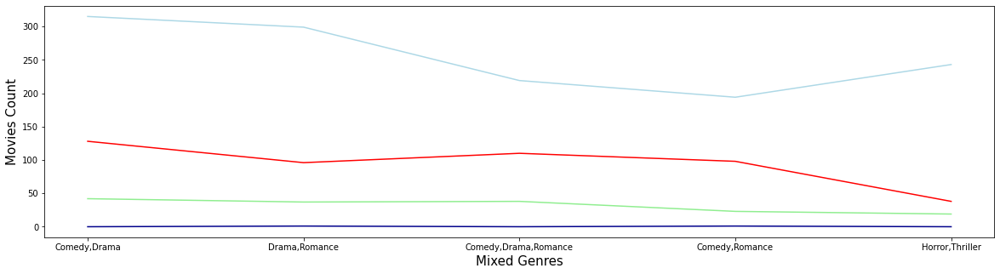

In [366]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = mixed_genres_data_movies['Mixed Genres'][:5], y = mixed_genres_data_movies['Netflix'][:5], color = 'red')
sns.lineplot(x = mixed_genres_data_movies['Mixed Genres'][:5], y = mixed_genres_data_movies['Hulu'][:5], color = 'lightgreen')
sns.lineplot(x = mixed_genres_data_movies['Mixed Genres'][:5], y = mixed_genres_data_movies['Prime Video'][:5], color = 'lightblue')
sns.lineplot(x = mixed_genres_data_movies['Mixed Genres'][:5], y = mixed_genres_data_movies['Disney+'][:5], color = 'darkblue')
plt.xlabel('Mixed Genres', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

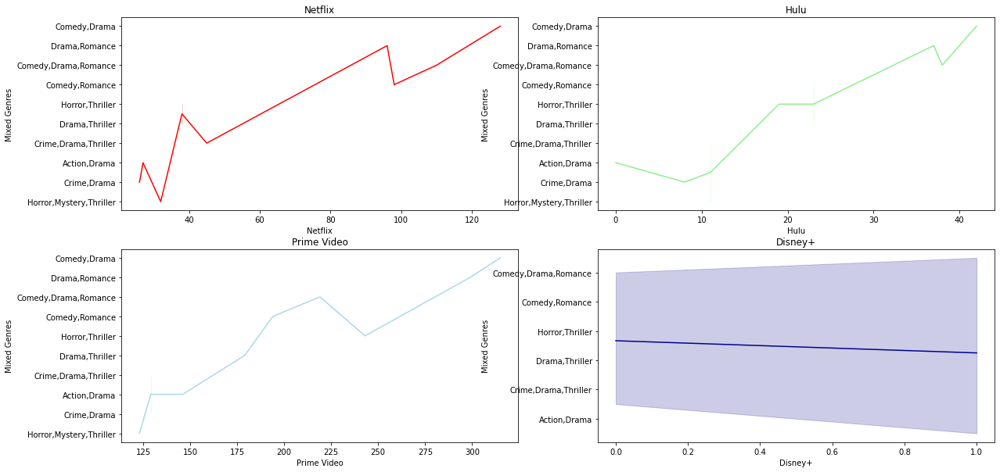

In [367]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_mg_ax1 = sns.lineplot(y = mixed_genres_data_movies['Mixed Genres'][:10], x = mixed_genres_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_mg_ax2 = sns.lineplot(y = mixed_genres_data_movies['Mixed Genres'][:10], x = mixed_genres_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_mg_ax3 = sns.lineplot(y = mixed_genres_data_movies['Mixed Genres'][:10], x = mixed_genres_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_mg_ax4 = sns.lineplot(y = mixed_genres_data_movies['Mixed Genres'][:10], x = mixed_genres_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_mg_ax1.title.set_text(labels[0])
h_mg_ax2.title.set_text(labels[1])
p_mg_ax3.title.set_text(labels[2])
d_mg_ax4.title.set_text(labels[3])
 
plt.show()

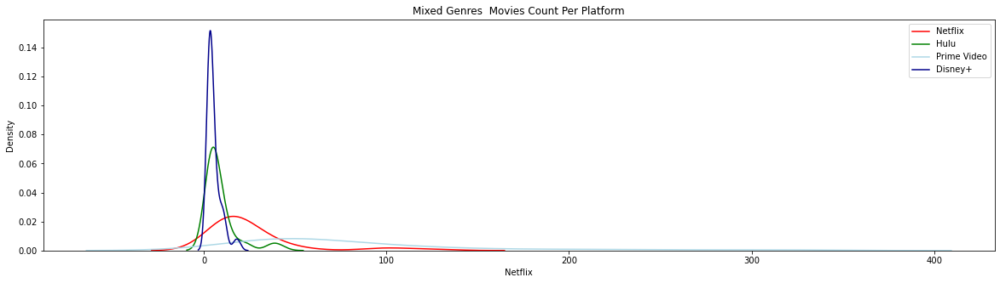

In [368]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Genres  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_mixed_genres_movies['Netflix'][:50], color = 'red', legend = True)
sns.kdeplot(hulu_mixed_genres_movies['Hulu'][:50], color = 'green', legend = True)
sns.kdeplot(prime_video_mixed_genres_movies['Prime Video'][:50], color = 'lightblue', legend = True)
sns.kdeplot(disney_mixed_genres_movies['Disney+'][:50], color = 'darkblue', legend = True)                                      

# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [369]:
fig = go.Figure(go.Funnel(y = mixed_genres_data_movies['Mixed Genres'][:10],x = mixed_genres_data_movies['Movies Count'][:10]))
fig.show()

In [370]:
df_movies_countries = df_movies.copy()

In [371]:
# Create countries dict where key=name and value = number of countries
 
countries = {}
 
for i in df_movies_countries['Country'].dropna():
    if i != "NA":
        #print(i,len(i.split(',')))
        countries[i] = len(i.split(','))
    else:
        countries[i] = 0
    
# Add this information to our dataframe as a new column
 
df_movies_countries['Number of Country'] = df_movies_countries['Country'].map(countries).astype(int)

In [372]:
df_countries_most_movies = df_movies_countries.sort_values(by = 'Number of Country', ascending = False).reset_index()
df_countries_most_movies = df_countries_most_movies.drop(['index'], axis = 1)
# filter = (df_movies_countries['Country'] == (df_movies_countries['Number of Country'].max()))
# df_countries_most_movies = df_movies_countries[filter]
 
# mostest_rated_movies = df_movies_countries.loc[df_movies_countries['Number of Country'].idxmax()]
 
print('\nMovies with Highest Ever Country Count are : \n')
df_countries_most_movies.head(5)


Movies with Highest Ever Country Count are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Country
0,6906,Somewhere Else Tomorrow,2013,13,7.5,NA,Daniel Rintz,"Issa Breibish,Kristian Bruun,Megan Gay,Grant J...","Documentary,Adventure,Drama,News","Germany,Canada,Vietnam,United Kingdom,Turkey,T...",...,Promising young student Chi-Hao is sent away t...,107,movie,0,0,1,0,0,Prime Video,27
1,6333,"Poverty, Inc.",2014,NR,7.7,NA,Michael Matheson Miller,Robert Sirico,"Documentary,History,News","United States,United Kingdom,Thailand,Swazilan...",...,"The lady is Mrs. Hilyard, a wealthy poetess wh...",94,movie,0,0,1,0,0,Prime Video,20
2,4382,Samsara,2011,13,8.5,76,Ron Fricke,"Balinese Tari Legong Dancers,Ni Made Megahadi ...","Documentary,Music","United States,Indonesia,Singapore,Thailand,Ken...",...,NA,102,movie,0,0,1,0,0,Prime Video,19
3,8004,Lost Kites,2016,NR,7,NA,"Samuel Rich,Gabriella Fritz",NA,Documentary,"United States,Belgium,Brazil,Cambodia,China,In...",...,All fourteen-year-old Robbie Hendrick ever wan...,50,movie,0,0,1,0,0,Prime Video,18
4,16012,Mulan II,2004,0,5.7,0,"Darrell Rooney,Lynne Southerland","Ming-Na Wen,BD Wong,Mark Moseley,Lucy Liu,Harv...","Animation,Action,Comedy,Family,Musical","United States,South Korea,Singapore,Russia,Mal...",...,Tia and her brother Tony have supernatural pow...,79,movie,0,0,0,1,0,Disney+,15


In [373]:
df_countries_least_movies = df_movies_countries.sort_values(by = 'Number of Country', ascending = True).reset_index()
df_countries_least_movies = df_countries_least_movies.drop(['index'], axis = 1)
# filter = (df_movies_countries['Country'] == (df_movies_countries['Number of Country'].min()))
# df_countries_least_movies = df_movies_countries[filter]
 
print('\nMovies with Lowest Ever Country Count are : \n')
df_countries_least_movies.head(5)


Movies with Lowest Ever Country Count are : 



,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Country
0,15581,Chonda Pierce Presents: Stand Up for Families ...,2016,NR,NA,NA,NA,NA,NA,NA,...,NA,NA,movie,0,0,1,0,0,Prime Video,0
1,3307,Marvel & ESPN Films Present: 1 of 1: Genesis,2015,7,4.9,NA,Eric Drath,"Axel Alonso,Carmelo Anthony,Josh Bloomberg,Bra...",NA,NA,...,NA,77,movie,1,0,0,0,0,Netflix,0
2,3318,Marco Luque - We are together,2017,NR,4.3,NA,NA,NA,NA,NA,...,NA,NA,movie,1,0,0,0,0,Netflix,0
3,2756,Luccas Neto in: Summer Camp,2019,NR,NA,NA,NA,NA,NA,NA,...,NA,NA,movie,1,0,0,0,0,Netflix,0
4,3340,The Republic Of Imbaba,2015,NR,NA,NA,NA,NA,NA,NA,...,NA,NA,movie,1,0,0,0,0,Netflix,0


In [374]:
print(f'''
      Total '{df_movies_countries['Country'].unique().shape[0]}' unique Countires are Available, They were Like this,\n
      
      {df_movies_countries.sort_values(by = 'Number of Country', ascending = False)['Country'].unique()[:5]} etc.\n
 
      The Highest Ever Country Count Any TV Show Got is '{df_countries_most_movies['Title'][0]}' : '{df_countries_most_movies['Number of Country'].max()}'\n
 
      The Lowest Ever Country Count Any TV Show Got is '{df_countries_least_movies['Title'][0]}' : '{df_countries_least_movies['Number of Country'].min()}'\n
      ''')


      Total '1377' unique Countires are Available, They were Like this,

      
      ['Germany,Canada,Vietnam,United Kingdom,Turkey,Tunisia,Thailand,Syria,Spain,Singapore,Poland,Pakistan,New Zealand,Nepal,Malaysia,Libya,Laos,Jordan,Iran,Indonesia,India,France,Egypt,Czech Republic,China,Cambodia,Australia'
 'United States,United Kingdom,Thailand,Swaziland,South Korea,South Africa,Rwanda,Russia,Peru,Kenya,Italy,Ireland,India,Haiti,Georgia,Ethiopia,Dominican Republic,Cambodia,Bangladesh,Argentina'
 'United States,Indonesia,Singapore,Thailand,Kenya,Denmark,Brazil,Jordan,United Arab Emirates,Saudi Arabia,South Africa,Italy,Ghana,Egypt,China,Japan,Ethiopia,South Korea,Namibia'
 'United States,Belgium,Brazil,Cambodia,China,India,Kenya,Mexico,Moldova,Netherlands,Romania,Rwanda,Thailand,Turkey,Uganda,Ukraine,United Kingdom,Republic of North Macedonia'
 'United States,South Korea,Singapore,Russia,Malaysia,Kazakhstan,Taiwan,Hong Kong,Japan,China,India,Syria,Iran,Egypt,Pakistan'] etc.

 
      T

In [375]:
netflix_countries_most_movies = df_countries_most_movies.loc[df_countries_most_movies['Netflix']==1].reset_index()
Lnetflix_countries_most_movies = netflix_countries_most_movies.drop(['index'], axis = 1)
 
netflix_countries_least_movies = df_countries_least_movies.loc[df_countries_least_movies['Netflix']==1].reset_index()
netflix_countries_least_movies = netflix_countries_least_movies.drop(['index'], axis = 1)
 
netflix_countries_most_movies.head(5)

,index,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Country
0,15,287,A Shaun the Sheep Movie: Farmageddon,2019,0,6.8,96,"Will Becher,Richard Phelan","Justin Fletcher,John Sparkes,Amalia Vitale,Kat...","Animation,Adventure,Comedy,Family,Fantasy,Sci-Fi",...,There is something strange going on in the pea...,86,movie,1,0,0,0,0,Netflix,10
1,16,2880,The Thief and the Fool,2013,NR,7.1,NA,Richard Williams,"Vincent Price,Bobbi Page,Steve Lively,Ed E. Ca...","Animation,Action,Adventure,Comedy,Family,Fanta...",...,"When Tack upsets ZigZag the Vizier, the wizard...",90,movie,1,0,0,0,0,Netflix,9
2,19,554,Resident Evil: Extinction,2007,16,6.3,24,Russell Mulcahy,"Milla Jovovich,Oded Fehr,Ali Larter,Iain Glen,...","Action,Horror,Sci-Fi",...,"Years after the Raccoon City disaster, Alice i...",94,movie,1,0,0,0,0,Netflix,8
3,26,781,Resident Evil: Afterlife,2010,16,6.3,22,Russell Mulcahy,"Milla Jovovich,Oded Fehr,Ali Larter,Iain Glen,...","Action,Horror,Sci-Fi",...,"Years after the Raccoon City disaster, Alice i...",94,movie,1,0,0,0,0,Netflix,8
4,35,166,The Breadwinner,2017,13,7.7,95,Nora Twomey,"Saara Chaudry,Soma Chhaya,Noorin Gulamgaus,Laa...","Animation,Drama,Family,War",...,From executive producer Angelina Jolie and the...,94,movie,1,0,0,0,0,Netflix,7


In [376]:
hulu_countries_most_movies = df_countries_most_movies.loc[df_countries_most_movies['Hulu']==1].reset_index()
hulu_countries_most_movies = hulu_countries_most_movies.drop(['index'], axis = 1)
 
hulu_countries_least_movies = df_countries_least_movies.loc[df_countries_least_movies['Hulu']==1].reset_index()
hulu_countries_least_movies = hulu_countries_least_movies.drop(['index'], axis = 1)
 
hulu_countries_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Country
0,3552,Monos,2019,16,6.9,92,Alejandro Landes,"Sofia Buenaventura,Julián Giraldo,Karen Quinte...","Adventure,Drama,Thriller","Colombia,Argentina,Netherlands,Germany,Sweden,...",...,Teenage commandos perform military training ex...,102,movie,0,1,0,0,0,Hulu,10
1,16472,Curious George,2006,0,6.5,NA,Matthew O'Callaghan,"Frank Welker,Will Ferrell,Shane Baumel,Timyra-...","Animation,Adventure,Comedy,Family","United States,Germany,Taiwan,France,Canada,Sou...",...,NA,87,movie,0,1,0,0,0,Hulu,8
2,16432,Underground,2016,18,8.1,96,Emir Kusturica,"Predrag 'Miki' Manojlovic,Lazar Ristovski,Mirj...","Comedy,Drama,Fantasy,War","Federal Republic of Yugoslavia,France,Germany,...",...,NA,170,movie,0,1,0,0,0,Hulu,8
3,3685,Manderlay,2005,NR,7.3,50,Lars von Trier,"Bryce Dallas Howard,Isaach De Bankolé,Danny Gl...",Drama,"Denmark,Sweden,Netherlands,France,Germany,Unit...",...,After gangster Mulligan's (Willem Dafoe's) car...,139,movie,0,1,0,0,0,Hulu,8
4,3640,The Commuter,2018,13,6.3,55,Jaume Collet-Serra,"Liam Neeson,Vera Farmiga,Patrick Wilson,Jonath...","Action,Mystery,Thriller","United States,United Kingdom,France,China,Cana...",...,"Michael MacCauley, a former police officer and...",104,movie,0,1,1,0,0,Prime Video,6


In [377]:
prime_video_countries_most_movies = df_countries_most_movies.loc[df_countries_most_movies['Prime Video']==1].reset_index()
prime_video_countries_most_movies = prime_video_countries_most_movies.drop(['index'], axis = 1)
 
prime_video_countries_least_movies = df_countries_least_movies.loc[df_countries_least_movies['Prime Video']==1].reset_index()
prime_video_countries_least_movies = prime_video_countries_least_movies.drop(['index'], axis = 1)
 
prime_video_countries_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Country
0,6906,Somewhere Else Tomorrow,2013,13,7.5,NA,Daniel Rintz,"Issa Breibish,Kristian Bruun,Megan Gay,Grant J...","Documentary,Adventure,Drama,News","Germany,Canada,Vietnam,United Kingdom,Turkey,T...",...,Promising young student Chi-Hao is sent away t...,107,movie,0,0,1,0,0,Prime Video,27
1,6333,"Poverty, Inc.",2014,NR,7.7,NA,Michael Matheson Miller,Robert Sirico,"Documentary,History,News","United States,United Kingdom,Thailand,Swazilan...",...,"The lady is Mrs. Hilyard, a wealthy poetess wh...",94,movie,0,0,1,0,0,Prime Video,20
2,4382,Samsara,2011,13,8.5,76,Ron Fricke,"Balinese Tari Legong Dancers,Ni Made Megahadi ...","Documentary,Music","United States,Indonesia,Singapore,Thailand,Ken...",...,NA,102,movie,0,0,1,0,0,Prime Video,19
3,8004,Lost Kites,2016,NR,7,NA,"Samuel Rich,Gabriella Fritz",NA,Documentary,"United States,Belgium,Brazil,Cambodia,China,In...",...,All fourteen-year-old Robbie Hendrick ever wan...,50,movie,0,0,1,0,0,Prime Video,18
4,10318,Caffeinated,2015,NR,6.6,NA,"Hanh Nguyen,Vishal Solanki","Jeremy Adams,Andrew Alcala,Sarah Allen,Grazian...","Documentary,Adventure,News","United States,Colombia,Ethiopia,Guatemala,Hond...",...,NA,80,movie,0,0,1,0,0,Prime Video,15


In [378]:
disney_countries_most_movies = df_countries_most_movies.loc[df_countries_most_movies['Disney+']==1].reset_index()
disney_countries_most_movies = disney_countries_most_movies.drop(['index'], axis = 1)
 
disney_countries_least_movies = df_countries_least_movies.loc[df_countries_least_movies['Disney+']==1].reset_index()
disney_countries_least_movies = disney_countries_least_movies.drop(['index'], axis = 1)
 
disney_countries_most_movies.head(5)

,ID,Title,Year,Age,IMDb,Rotten Tomatoes,Directors,Cast,Genres,Country,...,Plotline,Runtime,Kind,Netflix,Hulu,Prime Video,Disney+,Type,Service Provider,Number of Country
0,16012,Mulan II,2004,0,5.7,0,"Darrell Rooney,Lynne Southerland","Ming-Na Wen,BD Wong,Mark Moseley,Lucy Liu,Harv...","Animation,Action,Comedy,Family,Musical","United States,South Korea,Singapore,Russia,Mal...",...,Tia and her brother Tony have supernatural pow...,79,movie,0,0,0,1,0,Disney+,15
1,15984,The Little Mermaid II: Return to the Sea,2000,7,5.6,17,"Jim Kammerud,Brian Smith,Bill Speers","Jodi Benson,Samuel E. Wright,Tara Strong,Pat C...","Animation,Drama,Family,Fantasy,Musical","United States,Canada,Australia,Taiwan,Hong Kon...",...,The Russo family and friends are headed to Tus...,75,movie,0,0,0,1,0,Disney+,8
2,16196,The Flood,2018,16,5.9,75,Mikael Salomon,"Morgan Freeman,Christian Slater,Randy Quaid,Mi...","Action,Crime,Drama,Thriller","United States,United Kingdom,Denmark,France,Ja...",...,NA,97,movie,0,0,0,1,0,Disney+,8
3,15960,Thumbelina,1994,0,6.4,27,"Don Bluth,Gary Goldman","Gino Conforti,Barbara Cook,Jodi Benson,Will Ry...","Animation,Family,Fantasy,Musical,Romance","Ireland,United States,Canada,United Kingdom,De...",...,"The sultan is grooming Aladdin as new vizier, ...",86,movie,0,0,0,1,0,Disney+,8
4,5026,Robin Hood,1922,13,5.3,43,Otto Bathurst,"Taron Egerton,Jamie Foxx,Ben Mendelsohn,Eve He...","Action,Adventure,Drama,Thriller","United States,Hong Kong,Croatia,France,Hungary",...,In New York's 1880's newspaper district a dedi...,116,movie,0,0,1,1,0,Prime Video,5


In [379]:
print(f'''
      The TV Show with Highest Country Count Ever Got is '{df_countries_most_movies['Title'][0]}' : '{df_countries_most_movies['Number of Country'].max()}'\n
      The TV Show with Lowest Country Count Ever Got is '{df_countries_least_movies['Title'][0]}' : '{df_countries_least_movies['Number of Country'].min()}'\n
      
      The TV Show with Highest Country Count on 'Netflix' is '{netflix_countries_most_movies['Title'][0]}' : '{netflix_countries_most_movies['Number of Country'].max()}'\n
      The TV Show with Lowest Country Count on 'Netflix' is '{netflix_countries_least_movies['Title'][0]}' : '{netflix_countries_least_movies['Number of Country'].min()}'\n
      
      The TV Show with Highest Country Count on 'Hulu' is '{hulu_countries_most_movies['Title'][0]}' : '{hulu_countries_most_movies['Number of Country'].max()}'\n
      The TV Show with Lowest Country Count on 'Hulu' is '{hulu_countries_least_movies['Title'][0]}' : '{hulu_countries_least_movies['Number of Country'].min()}'\n
      
      The TV Show with Highest Country Count on 'Prime Video' is '{prime_video_countries_most_movies['Title'][0]}' : '{prime_video_countries_most_movies['Number of Country'].max()}'\n
      The TV Show with Lowest Country Count on 'Prime Video' is '{prime_video_countries_least_movies['Title'][0]}' : '{prime_video_countries_least_movies['Number of Country'].min()}'\n
      
      The TV Show with Highest Country Count on 'Disney+' is '{disney_countries_most_movies['Title'][0]}' : '{disney_countries_most_movies['Number of Country'].max()}'\n
      The TV Show with Lowest Country Count on 'Disney+' is '{disney_countries_least_movies['Title'][0]}' : '{disney_countries_least_movies['Number of Country'].min()}'\n 
      ''')


      The TV Show with Highest Country Count Ever Got is 'Somewhere Else Tomorrow' : '27'

      The TV Show with Lowest Country Count Ever Got is 'Chonda Pierce Presents: Stand Up for Families - Home Is Where the Heart Is' : '0'

      
      The TV Show with Highest Country Count on 'Netflix' is 'A Shaun the Sheep Movie: Farmageddon' : '10'

      The TV Show with Lowest Country Count on 'Netflix' is 'Marvel & ESPN Films Present: 1 of 1: Genesis' : '0'

      
      The TV Show with Highest Country Count on 'Hulu' is 'Monos' : '10'

      The TV Show with Lowest Country Count on 'Hulu' is 'Oddbods: Party Monsters' : '0'

      
      The TV Show with Highest Country Count on 'Prime Video' is 'Somewhere Else Tomorrow' : '27'

      The TV Show with Lowest Country Count on 'Prime Video' is 'Chonda Pierce Presents: Stand Up for Families - Home Is Where the Heart Is' : '0'

      
      The TV Show with Highest Country Count on 'Disney+' is 'Mulan II' : '15'

      The TV Show with Lowe

In [380]:
print(f'''
      Accross All Platforms the Average Country Count is '{round(df_movies_countries['Number of Country'].mean(), ndigits = 2)}'\n
      The Average Country Count on 'Netflix' is '{round(netflix_countries_most_movies['Number of Country'].mean(), ndigits = 2)}'\n
      The Average Country Count on 'Hulu' is '{round(hulu_countries_most_movies['Number of Country'].mean(), ndigits = 2)}'\n
      The Average Country Count on 'Prime Video' is '{round(prime_video_countries_most_movies['Number of Country'].mean(), ndigits = 2)}'\n
      The Average Country Count on 'Disney+' is '{round(disney_countries_most_movies['Number of Country'].mean(), ndigits = 2)}'\n 
      ''')


      Accross All Platforms the Average Country Count is '1.27'

      The Average Country Count on 'Netflix' is '1.29'

      The Average Country Count on 'Hulu' is '1.47'

      The Average Country Count on 'Prime Video' is '1.25'

      The Average Country Count on 'Disney+' is '1.37'
 
      


In [381]:
print(f'''
      Accross All Platforms Total Count of Country is '{df_movies_countries['Country'].unique().shape[0]}'\n
      Total Count of Country on 'Netflix' is '{netflix_countries_most_movies['Country'].unique().shape[0]}'\n
      Total Count of Country on 'Hulu' is '{hulu_countries_most_movies['Country'].unique().shape[0]}'\n
      Total Count of Country on 'Prime Video' is '{prime_video_countries_most_movies['Country'].unique().shape[0]}'\n
      Total Count of Country on 'Disney+' is '{disney_countries_most_movies['Country'].unique().shape[0]}'\n 
      ''')


      Accross All Platforms Total Count of Country is '1377'

      Total Count of Country on 'Netflix' is '457'

      Total Count of Country on 'Hulu' is '207'

      Total Count of Country on 'Prime Video' is '1034'

      Total Count of Country on 'Disney+' is '58'
 
      


In [382]:
df_movies_countries.drop(df_movies_countries.loc[df_movies_countries['Country'] == "NA"].index, inplace = True)
# df_movies_countries = df_movies_countries[df_movies_countries.Country != "NA"]

In [383]:
df_movies_mixed_countries = df_movies_countries.copy()

In [ ]:
df_cou = df_movies_countries['Country'].str.split(',').apply(pd.Series).stack()
del df_movies_countries['Country']
df_cou.index = df_cou.index.droplevel(-1)
df_cou.name = 'Country'
df_movies_countries = df_movies_countries.join(df_cou)
df_movies_countries.drop_duplicates(inplace = True)

In [ ]:
df_movies_countries.head(5)

In [ ]:
countries_count = df_movies_countries.groupby('Country')['Title'].count()
countries_movies = df_movies_countries.groupby('Country')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
countries_data_movies = pd.concat([countries_count, countries_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
countries_data_movies = countries_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [ ]:
# Country with Movies Counts - All Platforms Combined
countries_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

In [ ]:
df_countries_high_movies = countries_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_countries_high_movies = df_countries_high_movies.drop(['index'], axis = 1)
# filter = (countries_data_movies['Movies Count'] = =  (countries_data_movies['Movies Count'].max()))
# df_countries_high_movies = countries_data_movies[filter]
 
# highest_rated_movies = countries_data_movies.loc[countries_data_movies['Movies Count'].idxmax()]
 
print('\nCountry with Highest Ever Movies Count are : All Platforms Combined\n')
df_countries_high_movies.head(5)

In [ ]:
df_countries_low_movies = countries_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_countries_low_movies = df_countries_low_movies.drop(['index'], axis = 1)
# filter = (countries_data_movies['Movies Count'] = =  (countries_data_movies['Movies Count'].min()))
# df_countries_low_movies = countries_data_movies[filter]
 
print('\nCountry with Lowest Ever Movies Count are : All Platforms Combined\n')
df_countries_low_movies.head(5)

In [ ]:
print(f'''
      Total '{df_movies['Country'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{countries_data_movies['Country'].unique().shape[0]}' Country, They were Like this, \n
 
      {countries_data_movies.sort_values(by = 'Movies Count', ascending = False)['Country'].head(5).unique()} etc. \n
 
      The Country with Highest Movies Count have '{countries_data_movies['Movies Count'].max()}' Movies Available is '{df_countries_high_movies['Country'][0]}', &\n
      The Country with Lowest Movies Count have '{countries_data_movies['Movies Count'].min()}' Movies Available is '{df_countries_low_movies['Country'][0]}'
      ''')

In [ ]:
fig = px.pie(countries_data_movies[:10], names = 'Country', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [ ]:
# netflix_countries_movies = countries_data_movies[countries_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_countries_movies = netflix_countries_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_countries_high_movies = df_countries_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_countries_high_movies = netflix_countries_high_movies.drop(['index'], axis = 1)
 
netflix_countries_low_movies = df_countries_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_countries_low_movies = netflix_countries_low_movies.drop(['index'], axis = 1)
 
netflix_countries_high_movies.head(5)

In [ ]:
# hulu_countries_movies = countries_data_movies[countries_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_countries_movies = hulu_countries_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_countries_high_movies = df_countries_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_countries_high_movies = hulu_countries_high_movies.drop(['index'], axis = 1)
 
hulu_countries_low_movies = df_countries_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_countries_low_movies = hulu_countries_low_movies.drop(['index'], axis = 1)
 
hulu_countries_high_movies.head(5)

In [ ]:
# prime_video_countries_movies = countries_data_movies[countries_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_countries_movies = prime_video_countries_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_countries_high_movies = df_countries_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_countries_high_movies = prime_video_countries_high_movies.drop(['index'], axis = 1)
 
prime_video_countries_low_movies = df_countries_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_countries_low_movies = prime_video_countries_low_movies.drop(['index'], axis = 1)
 
prime_video_countries_high_movies.head(5)

In [ ]:
# disney_countries_movies = countries_data_movies[countries_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_countries_movies = disney_countries_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_countries_high_movies = df_countries_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_countries_high_movies = disney_countries_high_movies.drop(['index'], axis = 1)
 
disney_countries_low_movies = df_countries_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_countries_low_movies = disney_countries_low_movies.drop(['index'], axis = 1)
 
disney_countries_high_movies.head(5)

In [ ]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(countries_data_movies['Movies Count'][:50], bins = 20, kde = True, ax = ax[0])
sns.boxplot(countries_data_movies['Movies Count'][:50], ax = ax[1])
plt.show()

In [ ]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_countries_movies = countries_data_movies[countries_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_countries_movies = netflix_countries_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_countries_movies = countries_data_movies[countries_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_countries_movies = hulu_countries_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_countries_movies = countries_data_movies[countries_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_countries_movies = prime_video_countries_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_countries_movies = countries_data_movies[countries_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_countries_movies = disney_countries_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Country Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(disney_countries_movies['Disney+'][:100], color = 'darkblue', legend = True, kde = True)  
sns.histplot(prime_video_countries_movies['Prime Video'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_countries_movies['Netflix'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_countries_movies['Hulu'][:100], color = 'lightgreen', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Disney+', 'Prime Video', 'Netflix', 'Hulu'])
plt.show()

In [ ]:
print(f'''
      The Country with Highest Movies Count Ever Got is '{df_countries_high_movies['Country'][0]}' : '{df_countries_high_movies['Movies Count'].max()}'\n
      The Country with Lowest Movies Count Ever Got is '{df_countries_low_movies['Country'][0]}' : '{df_countries_low_movies['Movies Count'].min()}'\n
      
      The Country with Highest Movies Count on 'Netflix' is '{netflix_countries_high_movies['Country'][0]}' : '{netflix_countries_high_movies['Netflix'].max()}'\n
      The Country with Lowest Movies Count on 'Netflix' is '{netflix_countries_low_movies['Country'][0]}' : '{netflix_countries_low_movies['Netflix'].min()}'\n
      
      The Country with Highest Movies Count on 'Hulu' is '{hulu_countries_high_movies['Country'][0]}' : '{hulu_countries_high_movies['Hulu'].max()}'\n
      The Country with Lowest Movies Count on 'Hulu' is '{hulu_countries_low_movies['Country'][0]}' : '{hulu_countries_low_movies['Hulu'].min()}'\n
      
      The Country with Highest Movies Count on 'Prime Video' is '{prime_video_countries_high_movies['Country'][0]}' : '{prime_video_countries_high_movies['Prime Video'].max()}'\n
      The Country with Lowest Movies Count on 'Prime Video' is '{prime_video_countries_low_movies['Country'][0]}' : '{prime_video_countries_low_movies['Prime Video'].min()}'\n
      
      The Country with Highest Movies Count on 'Disney+' is '{disney_countries_high_movies['Country'][0]}' : '{disney_countries_high_movies['Disney+'].max()}'\n
      The Country with Lowest Movies Count on 'Disney+' is '{disney_countries_low_movies['Country'][0]}' : '{disney_countries_low_movies['Disney+'].min()}'\n 
      ''')

In [ ]:
# Distribution of movies rating in each platform
plt.figure(figsize = (20, 5))
plt.title('Country with Movies Count for All Platforms')
sns.violinplot(x = countries_data_movies['Movies Count'][:100], color = 'gold', legend = True, kde = True, shade = False)
plt.show()

In [ ]:
# Distribution of Country Movies Count in each platform
f1, ax1 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = netflix_countries_movies['Netflix'][:100], color = 'red', ax = ax1[0])
sns.violinplot(x = hulu_countries_movies['Hulu'][:100], color = 'lightgreen', ax = ax1[1])
 
f2, ax2 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = prime_video_countries_movies['Prime Video'][:100], color = 'lightblue', ax = ax2[0])
sns.violinplot(x = disney_countries_movies['Disney+'][:100], color = 'darkblue', ax = ax2[1])
plt.show()

In [ ]:
print(f'''
      Accross All Platforms the Average Movies Count of Country is '{round(countries_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Country on 'Netflix' is '{round(netflix_countries_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Country on 'Hulu' is '{round(hulu_countries_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Country on 'Prime Video' is '{round(prime_video_countries_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Country on 'Disney+' is '{round(disney_countries_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms Total Count of Country is '{countries_data_movies['Country'].unique().shape[0]}'\n
      Total Count of Country on 'Netflix' is '{netflix_countries_movies['Country'].unique().shape[0]}'\n
      Total Count of Country on 'Hulu' is '{hulu_countries_movies['Country'].unique().shape[0]}'\n
      Total Count of Country on 'Prime Video' is '{prime_video_countries_movies['Country'].unique().shape[0]}'\n
      Total Count of Country on 'Disney+' is '{disney_countries_movies['Country'].unique().shape[0]}'\n 
      ''')

In [ ]:
fig = px.bar(x = countries_data_movies['Country'][:50], y = countries_data_movies['Movies Count'][:50], 
             color = countries_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Country', 'y' : 'Number of Movies'})
fig.show()

In [ ]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = countries_data_movies['Country'][:10], y = countries_data_movies['Netflix'][:10], color = 'red')
sns.lineplot(x = countries_data_movies['Country'][:10], y = countries_data_movies['Hulu'][:10], color = 'lightgreen')
sns.lineplot(x = countries_data_movies['Country'][:10], y = countries_data_movies['Prime Video'][:10], color = 'lightblue')
sns.lineplot(x = countries_data_movies['Country'][:10], y = countries_data_movies['Disney+'][:10], color = 'darkblue')
plt.xlabel('Country', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_co_ax1 = sns.lineplot(y = countries_data_movies['Country'][:10], x = countries_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_co_ax2 = sns.lineplot(y = countries_data_movies['Country'][:10], x = countries_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_co_ax3 = sns.lineplot(y = countries_data_movies['Country'][:10], x = countries_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_co_ax4 = sns.lineplot(y = countries_data_movies['Country'][:10], x = countries_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_co_ax1.title.set_text(labels[0])
h_co_ax2.title.set_text(labels[1])
p_co_ax3.title.set_text(labels[2])
d_co_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Country  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_countries_movies['Netflix'][:10], color = 'red', legend = True)
sns.kdeplot(hulu_countries_movies['Hulu'][:10], color = 'green', legend = True)
sns.kdeplot(prime_video_countries_movies['Prime Video'][:10], color = 'lightblue', legend = True)
sns.kdeplot(disney_countries_movies['Disney+'][:10], color = 'darkblue', legend = True)                                      
                                      
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_co_ax1 = sns.barplot(y = netflix_countries_movies['Country'][:10], x = netflix_countries_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_co_ax2 = sns.barplot(y = hulu_countries_movies['Country'][:10], x = hulu_countries_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_co_ax3 = sns.barplot(y = prime_video_countries_movies['Country'][:10], x = prime_video_countries_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_co_ax4 = sns.barplot(y = disney_countries_movies['Country'][:10], x = disney_countries_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_co_ax1.title.set_text(labels[0])
h_co_ax2.title.set_text(labels[1])
p_co_ax3.title.set_text(labels[2])
d_co_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_co_ax1 = sns.barplot(y = countries_data_movies['Country'][:10], x = countries_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_co_ax2 = sns.barplot(y = countries_data_movies['Country'][:10], x = countries_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_co_ax3 = sns.barplot(y = countries_data_movies['Country'][:10], x = countries_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_co_ax4 = sns.barplot(y = countries_data_movies['Country'][:10], x = countries_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_co_ax1.title.set_text(labels[0])
h_co_ax2.title.set_text(labels[1])
p_co_ax3.title.set_text(labels[2])
d_co_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
df_movies_mixed_countries.drop(df_movies_mixed_countries.loc[df_movies_mixed_countries['Country'] == "NA"].index, inplace = True)
# df_movies_mixed_countries = df_movies_mixed_countries[df_movies_mixed_countries.Country != "NA"]
df_movies_mixed_countries.drop(df_movies_mixed_countries.loc[df_movies_mixed_countries['Number of Country'] == 1].index, inplace = True)

In [ ]:
df_movies_mixed_countries.head(5)

In [ ]:
mixed_countries_count = df_movies_mixed_countries.groupby('Country')['Title'].count()
mixed_countries_movies = df_movies_mixed_countries.groupby('Country')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
mixed_countries_data_movies = pd.concat([mixed_countries_count, mixed_countries_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count', 'Country' : 'Mixed Country'})
mixed_countries_data_movies = mixed_countries_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [ ]:
mixed_countries_data_movies.head(5)

In [ ]:
# Mixed Country with Movies Counts - All Platforms Combined
mixed_countries_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

In [ ]:
df_mixed_countries_high_movies = mixed_countries_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_mixed_countries_high_movies = df_mixed_countries_high_movies.drop(['index'], axis = 1)
# filter = (mixed_countries_data_movies['Movies Count'] = =  (mixed_countries_data_movies['Movies Count'].max()))
# df_mixed_countries_high_movies = mixed_countries_data_movies[filter]
 
# highest_rated_movies = mixed_countries_data_movies.loc[mixed_countries_data_movies['Movies Count'].idxmax()]
 
print('\nMixed Country with Highest Ever Movies Count are : All Platforms Combined\n')
df_mixed_countries_high_movies.head(5)

In [ ]:
df_mixed_countries_low_movies = mixed_countries_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_mixed_countries_low_movies = df_mixed_countries_low_movies.drop(['index'], axis = 1)
# filter = (mixed_countries_data_movies['Movies Count'] = =  (mixed_countries_data_movies['Movies Count'].min()))
# df_mixed_countries_low_movies = mixed_countries_data_movies[filter]
 
print('\nMixed Country with Lowest Ever Movies Count are : All Platforms Combined\n')
df_mixed_countries_low_movies.head(5)

In [ ]:
print(f'''
      Total '{df_movies['Country'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{mixed_countries_data_movies['Mixed Country'].unique().shape[0]}' Mixed Country, They were Like this, \n
 
      {mixed_countries_data_movies.sort_values(by = 'Movies Count', ascending = False)['Mixed Country'].head(5).unique()} etc. \n
 
      The Mixed Country with Highest Movies Count have '{mixed_countries_data_movies['Movies Count'].max()}' Movies Available is '{df_mixed_countries_high_movies['Mixed Country'][0]}', &\n
      The Mixed Country with Lowest Movies Count have '{mixed_countries_data_movies['Movies Count'].min()}' Movies Available is '{df_mixed_countries_low_movies['Mixed Country'][0]}'
      ''')

In [ ]:
fig = px.pie(mixed_countries_data_movies[:20], names = 'Mixed Country', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [ ]:
# netflix_mixed_countries_movies = mixed_countries_data_movies[mixed_countries_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_mixed_countries_movies = netflix_mixed_countries_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_mixed_countries_high_movies = df_mixed_countries_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_countries_high_movies = netflix_mixed_countries_high_movies.drop(['index'], axis = 1)
 
netflix_mixed_countries_low_movies = df_mixed_countries_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_mixed_countries_low_movies = netflix_mixed_countries_low_movies.drop(['index'], axis = 1)
 
netflix_mixed_countries_high_movies.head(5)

In [ ]:
# hulu_mixed_countries_movies = mixed_countries_data_movies[mixed_countries_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_mixed_countries_movies = hulu_mixed_countries_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_mixed_countries_high_movies = df_mixed_countries_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_countries_high_movies = hulu_mixed_countries_high_movies.drop(['index'], axis = 1)
 
hulu_mixed_countries_low_movies = df_mixed_countries_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_mixed_countries_low_movies = hulu_mixed_countries_low_movies.drop(['index'], axis = 1)
 
hulu_mixed_countries_high_movies.head(5)

In [ ]:
# prime_video_mixed_countries_movies = mixed_countries_data_movies[mixed_countries_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_mixed_countries_movies = prime_video_mixed_countries_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_mixed_countries_high_movies = df_mixed_countries_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_countries_high_movies = prime_video_mixed_countries_high_movies.drop(['index'], axis = 1)
 
prime_video_mixed_countries_low_movies = df_mixed_countries_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_mixed_countries_low_movies = prime_video_mixed_countries_low_movies.drop(['index'], axis = 1)
 
prime_video_mixed_countries_high_movies.head(5)

In [ ]:
# disney_mixed_countries_movies = mixed_countries_data_movies[mixed_countries_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_mixed_countries_movies = disney_mixed_countries_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_mixed_countries_high_movies = df_mixed_countries_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_countries_high_movies = disney_mixed_countries_high_movies.drop(['index'], axis = 1)
 
disney_mixed_countries_low_movies = df_mixed_countries_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_mixed_countries_low_movies = disney_mixed_countries_low_movies.drop(['index'], axis = 1)
 
disney_mixed_countries_high_movies.head(5)

In [ ]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(mixed_countries_data_movies['Movies Count'], bins = 20, kde = True, ax = ax[0])
sns.boxplot(mixed_countries_data_movies['Movies Count'], ax = ax[1])
plt.show()

In [ ]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_mixed_countries_movies = mixed_countries_data_movies[mixed_countries_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_countries_movies = netflix_mixed_countries_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_mixed_countries_movies = mixed_countries_data_movies[mixed_countries_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_countries_movies = hulu_mixed_countries_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_mixed_countries_movies = mixed_countries_data_movies[mixed_countries_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_countries_movies = prime_video_mixed_countries_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_mixed_countries_movies = mixed_countries_data_movies[mixed_countries_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_countries_movies = disney_mixed_countries_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Country Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(prime_video_mixed_countries_movies['Prime Video'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_mixed_countries_movies['Netflix'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_mixed_countries_movies['Hulu'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_mixed_countries_movies['Disney+'][:100], color = 'darkblue', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [ ]:
print(f'''
      The Mixed Country with Highest Movies Count Rating Ever Got is '{df_mixed_countries_high_movies['Mixed Country'][0]}' : '{df_mixed_countries_high_movies['Movies Count'].max()}'\n
      The Mixed Country with Lowest Movies Count Rating Ever Got is '{df_mixed_countries_low_movies['Mixed Country'][0]}' : '{df_mixed_countries_low_movies['Movies Count'].min()}'\n
      
      The Mixed Country with Highest Movies Count Rating on 'Netflix' is '{netflix_mixed_countries_high_movies['Mixed Country'][0]}' : '{netflix_mixed_countries_high_movies['Netflix'].max()}'\n
      The Mixed Country with Lowest Movies Count Rating on 'Netflix' is '{netflix_mixed_countries_low_movies['Mixed Country'][0]}' : '{netflix_mixed_countries_low_movies['Netflix'].min()}'\n
      
      The Mixed Country with Highest Movies Count Rating on 'Hulu' is '{hulu_mixed_countries_high_movies['Mixed Country'][0]}' : '{hulu_mixed_countries_high_movies['Hulu'].max()}'\n
      The Mixed Country with Lowest Movies Count Rating on 'Hulu' is '{hulu_mixed_countries_low_movies['Mixed Country'][0]}' : '{hulu_mixed_countries_low_movies['Hulu'].min()}'\n
      
      The Mixed Country with Highest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_countries_high_movies['Mixed Country'][0]}' : '{prime_video_mixed_countries_high_movies['Prime Video'].max()}'\n
      The Mixed Country with Lowest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_countries_low_movies['Mixed Country'][0]}' : '{prime_video_mixed_countries_low_movies['Prime Video'].min()}'\n
      
      The Mixed Country with Highest Movies Count Rating on 'Disney+' is '{disney_mixed_countries_high_movies['Mixed Country'][0]}' : '{disney_mixed_countries_high_movies['Disney+'].max()}'\n
      The Mixed Country with Lowest Movies Count Rating on 'Disney+' is '{disney_mixed_countries_low_movies['Mixed Country'][0]}' : '{disney_mixed_countries_low_movies['Disney+'].min()}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms the Average Movies Count of Mixed Country is '{round(mixed_countries_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Country on 'Netflix' is '{round(netflix_mixed_countries_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Country on 'Hulu' is '{round(hulu_mixed_countries_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Country on 'Prime Video' is '{round(prime_video_mixed_countries_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Country on 'Disney+' is '{round(disney_mixed_countries_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms Total Count of Mixed Country is '{mixed_countries_data_movies['Mixed Country'].unique().shape[0]}'\n
      Total Count of Mixed Country on 'Netflix' is '{netflix_mixed_countries_movies['Mixed Country'].unique().shape[0]}'\n
      Total Count of Mixed Country on 'Hulu' is '{hulu_mixed_countries_movies['Mixed Country'].unique().shape[0]}'\n
      Total Count of Mixed Country on 'Prime Video' is '{prime_video_mixed_countries_movies['Mixed Country'].unique().shape[0]}'\n
      Total Count of Mixed Country on 'Disney+' is '{disney_mixed_countries_movies['Mixed Country'].unique().shape[0]}'\n 
      ''')

In [ ]:
fig = px.bar(x = mixed_countries_data_movies['Mixed Country'][:50], y = mixed_countries_data_movies['Movies Count'][:50], 
             color = mixed_countries_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Mixed Country', 'y' : 'Number of Movies'})
fig.show()

In [ ]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = mixed_countries_data_movies['Mixed Country'][:5], y = mixed_countries_data_movies['Netflix'][:5], color = 'red')
sns.lineplot(x = mixed_countries_data_movies['Mixed Country'][:5], y = mixed_countries_data_movies['Hulu'][:5], color = 'lightgreen')
sns.lineplot(x = mixed_countries_data_movies['Mixed Country'][:5], y = mixed_countries_data_movies['Prime Video'][:5], color = 'lightblue')
sns.lineplot(x = mixed_countries_data_movies['Mixed Country'][:5], y = mixed_countries_data_movies['Disney+'][:5], color = 'darkblue')
plt.xlabel('Mixed Country', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_mg_ax1 = sns.lineplot(y = mixed_countries_data_movies['Mixed Country'][:10], x = mixed_countries_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_mg_ax2 = sns.lineplot(y = mixed_countries_data_movies['Mixed Country'][:10], x = mixed_countries_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_mg_ax3 = sns.lineplot(y = mixed_countries_data_movies['Mixed Country'][:10], x = mixed_countries_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_mg_ax4 = sns.lineplot(y = mixed_countries_data_movies['Mixed Country'][:10], x = mixed_countries_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_mg_ax1.title.set_text(labels[0])
h_mg_ax2.title.set_text(labels[1])
p_mg_ax3.title.set_text(labels[2])
d_mg_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Country  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_mixed_countries_movies['Netflix'][:50], color = 'red', legend = True)
sns.kdeplot(hulu_mixed_countries_movies['Hulu'][:50], color = 'green', legend = True)
sns.kdeplot(prime_video_mixed_countries_movies['Prime Video'][:50], color = 'lightblue', legend = True)
sns.kdeplot(disney_mixed_countries_movies['Disney+'][:50], color = 'darkblue', legend = True)                                      

# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [ ]:
fig = go.Figure(go.Funnel(y = mixed_countries_data_movies['Mixed Country'][:10],x = mixed_countries_data_movies['Movies Count'][:10]))
fig.show()

In [ ]:
df_movies_languages = df_movies.copy()

In [ ]:
# Create languages dict where key=name and value = number of languages
 
languages = {}
 
for i in df_movies_languages['Language'].dropna():
    if i != "NA":
        #print(i,len(i.split(',')))
        languages[i] = len(i.split(','))
    else:
        languages[i] = 0
    
# Add this information to our dataframe as a new column
 
df_movies_languages['Number of Language'] = df_movies_languages['Language'].map(languages).astype(int)

In [ ]:
df_languages_most_movies = df_movies_languages.sort_values(by = 'Number of Language', ascending = False).reset_index()
df_languages_most_movies = df_languages_most_movies.drop(['index'], axis = 1)
# filter = (df_movies_languages['Language'] == (df_movies_languages['Number of Language'].max()))
# df_languages_most_movies = df_movies_languages[filter]
 
# mostest_rated_movies = df_movies_languages.loc[df_movies_languages['Number of Language'].idxmax()]
 
print('\nMovies with Highest Ever Language Count are : \n')
df_languages_most_movies.head(5)

In [ ]:
df_languages_least_movies = df_movies_languages.sort_values(by = 'Number of Language', ascending = True).reset_index()
df_languages_least_movies = df_languages_least_movies.drop(['index'], axis = 1)
# filter = (df_movies_languages['Language'] == (df_movies_languages['Number of Language'].min()))
# df_languages_least_movies = df_movies_languages[filter]
 
print('\nMovies with Lowest Ever Language Count are : \n')
df_languages_least_movies.head(5)

In [ ]:
print(f'''
      Total '{df_movies_languages['Language'].unique().shape[0]}' unique Language Counts were Given, They were Like this,\n
      
      {df_movies_languages.sort_values(by = 'Number of Language', ascending = False)['Language'].unique()[:5]} .etc\n
 
      The Highest Ever Language Count Any TV Show Got is '{df_languages_most_movies['Title'][0]}' : '{df_languages_most_movies['Number of Language'].max()}'\n
 
      The Lowest Ever Language Count Any TV Show Got is '{df_languages_least_movies['Title'][0]}' : '{df_languages_least_movies['Number of Language'].min()}'\n
      ''')

In [ ]:
netflix_languages_most_movies = df_languages_most_movies.loc[df_languages_most_movies['Netflix']==1].reset_index()
netflix_languages_most_movies = netflix_languages_most_movies.drop(['index'], axis = 1)
 
netflix_languages_least_movies = df_languages_least_movies.loc[df_languages_least_movies['Netflix']==1].reset_index()
netflix_languages_least_movies = netflix_languages_least_movies.drop(['index'], axis = 1)
 
netflix_languages_most_movies.head(5)

In [ ]:
hulu_languages_most_movies = df_languages_most_movies.loc[df_languages_most_movies['Hulu']==1].reset_index()
hulu_languages_most_movies = hulu_languages_most_movies.drop(['index'], axis = 1)
 
hulu_languages_least_movies = df_languages_least_movies.loc[df_languages_least_movies['Hulu']==1].reset_index()
hulu_languages_least_movies = hulu_languages_least_movies.drop(['index'], axis = 1)
 
hulu_languages_most_movies.head(5)

In [ ]:
prime_video_languages_most_movies = df_languages_most_movies.loc[df_languages_most_movies['Prime Video']==1].reset_index()
prime_video_languages_most_movies = prime_video_languages_most_movies.drop(['index'], axis = 1)
 
prime_video_languages_least_movies = df_languages_least_movies.loc[df_languages_least_movies['Prime Video']==1].reset_index()
prime_video_languages_least_movies = prime_video_languages_least_movies.drop(['index'], axis = 1)
 
prime_video_languages_most_movies.head(5)

In [ ]:
disney_languages_most_movies = df_languages_most_movies.loc[df_languages_most_movies['Disney+']==1].reset_index()
disney_languages_most_movies = disney_languages_most_movies.drop(['index'], axis = 1)
 
disney_languages_least_movies = df_languages_least_movies.loc[df_languages_least_movies['Disney+']==1].reset_index()
disney_languages_least_movies = disney_languages_least_movies.drop(['index'], axis = 1)
 
disney_languages_most_movies.head(5)

In [ ]:
print(f'''
      The TV Show with Highest Language Count Ever Got is '{df_languages_most_movies['Title'][0]}' : '{df_languages_most_movies['Number of Language'].max()}'\n
      The TV Show with Lowest Language Count Ever Got is '{df_languages_least_movies['Title'][0]}' : '{df_languages_least_movies['Number of Language'].min()}'\n
      
      The TV Show with Highest Language Count on 'Netflix' is '{netflix_languages_most_movies['Title'][0]}' : '{netflix_languages_most_movies['Number of Language'].max()}'\n
      The TV Show with Lowest Language Count on 'Netflix' is '{netflix_languages_least_movies['Title'][0]}' : '{netflix_languages_least_movies['Number of Language'].min()}'\n
      
      The TV Show with Highest Language Count on 'Hulu' is '{hulu_languages_most_movies['Title'][0]}' : '{hulu_languages_most_movies['Number of Language'].max()}'\n
      The TV Show with Lowest Language Count on 'Hulu' is '{hulu_languages_least_movies['Title'][0]}' : '{hulu_languages_least_movies['Number of Language'].min()}'\n
      
      The TV Show with Highest Language Count on 'Prime Video' is '{prime_video_languages_most_movies['Title'][0]}' : '{prime_video_languages_most_movies['Number of Language'].max()}'\n
      The TV Show with Lowest Language Count on 'Prime Video' is '{prime_video_languages_least_movies['Title'][0]}' : '{prime_video_languages_least_movies['Number of Language'].min()}'\n
      
      The TV Show with Highest Language Count on 'Disney+' is '{disney_languages_most_movies['Title'][0]}' : '{disney_languages_most_movies['Number of Language'].max()}'\n
      The TV Show with Lowest Language Count on 'Disney+' is '{disney_languages_least_movies['Title'][0]}' : '{disney_languages_least_movies['Number of Language'].min()}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms the Average Language Count is '{round(df_movies_languages['Number of Language'].mean(), ndigits = 2)}'\n
      The Average Language Count on 'Netflix' is '{round(netflix_languages_most_movies['Number of Language'].mean(), ndigits = 2)}'\n
      The Average Language Count on 'Hulu' is '{round(hulu_languages_most_movies['Number of Language'].mean(), ndigits = 2)}'\n
      The Average Language Count on 'Prime Video' is '{round(prime_video_languages_most_movies['Number of Language'].mean(), ndigits = 2)}'\n
      The Average Language Count on 'Disney+' is '{round(disney_languages_most_movies['Number of Language'].mean(), ndigits = 2)}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms Total Count of Language is '{df_movies_languages['Language'].unique().shape[0]}'\n
      Total Count of Language on 'Netflix' is '{netflix_languages_most_movies['Language'].unique().shape[0]}'\n
      Total Count of Language on 'Hulu' is '{hulu_languages_most_movies['Language'].unique().shape[0]}'\n
      Total Count of Language on 'Prime Video' is '{prime_video_languages_most_movies['Language'].unique().shape[0]}'\n
      Total Count of Language on 'Disney+' is '{disney_languages_most_movies['Language'].unique().shape[0]}'\n 
      ''')

In [ ]:
df_movies_languages.drop(df_movies_languages.loc[df_movies_languages['Language'] == "NA"].index, inplace = True)
# df_movies_languages = df_movies_languages[df_movies_languages.Language != "NA"]

In [ ]:
df_movies_mixed_languages = df_movies_languages.copy()

In [ ]:
df_lan = df_movies_languages['Language'].str.split(',').apply(pd.Series).stack()
del df_movies_languages['Language']
df_lan.index = df_lan.index.droplevel(-1)
df_lan.name = 'Language'
df_movies_languages = df_movies_languages.join(df_lan)
df_movies_languages.drop_duplicates(inplace = True)

In [ ]:
df_movies_languages.head(5)

In [ ]:
languages_count = df_movies_languages.groupby('Language')['Title'].count()
languages_movies = df_movies_languages.groupby('Language')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
languages_data_movies = pd.concat([languages_count, languages_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
languages_data_movies = languages_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [ ]:
# Language with Movies Counts - All Platforms Combined
languages_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

In [ ]:
# Language with Movies Counts - All Platforms Combined
languages_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]
 
df_languages_high_movies = languages_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_languages_high_movies = df_languages_high_movies.drop(['index'], axis = 1)
# filter = (languages_data_movies['Movies Count'] = =  (languages_data_movies['Movies Count'].max()))
# df_languages_high_movies = languages_data_movies[filter]
 
# highest_rated_movies = languages_data_movies.loc[languages_data_movies['Movies Count'].idxmax()]
 
print('\nLanguage with Highest Ever Movies Count are : All Platforms Combined\n')
df_languages_high_movies.head(5)

In [ ]:
df_languages_low_movies = languages_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_languages_low_movies = df_languages_low_movies.drop(['index'], axis = 1)
# filter = (languages_data_movies['Movies Count'] = =  (languages_data_movies['Movies Count'].min()))
# df_languages_low_movies = languages_data_movies[filter]
 
print('\nLanguage with Lowest Ever Movies Count are : All Platforms Combined\n')
df_languages_low_movies.head(5)

In [ ]:
print(f'''
      Total '{df_movies['Language'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{languages_data_movies['Language'].unique().shape[0]}' Language, They were Like this, \n
 
      {languages_data_movies.sort_values(by = 'Movies Count', ascending = False)['Language'].head(5).unique()} etc. \n
 
      The Language with Highest Movies Count have '{languages_data_movies['Movies Count'].max()}' Movies Available is '{df_languages_high_movies['Language'][0]}', &\n
      The Language with Lowest Movies Count have '{languages_data_movies['Movies Count'].min()}' Movies Available is '{df_languages_low_movies['Language'][0]}'
      ''')

In [ ]:
fig = px.pie(languages_data_movies[:10], names = 'Language', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Counts')
fig.show()

In [ ]:
# netflix_languages_movies = languages_data_movies[languages_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_languages_movies = netflix_languages_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_languages_high_movies = df_languages_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_languages_high_movies = netflix_languages_high_movies.drop(['index'], axis = 1)
 
netflix_languages_low_movies = df_languages_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_languages_low_movies = netflix_languages_low_movies.drop(['index'], axis = 1)
 
netflix_languages_high_movies.head(5)

In [ ]:
# hulu_languages_movies = languages_data_movies[languages_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_languages_movies = hulu_languages_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_languages_high_movies = df_languages_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_languages_high_movies = hulu_languages_high_movies.drop(['index'], axis = 1)
 
hulu_languages_low_movies = df_languages_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_languages_low_movies = hulu_languages_low_movies.drop(['index'], axis = 1)
 
hulu_languages_high_movies.head(5)

In [ ]:
# prime_video_languages_movies = languages_data_movies[languages_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_languages_movies = prime_video_languages_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_languages_high_movies = df_languages_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_languages_high_movies = prime_video_languages_high_movies.drop(['index'], axis = 1)
 
prime_video_languages_low_movies = df_languages_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_languages_low_movies = prime_video_languages_low_movies.drop(['index'], axis = 1)
 
prime_video_languages_high_movies.head(5)

In [ ]:
# disney_languages_movies = languages_data_movies[languages_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_languages_movies = disney_languages_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_languages_high_movies = df_languages_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_languages_high_movies = disney_languages_high_movies.drop(['index'], axis = 1)
 
disney_languages_low_movies = df_languages_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_languages_low_movies = disney_languages_low_movies.drop(['index'], axis = 1)
 
disney_languages_high_movies.head(5)

In [ ]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(languages_data_movies['Movies Count'][:50], bins = 20, kde = True, ax = ax[0])
sns.boxplot(languages_data_movies['Movies Count'][:50], ax = ax[1])
plt.show()

In [ ]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_languages_movies = languages_data_movies[languages_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_languages_movies = netflix_languages_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_languages_movies = languages_data_movies[languages_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_languages_movies = hulu_languages_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_languages_movies = languages_data_movies[languages_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_languages_movies = prime_video_languages_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_languages_movies = languages_data_movies[languages_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_languages_movies = disney_languages_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Language Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(disney_languages_movies['Disney+'][:50], color = 'darkblue', legend = True, kde = True)  
sns.histplot(prime_video_languages_movies['Prime Video'][:50], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_languages_movies['Netflix'][:50], color = 'red', legend = True, kde = True)
sns.histplot(hulu_languages_movies['Hulu'][:50], color = 'lightgreen', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Disney+', 'Prime Video', 'Netflix', 'Hulu'])
plt.show()

In [ ]:
print(f'''
      The Language with Highest Movies Count Ever Got is '{df_languages_high_movies['Language'][0]}' : '{df_languages_high_movies['Movies Count'].max()}'\n
      The Language with Lowest Movies Count Ever Got is '{df_languages_low_movies['Language'][0]}' : '{df_languages_low_movies['Movies Count'].min()}'\n
      
      The Language with Highest Movies Count on 'Netflix' is '{netflix_languages_high_movies['Language'][0]}' : '{netflix_languages_high_movies['Netflix'].max()}'\n
      The Language with Lowest Movies Count on 'Netflix' is '{netflix_languages_low_movies['Language'][0]}' : '{netflix_languages_low_movies['Netflix'].min()}'\n
      
      The Language with Highest Movies Count on 'Hulu' is '{hulu_languages_high_movies['Language'][0]}' : '{hulu_languages_high_movies['Hulu'].max()}'\n
      The Language with Lowest Movies Count on 'Hulu' is '{hulu_languages_low_movies['Language'][0]}' : '{hulu_languages_low_movies['Hulu'].min()}'\n
      
      The Language with Highest Movies Count on 'Prime Video' is '{prime_video_languages_high_movies['Language'][0]}' : '{prime_video_languages_high_movies['Prime Video'].max()}'\n
      The Language with Lowest Movies Count on 'Prime Video' is '{prime_video_languages_low_movies['Language'][0]}' : '{prime_video_languages_low_movies['Prime Video'].min()}'\n
      
      The Language with Highest Movies Count on 'Disney+' is '{disney_languages_high_movies['Language'][0]}' : '{disney_languages_high_movies['Disney+'].max()}'\n
      The Language with Lowest Movies Count on 'Disney+' is '{disney_languages_low_movies['Language'][0]}' : '{disney_languages_low_movies['Disney+'].min()}'\n 
      ''')

In [ ]:
# Distribution of movies rating in each platform
plt.figure(figsize = (20, 5))
plt.title('Language with Movies Count for All Platforms')
sns.violinplot(x = languages_data_movies['Movies Count'][:100], color = 'gold', legend = True, kde = True, shade = False)
plt.show()

In [ ]:
# Distribution of Language Movies Count in each platform
f1, ax1 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = netflix_languages_movies['Netflix'][:100], color = 'red', ax = ax1[0])
sns.violinplot(x = hulu_languages_movies['Hulu'][:100], color = 'lightgreen', ax = ax1[1])
 
f2, ax2 = plt.subplots(1, 2 , figsize = (20, 5))
sns.violinplot(x = prime_video_languages_movies['Prime Video'][:100], color = 'lightblue', ax = ax2[0])
sns.violinplot(x = disney_languages_movies['Disney+'][:100], color = 'darkblue', ax = ax2[1])
plt.show()

In [ ]:
print(f'''
      Accross All Platforms the Average Movies Count of Language is '{round(languages_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Language on 'Netflix' is '{round(netflix_languages_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Language on 'Hulu' is '{round(hulu_languages_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Language on 'Prime Video' is '{round(prime_video_languages_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Language on 'Disney+' is '{round(disney_languages_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms Total Count of Language is '{languages_data_movies['Language'].unique().shape[0]}'\n
      Total Count of Language on 'Netflix' is '{netflix_languages_movies['Language'].unique().shape[0]}'\n
      Total Count of Language on 'Hulu' is '{hulu_languages_movies['Language'].unique().shape[0]}'\n
      Total Count of Language on 'Prime Video' is '{prime_video_languages_movies['Language'].unique().shape[0]}'\n
      Total Count of Language on 'Disney+' is '{disney_languages_movies['Language'].unique().shape[0]}'\n 
      ''')

In [ ]:
fig = px.bar(x = languages_data_movies['Language'][:50], y = languages_data_movies['Movies Count'][:50], 
             color = languages_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Language', 'y' : 'Number of Movies'})
fig.show()

In [ ]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = languages_data_movies['Language'][:10], y = languages_data_movies['Netflix'][:10], color = 'red')
sns.lineplot(x = languages_data_movies['Language'][:10], y = languages_data_movies['Hulu'][:10], color = 'lightgreen')
sns.lineplot(x = languages_data_movies['Language'][:10], y = languages_data_movies['Prime Video'][:10], color = 'lightblue')
sns.lineplot(x = languages_data_movies['Language'][:10], y = languages_data_movies['Disney+'][:10], color = 'darkblue')
plt.xlabel('Language', fontsize = 20)
plt.ylabel('Movies Count', fontsize = 20)
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_l_ax1 = sns.lineplot(y = languages_data_movies['Language'][:10], x = languages_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_l_ax2 = sns.lineplot(y = languages_data_movies['Language'][:10], x = languages_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_l_ax3 = sns.lineplot(y = languages_data_movies['Language'][:10], x = languages_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_l_ax4 = sns.lineplot(y = languages_data_movies['Language'][:10], x = languages_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_l_ax1.title.set_text(labels[0])
h_l_ax2.title.set_text(labels[1])
p_l_ax3.title.set_text(labels[2])
d_l_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Language  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_languages_movies['Netflix'][:10], color = 'red', legend = True)
sns.kdeplot(hulu_languages_movies['Hulu'][:10], color = 'green', legend = True)
sns.kdeplot(prime_video_languages_movies['Prime Video'][:10], color = 'lightblue', legend = True)
sns.kdeplot(disney_languages_movies['Disney+'][:10], color = 'darkblue', legend = True)                                      
                                      
# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_l_ax1 = sns.barplot(y = netflix_languages_movies['Language'][:10], x = netflix_languages_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_l_ax2 = sns.barplot(y = hulu_languages_movies['Language'][:10], x = hulu_languages_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_l_ax3 = sns.barplot(y = prime_video_languages_movies['Language'][:10], x = prime_video_languages_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_l_ax4 = sns.barplot(y = disney_languages_movies['Language'][:10], x = disney_languages_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_l_ax1.title.set_text(labels[0])
h_l_ax2.title.set_text(labels[1])
p_l_ax3.title.set_text(labels[2])
d_l_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_l_ax1 = sns.barplot(y = languages_data_movies['Language'][:10], x = languages_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_l_ax2 = sns.barplot(y = languages_data_movies['Language'][:10], x = languages_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_l_ax3 = sns.barplot(y = languages_data_movies['Language'][:10], x = languages_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_l_ax4 = sns.barplot(y = languages_data_movies['Language'][:10], x = languages_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_l_ax1.title.set_text(labels[0])
h_l_ax2.title.set_text(labels[1])
p_l_ax3.title.set_text(labels[2])
d_l_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
df_movies_mixed_languages.drop(df_movies_mixed_languages.loc[df_movies_mixed_languages['Language'] == "NA"].index, inplace = True)
# df_movies_mixed_languages = df_movies_mixed_languages[df_movies_mixed_languages.Language != "NA"]
df_movies_mixed_languages.drop(df_movies_mixed_languages.loc[df_movies_mixed_languages['Number of Language'] == 1].index, inplace = True)

In [ ]:
df_movies_mixed_languages.head(5)

In [ ]:
mixed_languages_count = df_movies_mixed_languages.groupby('Language')['Title'].count()
mixed_languages_movies = df_movies_mixed_languages.groupby('Language')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
mixed_languages_data_movies = pd.concat([mixed_languages_count, mixed_languages_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count', 'Language' : 'Mixed Language'})
mixed_languages_data_movies = mixed_languages_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [ ]:
mixed_languages_data_movies.head(5)

In [ ]:
# Mixed Language with Movies Counts - All Platforms Combined
mixed_languages_data_movies.sort_values(by = 'Movies Count', ascending = False)[:10]

In [ ]:
df_mixed_languages_high_movies = mixed_languages_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_mixed_languages_high_movies = df_mixed_languages_high_movies.drop(['index'], axis = 1)
# filter = (mixed_languages_data_movies['Movies Count'] = =  (mixed_languages_data_movies['Movies Count'].max()))
# df_mixed_languages_high_movies = mixed_languages_data_movies[filter]
 
# highest_rated_movies = mixed_languages_data_movies.loc[mixed_languages_data_movies['Movies Count'].idxmax()]
 
print('\nMixed Language with Highest Ever Movies Count are : All Platforms Combined\n')
df_mixed_languages_high_movies.head(5)

In [ ]:
df_mixed_languages_low_movies = mixed_languages_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_mixed_languages_low_movies = df_mixed_languages_low_movies.drop(['index'], axis = 1)
# filter = (mixed_languages_data_movies['Movies Count'] = =  (mixed_languages_data_movies['Movies Count'].min()))
# df_mixed_languages_low_movies = mixed_languages_data_movies[filter]
 
print('\nMixed Language with Lowest Ever Movies Count are : All Platforms Combined\n')
df_mixed_languages_low_movies.head(5)

In [ ]:
print(f'''
      Total '{df_movies['Language'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{mixed_languages_data_movies['Mixed Language'].unique().shape[0]}' Mixed Language, They were Like this, \n
 
      {mixed_languages_data_movies.sort_values(by = 'Movies Count', ascending = False)['Mixed Language'].head(5).unique()} etc. \n
 
      The Mixed Language with Highest Movies Count have '{mixed_languages_data_movies['Movies Count'].max()}' Movies Available is '{df_mixed_languages_high_movies['Mixed Language'][0]}', &\n
      The Mixed Language with Lowest Movies Count have '{mixed_languages_data_movies['Movies Count'].min()}' Movies Available is '{df_mixed_languages_low_movies['Mixed Language'][0]}'
      ''')

In [ ]:
fig = px.pie(mixed_languages_data_movies[:20], names = 'Mixed Language', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on IMDb Ratings')
fig.show()

In [ ]:
# netflix_mixed_languages_movies = mixed_languages_data_movies[mixed_languages_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
# netflix_mixed_languages_movies = netflix_mixed_languages_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_mixed_languages_high_movies = df_mixed_languages_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_languages_high_movies = netflix_mixed_languages_high_movies.drop(['index'], axis = 1)
 
netflix_mixed_languages_low_movies = df_mixed_languages_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_mixed_languages_low_movies = netflix_mixed_languages_low_movies.drop(['index'], axis = 1)
 
netflix_mixed_languages_high_movies.head(5)

In [ ]:
# hulu_mixed_languages_movies = mixed_languages_data_movies[mixed_languages_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
# hulu_mixed_languages_movies = hulu_mixed_languages_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_mixed_languages_high_movies = df_mixed_languages_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_languages_high_movies = hulu_mixed_languages_high_movies.drop(['index'], axis = 1)
 
hulu_mixed_languages_low_movies = df_mixed_languages_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_mixed_languages_low_movies = hulu_mixed_languages_low_movies.drop(['index'], axis = 1)
 
hulu_mixed_languages_high_movies.head(5)

In [ ]:
# prime_video_mixed_languages_movies = mixed_languages_data_movies[mixed_languages_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
# prime_video_mixed_languages_movies = prime_video_mixed_languages_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_mixed_languages_high_movies = df_mixed_languages_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_languages_high_movies = prime_video_mixed_languages_high_movies.drop(['index'], axis = 1)
 
prime_video_mixed_languages_low_movies = df_mixed_languages_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_mixed_languages_low_movies = prime_video_mixed_languages_low_movies.drop(['index'], axis = 1)
 
prime_video_mixed_languages_high_movies.head(5)

In [ ]:
# disney_mixed_languages_movies = mixed_languages_data_movies[mixed_languages_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
# disney_mixed_languages_movies = disney_mixed_languages_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_mixed_languages_high_movies = df_mixed_languages_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_languages_high_movies = disney_mixed_languages_high_movies.drop(['index'], axis = 1)
 
disney_mixed_languages_low_movies = df_mixed_languages_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_mixed_languages_low_movies = disney_mixed_languages_low_movies.drop(['index'], axis = 1)
 
disney_mixed_languages_high_movies.head(5)

In [ ]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(mixed_languages_data_movies['Movies Count'], bins = 20, kde = True, ax = ax[0])
sns.boxplot(mixed_languages_data_movies['Movies Count'], ax = ax[1])
plt.show()

In [ ]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_mixed_languages_movies = mixed_languages_data_movies[mixed_languages_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_mixed_languages_movies = netflix_mixed_languages_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

hulu_mixed_languages_movies = mixed_languages_data_movies[mixed_languages_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_mixed_languages_movies = hulu_mixed_languages_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)

prime_video_mixed_languages_movies = mixed_languages_data_movies[mixed_languages_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_mixed_languages_movies = prime_video_mixed_languages_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)

disney_mixed_languages_movies = mixed_languages_data_movies[mixed_languages_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_mixed_languages_movies = disney_mixed_languages_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Language Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
 
sns.histplot(prime_video_mixed_languages_movies['Prime Video'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_mixed_languages_movies['Netflix'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_mixed_languages_movies['Hulu'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_mixed_languages_movies['Disney+'][:100], color = 'darkblue', legend = True, kde = True)                                
 
# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [ ]:
print(f'''
      The Mixed Language with Highest Movies Count Rating Ever Got is '{df_mixed_languages_high_movies['Mixed Language'][0]}' : '{df_mixed_languages_high_movies['Movies Count'].max()}'\n
      The Mixed Language with Lowest Movies Count Rating Ever Got is '{df_mixed_languages_low_movies['Mixed Language'][0]}' : '{df_mixed_languages_low_movies['Movies Count'].min()}'\n
      
      The Mixed Language with Highest Movies Count Rating on 'Netflix' is '{netflix_mixed_languages_high_movies['Mixed Language'][0]}' : '{netflix_mixed_languages_high_movies['Netflix'].max()}'\n
      The Mixed Language with Lowest Movies Count Rating on 'Netflix' is '{netflix_mixed_languages_low_movies['Mixed Language'][0]}' : '{netflix_mixed_languages_low_movies['Netflix'].min()}'\n
      
      The Mixed Language with Highest Movies Count Rating on 'Hulu' is '{hulu_mixed_languages_high_movies['Mixed Language'][0]}' : '{hulu_mixed_languages_high_movies['Hulu'].max()}'\n
      The Mixed Language with Lowest Movies Count Rating on 'Hulu' is '{hulu_mixed_languages_low_movies['Mixed Language'][0]}' : '{hulu_mixed_languages_low_movies['Hulu'].min()}'\n
      
      The Mixed Language with Highest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_languages_high_movies['Mixed Language'][0]}' : '{prime_video_mixed_languages_high_movies['Prime Video'].max()}'\n
      The Mixed Language with Lowest Movies Count Rating on 'Prime Video' is '{prime_video_mixed_languages_low_movies['Mixed Language'][0]}' : '{prime_video_mixed_languages_low_movies['Prime Video'].min()}'\n
      
      The Mixed Language with Highest Movies Count Rating on 'Disney+' is '{disney_mixed_languages_high_movies['Mixed Language'][0]}' : '{disney_mixed_languages_high_movies['Disney+'].max()}'\n
      The Mixed Language with Lowest Movies Count Rating on 'Disney+' is '{disney_mixed_languages_low_movies['Mixed Language'][0]}' : '{disney_mixed_languages_low_movies['Disney+'].min()}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms the Average Movies Count of Mixed Language is '{round(mixed_languages_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Language on 'Netflix' is '{round(netflix_mixed_languages_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Language on 'Hulu' is '{round(hulu_mixed_languages_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Language on 'Prime Video' is '{round(prime_video_mixed_languages_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average Movies Count of Mixed Language on 'Disney+' is '{round(disney_mixed_languages_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms Total Count of Mixed Language is '{mixed_languages_data_movies['Mixed Language'].unique().shape[0]}'\n
      Total Count of Mixed Language on 'Netflix' is '{netflix_mixed_languages_movies['Mixed Language'].unique().shape[0]}'\n
      Total Count of Mixed Language on 'Hulu' is '{hulu_mixed_languages_movies['Mixed Language'].unique().shape[0]}'\n
      Total Count of Mixed Language on 'Prime Video' is '{prime_video_mixed_languages_movies['Mixed Language'].unique().shape[0]}'\n
      Total Count of Mixed Language on 'Disney+' is '{disney_mixed_languages_movies['Mixed Language'].unique().shape[0]}'\n 
      ''')

In [ ]:
fig = px.bar(x = mixed_languages_data_movies['Mixed Language'][:50], y = mixed_languages_data_movies['Movies Count'][:50], 
             color = mixed_languages_data_movies['Movies Count'][:50], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Mixed Language', 'y' : 'Number of Movies'})
fig.show()

In [ ]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = mixed_languages_data_movies['Mixed Language'][:5], y = mixed_languages_data_movies['Netflix'][:5], color = 'red')
sns.lineplot(x = mixed_languages_data_movies['Mixed Language'][:5], y = mixed_languages_data_movies['Hulu'][:5], color = 'lightgreen')
sns.lineplot(x = mixed_languages_data_movies['Mixed Language'][:5], y = mixed_languages_data_movies['Prime Video'][:5], color = 'lightblue')
sns.lineplot(x = mixed_languages_data_movies['Mixed Language'][:5], y = mixed_languages_data_movies['Disney+'][:5], color = 'darkblue')
plt.xlabel('Mixed Language', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_mg_ax1 = sns.lineplot(y = mixed_languages_data_movies['Mixed Language'][:10], x = mixed_languages_data_movies['Netflix'][:10], color = 'red', ax = axes[0, 0])
h_mg_ax2 = sns.lineplot(y = mixed_languages_data_movies['Mixed Language'][:10], x = mixed_languages_data_movies['Hulu'][:10], color = 'lightgreen', ax = axes[0, 1])
p_mg_ax3 = sns.lineplot(y = mixed_languages_data_movies['Mixed Language'][:10], x = mixed_languages_data_movies['Prime Video'][:10], color = 'lightblue', ax = axes[1, 0])
d_mg_ax4 = sns.lineplot(y = mixed_languages_data_movies['Mixed Language'][:10], x = mixed_languages_data_movies['Disney+'][:10], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_mg_ax1.title.set_text(labels[0])
h_mg_ax2.title.set_text(labels[1])
p_mg_ax3.title.set_text(labels[2])
d_mg_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Mixed Language  Movies Count Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.kdeplot(netflix_mixed_languages_movies['Netflix'][:50], color = 'red', legend = True)
sns.kdeplot(hulu_mixed_languages_movies['Hulu'][:50], color = 'green', legend = True)
sns.kdeplot(prime_video_mixed_languages_movies['Prime Video'][:50], color = 'lightblue', legend = True)
sns.kdeplot(disney_mixed_languages_movies['Disney+'][:50], color = 'darkblue', legend = True)                                      

# Setting the legend
plt.legend(['Netflix', 'Hulu', 'Prime Video', 'Disney+'])
plt.show()

In [ ]:
fig = go.Figure(go.Funnel(y = mixed_languages_data_movies['Mixed Language'][:10],x = mixed_languages_data_movies['Movies Count'][:10]))
fig.show()

In [ ]:
df_movies_plotlines = df_movies.copy()

In [ ]:
df_movies_plotlines.drop(df_movies_plotlines.loc[df_movies_plotlines['Plotline'] == "NA"].index, inplace = True)
# df_movies_plotlines = df_movies_plotlines[df_movies_plotlines.Plotline != "NA"]

In [ ]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_plotlines_movies = df_movies_plotlines.loc[df_movies_plotlines['Netflix'] == 1]
hulu_plotlines_movies = df_movies_plotlines.loc[df_movies_plotlines['Hulu'] == 1]
prime_video_plotlines_movies = df_movies_plotlines.loc[df_movies_plotlines['Prime Video'] == 1]
disney_plotlines_movies = df_movies_plotlines.loc[df_movies_plotlines['Disney+'] == 1]

In [ ]:
df_movies_plotlines = df_movies_plotlines['Plotline']
plotline_movies_w = " ".join(df_movies_plotlines)

In [ ]:
from wordcloud import WordCloud, STOPWORDS
 
stopwords = set(STOPWORDS)
 
wordcloud = WordCloud(width = 1000, height = 500,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(plotline_movies_w)
  
# plot the WordCloud image                       
plt.figure(figsize = (10, 5), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
  
plt.show()

In [ ]:
df_movies_runtimes = df_movies.copy()

In [ ]:
df_movies_runtimes.drop(df_movies_runtimes.loc[df_movies_runtimes['Runtime'] == "NA"].index, inplace = True)
# df_movies_runtimes = df_movies_runtimes[df_movies_runtimes.Runtime != "NA"]
df_movies_runtimes['Runtime'] = df_movies_runtimes['Runtime'].astype(int)

In [ ]:
df_runtimes_high_movies = df_movies_runtimes.sort_values(by = 'Runtime', ascending = False).reset_index()
df_runtimes_high_movies = df_runtimes_high_movies.drop(['index'], axis = 1)
# filter = (df_movies_runtimes['Runtime'] == (df_movies_runtimes['Runtime'].max()))
# df_runtimes_high_movies = df_movies_runtimes[filter]
 
# highest_rated_movies = df_movies_runtimes.loc[df_movies_runtimes['Runtime'].idxmax()]
 
print('\nMovies with Highest Ever Runtime  are : \n')
df_runtimes_high_movies.head(5)

In [ ]:
df_runtimes_low_movies = df_movies_runtimes.sort_values(by = 'Runtime', ascending = True).reset_index()
df_runtimes_low_movies = df_runtimes_low_movies.drop(['index'], axis = 1)
# filter = (df_movies_runtimes['Runtime'] == (df_movies_runtimes['Runtime'].min()))
# df_runtimes_low_movies = df_movies_runtimes[filter]
 
print('\nMovies with Lowest Ever Runtime  are : \n')
df_runtimes_low_movies.head(5)

In [ ]:
print(f'''
      Total '{df_movies_runtimes['Runtime'].unique().shape[0]}' unique Runtime s were Given, They were Like this,\n
      
{df_movies_runtimes.sort_values(by = 'Runtime', ascending = False)['Runtime'].unique()}\n
 
      The Highest Ever Runtime Ever Any TV Show Got is '{df_runtimes_high_movies['Title'][0]}' : '{df_runtimes_high_movies['Runtime'].max()}'\n
 
      The Lowest Ever Runtime Ever Any TV Show Got is '{df_runtimes_low_movies['Title'][0]}' : '{df_runtimes_low_movies['Runtime'].min()}'\n
      ''')

In [ ]:
netflix_runtimes_high_movies = df_runtimes_high_movies.loc[df_runtimes_high_movies['Netflix']==1].reset_index()
netflix_runtimes_high_movies = netflix_runtimes_high_movies.drop(['index'], axis = 1)
 
netflix_runtimes_low_movies = df_runtimes_low_movies.loc[df_runtimes_low_movies['Netflix']==1].reset_index()
netflix_runtimes_low_movies = netflix_runtimes_low_movies.drop(['index'], axis = 1)
 
netflix_runtimes_high_movies.head(5)

In [ ]:
hulu_runtimes_high_movies = df_runtimes_high_movies.loc[df_runtimes_high_movies['Hulu']==1].reset_index()
hulu_runtimes_high_movies = hulu_runtimes_high_movies.drop(['index'], axis = 1)
 
hulu_runtimes_low_movies = df_runtimes_low_movies.loc[df_runtimes_low_movies['Hulu']==1].reset_index()
hulu_runtimes_low_movies = hulu_runtimes_low_movies.drop(['index'], axis = 1)
 
hulu_runtimes_high_movies.head(5)

In [ ]:
prime_video_runtimes_high_movies = df_runtimes_high_movies.loc[df_runtimes_high_movies['Prime Video']==1].reset_index()
prime_video_runtimes_high_movies = prime_video_runtimes_high_movies.drop(['index'], axis = 1)
 
prime_video_runtimes_low_movies = df_runtimes_low_movies.loc[df_runtimes_low_movies['Prime Video']==1].reset_index()
prime_video_runtimes_low_movies = prime_video_runtimes_low_movies.drop(['index'], axis = 1)
 
prime_video_runtimes_high_movies.head(5)

In [ ]:
disney_runtimes_high_movies = df_runtimes_high_movies.loc[df_runtimes_high_movies['Disney+']==1].reset_index()
disney_runtimes_high_movies = disney_runtimes_high_movies.drop(['index'], axis = 1)
 
disney_runtimes_low_movies = df_runtimes_low_movies.loc[df_runtimes_low_movies['Disney+']==1].reset_index()
disney_runtimes_low_movies = disney_runtimes_low_movies.drop(['index'], axis = 1)
 
disney_runtimes_high_movies.head(5)

In [ ]:
f, ax = plt.subplots(1, 2 , figsize = (20, 5))
sns.distplot(df_movies_runtimes['Runtime'],bins = 20, kde = True, ax = ax[0])
sns.boxplot(df_movies_runtimes['Runtime'], ax = ax[1])
plt.show()

In [ ]:
# Creating distinct dataframes only with the movies present on individual streaming platforms
netflix_runtimes_movies = df_movies_runtimes.loc[df_movies_runtimes['Netflix'] == 1]
hulu_runtimes_movies = df_movies_runtimes.loc[df_movies_runtimes['Hulu'] == 1]
prime_video_runtimes_movies = df_movies_runtimes.loc[df_movies_runtimes['Prime Video'] == 1]
disney_runtimes_movies = df_movies_runtimes.loc[df_movies_runtimes['Disney+'] == 1]

In [ ]:
# Defining plot size and title
plt.figure(figsize = (20, 5))
plt.title('Runtime s Per Platform')
 
# Plotting the information from each dataset into a histogram
sns.histplot(prime_video_runtimes_movies['Runtime'][:100], color = 'lightblue', legend = True, kde = True)
sns.histplot(netflix_runtimes_movies['Runtime'][:100], color = 'red', legend = True, kde = True)
sns.histplot(hulu_runtimes_movies['Runtime'][:100], color = 'lightgreen', legend = True, kde = True)
sns.histplot(disney_runtimes_movies['Runtime'][:100], color = 'darkblue', legend = True, kde = True) 
 
# Setting the legend
plt.legend(['Prime Video', 'Netflix', 'Hulu', 'Disney+'])
plt.show()

In [ ]:
print(f'''
      The TV Show with Highest Runtime  Ever Got is '{df_runtimes_high_movies['Title'][0]}' : '{df_runtimes_high_movies['Runtime'].max()}'\n
      The TV Show with Lowest Runtime  Ever Got is '{df_runtimes_low_movies['Title'][0]}' : '{df_runtimes_low_movies['Runtime'].min()}'\n
      
      The TV Show with Highest Runtime  on 'Netflix' is '{netflix_runtimes_high_movies['Title'][0]}' : '{netflix_runtimes_high_movies['Runtime'].max()}'\n
      The TV Show with Lowest Runtime  on 'Netflix' is '{netflix_runtimes_low_movies['Title'][0]}' : '{netflix_runtimes_low_movies['Runtime'].min()}'\n
      
      The TV Show with Highest Runtime  on 'Hulu' is '{hulu_runtimes_high_movies['Title'][0]}' : '{hulu_runtimes_high_movies['Runtime'].max()}'\n
      The TV Show with Lowest Runtime  on 'Hulu' is '{hulu_runtimes_low_movies['Title'][0]}' : '{hulu_runtimes_low_movies['Runtime'].min()}'\n
      
      The TV Show with Highest Runtime  on 'Prime Video' is '{prime_video_runtimes_high_movies['Title'][0]}' : '{prime_video_runtimes_high_movies['Runtime'].max()}'\n
      The TV Show with Lowest Runtime  on 'Prime Video' is '{prime_video_runtimes_low_movies['Title'][0]}' : '{prime_video_runtimes_low_movies['Runtime'].min()}'\n
      
      The TV Show with Highest Runtime  on 'Disney+' is '{disney_runtimes_high_movies['Title'][0]}' : '{disney_runtimes_high_movies['Runtime'].max()}'\n
      The TV Show with Lowest Runtime  on 'Disney+' is '{disney_runtimes_low_movies['Title'][0]}' : '{disney_runtimes_low_movies['Runtime'].min()}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms the Average Runtime  is '{round(df_movies_runtimes['Runtime'].mean(), ndigits = 2)}'\n
      The Average Runtime  on 'Netflix' is '{round(netflix_runtimes_movies['Runtime'].mean(), ndigits = 2)}'\n
      The Average Runtime  on 'Hulu' is '{round(hulu_runtimes_movies['Runtime'].mean(), ndigits = 2)}'\n
      The Average Runtime  on 'Prime Video' is '{round(prime_video_runtimes_movies['Runtime'].mean(), ndigits = 2)}'\n
      The Average Runtime  on 'Disney+' is '{round(disney_runtimes_movies['Runtime'].mean(), ndigits = 2)}'\n 
      ''')

In [ ]:
def round_val(data):
    if str(data) != 'nan':
        return round(data)
        
def round_fix(data):
    if data in range(0,51):
        # print(data)
        return 50
    if data in range(51,101):
        return 100
    if data in range(101,151):
        return 150
    if data in range(151,201):
        return 200
    if data in range(201,251):
        return 250
    if data in range(251,301):
        return 300
    if data in range(301,351):
        return 350
    if data in range(351,401):
        return 400
    if data in range(401,451):
        return 450
    if data in range(451,501):
        return 500
    if data in range(501,551):
        return 550
    if data in range(551,601):
        return 600
    if data in range(601,651):
        return 650
    if data in range(651,701):
        return 700
    if data in range(701,751):
        return 750
    if data in range(751,801):
        return 800
    if data in range(801,851):
        return 850
    if data in range(851,901):
        return 900
    if data in range(901,951):
        return 950
    if data in range(951,1001):
        return 1000
    if data in range(1001,1051):
        return 1050
    if data in range(1051,1101):
        return 1100
    if data in range(1101,1151):
        return 1150
    if data in range(1151,1201):
        return 1200
    if data in range(1201,1251):
        return 1250
    if data in range(1251,1301):
        return 1300
    if data in range(1301,1351):
        return 1350
    if data in range(1351,2001):
        return 2000
    
df_movies_runtimes['Runtime Group'] = df_movies_runtimes['Runtime'].apply(round_fix)
 
runtimes_values = df_movies_runtimes['Runtime Group'].value_counts().sort_index(ascending = False).tolist()
runtimes_index = df_movies_runtimes['Runtime Group'].value_counts().sort_index(ascending = False).index
 
runtimes_values, runtimes_index

In [ ]:
runtimes_group_count = df_movies_runtimes.groupby('Runtime Group')['Title'].count()
runtimes_group_movies = df_movies_runtimes.groupby('Runtime Group')[['Netflix', 'Hulu', 'Prime Video', 'Disney+']].sum()
runtimes_group_data_movies = pd.concat([runtimes_group_count, runtimes_group_movies], axis = 1).reset_index().rename(columns = {'Title' : 'Movies Count'})
runtimes_group_data_movies = runtimes_group_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [ ]:
# Runtime Group with Movies Counts - All Platforms Combined
runtimes_group_data_movies.sort_values(by = 'Movies Count', ascending = False)

In [ ]:
runtimes_group_data_movies.sort_values(by = 'Runtime Group', ascending = False)

In [ ]:
df_runtimes_group_high_movies = runtimes_group_data_movies.sort_values(by = 'Movies Count', ascending = False).reset_index()
df_runtimes_group_high_movies = df_runtimes_group_high_movies.drop(['index'], axis = 1)
# filter = (runtimes_group_data_movies['Movies Count'] ==  (runtimes_group_data_movies['Movies Count'].max()))
# df_runtimes_group_high_movies = runtimes_group_data_movies[filter]
 
# highest_rated_movies = runtimes_group_data_movies.loc[runtimes_group_data_movies['Movies Count'].idxmax()]
 
# print('\nRuntime with Highest Ever Movies Count are : All Platforms Combined\n')
# df_runtimes_group_high_movies.head(5)

In [ ]:
df_runtimes_group_low_movies = runtimes_group_data_movies.sort_values(by = 'Movies Count', ascending = True).reset_index()
df_runtimes_group_low_movies = df_runtimes_group_low_movies.drop(['index'], axis = 1)
# filter = (runtimes_group_data_movies['Movies Count'] = =  (runtimes_group_data_movies['Movies Count'].min()))
# df_runtimes_group_low_movies = runtimes_group_data_movies[filter]
 
# print('\nRuntime with Lowest Ever Movies Count are : All Platforms Combined\n')
# df_runtimes_group_low_movies.head(5)

In [ ]:
print(f'''
      Total '{df_movies_runtimes['Runtime Group'].count()}' Titles are available on All Platforms, out of which\n
      You Can Choose to see Movies from Total '{runtimes_group_data_movies['Runtime Group'].unique().shape[0]}' Runtime Group, They were Like this, \n
 
      {runtimes_group_data_movies.sort_values(by = 'Movies Count', ascending = False)['Runtime Group'].unique()} etc. \n
 
      The Runtime Group with Highest Movies Count have '{runtimes_group_data_movies['Movies Count'].max()}' Movies Available is '{df_runtimes_group_high_movies['Runtime Group'][0]}', &\n
      The Runtime Group with Lowest Movies Count have '{runtimes_group_data_movies['Movies Count'].min()}' Movies Available is '{df_runtimes_group_low_movies['Runtime Group'][0]}'
      ''')

In [ ]:
fig = px.pie(runtimes_group_data_movies[:10], names = 'Runtime Group', values = 'Movies Count')
fig.update_traces(textinfo = 'percent+label', title = 'Movies Count based on Runtime Group s')
fig.show()

In [ ]:
netflix_runtimes_group_movies = runtimes_group_data_movies[runtimes_group_data_movies['Netflix'] !=  0].sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_runtimes_group_movies = netflix_runtimes_group_movies.drop(['index', 'Hulu', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
netflix_runtimes_group_high_movies = df_runtimes_group_high_movies.sort_values(by = 'Netflix', ascending = False).reset_index()
netflix_runtimes_group_high_movies = netflix_runtimes_group_high_movies.drop(['index'], axis = 1)
 
netflix_runtimes_group_low_movies = df_runtimes_group_high_movies.sort_values(by = 'Netflix', ascending = True).reset_index()
netflix_runtimes_group_low_movies = netflix_runtimes_group_low_movies.drop(['index'], axis = 1)
 
netflix_runtimes_group_high_movies.head(5)

In [ ]:
hulu_runtimes_group_movies = runtimes_group_data_movies[runtimes_group_data_movies['Hulu'] !=  0].sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_runtimes_group_movies = hulu_runtimes_group_movies.drop(['index', 'Netflix', 'Prime Video', 'Disney+', 'Movies Count'], axis = 1)
 
hulu_runtimes_group_high_movies = df_runtimes_group_high_movies.sort_values(by = 'Hulu', ascending = False).reset_index()
hulu_runtimes_group_high_movies = hulu_runtimes_group_high_movies.drop(['index'], axis = 1)
 
hulu_runtimes_group_low_movies = df_runtimes_group_high_movies.sort_values(by = 'Hulu', ascending = True).reset_index()
hulu_runtimes_group_low_movies = hulu_runtimes_group_low_movies.drop(['index'], axis = 1)
 
hulu_runtimes_group_high_movies.head(5)

In [ ]:
prime_video_runtimes_group_movies = runtimes_group_data_movies[runtimes_group_data_movies['Prime Video'] !=  0].sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_runtimes_group_movies = prime_video_runtimes_group_movies.drop(['index', 'Netflix', 'Hulu', 'Disney+', 'Movies Count'], axis = 1)
 
prime_video_runtimes_group_high_movies = df_runtimes_group_high_movies.sort_values(by = 'Prime Video', ascending = False).reset_index()
prime_video_runtimes_group_high_movies = prime_video_runtimes_group_high_movies.drop(['index'], axis = 1)
 
prime_video_runtimes_group_low_movies = df_runtimes_group_high_movies.sort_values(by = 'Prime Video', ascending = True).reset_index()
prime_video_runtimes_group_low_movies = prime_video_runtimes_group_low_movies.drop(['index'], axis = 1)
 
prime_video_runtimes_group_high_movies.head(5)

In [ ]:
disney_runtimes_group_movies = runtimes_group_data_movies[runtimes_group_data_movies['Disney+'] !=  0].sort_values(by = 'Disney+', ascending = False).reset_index()
disney_runtimes_group_movies = disney_runtimes_group_movies.drop(['index', 'Netflix', 'Hulu', 'Prime Video', 'Movies Count'], axis = 1)
 
disney_runtimes_group_high_movies = df_runtimes_group_high_movies.sort_values(by = 'Disney+', ascending = False).reset_index()
disney_runtimes_group_high_movies = disney_runtimes_group_high_movies.drop(['index'], axis = 1)
 
disney_runtimes_group_low_movies = df_runtimes_group_high_movies.sort_values(by = 'Disney+', ascending = True).reset_index()
disney_runtimes_group_low_movies = disney_runtimes_group_low_movies.drop(['index'], axis = 1)
 
disney_runtimes_group_high_movies.head(5)

In [ ]:
print(f'''
      The Runtime Group with Highest Movies Count Ever Got is '{df_runtimes_group_high_movies['Runtime Group'][0]}' : '{df_runtimes_group_high_movies['Movies Count'].max()}'\n
      The Runtime Group with Lowest Movies Count Ever Got is '{df_runtimes_group_low_movies['Runtime Group'][0]}' : '{df_runtimes_group_low_movies['Movies Count'].min()}'\n
      
      The Runtime Group with Highest Movies Count on 'Netflix' is '{netflix_runtimes_group_high_movies['Runtime Group'][0]}' : '{netflix_runtimes_group_high_movies['Netflix'].max()}'\n
      The Runtime Group with Lowest Movies Count on 'Netflix' is '{netflix_runtimes_group_low_movies['Runtime Group'][0]}' : '{netflix_runtimes_group_low_movies['Netflix'].min()}'\n
      
      The Runtime Group with Highest Movies Count on 'Hulu' is '{hulu_runtimes_group_high_movies['Runtime Group'][0]}' : '{hulu_runtimes_group_high_movies['Hulu'].max()}'\n
      The Runtime Group with Lowest Movies Count on 'Hulu' is '{hulu_runtimes_group_low_movies['Runtime Group'][0]}' : '{hulu_runtimes_group_low_movies['Hulu'].min()}'\n
      
      The Runtime Group with Highest Movies Count on 'Prime Video' is '{prime_video_runtimes_group_high_movies['Runtime Group'][0]}' : '{prime_video_runtimes_group_high_movies['Prime Video'].max()}'\n
      The Runtime Group with Lowest Movies Count on 'Prime Video' is '{prime_video_runtimes_group_low_movies['Runtime Group'][0]}' : '{prime_video_runtimes_group_low_movies['Prime Video'].min()}'\n
      
      The Runtime Group with Highest Movies Count on 'Disney+' is '{disney_runtimes_group_high_movies['Runtime Group'][0]}' : '{disney_runtimes_group_high_movies['Disney+'].max()}'\n
      The Runtime Group with Lowest Movies Count on 'Disney+' is '{disney_runtimes_group_low_movies['Runtime Group'][0]}' : '{disney_runtimes_group_low_movies['Disney+'].min()}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms the Averruntimes_group Movies Count of Runtime Group is '{round(runtimes_group_data_movies['Movies Count'].mean(), ndigits = 2)}'\n
      The Average runtimes_group Movies Count of Runtime Group on 'Netflix' is '{round(netflix_runtimes_group_movies['Netflix'].mean(), ndigits = 2)}'\n
      The Average runtimes_group Movies Count of Runtime Group on 'Hulu' is '{round(hulu_runtimes_group_movies['Hulu'].mean(), ndigits = 2)}'\n
      The Average runtimes_group Movies Count of Runtime Group on 'Prime Video' is '{round(prime_video_runtimes_group_movies['Prime Video'].mean(), ndigits = 2)}'\n
      The Average runtimes_group Movies Count of Runtime Group on 'Disney+' is '{round(disney_runtimes_group_movies['Disney+'].mean(), ndigits = 2)}'\n 
      ''')

In [ ]:
print(f'''
      Accross All Platforms Total Count of Runtime Group is '{runtimes_group_data_movies['Runtime Group'].unique().shape[0]}'\n
      Total Count of Runtime Group on 'Netflix' is '{netflix_runtimes_group_movies['Runtime Group'].unique().shape[0]}'\n
      Total Count of Runtime Group on 'Hulu' is '{hulu_runtimes_group_movies['Runtime Group'].unique().shape[0]}'\n
      Total Count of Runtime Group on 'Prime Video' is '{prime_video_runtimes_group_movies['Runtime Group'].unique().shape[0]}'\n
      Total Count of Runtime Group on 'Disney+' is '{disney_runtimes_group_movies['Runtime Group'].unique().shape[0]}'\n 
      ''')

In [ ]:
fig = px.bar(x = runtimes_group_data_movies['Runtime Group'], y = runtimes_group_data_movies['Movies Count'], 
             color = runtimes_group_data_movies['Movies Count'], color_continuous_scale = 'Teal_r', 
             labels = { 'x' : 'Runtime Group', 'y' : 'Number of Movies'})
fig.show()

In [ ]:
plt.figure(figsize = (20, 5))
sns.lineplot(x = runtimes_group_data_movies['Runtime Group'], y = runtimes_group_data_movies['Netflix'], color = 'red')
sns.lineplot(x = runtimes_group_data_movies['Runtime Group'], y = runtimes_group_data_movies['Hulu'], color = 'lightgreen')
sns.lineplot(x = runtimes_group_data_movies['Runtime Group'], y = runtimes_group_data_movies['Prime Video'], color = 'lightblue')
sns.lineplot(x = runtimes_group_data_movies['Runtime Group'], y = runtimes_group_data_movies['Disney+'], color = 'darkblue')
plt.xlabel('Runtime Group', fontsize = 15)
plt.ylabel('Movies Count', fontsize = 15)
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 10))
 
n_ru_ax1 = sns.lineplot(y = runtimes_group_data_movies['Runtime Group'], x = runtimes_group_data_movies['Netflix'], color = 'red', ax = axes[0, 0])
h_ru_ax2 = sns.lineplot(y = runtimes_group_data_movies['Runtime Group'], x = runtimes_group_data_movies['Hulu'], color = 'lightgreen', ax = axes[0, 1])
p_ru_ax3 = sns.lineplot(y = runtimes_group_data_movies['Runtime Group'], x = runtimes_group_data_movies['Prime Video'], color = 'lightblue', ax = axes[1, 0])
d_ru_ax4 = sns.lineplot(y = runtimes_group_data_movies['Runtime Group'], x = runtimes_group_data_movies['Disney+'], color = 'darkblue', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_ru_ax1.title.set_text(labels[0])
h_ru_ax2.title.set_text(labels[1])
p_ru_ax3.title.set_text(labels[2])
d_ru_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_ru_ax1 = sns.barplot(x = netflix_runtimes_group_movies['Runtime Group'][:10], y = netflix_runtimes_group_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_ru_ax2 = sns.barplot(x = hulu_runtimes_group_movies['Runtime Group'][:10], y = hulu_runtimes_group_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_ru_ax3 = sns.barplot(x = prime_video_runtimes_group_movies['Runtime Group'][:10], y = prime_video_runtimes_group_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_ru_ax4 = sns.barplot(x = disney_runtimes_group_movies['Runtime Group'][:10], y = disney_runtimes_group_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_ru_ax1.title.set_text(labels[0])
h_ru_ax2.title.set_text(labels[1])
p_ru_ax3.title.set_text(labels[2])
d_ru_ax4.title.set_text(labels[3])
 
plt.show()

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (20 , 20))
 
n_ru_ax1 = sns.barplot(x = runtimes_group_data_movies['Runtime Group'][:10], y = runtimes_group_data_movies['Netflix'][:10], palette = 'Reds_r', ax = axes[0, 0])
h_ru_ax2 = sns.barplot(x = runtimes_group_data_movies['Runtime Group'][:10], y = runtimes_group_data_movies['Hulu'][:10], palette = 'Greens_r', ax = axes[0, 1])
p_ru_ax3 = sns.barplot(x = runtimes_group_data_movies['Runtime Group'][:10], y = runtimes_group_data_movies['Prime Video'][:10], palette = 'Blues_r', ax = axes[1, 0])
d_ru_ax4 = sns.barplot(x = runtimes_group_data_movies['Runtime Group'][:10], y = runtimes_group_data_movies['Disney+'][:10], palette = 'BuPu_r', ax = axes[1, 1])
 
labels = ['Netflix', 'Hulu', 'Prime Video', 'Disney+']
 
n_ru_ax1.title.set_text(labels[0])
h_ru_ax2.title.set_text(labels[1])
p_ru_ax3.title.set_text(labels[2])
d_ru_ax4.title.set_text(labels[3])
 
plt.show()